# Assess relatedness of juveniles

In this notebook I develop a pipeline and troubleshoot to genotype and assess relatedness among oysters using SNPs derived from QuantSeq expression data. There's lots of extraneous information here. For a more streamlined pipeline, check out my subsequent Jupyter notebook, [Genetic Analysis from QuantSeq for O. lurida](). 

Katherine Silliman recommended using `gatk` to identify germline SNPs and assign genotypes to my juvenile samples. First I deduplicate using `Picard` (within `gatk`), then identify variants, filter variants, and genotype. 

There are TONS of resources on the gatk website and elsewhere (too many, really). In addition to each tool's user guide, here are a few that I found helpeful. 

- The `gatk` [RNAseq short variant discovery SNPs/Indels pipeline](https://gatk.broadinstitute.org/hc/en-us/articles/360035531192-RNAseq-short-variant-discovery-SNPs-Indels-), and the associated [pipeline script](https://github.com/gatk-workflows/gatk3-4-rnaseq-germline-snps-indels/blob/master/rna-germline-variant-calling.wdl) on GitHub  
- The `gatk` [Germline short variant discovery SNPs/Indels](https://gatk.broadinstitute.org/hc/en-us/articles/360035535932-Germline-short-variant-discovery-SNPs-Indels-)  
- A pipeline suggested by [BaRC](http://barcwiki.wi.mit.edu/wiki/SOP/CallingVariantsRNAseq)   
- A good resource describing the GenomicsDBImport and GenotypeGVCFs steps: https://github.com/broadinstitute/gatk-docs/blob/master/gatk4-beta/Using_GenomicsDBImport_to_consolidate_GVCFs_for_input_to_GenotypeGVCFs_in_GATK4.md  
- Matz lab's full RNASeq genotyping pipeline (and more), although they use `gatk` tools that have been archived. Still it's good to see what type of filtering, etc. they recommend for RNASeq data. [2bRAD_denovo](https://github.com/z0on/2bRAD_denovo/blob/master/2bRAD_README.txt)  

NOTE: I am following the ommitting some of the steps recommended by `gatk` in their  Whether or not that is wise, I don't know, but since I am only interested in a course genotype analysis that is what I have chosen to do!  
- The `gatk` suggested pipeline includes first aligning reads using STAR. I, however, am going to skip past that step since I already have .bam alignment files which I generated using Bowtie2 and a soft-clipping method with a gene feature file that extended the 3'UTR end by 2kb.  
- I will not do the Base Recalibration step - this would require a list of known variants in O. lurida (could probably get it from Katherine, BUT for my purposes it might not be necessary).  

Okay, to get started I first downloaded the latest `gatk` [release (vs4.1.9.0)](https://github.com/broadinstitute/gatk/releases) from GitHub. 

In [67]:
cd /Volumes/Bumblebee/O.lurida_QuantSeq-2020/notebooks/

/Volumes/Bumblebee/O.lurida_QuantSeq-2020/notebooks


In [68]:
pwd

'/Volumes/Bumblebee/O.lurida_QuantSeq-2020/notebooks'

In [172]:
# create path variable to gatk 
gatk = "/Applications/bioinformatics/gatk-4.1.9.0/gatk"

In [17]:
# check that path variable works, and see version 
! {gatk} --version

Using GATK jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar --version
The Genome Analysis Toolkit (GATK) v4.1.9.0
HTSJDK Version: 2.23.0
Picard Version: 2.23.3


In [9]:
# see gatk and picard syntax 
! {gatk} --help


 Usage template for all tools (uses --spark-runner LOCAL when used with a Spark tool)
    gatk AnyTool toolArgs

 Usage template for Spark tools (will NOT work on non-Spark tools)
    gatk SparkTool toolArgs  [ -- --spark-runner <LOCAL | SPARK | GCS> sparkArgs ]

 Getting help
    gatk --list       Print the list of available tools

    gatk Tool --help  Print help on a particular tool

 Configuration File Specification
     --gatk-config-file                PATH/TO/GATK/PROPERTIES/FILE

 gatk forwards commands to GATK and adds some sugar for submitting spark jobs

   --spark-runner <target>    controls how spark tools are run
     valid targets are:
     LOCAL:      run using the in-memory spark runner
     SPARK:      run using spark-submit on an existing cluster 
                 --spark-master must be specified
                 --spark-submit-command may be specified to control the Spark submit command
                 arguments to spark-submit may optionally be specified after --

## Step 1.  Remove duplicates using `Picard` 

In [4]:
mkdir "../qc-processing/gatk/"

In [20]:
# test deduplicate on one sample
! {gatk} MarkDuplicates \
I="../qc-processing/bowtie/mapped-sorted/137.sorted.bam" \
O="../qc-processing/gatk/137.sorted.marked-dups.bam" \
M="../qc-processing/gatk/marked_dup_metrics.txt" \
REMOVE_DUPLICATES=true

Using GATK jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar MarkDuplicates I=../qc-processing/bowtie/mapped-sorted/137.sorted.bam O=../qc-processing/gatk/137.sorted.marked-dups.bam M=../qc-processing/gatk/marked_dup_metrics.txt REMOVE_DUPLICATES=true
INFO	2021-02-11 11:05:04	MarkDuplicates	

********** NOTE: Picard's command line syntax is changing.
**********
********** For more information, please see:
********** https://github.com/broadinstitute/picard/wiki/Command-Line-Syntax-Transition-For-Users-(Pre-Transition)
**********
********** The command line looks like this in the new syntax:
**********
**********    MarkDuplicates -I ../qc-processing/bowtie/mapped-sorted/137.sorted.bam -O ../qc-processing/gatk/137

In [21]:
! cat ../qc-processing/gatk/marked_dup_metrics.txt

## htsjdk.samtools.metrics.StringHeader
# MarkDuplicates INPUT=[../qc-processing/bowtie/mapped-sorted/137.sorted.bam] OUTPUT=../qc-processing/gatk/137.sorted.marked-dups.bam METRICS_FILE=../qc-processing/gatk/marked_dup_metrics.txt REMOVE_DUPLICATES=true    MAX_SEQUENCES_FOR_DISK_READ_ENDS_MAP=50000 MAX_FILE_HANDLES_FOR_READ_ENDS_MAP=8000 SORTING_COLLECTION_SIZE_RATIO=0.25 TAG_DUPLICATE_SET_MEMBERS=false REMOVE_SEQUENCING_DUPLICATES=false TAGGING_POLICY=DontTag CLEAR_DT=true DUPLEX_UMI=false ADD_PG_TAG_TO_READS=true ASSUME_SORTED=false DUPLICATE_SCORING_STRATEGY=SUM_OF_BASE_QUALITIES PROGRAM_RECORD_ID=MarkDuplicates PROGRAM_GROUP_NAME=MarkDuplicates READ_NAME_REGEX=<optimized capture of last three ':' separated fields as numeric values> OPTICAL_DUPLICATE_PIXEL_DISTANCE=100 MAX_OPTICAL_DUPLICATE_SET_SIZE=300000 VERBOSITY=INFO QUIET=false VALIDATION_STRINGENCY=STRICT COMPRESSION_LEVEL=2 MAX_RECORDS_IN_RAM=500000 CREATE_INDEX=false CREATE_MD5_FILE=false GA4GH_CLIENT_SECRETS=client_secrets

In [84]:
%%bash 

for file in ../qc-processing/bowtie/mapped-sorted/1*sorted.bam
do
sample="$(basename -a $file | cut -b 1,2,3)"
dedup_file="$sample.dedup.bam"
echo "../qc-processing/gatk/$sample.dup_metrics.txt"
done

../qc-processing/gatk/137.dup_metrics.txt
../qc-processing/gatk/139.dup_metrics.txt
../qc-processing/gatk/140.dup_metrics.txt
../qc-processing/gatk/141.dup_metrics.txt
../qc-processing/gatk/156.dup_metrics.txt
../qc-processing/gatk/159.dup_metrics.txt
../qc-processing/gatk/161.dup_metrics.txt
../qc-processing/gatk/162.dup_metrics.txt
../qc-processing/gatk/168.dup_metrics.txt
../qc-processing/gatk/169.dup_metrics.txt
../qc-processing/gatk/171.dup_metrics.txt
../qc-processing/gatk/172.dup_metrics.txt
../qc-processing/gatk/181.dup_metrics.txt
../qc-processing/gatk/183.dup_metrics.txt
../qc-processing/gatk/184.dup_metrics.txt
../qc-processing/gatk/185.dup_metrics.txt


In [91]:
%%bash 

for file in ../qc-processing/bowtie/mapped-sorted/1*sorted.bam
do
sample="$(basename -a $file | cut -b 1,2,3)"
dedup_file="$sample.dedup.bam"

# deduplicate using picard, output will have duplicates removed 
/Applications/bioinformatics/gatk-4.1.9.0/gatk MarkDuplicates \
I=$file \
O="../qc-processing/gatk/$dedup_file" \
M="../qc-processing/gatk/$sample.dup_metrics.txt" \
REMOVE_DUPLICATES=true
done >> "../qc-processing/gatk/dedup_stout.txt" 2>&1

In [92]:
! cat ../qc-processing/gatk/dedup_stout.txt

INFO	2021-02-11 12:12:43	MarkDuplicates	

********** NOTE: Picard's command line syntax is changing.
**********
********** For more information, please see:
********** https://github.com/broadinstitute/picard/wiki/Command-Line-Syntax-Transition-For-Users-(Pre-Transition)
**********
********** The command line looks like this in the new syntax:
**********
**********    MarkDuplicates -I ../qc-processing/bowtie/mapped-sorted/137.sorted.bam -O ../qc-processing/gatk/137.dedup.bam -M ../qc-processing/gatk/137.dup_metrics.txt -REMOVE_DUPLICATES true
**********


12:12:43.841 INFO  NativeLibraryLoader - Loading libgkl_compression.dylib from jar:file:/Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar!/com/intel/gkl/native/libgkl_compression.dylib
[Thu Feb 11 12:12:44 PST 2021] MarkDuplicates INPUT=[../qc-processing/bowtie/mapped-sorted/137.sorted.bam] OUTPUT=../qc-processing/gatk/137.dedup.bam METRICS_FILE=../qc-processing/gatk/137.dup_metrics.txt REMOVE_DUPLICATES=true  

In [95]:
# Check out metrics for each sample (last column indicates duplication %) 
! grep "Unknown Library" ../qc-processing/gatk/*.dup_metrics.txt

../qc-processing/gatk/137.dup_metrics.txt:Unknown Library	4475043	0	3739992	0	3000708	0	0	0.670543	
../qc-processing/gatk/139.dup_metrics.txt:Unknown Library	1629089	0	1330820	0	894339	0	0	0.548981	
../qc-processing/gatk/140.dup_metrics.txt:Unknown Library	3835910	0	2719067	0	2530853	0	0	0.659779	
../qc-processing/gatk/141.dup_metrics.txt:Unknown Library	1419322	0	1118925	0	782861	0	0	0.551574	
../qc-processing/gatk/156.dup_metrics.txt:Unknown Library	3430024	0	2181190	0	2613891	0	0	0.762062	
../qc-processing/gatk/159.dup_metrics.txt:Unknown Library	6576938	0	4196246	0	5421619	0	0	0.824338	
../qc-processing/gatk/161.dup_metrics.txt:Unknown Library	4270119	0	3431579	0	2615842	0	0	0.612592	
../qc-processing/gatk/162.dup_metrics.txt:Unknown Library	3831510	0	2808074	0	2507433	0	0	0.654424	
../qc-processing/gatk/168.dup_metrics.txt:Unknown Library	2103252	0	1406492	0	1442402	0	0	0.685796	
../qc-processing/gatk/169.dup_metrics.txt:Unknown Library	7974257	0	6491980	0	6189939	0	0	0.77624	
../

It's interesting to cross-check the %duplicates identified by Picard and that listed in the MultiQC report. Sample 159 has the most duplicates in both instances.

![MultiQC duplicate %](images/juvenile-unique-duplicate-reads.png)

## Step 2.  Split reads spanning splicing events using [`SplitNCigarReads`](https://gatk.broadinstitute.org/hc/en-us/articles/360036858811-SplitNCigarReads). 

In [102]:
# Create a FASTA sequence dictionary file for O.lurida genome (needed by gatk)
! {gatk} CreateSequenceDictionary -R ../references/Olurida_v081.fa -O ../references/Olurida_v081.dict

Using GATK jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar CreateSequenceDictionary -R ../references/Olurida_v081.fa -O ../references/Olurida_v081.dict
14:51:28.474 INFO  NativeLibraryLoader - Loading libgkl_compression.dylib from jar:file:/Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar!/com/intel/gkl/native/libgkl_compression.dylib
[Thu Feb 11 14:51:28 PST 2021] CreateSequenceDictionary --OUTPUT ../references/Olurida_v081.dict --REFERENCE ../references/Olurida_v081.fa --TRUNCATE_NAMES_AT_WHITESPACE true --NUM_SEQUENCES 2147483647 --VERBOSITY INFO --QUIET false --VALIDATION_STRINGENCY STRICT --COMPRESSION_LEVEL 2 --MAX_RECORDS_IN_RAM 500000 --CREATE_INDEX false --CREATE_MD5_FILE false -

In [117]:
%%bash 

for file in ../qc-processing/gatk/*dedup.bam
do
sample="$(basename -a $file | cut -b 1,2,3)"
results_file="$sample.dedup-split.bam"
echo $results_file
#echo $file
done

137.dedup-split.bam
139.dedup-split.bam
140.dedup-split.bam
141.dedup-split.bam
156.dedup-split.bam
159.dedup-split.bam
161.dedup-split.bam
162.dedup-split.bam
168.dedup-split.bam
169.dedup-split.bam
171.dedup-split.bam
172.dedup-split.bam
181.dedup-split.bam
183.dedup-split.bam
184.dedup-split.bam
185.dedup-split.bam


In [122]:
%%bash

for file in ../qc-processing/gatk/*dedup.bam
do
sample="$(basename -a $file | cut -b 1,2,3)"
results_file="$sample.dedup-split.bam"

# split CigarN reads
/Applications/bioinformatics/gatk-4.1.9.0/gatk SplitNCigarReads \
-R ../references/Olurida_v081.fa \
-I $file \
-O "../qc-processing/gatk/$results_file"
done >> "../qc-processing/gatk/CigarNSplit_stout.txt" 2>&1

In [123]:
! cat ../qc-processing/gatk/CigarNSplit_stout.txt

15:06:27.030 INFO  NativeLibraryLoader - Loading libgkl_compression.dylib from jar:file:/Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar!/com/intel/gkl/native/libgkl_compression.dylib
Feb 11, 2021 3:06:27 PM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running on Google Compute Engine.
15:06:27.431 INFO  SplitNCigarReads - ------------------------------------------------------------
15:06:27.431 INFO  SplitNCigarReads - The Genome Analysis Toolkit (GATK) v4.1.9.0
15:06:27.431 INFO  SplitNCigarReads - For support and documentation go to https://software.broadinstitute.org/gatk/
15:06:27.431 INFO  SplitNCigarReads - Executing as laura@lauras-MacBook-Pro-2.local on Mac OS X v10.15.7 x86_64
15:06:27.431 INFO  SplitNCigarReads - Java runtime: Java HotSpot(TM) 64-Bit Server VM v11.0.1+13-LTS
15:06:27.432 INFO  SplitNCigarReads - Start Date/Time: February 11, 2021 at 3:06:26 PM PST
15:06:2

## Step 3.  Call Variants using [`HaplotypeCaller`](https://gatk.broadinstitute.org/hc/en-us/articles/360037225632-HaplotypeCaller). 

Use the variant calling workflow detailed [on the gatk site](https://gatk.broadinstitute.org/hc/en-us/articles/360035890411?id=3893) as a guide. 

1. Variant calling using `HaplotypeCaller` on each sample's BAM file(s) with the option --emitRefConfidence GVCF, and using the .g.vcf extension for the output file. 

2. Data aggregation step using `GenomicsDBImport` to aggregate the GVCF files and feed in one GVCF to GenotypeGVCFs. (or run `CombineGVCFs` if `GenomicsDBImport` doesn't work ...?)

3. Joint genotyping to take the outputs from step 2 and run `GenotypeGVCFs` on all of them together to create the raw SNP and indel VCFs. 

4. Variant recalibration run VQSR on these "regular" VCFs according to usual recommendations (not sure if I can do this) 


In [128]:
! {gatk} HaplotypeCaller \
-R ../references/Olurida_v081.fa \
-I ../qc-processing/gatk/185.dedup-split.bam \
-O ../qc-processing/gatk/185.variants.g.vcf \
-ERC GVCF

Using GATK jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar HaplotypeCaller -R ../references/Olurida_v081.fa -I ../qc-processing/gatk/185.dedup-split.bam -O ../qc-processing/gatk/185.variants.vcf -ERC GVCF
16:01:06.004 INFO  NativeLibraryLoader - Loading libgkl_compression.dylib from jar:file:/Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar!/com/intel/gkl/native/libgkl_compression.dylib
Feb 11, 2021 4:01:06 PM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running on Google Compute Engine.
16:01:06.308 INFO  HaplotypeCaller - ------------------------------------------------------------
16:01:06.308 INFO  Haplot

Encountered an error: 

`A USER ERROR has occurred: Argument emit-ref-confidence has a bad value: Can only be used in single sample mode currently. Use the --sample-name argument to run on a single sample out of a multi-sample BAM file.`

I found a [thread](https://gatk.broadinstitute.org/hc/en-us/community/posts/360057815892-HaplotypeCaller-complains-in-2-different-ways-about-sample-name) on the same issue that I am having, which indicates that I need to look into my read groups. 

In [159]:
# Look at read groups (RG) in BAM header
! samtools view ../qc-processing/gatk/185.dedup-split.bam | head -n 4

A01125:63:HLYCLDRXX:1:2278:16857:32095	256	Contig0	202	60	25S26M1S	*	0	0	CAACAACGACGACGACGCCTTCGGCTCAGGTGAGCTAAAAACAACAACAAAC	FFFFFFFFFFF:FFFFFFFFFFFFFFFFFFFFFFFF:F:FFFFFFFFF:FFF	PG:Z:MarkDuplicates	XG:i:0	XM:i:0	XN:i:0	XO:i:0	AS:i:52	XS:i:61	YT:Z:UU
A01125:63:HLYCLDRXX:1:2175:32063:29403	16	Contig0	591	25	66M	*	0	0	GTGTGTTGAACATATTTTATTGTACAATAATATACAAATGAATTAGATACAAGTTCTTGCAACTTA	FFF:FFFFFFF:FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF:FFFFFFFFFFFFFF	PG:Z:MarkDuplicates	XG:i:0	XM:i:1	XN:i:0	XO:i:0	AS:i:125	XS:i:79	YT:Z:UU
A01125:63:HLYCLDRXX:1:2215:32027:35008	16	Contig0	591	25	63M	*	0	0	GTGTGTTGAACATATTTTATTGTACAATAATATACAAATGAATTAGATACAAGTTCTTGCAAC	FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF	PG:Z:MarkDuplicates	XG:i:0	XM:i:1	XN:i:0	XO:i:0	AS:i:119	XS:i:78	YT:Z:UU
A01125:63:HLYCLDRXX:1:2251:24587:24377	16	Contig0	631	2	41M59S	*	0	0	AATTGGATACAAGTTCTTGCAACTTAATGATCCTCATCAAACAAGAGGCCCATGGGCCACATCGCTCACCTGAGCACAGCTGCTTCACTAAGAAGAGCAG	FFFFFFF:FFFFFF:F:FFFFFF:FFFFFFFFFFFFF

### Okay, there are no read groups in my BAM files. There's a `gatk` tool that will add a single read group to all my reads in each file. I will do that, and then try to move forward. I want to do this in a loop. 

In [170]:
%%bash

for file in ../qc-processing/gatk/*dedup-split.bam
do
sample="$(basename -a $file | cut -b 1,2,3)"
results_file="$sample.dedup-split-RG.bam" 

# add read group info to headers, specifying sample names 
/Applications/bioinformatics/gatk-4.1.9.0/gatk AddOrReplaceReadGroups \
I=../qc-processing/gatk/$sample.dedup-split.bam \
O=../qc-processing/gatk/$sample.dedup-split-RG.bam \
RGID=1 \
RGLB=$sample \
RGPL=ILLUMINA \
RGPU=unit1 \
RGSM=$sample
done >> "../qc-processing/gatk/AddReadGroup_stout.txt" 2>&1

In [172]:
! cat ../qc-processing/gatk/AddReadGroup_stout.txt

INFO	2021-02-12 12:41:57	AddOrReplaceReadGroups	

********** NOTE: Picard's command line syntax is changing.
**********
********** For more information, please see:
********** https://github.com/broadinstitute/picard/wiki/Command-Line-Syntax-Transition-For-Users-(Pre-Transition)
**********
********** The command line looks like this in the new syntax:
**********
**********    AddOrReplaceReadGroups -I ../qc-processing/gatk/137.dedup-split.bam -O ../qc-processing/gatk/137.dedup-split-RG.bam -RGID 1 -RGLB 137 -RGPL ILLUMINA -RGPU unit1 -RGSM 137
**********


12:41:57.143 INFO  NativeLibraryLoader - Loading libgkl_compression.dylib from jar:file:/Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar!/com/intel/gkl/native/libgkl_compression.dylib
[Fri Feb 12 12:41:57 PST 2021] AddOrReplaceReadGroups INPUT=../qc-processing/gatk/137.dedup-split.bam OUTPUT=../qc-processing/gatk/137.dedup-split-RG.bam RGID=1 RGLB=137 RGPL=ILLUMINA RGPU=unit1 RGSM=137    VERBOSITY=INFO QUIET=f

In [177]:
%%bash
for file in ../qc-processing/gatk/*dedup-split-RG.bam
do
sample="$(basename -a $file | cut -b 1,2,3)"
samtools view -H $file | grep '^@RG'
done

@RG	ID:1	LB:137	PL:ILLUMINA	SM:137	PU:unit1
@RG	ID:1	LB:139	PL:ILLUMINA	SM:139	PU:unit1
@RG	ID:1	LB:140	PL:ILLUMINA	SM:140	PU:unit1
@RG	ID:1	LB:141	PL:ILLUMINA	SM:141	PU:unit1
@RG	ID:1	LB:156	PL:ILLUMINA	SM:156	PU:unit1
@RG	ID:1	LB:159	PL:ILLUMINA	SM:159	PU:unit1
@RG	ID:1	LB:161	PL:ILLUMINA	SM:161	PU:unit1
@RG	ID:1	LB:162	PL:ILLUMINA	SM:162	PU:unit1
@RG	ID:1	LB:168	PL:ILLUMINA	SM:168	PU:unit1
@RG	ID:1	LB:169	PL:ILLUMINA	SM:169	PU:unit1
@RG	ID:1	LB:171	PL:ILLUMINA	SM:171	PU:unit1
@RG	ID:1	LB:172	PL:ILLUMINA	SM:172	PU:unit1
@RG	ID:1	LB:181	PL:ILLUMINA	SM:181	PU:unit1
@RG	ID:1	LB:183	PL:ILLUMINA	SM:183	PU:unit1
@RG	ID:1	LB:184	PL:ILLUMINA	SM:184	PU:unit1
@RG	ID:1	LB:185	PL:ILLUMINA	SM:185	PU:unit1


### Index all the deduplicated, split, read-group added .bam files

In [197]:
cd ../qc-processing/gatk/

/Volumes/Bumblebee/O.lurida_QuantSeq-2020/qc-processing/gatk


In [198]:
%%bash
for file in *dedup-split-RG.bam
do
samtools index $file 
done

### Run HaplotypeCaller 

In [199]:
%%bash

for file in *dedup-split-RG.bam
do
sample="$(basename -a $file | cut -b 1,2,3)"

# add read group info to headers, specifying sample names 
/Applications/bioinformatics/gatk-4.1.9.0/gatk HaplotypeCaller \
-R ../../references/Olurida_v081.fa \
-I $sample.dedup-split-RG.bam \
-O $sample.variants.g.vcf \
-ERC GVCF
done >> "HaplotypeCaller_stout.txt" 2>&1

## Aggregate GVCF files using [GenomicsDBImport](https://gatk.broadinstitute.org/hc/en-us/articles/360035889971)

In [ ]:
! print 

In [218]:
%%bash 
# create sample map 

for file in *variants.g.vcf
do
sample="$(basename -a $file | cut -b 1,2,3)"
file="$sample.variants.g.vcf"
echo -e "$sample\t$file" >> sample_map.txt
done

In [219]:
! cat sample_map.txt

137	137.variants.g.vcf
139	139.variants.g.vcf
140	140.variants.g.vcf
141	141.variants.g.vcf
156	156.variants.g.vcf
159	159.variants.g.vcf
161	161.variants.g.vcf
162	162.variants.g.vcf
168	168.variants.g.vcf
169	169.variants.g.vcf
171	171.variants.g.vcf
172	172.variants.g.vcf
181	181.variants.g.vcf
183	183.variants.g.vcf
184	184.variants.g.vcf
185	185.variants.g.vcf


### Hiccup

The O. lurida genome has a ton of contigs. Because the next step (`GenomicsDBImport`) works on each contig/scaffold/chromosome separately, this would result in an extremely long and memory intensive process. Check out [this discussion](https://gatk.broadinstitute.org/hc/en-us/community/posts/360060623952-GenomicsDBImport-very-slow-on-genome-with-many-contigs). To minimize the number of genomic regions to explore for variants, I will identify the contigs for which I have loci with sufficient QuantSeq data/coverage (>10x), and use that subsetted contig list as my interval_list. 

Step 1: I will try to use a script listed [in this thread](https://www.biostars.org/p/119469/) to create a bedfile with loci that have 10x coverage across 

In [258]:
pwd

'/Volumes/Bumblebee/O.lurida_QuantSeq-2020/qc-processing/gatk'

In [261]:
ls *.dedup-split-RG.bam

137.dedup-split-RG.bam* 161.dedup-split-RG.bam* 181.dedup-split-RG.bam*
139.dedup-split-RG.bam* 162.dedup-split-RG.bam* 183.dedup-split-RG.bam*
140.dedup-split-RG.bam* 168.dedup-split-RG.bam* 184.dedup-split-RG.bam*
141.dedup-split-RG.bam* 169.dedup-split-RG.bam* 185.dedup-split-RG.bam*
156.dedup-split-RG.bam* 171.dedup-split-RG.bam*
159.dedup-split-RG.bam* 172.dedup-split-RG.bam*


In [263]:
# check that I can execute bedtools
! /Applications/bioinformatics/bedtools2/bin/bedtools --version

bedtools v2.29.2


In [265]:
%%bash

bedtools=/Applications/bioinformatics/bedtools2/bin/bedtools
THRESHOLD=10
for bamfile in *.dedup-split-RG.bam; do
  $bedtools genomecov -bga -ibam $bamfile \
  | awk -v t=$THRESHOLD '$4>=t' \
  | $bedtools merge -i - \
  > ${bamfile/.bam/.above$THRESHOLD.bed}
done
cp `ls *.above$THRESHOLD.bed | head -1` bed.tmp
for bedfile in *.above$THRESHOLD.bed; do
  $bedtools intersect -a bed.tmp -b $bedfile > bed.tmp.2
  mv bed.tmp.2 bed.tmp
done
mv bed.tmp above$THRESHOLD.intersect.bed

In [267]:
# check number of loci with 10x coverage across all samples
! wc -l above10.intersect.bed

   12837 above10.intersect.bed


In [268]:
! head above10.intersect.bed

Contig0	104076	104086
Contig0	104173	104176
Contig0	104177	104181
Contig0	104184	104279
Contig2	123521	123556
Contig5	100516	100517
Contig5	100520	100584
Contig6	90472	90622
Contig6	90797	90853
Contig6	91212	91270


In [275]:
# count number of contigs 
! cat above10.intersect.bed | cut -f1 | uniq | wc -l

    5843


In [415]:
# create a list of contigs that have at least one locus with min 10x coverage across all samples, add new column of zeros
! cut -f1 above10.intersect.bed | uniq | awk '{print $1, "\t0"}'> intervals_list

In [416]:
! head -n 20 intervals_list

Contig0 	0
Contig2 	0
Contig5 	0
Contig6 	0
Contig12 	0
Contig13 	0
Contig14 	0
Contig15 	0
Contig16 	0
Contig19 	0
Contig24 	0
Contig29 	0
Contig30 	0
Contig32 	0
Contig36 	0
Contig37 	0
Contig39 	0
Contig40 	0
Contig43 	0
Contig47 	0


In [417]:
! head -n 20 ../../references/Olurida_chrom.sizes

Contig0	116746
Contig1	87411
Contig2	139250
Contig3	141657
Contig4	95692
Contig5	130522
Contig6	94893
Contig7	109667
Contig8	95943
Contig9	112192
Contig10	79314
Contig11	77275
Contig12	60110
Contig13	84935
Contig14	73689
Contig15	68276
Contig16	87282
Contig17	57245
Contig18	73146
Contig19	66065


In [418]:
! join intervals_list ../../references/Olurida_chrom.sizes

Contig0 0 116746
Contig2 0 139250
Contig5 0 130522
Contig6 0 94893
Contig91 0 30116
Contig95 0 57802


### Bash `join` not working for some reason despite various attempts. I'll join the files using R. First I need to install `rpy2`, which enables me to use R and Python in this same notebook. 

In [371]:
! pip install rpy2

     |████████████████████████████████| 234 kB 3.5 MB/s eta 0:00:01


In [1]:
%load_ext rpy2.ipython

In [374]:
%%R
# test using R
getwd()

[1] "/Volumes/Bumblebee/O.lurida_QuantSeq-2020/qc-processing/gatk"


In [375]:
%%R
library(tidyverse)

R[write to console]: ── Attaching packages ─────────────────────────────────────── tidyverse 1.3.0 ──

R[write to console]: ✔ ggplot2 3.3.0     ✔ purrr   0.3.4
✔ tibble  3.0.1     ✔ dplyr   0.8.5
✔ tidyr   1.0.3     ✔ stringr 1.4.0
✔ readr   1.3.1     ✔ forcats 0.5.0

R[write to console]: ── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()



In [434]:
%%R
a <- read_delim(file="intervals_list", delim="\t", col_names=FALSE)
b <- read_delim(file="../../references/Olurida_chrom.sizes", delim="\t", col_names=FALSE)

R[write to console]: Parsed with column specification:
cols(
  X1 = col_character(),
  X2 = col_double()
)

R[write to console]: Parsed with column specification:
cols(
  X1 = col_character(),
  X2 = col_double()
)



In [435]:
%%R
head(a)

# A tibble: 6 x 2
  X1             X2
  <chr>       <dbl>
1 "Contig0 "      0
2 "Contig2 "      0
3 "Contig5 "      0
4 "Contig6 "      0
5 "Contig12 "     0
6 "Contig13 "     0


In [436]:
%%R
head(b)

# A tibble: 6 x 2
  X1          X2
  <chr>    <dbl>
1 Contig0 116746
2 Contig1  87411
3 Contig2 139250
4 Contig3 141657
5 Contig4  95692
6 Contig5 130522


### Ah, I see that the Contig# in the intervals_list.bed file (R object "a") contains a trailing space. So, I remove that here using `gsub`, then join the two objects and save with .bed file type. The resulting file (

In [437]:
%%R
a$X1 <- gsub(" ", "", a$X1)
head(a)

# A tibble: 6 x 2
  X1          X2
  <chr>    <dbl>
1 Contig0      0
2 Contig2      0
3 Contig5      0
4 Contig6      0
5 Contig12     0
6 Contig13     0


In [441]:
%%R
c <- left_join(a, b, by="X1")
head(c)
write_delim(c, path="intervals_list.bed", delim="\t", col_names=FALSE)

In [443]:
# confirm that interval list is in .bed format (contigID, start, end)
! head intervals_list.bed

Contig0	0	116746
Contig2	0	139250
Contig5	0	130522
Contig6	0	94893
Contig12	0	60110
Contig13	0	84935
Contig14	0	73689
Contig15	0	68276
Contig16	0	87282
Contig19	0	66065


### I'm now ready to aggregate GVCF files over the smaller contig list!  

However, my computer is still not powerful enough to run this quickly. Each contig takes about a minute, so with almost 6k contigs it would take several days. So I will run this using Mox. 

Here's the script that I ran on my computer, but then terminated since it was taking so long. 

```
! {gatk} GenomicsDBImport \
--genomicsdb-workspace-path GenomicsDB/ \
-L intervals_list.bed \
--sample-name-map sample_map.txt \
--reader-threads 7
```

I will now install `gatk` on Mox, write a slurm script, then transfer all files to Mox. 
- To install `gatk` I navigated to the /gscratch/srlab/programs/ directory, then downloaded and unzipped the latest version from GitHub and removed the zip file, using: 

```
wget https://github.com/broadinstitute/gatk/releases/download/4.1.9.0/gatk-4.1.9.0.zip
unzip gatk-4.1.9.0.zip
rm gatk-4.1.9.0.zip
```

I wrote a simple slurm script, [20210215_gatk_GenomicsDBImport.sh](20210215_gatk_GenomicsDBImport.sh) and executed the job (ID #1136375). Here's the code: 

```
#!/bin/bash
## Job Name
#SBATCH --job-name=QuantSeq-gatk-GenomicsDBImport
## Allocation Definition 
#SBATCH --account=srlab
#SBATCH --partition=srlab
## Resources
## Nodes 
#SBATCH --nodes=1
## Walltime (days-hours:minutes:seconds format)
#SBATCH --time=6-00:00:00
## Memory per node
#SBATCH --mem=100G
##turn on e-mail notification
#SBATCH --mail-type=ALL
#SBATCH --mail-user=lhs3@uw.edu
## Specify the working directory for this job
#SBATCH --chdir=/gscratch/srlab/lhs3/inputs/20210215_gatk/

# This script Import single-sample GVCFs into GenomicsDB before joint genotyping in gatk
# All necesasry files are in the same directory. 

! /gscratch/srlab/programs/gatk-4.1.9.0/gatk GenomicsDBImport \
--genomicsdb-workspace-path GenomicsDB/ \
-L intervals_list.bed \
--sample-name-map sample_map.txt \
--reader-threads 40
```

Notes from the run, after the fact:
- It ultimately was not able to use multiple threads, so took ~4 days. The slurm output indicated that multiple threads cannot be used when one is using an interval list (i.e. multiple contigs/chromosomes, which I certainly have).  - The Mox exit status indicated that the job failed, however it did not!  
- The output is called a GenomicsDB Workspace by gatk. It includes a directory ("GenomicsDB/") with tons of subdirectories (one for each contig).  

In [5]:
# here's the initiation of the GenomicsDBImport job
! head -n 40 ../qc-processing/gatk/slurm-1136375.out

10:40:12.040 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/gscratch/srlab/programs/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
Feb 16, 2021 10:40:12 AM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running on Google Compute Engine.
10:40:12.186 INFO  GenomicsDBImport - ------------------------------------------------------------
10:40:12.186 INFO  GenomicsDBImport - The Genome Analysis Toolkit (GATK) v4.1.9.0
10:40:12.186 INFO  GenomicsDBImport - For support and documentation go to https://software.broadinstitute.org/gatk/
10:40:12.186 INFO  GenomicsDBImport - Executing as lhs3@n2555.hyak.local on Linux v3.10.0-957.5.1.el7.x86_64 amd64
10:40:12.186 INFO  GenomicsDBImport - Java runtime: OpenJDK 64-Bit Server VM v1.8.0_262-b10
10:40:12.186 INFO  GenomicsDBImport - Start Date/Time: February 16, 2021 10:40:12 AM PST
10:40:12.187 INFO  Genom

In [6]:
# And here's the completion of the GenomicsDBImport job
! tail -n 20 ../qc-processing/gatk/slurm-1136375.out

15:43:23.291 INFO  GenomicsDBImport - Importing batch 1 with 16 samples
15:44:22.498 INFO  GenomicsDBImport - Importing batch 1 with 16 samples
15:45:26.068 INFO  GenomicsDBImport - Importing batch 1 with 16 samples
15:46:30.776 INFO  GenomicsDBImport - Importing batch 1 with 16 samples
15:47:29.224 INFO  GenomicsDBImport - Importing batch 1 with 16 samples
15:48:26.007 INFO  GenomicsDBImport - Importing batch 1 with 16 samples
15:49:25.542 INFO  GenomicsDBImport - Importing batch 1 with 16 samples
15:50:12.373 INFO  ProgressMeter -            Contig0:1           6070.0                     1              0.0
15:50:12.373 INFO  GenomicsDBImport - Done importing batch 1/1
15:50:12.375 INFO  ProgressMeter -            Contig0:1           6070.0                     1              0.0
15:50:12.376 INFO  ProgressMeter - Traversal complete. Processed 1 total batches in 6070.0 minutes.
15:50:12.376 INFO  GenomicsDBImport - Import completed!
15:50:12.376 INFO  GenomicsDBImport - Shutting down e

### Joint genotype using [`GenotypeGVCFs`](https://gatk.broadinstitute.org/hc/en-us/articles/360037057852-GenotypeGVCFs)

Perform joint genotyping on one or more samples pre-called with HaplotypeCaller, producing one .vcf file with genotypes across variants and samples. Because this tool pulls from the GenomicsDB Workspace, which is on Mox, I ran this via the slurm script [20210221_gatk_GenotypeGVCFs.sh](20210221_gatk_GenotypeGVCFs.sh) on Mox: 

```
#!/bin/bash
## Job Name
#SBATCH --job-name=QuantSeq-gatk-GenotypeGVCFs
## Allocation Definition 
#SBATCH --account=srlab
#SBATCH --partition=srlab
## Resources
## Nodes 
#SBATCH --nodes=1
## Walltime (days-hours:minutes:seconds format)
#SBATCH --time=6-00:00:00
## Memory per node
#SBATCH --mem=100G
##turn on e-mail notification
#SBATCH --mail-type=ALL
#SBATCH --mail-user=lhs3@uw.edu
## Specify the working directory for this job
#SBATCH --chdir=/gscratch/srlab/lhs3/inputs/20210215_gatk/

# This script Import single-sample GVCFs into GenomicsDB before joint genotyping in gatk
# All necesasry files are in the same directory. 

! /gscratch/srlab/programs/gatk-4.1.9.0/gatk GenotypeGVCFs \
-R Olurida_v081.fa \
-V gendb://GenomicsDB \
-O juvenile_genotypes.vcf.gz
```

Here is the [slurm output](../qc-processing/gatk/slurm-1155982.out) from that run (job #1155982).

In [8]:
! head -n 40 ../qc-processing/gatk/slurm-1155982.out

12:47:43.305 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/gscratch/srlab/programs/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
Feb 22, 2021 12:47:43 PM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running on Google Compute Engine.
12:47:43.596 INFO  GenotypeGVCFs - ------------------------------------------------------------
12:47:43.597 INFO  GenotypeGVCFs - The Genome Analysis Toolkit (GATK) v4.1.9.0
12:47:43.597 INFO  GenotypeGVCFs - For support and documentation go to https://software.broadinstitute.org/gatk/
12:47:43.597 INFO  GenotypeGVCFs - Executing as lhs3@n2230.hyak.local on Linux v3.10.0-957.5.1.el7.x86_64 amd64
12:47:43.597 INFO  GenotypeGVCFs - Java runtime: OpenJDK 64-Bit Server VM v1.8.0_262-b10
12:47:43.597 INFO  GenotypeGVCFs - Start Date/Time: February 22, 2021 12:47:43 PM PST
12:47:43.598 INFO  GenotypeGVCFs - -------

In [10]:
! tail -n 20 ../qc-processing/gatk/slurm-1155982.out

16:50:27.233 INFO  ProgressMeter -     Contig96735:1589            242.0               2637000          10894.5
16:50:41.937 INFO  ProgressMeter -     Contig96897:1625            242.3               2641000          10900.0
16:51:01.126 INFO  ProgressMeter -      Contig97201:679            242.6               2642000          10889.7
16:51:15.973 INFO  ProgressMeter -    Contig97577:11003            242.9               2644000          10886.9
16:51:28.509 INFO  ProgressMeter -      Contig9783:5655            243.1               2646000          10885.7
16:51:40.935 INFO  ProgressMeter -     Contig98053:2726            243.3               2647000          10880.6
16:51:56.302 INFO  ProgressMeter -     Contig98235:4314            243.5               2649000          10877.3
16:52:13.149 INFO  ProgressMeter -      Contig98743:442            243.8               2650000          10868.9
16:52:25.384 INFO  ProgressMeter -     Contig98974:6995            244.0               2651000          

### Transfer resulting .vcf from Mox 

The `GenotypeGVCFs` step resulted in two files, which I transferred from Mox using `rsync --archive --progress --verbose lhs3@mox.hyak.uw.edu:/gscratch/srlab/lhs3/inputs/20210215_gatk/juvenile_genotypes* /Volumes/Bumblebee/O.lurida_QuantSeq-2020/qc-processing/gatk`. I unzipped the .gz file. Here's a quick look at the contents: 

In [73]:
# use a script from my Bioinformatics text book to view some of the columns of interest 
! zgrep "^##" -v ../qc-processing/gatk/juvenile_genotypes.vcf.gz | \
awk 'BEGIN{OFS="\t"} {split($8, a, ";"); print $1,$2,$4,$5,$6,a[1],$9,$10}' | head -n 30

#CHROM	POS	REF	ALT	QUAL	INFO	FORMAT	137
Contig0	635	G	A	962.93	AC=8	GT:AD:DP:GQ:PL	0/0:6,0:6:18:0,18,224
Contig0	681	T	C	32.71	AC=1	GT:AD:DP:GQ:PL	0/0:3,0:3:9:0,9,125
Contig0	4663	AG	A	93.17	AC=2	GT:AD:DP:GQ:PGT:PID:PL:PS	./.:0,0:0:.:.:.:0,0,0
Contig0	4667	T	TTCA	93.17	AC=2	GT:AD:DP:GQ:PGT:PID:PL:PS	./.:0,0:0:.:.:.:0,0,0
Contig0	4669	T	C	93.31	AC=2	GT:AD:DP:GQ:PGT:PID:PL:PS	./.:0,0:0:.:.:.:0,0,0
Contig0	4681	A	T	93.31	AC=2	GT:AD:DP:GQ:PGT:PID:PL:PS	./.:0,0:0:.:.:.:0,0,0
Contig0	4682	C	T	93.31	AC=2	GT:AD:DP:GQ:PGT:PID:PL:PS	./.:0,0:0:.:.:.:0,0,0
Contig0	4689	T	C	93.31	AC=2	GT:AD:DP:GQ:PGT:PID:PL:PS	./.:0,0:0:.:.:.:0,0,0
Contig0	4693	T	A	93.31	AC=2	GT:AD:DP:GQ:PGT:PID:PL:PS	./.:0,0:0:.:.:.:0,0,0
Contig0	4698	A	T	93.31	AC=2	GT:AD:DP:GQ:PGT:PID:PL:PS	./.:0,0:0:.:.:.:0,0,0
Contig0	4701	C	A	49.15	AC=2	GT:AD:DP:GQ:PGT:PID:PL:PS	./.:0,0:0:.:.:.:0,0,0
Contig0	4702	T	TA	49.02	AC=2	GT:AD:DP:GQ:PGT:PID:PL:PS	./.:0,0:0:.:.:.:0,0,0
Contig0	4706	CT	C	49.02	AC=2	GT:AD:DP:GQ:PGT:PID:PL:PS	./.:0,0:0:.:.

In [74]:
# Check out more columns - there's a separate column per sample
! zgrep "^##" -v ../qc-processing/gatk/juvenile_genotypes.vcf.gz | \
awk 'BEGIN{OFS="\t"} {split($8, a, ";"); print $1,$2,$3,$4,$5,$6,$7,$8,$9,$10,$11,$12,$13,$14}' | head -n 10

#CHROM	POS	ID	REF	ALT	QUAL	FILTER	INFO	FORMAT	137	139	140	141	156
Contig0	635	.	G	A	962.93	.	AC=8;AF=0.250;AN=32;BaseQRankSum=0.00;DP=105;ExcessHet=0.4971;FS=0.000;InbreedingCoeff=0.2031;MLEAC=8;MLEAF=0.250;MQ=33.82;MQRankSum=-6.920e-01;QD=19.65;ReadPosRankSum=0.00;SOR=2.256	GT:AD:DP:GQ:PL	0/0:6,0:6:18:0,18,224	0/0:1,0:1:3:0,3,30	0/0:5,0:5:12:0,12,180	0/0:4,0:4:12:0,12,155	0/0:6,0:6:18:0,18,224
Contig0	681	.	T	C	32.71	.	AC=1;AF=0.042;AN=24;BaseQRankSum=0.612;DP=65;ExcessHet=3.0103;FS=0.000;InbreedingCoeff=0.1872;MLEAC=2;MLEAF=0.083;MQ=52.54;MQRankSum=-2.027e+00;QD=2.34;ReadPosRankSum=-1.465e+00;SOR=0.052	GT:AD:DP:GQ:PL	0/0:3,0:3:9:0,9,125	0/0:1,0:1:3:0,3,30	./.:0,0:0:.:0,0,0	0/0:3,0:3:0:0,0,42	0/0:5,0:5:12:0,12,180
Contig0	4663	.	AG	A	93.17	.	AC=2;AF=1.00;AN=2;DP=3;ExcessHet=3.0103;FS=0.000;InbreedingCoeff=0.3483;MLEAC=4;MLEAF=1.00;MQ=60.00;QD=25.36;SOR=2.303	GT:AD:DP:GQ:PGT:PID:PL:PS	./.:0,0:0:.:.:.:0,0,0	./.:0,0:0:.:.:.:0,0,0	./.:1,0:1:.:.:.:0,0,0	./.:0,0:0:.:.:.:0,0,0	./.:0,0:0:.:.:

### Select SNPs and save as new .vcf 

In [54]:
pwd

'/Volumes/Bumblebee/O.lurida_QuantSeq-2020/notebooks'

In [70]:
! {gatk} SelectVariants \
-R ../references/Olurida_v081.fa \
-V ../qc-processing/gatk/juvenile_genotypes.vcf.gz \
--select-type-to-include SNP \
-O ../qc-processing/gatk/juvenile_genotypes-SNPs.vcf.gz

Using GATK jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar SelectVariants -R ../references/Olurida_v081.fa -V ../qc-processing/gatk/juvenile_genotypes.vcf.gz --select-type-to-include SNP -O ../qc-processing/gatk/juvenile_genotypes-SNPs.vcf.gz
21:30:11.575 INFO  NativeLibraryLoader - Loading libgkl_compression.dylib from jar:file:/Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar!/com/intel/gkl/native/libgkl_compression.dylib
Feb 23, 2021 9:30:11 PM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running on Google Compute Engine.
21:30:11.798 INFO  SelectVariants - -------------------------------------------------

### Hard-filter variants

This is a good resource: [Hard-filtering germline short variants](https://gatk.broadinstitute.org/hc/en-us/articles/360035890471-Hard-filtering-germline-short-variants)

In [75]:
# check descriptions of format column
! zgrep "^##FORMAT" ../qc-processing/gatk/juvenile_genotypes-SNPs.vcf.gz

##FORMAT=<ID=AD,Number=R,Type=Integer,Description="Allelic depths for the ref and alt alleles in the order listed">
##FORMAT=<ID=DP,Number=1,Type=Integer,Description="Approximate read depth (reads with MQ=255 or with bad mates are filtered)">
##FORMAT=<ID=GQ,Number=1,Type=Integer,Description="Genotype Quality">
##FORMAT=<ID=GT,Number=1,Type=String,Description="Genotype">
##FORMAT=<ID=MIN_DP,Number=1,Type=Integer,Description="Minimum DP observed within the GVCF block">
##FORMAT=<ID=PGT,Number=1,Type=String,Description="Physical phasing haplotype information, describing how the alternate alleles are phased in relation to one another; will always be heterozygous and is not intended to describe called alleles">
##FORMAT=<ID=PID,Number=1,Type=String,Description="Physical phasing ID information, where each unique ID within a given sample (but not across samples) connects records within a phasing group">
##FORMAT=<ID=PL,Number=G,Type=Integer,Description="Normalized, Phred-scaled likelihoods f

Columns of the .vcf are: 
1. **#CHROM** - chromosome  
2. **POS** - reference position, 1st base is at position 1  
3. **ID** - unique identifier (where available)  
4. **REF** - reference base (in genome)  
5. **ALT** - alternate base(s)  
6. **QUAL** - Phred-scale quality score  
7. **FILTER** - filter status. PASS if it has passed all filters, otherwise list of codes indicating why failed.  
8. **INFO** (sample) - tons of information, see below 
9. **FORMAT** - provides the codes and order of contents in each sample column, see below  
10. \+ **Sample columns**

In the INFO column, which describes data for each locus across all samples, I have the following codes:
- **AC**=allele count in genotypes, for each ALT allele, in the same order as listed  
- **AF**=allele frequency for each ALT allele in the same order as listed: use this when estimated from primary 
    data, not called genotypes   
- **AN**=total number of alleles in called genotypes
- **BaseQRankSum**= like a z-score for base qualities of reference and alternative alleles; higher values = more sequencing bias ([reference](https://www.biostars.org/p/302119/)).
- **DP**=combined read depth across samples 
- **ExcessHet**=Phred-scaled p-value for exact test of excess heterozygosity
- **FS**=Fisher strand (measures in sequencing if one strand is preferred than the other; larger values = more bias; **Our hard filtering recommendations tell us to fail variants with an FS value greater than 60.** [reference](https://gatk.broadinstitute.org/hc/en-us/articles/360035890471-Hard-filtering-germline-short-variants)).  
- InbreedingCoeff= inbreeding coefficient! 
- **MLEAC**=?
- **MLEAF**=?
- **MQ**= Root mean square mapping quality over all the reads at the site. **Not recommended to hard filter with MQ.** 
- **MQRankSum**= This is the u-based z-approximation from the Rank Sum Test for mapping qualities. 
- **QD**= the variant confidence (from the QUAL field) divided by the unfiltered depth of non-hom-ref samples. This annotation is intended to normalize the variant quality in order to avoid inflation caused when there is deep coverage. For filtering purposes it is better to use QD than either QUAL or DP directly. **Generic filtering recommendation for QD is to filter out variants with QD below 2.** [reference](https://gatk.broadinstitute.org/hc/en-us/articles/360035890471-Hard-filtering-germline-short-variants)   
- **ReadPosRankSum**= the u-based z-approximation from the Rank Sum Test for site position within reads.
- **SOR**= Strand Oddes Ratio (another way to estimate strand bias). **The hard filtering recommendation of failing variants with an SOR value greater than 3.** 


In the FORMAT column, which describes data for each sample, I have the following codes: GT:AD:DP:GQ:PL
- GT: genotype, which indicates allele values separated by / (genotype unphased) or | (genotype phased); 0=reference allele; 1=1st allele in ALT; 2=2nd allele in ALT (etc.)  
- AD: allele depth  
- DP: total read depth (informative reads)          
- GQ: conditional genotype quality, encoded as a phred quality  
- PL: a sample-level annotation that represents the normalized Phred-scaled likelihoods of the genotypes considered in the variant record for each sample (huh?).  

Here I will use hard filtering, as opposed to filtering based on known/true variants.  I will chat with Katherine on Friday to see if she thinks this is okay. If she has a good set of true O. lurida SNPs (which she probably does!) I could re-do the filtering step using Variant Quality Score Recalibration (VQSR). Anyway, to determine the hard filtering variant settings, I referred to the script in the [rna germline variant calling](https://github.com/gatk-workflows/gatk3-4-rnaseq-germline-snps-indels/blob/master/rna-germline-variant-calling.wdl) pipeline, which were as follows: 

```
VariantFiltration \
			--R ${ref_fasta} \
			--V ${input_vcf} \
			--window 35 \
			--cluster 3 \
			--filter-name "FS" \
			--filter "FS > 30.0" \
			--filter-name "QD" \
			--filter "QD < 2.0" \
			-O ${base_name}
```

Here are some other suggested settings from the [How to filter variants document](https://gatk.broadinstitute.org/hc/en-us/articles/360035531112--How-to-Filter-variants-either-with-VQSR-or-by-hard-filtering#2): 


```
gatk VariantFiltration \
    -V snps.vcf.gz \
    -filter "QD < 2.0" --filter-name "QD2" \
    -filter "QUAL < 30.0" --filter-name "QUAL30" \
    -filter "SOR > 3.0" --filter-name "SOR3" \
    -filter "FS > 60.0" --filter-name "FS60" \
    -filter "MQ < 40.0" --filter-name "MQ40" \
    -filter "MQRankSum < -12.5" --filter-name "MQRankSum-12.5" \
    -filter "ReadPosRankSum < -8.0" --filter-name "ReadPosRankSum-8" \
    -O snps_filtered.vcf.gz
```

Katherine Silliman advised that I filter out minor alleles that only show up in one sample. To do so, I will filter out Alternate Alleles occuring less than 1/16 (AF < 6.25)/  

These are my filter settings 

```
--filter-name "FS" \
--filter "FS > 60.0" \
--filter-name "QD" \
--filter "QD < 2.0" \
--filter-name "QUAL30" \
--filter "QUAL < 30.0" \
--filter-name "SOR3" \
--filter "SOR > 3.0" \
--filter-name "DP10 \
--filter "DP < 10" \
--filter-name "AF6.25" \
--filter "AF < 6.25"
```

In [161]:
cd ../../notebooks/

/Volumes/Bumblebee/O.lurida_QuantSeq-2020/notebooks


In [41]:
# count number of total variants before filtering 
! zgrep "^Contig" ../qc-processing/gatk/juvenile_genotypes-SNPs.vcf.gz | wc -l 

   56497


In [47]:
! {gatk} VariantFiltration \
-R ../references/Olurida_v081.fa \
-V ../qc-processing/gatk/juvenile_genotypes-SNPs.vcf.gz \
-O ../qc-processing/gatk/juvenile_genotypes-SNPs-filtered.vcf.gz \
--filter-name "FS" \
--filter "FS > 60.0" \
--filter-name "QD" \
--filter "QD < 2.0" \
--filter-name "QUAL30" \
--filter "QUAL < 30.0" \
--filter-name "SOR3" \
--filter "SOR > 3.0" \
--filter-name "DP10" \
--filter "DP < 10" \
--filter-name "AF6.25" \
--filter "AF < 0.0625"

Using GATK jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar VariantFiltration -R ../references/Olurida_v081.fa -V ../qc-processing/gatk/juvenile_genotypes-SNPs.vcf.gz -O ../qc-processing/gatk/juvenile_genotypes-SNPs-filtered.vcf.gz --filter-name FS --filter FS > 60.0 --filter-name QD --filter QD < 2.0 --filter-name QUAL30 --filter QUAL < 30.0 --filter-name SOR3 --filter SOR > 3.0 --filter-name DP10 --filter DP < 10 --filter-name AF6.25 --filter AF < 0.0625
21:30:22.528 INFO  NativeLibraryLoader - Loading libgkl_compression.dylib from jar:file:/Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar!/com/intel/gkl/native/libgkl_compression.dylib
Mar 01, 2021 9:30:22 PM shaded.cloud_nio.com.google.

21:30:27.574 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.438, 0.094])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:27.615 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.125, 0.156])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:27.669 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.214, 0.071])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:27.719 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.321, 0.429])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:27.814 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.300, 0.300])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:27.827 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.250, 0.719])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:27.880 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.367, 0.100])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:27.931 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.769, 0.077])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:27.985 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.594, 0.094])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:28.038 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.136, 0.091])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:28.104 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.500, 0.250])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:28.151 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.100, 0.100])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:28.199 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.792, 0.167])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

	at htsjdk.variant.variantcontext.JEXLMap.evaluateExpression(JEXLMap.java:186) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:95) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:15) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.VariantContextUtils.match(VariantContextUtils.java:338) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.matchesFilter(VariantFiltration.java:453) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.filter(VariantFiltration.java:407) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.apply(VariantFiltration.java:354) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]

	at java.base/java.util.stream.ForEachOps$ForEachOp$OfRef.accept(ForEachOps.j

21:30:28.318 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.533, 0.067])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:28.361 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.091, 0.045])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:28.411 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.409, 0.545])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:28.464 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.583, 0.083])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:28.517 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.300, 0.200])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:28.578 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.250, 0.071])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:28.624 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.063, 0.500])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:28.683 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.125, 0.063])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:28.730 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.375, 0.094])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:28.783 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.750, 0.150])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:28.842 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.533, 0.467])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

	at htsjdk.variant.variantcontext.JEXLMap.evaluateExpression(JEXLMap.java:186) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:95) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:15) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.VariantContextUtils.match(VariantContextUtils.java:338) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.matchesFilter(VariantFiltration.java:453) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.filter(VariantFiltration.java:407) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.apply(VariantFiltration.java:354) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]

	at java.base/java.util.stream.ForEachOps$ForEachOp$OfRef.accept(ForEachOps.j

21:30:28.960 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.077, 0.077])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:29.007 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.063, 0.031])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

	at java.base/java.util.stream.AbstractPipeline.evaluate(AbstractPipeline.java:234) [?:?]
	at java.base/java.util.stream.ReferencePipeline.forEach(ReferencePipeline.java:497) [?:?]
	at org.broadinstitute.hellbender.engine.VariantWalker.traverse(VariantWalker.java:102) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.engine.GATKTool.doWork(GATKTool.java:1049) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.runTool(CommandLineProgram.java:140) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.instanceMainPostParseArgs(CommandLineProgram.java:192) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.instanceMain(CommandLineProgram.java:211) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.Main.runCommandLineProgram(Main.java:160) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadin

21:30:29.116 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.344, 0.313])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

	at htsjdk.variant.variantcontext.JEXLMap.evaluateExpression(JEXLMap.java:186) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:95) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:15) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.VariantContextUtils.match(VariantContextUtils.java:338) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.matchesFilter(VariantFiltration.java:453) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.filter(VariantFiltration.java:407) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.apply(VariantFiltration.java:354) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]

	at java.base/java.util.stream.ForEachOps$ForEachOp$OfRef.accept(ForEachOps.j

21:30:29.227 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.063, 0.156])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:29.280 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.219, 0.031])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:29.335 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.038, 0.192])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

	at htsjdk.variant.variantcontext.JEXLMap.evaluateExpression(JEXLMap.java:186) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:95) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:15) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.VariantContextUtils.match(VariantContextUtils.java:338) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.matchesFilter(VariantFiltration.java:453) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.filter(VariantFiltration.java:407) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.apply(VariantFiltration.java:354) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]

	at java.base/java.util.stream.ForEachOps$ForEachOp$OfRef.accept(ForEachOps.j

21:30:29.440 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.563, 0.063, 0.063])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.var


	at java.base/java.util.stream.ForEachOps$ForEachOp$OfRef.accept(ForEachOps.java:183) [?:?]
	at java.base/java.util.stream.ReferencePipeline$3$1.accept(ReferencePipeline.java:195) [?:?]
	at java.base/java.util.stream.ReferencePipeline$2$1.accept(ReferencePipeline.java:177) [?:?]
	at java.base/java.util.stream.ReferencePipeline$3$1.accept(ReferencePipeline.java:195) [?:?]
	at java.base/java.util.Iterator.forEachRemaining(Iterator.java:133) [?:?]
	at java.base/java.util.Spliterators$IteratorSpliterator.forEachRemaining(Spliterators.java:1801) [?:?]
	at java.base/java.util.stream.AbstractPipeline.copyInto(AbstractPipeline.java:484) [?:?]
	at java.base/java.util.stream.AbstractPipeline.wrapAndCopyInto(AbstractPipeline.java:474) [?:?]
	at java.base/java.util.stream.ForEachOps$ForEachOp.evaluateSequential(ForEachOps.java:150) [?:?]
	at java.base/java.util.stream.ForEachOps$ForEachOp$OfRef.evaluateSequential(ForEachOps.java:173) [?:?]
	at java.base/java.util.stream.AbstractPipeline.evaluate(

21:30:29.553 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.167, 0.500])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

	at htsjdk.variant.variantcontext.JEXLMap.evaluateExpression(JEXLMap.java:186) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:95) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:15) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.VariantContextUtils.match(VariantContextUtils.java:338) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.matchesFilter(VariantFiltration.java:453) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.filter(VariantFiltration.java:407) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.apply(VariantFiltration.java:354) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]

	at java.base/java.util.stream.ForEachOps$ForEachOp$OfRef.accept(ForEachOps.j

21:30:29.674 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.375, 0.188])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:29.731 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.125, 0.125])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:29.766 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.750, 0.100])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:29.821 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.031, 0.031])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:29.872 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.125, 0.063])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:29.925 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.313, 0.094])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:29.979 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.767, 0.100])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:30.035 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.036, 0.036])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

	at org.broadinstitute.hellbender.Main.mainEntry(Main.java:203) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.Main.main(Main.java:289) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
21:30:30.088 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.292, 0.542])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpr

21:30:30.149 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.083, 0.042])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:30.192 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.344, 0.125])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

	at htsjdk.variant.variantcontext.JEXLMap.evaluateExpression(JEXLMap.java:186) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:95) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:15) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.VariantContextUtils.match(VariantContextUtils.java:338) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.matchesFilter(VariantFiltration.java:453) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.filter(VariantFiltration.java:407) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.apply(VariantFiltration.java:354) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]

	at java.base/java.util.stream.ForEachOps$ForEachOp$OfRef.accept(ForEachOps.j

21:30:30.297 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.125, 0.031])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



21:30:31.163 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.719, 0.156])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon

21:30:31.220 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.219, 0.125])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcon


	at java.base/java.util.stream.ForEachOps$ForEachOp$OfRef.accept(ForEachOps.java:183) [?:?]
	at java.base/java.util.stream.ReferencePipeline$3$1.accept(ReferencePipeline.java:195) [?:?]
	at java.base/java.util.stream.ReferencePipeline$2$1.accept(ReferencePipeline.java:177) [?:?]
	at java.base/java.util.stream.ReferencePipeline$3$1.accept(ReferencePipeline.java:195) [?:?]
	at java.base/java.util.Iterator.forEachRemaining(Iterator.java:133) [?:?]
	at java.base/java.util.Spliterators$IteratorSpliterator.forEachRemaining(Spliterators.java:1801) [?:?]
	at java.base/java.util.stream.AbstractPipeline.copyInto(AbstractPipeline.java:484) [?:?]
	at java.base/java.util.stream.AbstractPipeline.wrapAndCopyInto(AbstractPipeline.java:474) [?:?]
	at java.base/java.util.stream.ForEachOps$ForEachOp.evaluateSequential(ForEachOps.java:150) [?:?]
	at java.base/java.util.stream.ForEachOps$ForEachOp$OfRef.evaluateSequential(ForEachOps.java:173) [?:?]
	at java.base/java.util.stream.AbstractPipeline.evaluate(

	at java.base/java.util.stream.AbstractPipeline.evaluate(AbstractPipeline.java:234) [?:?]
	at java.base/java.util.stream.ReferencePipeline.forEach(ReferencePipeline.java:497) [?:?]
	at org.broadinstitute.hellbender.engine.VariantWalker.traverse(VariantWalker.java:102) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.engine.GATKTool.doWork(GATKTool.java:1049) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.runTool(CommandLineProgram.java:140) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.instanceMainPostParseArgs(CommandLineProgram.java:192) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.instanceMain(CommandLineProgram.java:211) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.Main.runCommandLineProgram(Main.java:160) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadin


	at java.base/java.util.stream.ForEachOps$ForEachOp$OfRef.accept(ForEachOps.java:183) [?:?]
	at java.base/java.util.stream.ReferencePipeline$3$1.accept(ReferencePipeline.java:195) [?:?]
	at java.base/java.util.stream.ReferencePipeline$2$1.accept(ReferencePipeline.java:177) [?:?]
	at java.base/java.util.stream.ReferencePipeline$3$1.accept(ReferencePipeline.java:195) [?:?]
	at java.base/java.util.Iterator.forEachRemaining(Iterator.java:133) [?:?]
	at java.base/java.util.Spliterators$IteratorSpliterator.forEachRemaining(Spliterators.java:1801) [?:?]
	at java.base/java.util.stream.AbstractPipeline.copyInto(AbstractPipeline.java:484) [?:?]
	at java.base/java.util.stream.AbstractPipeline.wrapAndCopyInto(AbstractPipeline.java:474) [?:?]
	at java.base/java.util.stream.ForEachOps$ForEachOp.evaluateSequential(ForEachOps.java:150) [?:?]
	at java.base/java.util.stream.ForEachOps$ForEachOp$OfRef.evaluateSequential(ForEachOps.java:173) [?:?]
	at java.base/java.util.stream.AbstractPipeline.evaluate(

21:30:31.486 INFO  VariantFiltration - Shutting down engine
[March 1, 2021 at 9:30:31 PM PST] org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration done. Elapsed time: 0.15 minutes.
Runtime.totalMemory()=2281701376


In [48]:
# count number of SNP variants before filtering 
! zgrep "^Contig" ../qc-processing/gatk/juvenile_genotypes-SNPs-filtered.vcf.gz | wc -l 

   56497


In [49]:
# check out filtered .vcf 
! zgrep "^##" -v ../qc-processing/gatk/juvenile_genotypes-SNPs-filtered.vcf.gz | \
awk 'BEGIN{OFS="\t"} {split($8, a, ";"); print $1,$2,$7}' | head -n 40

#CHROM	POS	FILTER
Contig0	635	PASS
Contig0	681	AF6.25
Contig0	4669	DP10
Contig0	4681	DP10
Contig0	4682	DP10
Contig0	4689	DP10
Contig0	4693	DP10
Contig0	4698	DP10
Contig0	4701	DP10
Contig0	56617	SOR3
Contig0	56623	SOR3
Contig0	61489	SOR3
Contig0	64950	DP10
Contig0	69416	DP10
Contig0	69440	DP10
Contig0	72262	DP10
Contig0	72265	DP10
Contig0	72283	DP10
Contig0	81480	DP10
Contig0	81500	DP10
Contig0	101826	AF6.25
Contig1000	16228	DP10
Contig100081	11098	SOR3
Contig100081	11110	SOR3
Contig100081	11115	SOR3
Contig100081	11118	SOR3
Contig100081	11123	SOR3
Contig100081	11128	PASS
Contig100081	11150	PASS
Contig100081	11171	PASS
Contig100081	11250	PASS
Contig100081	11269	PASS
Contig100081	11353	AF6.25
Contig100081	11371	DP10
Contig100204	2323	PASS
Contig100204	2834	PASS
Contig100204	2850	PASS
Contig100204	2887	PASS
Contig100277	1452	PASS
awk: write error on /dev/stdout
 input record number 1435, file 
 source line number 1


In [50]:
# Total # SNP variants 
! zgrep "^Contig" ../qc-processing/gatk/juvenile_genotypes-SNPs-filtered.vcf.gz | wc -l 

   56497


In [51]:
# Total # SNPs that pass my filtering 
! zgrep "PASS" ../qc-processing/gatk/juvenile_genotypes-SNPs-filtered.vcf.gz | wc -l 

   27837


In [52]:
# Check out resulting .vcf 
! zgrep "PASS" ../qc-processing/gatk/juvenile_genotypes-SNPs-filtered.vcf.gz | \
awk 'BEGIN{OFS="\t"} {split($8, a, ";"); print $1,$2,$4,$5,$6,$7,$8,$9}' | head -n 10

##FILTER=<ID=PASS,Description="All	filters						
Contig0	635	G	A	962.93	PASS	AC=8;AF=0.250;AN=32;BaseQRankSum=0.00;DP=105;ExcessHet=0.4971;FS=0.000;InbreedingCoeff=0.2031;MLEAC=8;MLEAF=0.250;MQ=33.82;MQRankSum=-6.920e-01;QD=19.65;ReadPosRankSum=0.00;SOR=2.256	GT:AD:DP:GQ:PL
Contig100081	11128	T	G	1865.52	PASS	AC=10;AF=0.455;AN=22;BaseQRankSum=0.00;DP=82;ExcessHet=25.5733;FS=0.000;InbreedingCoeff=-0.4841;MLEAC=14;MLEAF=0.636;MQ=60.00;MQRankSum=0.00;QD=33.92;ReadPosRankSum=1.47;SOR=2.342	GT:AD:DP:GQ:PGT:PID:PL:PS
Contig100081	11150	T	A	2484.66	PASS	AC=14;AF=0.438;AN=32;BaseQRankSum=0.00;DP=384;ExcessHet=26.8085;FS=0.000;InbreedingCoeff=-0.8230;MLEAC=14;MLEAF=0.438;MQ=60.00;MQRankSum=0.00;QD=7.14;ReadPosRankSum=1.56;SOR=0.093	GT:AD:DP:GQ:PL
Contig100081	11171	C	T	2034.90	PASS	AC=15;AF=0.469;AN=32;BaseQRankSum=0.00;DP=390;ExcessHet=33.3406;FS=0.000;InbreedingCoeff=-0.8820;MLEAC=15;MLEAF=0.469;MQ=60.00;MQRankSum=0.00;QD=5.56;ReadPosRankSum=1.27;SOR=0.068	GT:AD:DP:GQ:PL
Contig100081	11250	G	

In [53]:
# check out sample info 
! zgrep "PASS" ../qc-processing/gatk/juvenile_genotypes-SNPs-filtered.vcf.gz | \
awk 'BEGIN{OFS="\t"} {split($8, a, ";"); print $7,$8,$9,$10,$11}' | head -n 10

				
PASS	AC=8;AF=0.250;AN=32;BaseQRankSum=0.00;DP=105;ExcessHet=0.4971;FS=0.000;InbreedingCoeff=0.2031;MLEAC=8;MLEAF=0.250;MQ=33.82;MQRankSum=-6.920e-01;QD=19.65;ReadPosRankSum=0.00;SOR=2.256	GT:AD:DP:GQ:PL	0/0:6,0:6:18:0,18,224	0/0:1,0:1:3:0,3,30
PASS	AC=10;AF=0.455;AN=22;BaseQRankSum=0.00;DP=82;ExcessHet=25.5733;FS=0.000;InbreedingCoeff=-0.4841;MLEAC=14;MLEAF=0.636;MQ=60.00;MQRankSum=0.00;QD=33.92;ReadPosRankSum=1.47;SOR=2.342	GT:AD:DP:GQ:PGT:PID:PL:PS	0|1:1,6:7:20:0|1:11109_T_TAATA:249,0,20:11109	0|1:2,5:7:54:0|1:11109_T_TAATA:204,0,54:11109
PASS	AC=14;AF=0.438;AN=32;BaseQRankSum=0.00;DP=384;ExcessHet=26.8085;FS=0.000;InbreedingCoeff=-0.8230;MLEAC=14;MLEAF=0.438;MQ=60.00;MQRankSum=0.00;QD=7.14;ReadPosRankSum=1.56;SOR=0.093	GT:AD:DP:GQ:PL	0/1:21,9:30:99:254,0,787	0/1:11,7:18:99:206,0,406
PASS	AC=15;AF=0.469;AN=32;BaseQRankSum=0.00;DP=390;ExcessHet=33.3406;FS=0.000;InbreedingCoeff=-0.8820;MLEAC=15;MLEAF=0.469;MQ=60.00;MQRankSum=0.00;QD=5.56;ReadPosRankSum=1.27;SOR=0.068	GT:AD:DP:GQ:P

In [54]:
# Now create another filtered .vcf that excludes any variants not meeting the above hard-filter settings 
! {gatk} SelectVariants \
-R ../references/Olurida_v081.fa \
-V ../qc-processing/gatk/juvenile_genotypes-SNPs-filtered.vcf.gz \
--exclude-filtered TRUE \
-O ../qc-processing/gatk/juvenile_genotypes-SNPs-filteredtrue.vcf.gz

Using GATK jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar SelectVariants -R ../references/Olurida_v081.fa -V ../qc-processing/gatk/juvenile_genotypes-SNPs-filtered.vcf.gz --exclude-filtered TRUE -O ../qc-processing/gatk/juvenile_genotypes-SNPs-filteredtrue.vcf.gz
21:31:33.592 INFO  NativeLibraryLoader - Loading libgkl_compression.dylib from jar:file:/Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar!/com/intel/gkl/native/libgkl_compression.dylib
Mar 01, 2021 9:31:33 PM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running on Google Compute Engine.
21:31:33.936 INFO  SelectVariants - ---------------------------

In [138]:
# Total # SNP variants before filtering for only SNPs
! zgrep "^Contig" ../qc-processing/gatk/juvenile_genotypes-SNPs-filtered.vcf.gz | wc -l 

# Confirm that I did indeed filter only SNPs
! zgrep "^Contig" ../qc-processing/gatk/juvenile_genotypes-SNPs-filteredtrue.vcf.gz | wc -l 
! zgrep "PASS" ../qc-processing/gatk/juvenile_genotypes-SNPs-filteredtrue.vcf.gz | wc -l 

   56497
   27836
   27837


## PCA of SNPs 

Try using the R package SNPRelate to perform some analysis examining relatedness (PCA, Fst, Cluster analysis)  

In [10]:
# If running R for the first time since last opening up this notebook, execute this chunk
%load_ext rpy2.ipython

In [11]:
%%R
# confirm that R is still working. If not, go up to previous R chunks and `%load_ext rpy2.ipython` 
getwd()

[1] "/Volumes/Bumblebee/O.lurida_QuantSeq-2020/qc-processing/gatk"


In [15]:
cd /Volumes/Bumblebee/O.lurida_QuantSeq-2020/notebooks/

/Volumes/Bumblebee/O.lurida_QuantSeq-2020/notebooks


In [5]:
%%R
require(tidyverse)

R[write to console]: Loading required package: tidyverse

R[write to console]: ── Attaching packages ─────────────────────────────────────── tidyverse 1.3.0 ──

R[write to console]: ✔ ggplot2 3.3.3     ✔ purrr   0.3.4
✔ tibble  3.1.0     ✔ dplyr   1.0.5
✔ tidyr   1.1.3     ✔ stringr 1.4.0
✔ readr   1.4.0     ✔ forcats 0.5.1

R[write to console]: ── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()



In [6]:
%%R
require(SNPRelate)

R[write to console]: Loading required package: SNPRelate

R[write to console]: Loading required package: gdsfmt

R[write to console]: SNPRelate -- supported by Streaming SIMD Extensions 2 (SSE2)



In [60]:
! gzip -dk ../qc-processing/gatk/juvenile_genotypes-SNPs-filteredtrue.vcf.gz

In [16]:
! ls ../qc-processing/gatk/juvenile_genotypes-SNPs-filtered*

../qc-processing/gatk/juvenile_genotypes-SNPs-filtered.vcf
../qc-processing/gatk/juvenile_genotypes-SNPs-filtered.vcf.gz
../qc-processing/gatk/juvenile_genotypes-SNPs-filtered.vcf.gz.tbi
../qc-processing/gatk/juvenile_genotypes-SNPs-filteredtrue.vcf
../qc-processing/gatk/juvenile_genotypes-SNPs-filteredtrue.vcf.gz
../qc-processing/gatk/juvenile_genotypes-SNPs-filteredtrue.vcf.gz.tbi


In [17]:
%%R
# 
vcf.fn <- "../qc-processing/gatk/juvenile_genotypes-SNPs-filteredtrue.vcf"
vcf.fn

[1] "../qc-processing/gatk/juvenile_genotypes-SNPs-filteredtrue.vcf"


In [18]:
%%R
# if you get an error with the next chunk, run this one 
snpgdsClose(genofile)

R[write to console]: Error in snpgdsClose(genofile) : object 'genofile' not found




Error in snpgdsClose(genofile) : object 'genofile' not found


In [19]:
%%R
# Reformat - note, can't re-run this chucnk
snpgdsVCF2GDS(vcf.fn, "../qc-processing/gatk/juvenile.gds", method="biallelic.only")

Start file conversion from VCF to SNP GDS ...
Method: exacting biallelic SNPs
Number of samples: 16
Parsing "../qc-processing/gatk/juvenile_genotypes-SNPs-filteredtrue.vcf" ...
	import 27212 variants.
+ genotype   { Bit2 16x27212, 106.3K } *
Optimize the access efficiency ...
Clean up the fragments of GDS file:
    open the file '../qc-processing/gatk/juvenile.gds' (254.3K)
    # of fragments: 46
    save to '../qc-processing/gatk/juvenile.gds.tmp'
    rename '../qc-processing/gatk/juvenile.gds.tmp' (254.0K, reduced: 312B)
    # of fragments: 20


In [20]:
%%R
# View summary 
snpgdsSummary("../qc-processing/gatk/juvenile.gds")

The file name: /Volumes/Bumblebee/O.lurida_QuantSeq-2020/qc-processing/gatk/juvenile.gds 
The total number of samples: 16 
The total number of SNPs: 27212 
SNP genotypes are stored in SNP-major mode (Sample X SNP).


In [21]:
%%R
#open gds and check out genofile contents 
(genofile <- snpgdsOpen("../qc-processing/gatk/juvenile.gds"))

File: /Volumes/Bumblebee/O.lurida_QuantSeq-2020/qc-processing/gatk/juvenile.gds (254.0K)
+    [  ] *
|--+ sample.id   { Str8 16 LZMA_ra(178.1%), 121B }
|--+ snp.id   { Int32 27212 LZMA_ra(7.83%), 8.3K }
|--+ snp.rs.id   { Str8 27212 LZMA_ra(0.52%), 149B }
|--+ snp.position   { Int32 27212 LZMA_ra(36.7%), 39.0K }
|--+ snp.chromosome   { Str8 27212 LZMA_ra(3.04%), 9.6K }
|--+ snp.allele   { Str8 27212 LZMA_ra(12.5%), 13.3K }
|--+ genotype   { Bit2 16x27212, 106.3K } *
\--+ snp.annot   [  ]
   |--+ qual   { Float32 27212 LZMA_ra(70.6%), 75.0K }
   \--+ filter   { Str8 27212 LZMA_ra(0.13%), 181B }


In [22]:
%%R
# Prune SNPs in linkage-disequilibrium 
snpset <- snpgdsLDpruning(genofile, ld.threshold=0.2, autosome.only=FALSE)

SNP pruning based on LD:
Excluding 228 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 16
    # of SNPs: 26,984
    using 1 thread
    sliding window: 500,000 basepairs, Inf SNPs
    |LD| threshold: 0.2
    method: composite
Chromosome Contig0: 100.00%, 1/1
Chromosome Contig100081: 40.00%, 2/5
Chromosome Contig100204: 25.00%, 1/4
Chromosome Contig100277: 20.00%, 1/5
Chromosome Contig100399: 50.00%, 2/4
Chromosome Contig100403: 20.00%, 1/5
Chromosome Contig100441: 10.00%, 1/10
Chromosome Contig100731: 13.64%, 3/22
Chromosome Contig10074: 50.00%, 1/2
Chromosome Contig100746: 25.00%, 1/4
Chromosome Contig100774: 22.22%, 2/9
Chromosome Contig100785: 40.00%, 2/5
Chromosome Contig100888: 33.33%, 1/3
Chromosome Contig100994: 22.22%, 2/9
Chromosome Contig1010: 50.00%, 1/2
Chromosome Contig101152: 50.00%, 1/2
Chromosome Contig10117: 14.29%, 1/7
Chromosome Contig101302: 75.00%, 3/4
Chromosome Contig101396: 100.00%, 1/1
Chromosome Contig101546: 16.67%, 1/6
Chromosome Conti

Chromosome Contig1156: 4.76%, 1/21
Chromosome Contig115877: 25.00%, 1/4
Chromosome Contig115878: 33.33%, 1/3
Chromosome Contig116: 25.00%, 2/8
Chromosome Contig116120: 50.00%, 2/4
Chromosome Contig116145: 100.00%, 1/1
Chromosome Contig116325: 100.00%, 2/2
Chromosome Contig116506: 40.00%, 2/5
Chromosome Contig1167: 10.34%, 3/29
Chromosome Contig117353: 50.00%, 1/2
Chromosome Contig117530: 27.27%, 3/11
Chromosome Contig117861: 100.00%, 1/1
Chromosome Contig118058: 50.00%, 1/2
Chromosome Contig118232: 13.33%, 2/15
Chromosome Contig118264: 100.00%, 1/1
Chromosome Contig118283: 28.57%, 2/7
Chromosome Contig118358: 20.00%, 1/5
Chromosome Contig118439: 11.11%, 2/18
Chromosome Contig118667: 13.64%, 3/22
Chromosome Contig1188: 33.33%, 1/3
Chromosome Contig118978: 50.00%, 2/4
Chromosome Contig119054: 16.67%, 1/6
Chromosome Contig119270: 66.67%, 2/3
Chromosome Contig119372: 33.33%, 1/3
Chromosome Contig1194: 10.00%, 1/10
Chromosome Contig119440: 33.33%, 1/3
Chromosome Contig119694: 10.00%, 1/10
C

Chromosome Contig144254: 100.00%, 1/1
Chromosome Contig144353: 33.33%, 1/3
Chromosome Contig144559: 11.11%, 1/9
Chromosome Contig144704: 100.00%, 1/1
Chromosome Contig144713: 100.00%, 1/1
Chromosome Contig1448: 33.33%, 1/3
Chromosome Contig144885: 50.00%, 1/2
Chromosome Contig145124: 100.00%, 1/1
Chromosome Contig145172: 12.50%, 1/8
Chromosome Contig145489: 40.00%, 2/5
Chromosome Contig1455: 14.29%, 2/14
Chromosome Contig145625: 100.00%, 1/1
Chromosome Contig145734: 16.67%, 1/6
Chromosome Contig145981: 33.33%, 1/3
Chromosome Contig1460: 20.00%, 1/5
Chromosome Contig146176: 20.00%, 1/5
Chromosome Contig146414: 18.18%, 2/11
Chromosome Contig146431: 100.00%, 1/1
Chromosome Contig146489: 100.00%, 1/1
Chromosome Contig1466: 10.00%, 1/10
Chromosome Contig146858: 100.00%, 1/1
Chromosome Contig146954: 100.00%, 2/2
Chromosome Contig147057: 50.00%, 1/2
Chromosome Contig147322: 50.00%, 1/2
Chromosome Contig147334: 100.00%, 1/1
Chromosome Contig147343: 100.00%, 1/1
Chromosome Contig1475: 100.00%, 

Chromosome Contig171204: 33.33%, 1/3
Chromosome Contig17121: 22.22%, 2/9
Chromosome Contig1713: 50.00%, 1/2
Chromosome Contig17148: 20.00%, 1/5
Chromosome Contig171583: 20.00%, 1/5
Chromosome Contig17163: 16.67%, 2/12
Chromosome Contig17164: 20.00%, 2/10
Chromosome Contig1718: 33.33%, 2/6
Chromosome Contig17182: 40.00%, 2/5
Chromosome Contig17184: 11.11%, 2/18
Chromosome Contig17192: 50.00%, 2/4
Chromosome Contig171994: 100.00%, 1/1
Chromosome Contig17226: 50.00%, 2/4
Chromosome Contig172793: 33.33%, 2/6
Chromosome Contig1728: 33.33%, 1/3
Chromosome Contig172814: 100.00%, 1/1
Chromosome Contig17282: 66.67%, 2/3
Chromosome Contig17286: 12.50%, 2/16
Chromosome Contig172873: 33.33%, 2/6
Chromosome Contig17288: 16.67%, 2/12
Chromosome Contig17292: 22.22%, 2/9
Chromosome Contig17297: 14.29%, 2/14
Chromosome Contig173046: 50.00%, 1/2
Chromosome Contig17325: 20.00%, 1/5
Chromosome Contig1734: 25.00%, 1/4
Chromosome Contig1736: 14.29%, 1/7
Chromosome Contig173615: 12.50%, 1/8
Chromosome Contig

Chromosome Contig1965: 20.00%, 2/10
Chromosome Contig19652: 15.79%, 3/19
Chromosome Contig19654: 33.33%, 1/3
Chromosome Contig19657: 20.00%, 1/5
Chromosome Contig19662: 25.00%, 1/4
Chromosome Contig196785: 50.00%, 1/2
Chromosome Contig196930: 20.00%, 1/5
Chromosome Contig19699: 14.29%, 1/7
Chromosome Contig197: 22.22%, 2/9
Chromosome Contig1970: 9.52%, 2/21
Chromosome Contig197113: 40.00%, 2/5
Chromosome Contig19712: 3.33%, 1/30
Chromosome Contig1972: 28.57%, 2/7
Chromosome Contig19733: 25.00%, 1/4
Chromosome Contig19738: 40.00%, 2/5
Chromosome Contig19772: 20.00%, 1/5
Chromosome Contig197951: 33.33%, 2/6
Chromosome Contig19796: 100.00%, 1/1
Chromosome Contig19798: 100.00%, 1/1
Chromosome Contig19818: 50.00%, 1/2
Chromosome Contig19827: 14.29%, 1/7
Chromosome Contig19834: 25.00%, 1/4
Chromosome Contig198374: 20.00%, 1/5
Chromosome Contig198603: 12.50%, 1/8
Chromosome Contig19864: 20.00%, 1/5
Chromosome Contig19871: 28.57%, 2/7
Chromosome Contig198971: 100.00%, 1/1
Chromosome Contig199:

Chromosome Contig217340: 100.00%, 1/1
Chromosome Contig21747: 25.00%, 1/4
Chromosome Contig217636: 50.00%, 1/2
Chromosome Contig2178: 50.00%, 1/2
Chromosome Contig21801: 22.22%, 4/18
Chromosome Contig21804: 50.00%, 1/2
Chromosome Contig21828: 2.27%, 1/44
Chromosome Contig21846: 25.00%, 1/4
Chromosome Contig21930: 20.00%, 2/10
Chromosome Contig21933: 50.00%, 1/2
Chromosome Contig21956: 10.00%, 1/10
Chromosome Contig21957: 25.00%, 2/8
Chromosome Contig219593: 50.00%, 1/2
Chromosome Contig2196: 10.00%, 1/10
Chromosome Contig21963: 12.50%, 1/8
Chromosome Contig21975: 33.33%, 2/6
Chromosome Contig21976: 100.00%, 1/1
Chromosome Contig2200: 20.00%, 1/5
Chromosome Contig22036: 50.00%, 1/2
Chromosome Contig2204: 28.57%, 2/7
Chromosome Contig22061: 8.70%, 2/23
Chromosome Contig22065: 40.00%, 2/5
Chromosome Contig2207: 100.00%, 1/1
Chromosome Contig22080: 12.50%, 2/16
Chromosome Contig22161: 50.00%, 1/2
Chromosome Contig22238: 20.00%, 2/10
Chromosome Contig22257: 66.67%, 2/3
Chromosome Contig2226

Chromosome Contig25173: 8.33%, 2/24
Chromosome Contig25197: 14.29%, 1/7
Chromosome Contig25199: 20.00%, 1/5
Chromosome Contig25216: 66.67%, 2/3
Chromosome Contig2522: 100.00%, 2/2
Chromosome Contig25229: 18.75%, 3/16
Chromosome Contig25245: 28.57%, 2/7
Chromosome Contig25250: 16.67%, 1/6
Chromosome Contig25323: 40.00%, 2/5
Chromosome Contig25365: 20.00%, 1/5
Chromosome Contig25413: 66.67%, 2/3
Chromosome Contig2543: 100.00%, 1/1
Chromosome Contig25436: 50.00%, 1/2
Chromosome Contig25437: 100.00%, 1/1
Chromosome Contig25452: 12.50%, 2/16
Chromosome Contig25465: 50.00%, 1/2
Chromosome Contig25466: 25.00%, 1/4
Chromosome Contig25468: 33.33%, 2/6
Chromosome Contig25477: 28.57%, 2/7
Chromosome Contig25493: 8.33%, 1/12
Chromosome Contig25496: 4.35%, 1/23
Chromosome Contig2550: 100.00%, 2/2
Chromosome Contig25535: 25.00%, 1/4
Chromosome Contig25558: 40.00%, 2/5
Chromosome Contig25627: 100.00%, 1/1
Chromosome Contig25641: 33.33%, 3/9
Chromosome Contig25646: 13.64%, 3/22
Chromosome Contig25653:

Chromosome Contig28290: 100.00%, 1/1
Chromosome Contig28291: 14.29%, 1/7
Chromosome Contig28294: 40.00%, 2/5
Chromosome Contig28301: 100.00%, 1/1
Chromosome Contig28319: 22.22%, 2/9
Chromosome Contig28358: 37.50%, 3/8
Chromosome Contig28375: 11.11%, 1/9
Chromosome Contig28387: 100.00%, 2/2
Chromosome Contig28389: 11.76%, 2/17
Chromosome Contig28397: 7.69%, 1/13
Chromosome Contig28408: 15.79%, 3/19
Chromosome Contig2841: 14.29%, 1/7
Chromosome Contig28415: 4.00%, 1/25
Chromosome Contig28440: 9.09%, 1/11
Chromosome Contig28459: 14.29%, 1/7
Chromosome Contig285358: 33.33%, 1/3
Chromosome Contig28548: 14.29%, 2/14
Chromosome Contig28555: 33.33%, 1/3
Chromosome Contig2856: 8.33%, 1/12
Chromosome Contig28560: 12.50%, 1/8
Chromosome Contig28601: 6.67%, 1/15
Chromosome Contig28620: 100.00%, 1/1
Chromosome Contig28630: 25.00%, 3/12
Chromosome Contig28639: 18.18%, 2/11
Chromosome Contig28646: 50.00%, 1/2
Chromosome Contig28661: 50.00%, 2/4
Chromosome Contig28669: 50.00%, 1/2
Chromosome Contig286

Chromosome Contig31515: 11.11%, 1/9
Chromosome Contig31516: 100.00%, 1/1
Chromosome Contig31520: 20.00%, 2/10
Chromosome Contig31528: 100.00%, 1/1
Chromosome Contig31531: 16.67%, 1/6
Chromosome Contig31541: 100.00%, 1/1
Chromosome Contig31547: 12.50%, 1/8
Chromosome Contig31548: 9.38%, 3/32
Chromosome Contig31552: 20.00%, 1/5
Chromosome Contig316: 5.56%, 1/18
Chromosome Contig31605: 50.00%, 1/2
Chromosome Contig316087: 100.00%, 1/1
Chromosome Contig31621: 25.00%, 1/4
Chromosome Contig316866: 22.22%, 4/18
Chromosome Contig31688: 15.38%, 2/13
Chromosome Contig31699: 12.50%, 1/8
Chromosome Contig317: 33.33%, 1/3
Chromosome Contig31700: 28.57%, 2/7
Chromosome Contig31702: 10.00%, 1/10
Chromosome Contig31712: 20.00%, 2/10
Chromosome Contig31717: 13.33%, 2/15
Chromosome Contig31718: 50.00%, 2/4
Chromosome Contig31767: 50.00%, 1/2
Chromosome Contig3177: 20.00%, 1/5
Chromosome Contig31800: 25.00%, 1/4
Chromosome Contig31848: 25.00%, 2/8
Chromosome Contig319: 7.69%, 1/13
Chromosome Contig31901:

Chromosome Contig35528: 100.00%, 1/1
Chromosome Contig35549: 12.50%, 1/8
Chromosome Contig35555: 18.18%, 2/11
Chromosome Contig35594: 33.33%, 1/3
Chromosome Contig35611: 25.00%, 3/12
Chromosome Contig35674: 20.00%, 1/5
Chromosome Contig35681: 40.00%, 2/5
Chromosome Contig357: 10.00%, 1/10
Chromosome Contig35746: 40.00%, 2/5
Chromosome Contig35750: 22.22%, 2/9
Chromosome Contig35751: 9.09%, 1/11
Chromosome Contig35764: 100.00%, 1/1
Chromosome Contig35774: 100.00%, 1/1
Chromosome Contig3578: 23.08%, 3/13
Chromosome Contig35824: 20.00%, 1/5
Chromosome Contig35833: 100.00%, 2/2
Chromosome Contig35838: 50.00%, 2/4
Chromosome Contig35849: 100.00%, 1/1
Chromosome Contig35873: 33.33%, 1/3
Chromosome Contig35901: 16.67%, 2/12
Chromosome Contig35915: 33.33%, 2/6
Chromosome Contig35937: 100.00%, 1/1
Chromosome Contig35942: 50.00%, 1/2
Chromosome Contig35960: 16.67%, 1/6
Chromosome Contig35981: 11.11%, 1/9
Chromosome Contig35987: 15.38%, 2/13
Chromosome Contig35992: 33.33%, 2/6
Chromosome Contig36

Chromosome Contig38913: 9.09%, 2/22
Chromosome Contig38951: 16.67%, 1/6
Chromosome Contig38962: 18.18%, 2/11
Chromosome Contig39: 14.29%, 1/7
Chromosome Contig39015: 33.33%, 1/3
Chromosome Contig39042: 15.00%, 3/20
Chromosome Contig39047: 4.76%, 1/21
Chromosome Contig39068: 18.18%, 2/11
Chromosome Contig39084: 100.00%, 2/2
Chromosome Contig39085: 22.22%, 2/9
Chromosome Contig39086: 18.75%, 3/16
Chromosome Contig390999: 100.00%, 2/2
Chromosome Contig391: 15.38%, 2/13
Chromosome Contig39107: 100.00%, 1/1
Chromosome Contig3912: 50.00%, 1/2
Chromosome Contig39142: 12.50%, 1/8
Chromosome Contig39169: 100.00%, 1/1
Chromosome Contig391966: 50.00%, 1/2
Chromosome Contig39210: 100.00%, 1/1
Chromosome Contig39236: 28.57%, 2/7
Chromosome Contig39266: 20.00%, 1/5
Chromosome Contig39267: 25.00%, 1/4
Chromosome Contig39311: 33.33%, 3/9
Chromosome Contig39353: 100.00%, 1/1
Chromosome Contig39373: 50.00%, 1/2
Chromosome Contig39418: 40.00%, 2/5
Chromosome Contig39455: 27.27%, 3/11
Chromosome Contig394

Chromosome Contig4327: 33.33%, 1/3
Chromosome Contig43271: 14.29%, 1/7
Chromosome Contig43281: 33.33%, 1/3
Chromosome Contig43285: 4.35%, 1/23
Chromosome Contig43312: 25.00%, 2/8
Chromosome Contig43340: 16.67%, 1/6
Chromosome Contig43343: 50.00%, 1/2
Chromosome Contig43353: 50.00%, 2/4
Chromosome Contig43357: 100.00%, 1/1
Chromosome Contig43387: 25.00%, 2/8
Chromosome Contig43398: 11.11%, 1/9
Chromosome Contig43408: 20.00%, 3/15
Chromosome Contig43413: 33.33%, 1/3
Chromosome Contig43431: 100.00%, 1/1
Chromosome Contig43449: 50.00%, 1/2
Chromosome Contig4351: 28.57%, 2/7
Chromosome Contig43527: 100.00%, 1/1
Chromosome Contig43538: 25.00%, 3/12
Chromosome Contig43569: 33.33%, 1/3
Chromosome Contig43581: 33.33%, 2/6
Chromosome Contig43625: 25.00%, 1/4
Chromosome Contig436365: 12.50%, 1/8
Chromosome Contig43658: 100.00%, 1/1
Chromosome Contig43669: 50.00%, 1/2
Chromosome Contig43678: 12.50%, 1/8
Chromosome Contig43685: 50.00%, 1/2
Chromosome Contig43703: 18.18%, 2/11
Chromosome Contig43722

Chromosome Contig48166: 20.00%, 1/5
Chromosome Contig48203: 100.00%, 1/1
Chromosome Contig48237: 66.67%, 2/3
Chromosome Contig48259: 50.00%, 1/2
Chromosome Contig48260: 100.00%, 1/1
Chromosome Contig48270: 100.00%, 1/1
Chromosome Contig48283: 23.08%, 3/13
Chromosome Contig48291: 100.00%, 1/1
Chromosome Contig483: 100.00%, 1/1
Chromosome Contig48305: 33.33%, 2/6
Chromosome Contig48349: 14.29%, 1/7
Chromosome Contig48373: 16.67%, 1/6
Chromosome Contig48391: 100.00%, 1/1
Chromosome Contig48417: 8.33%, 1/12
Chromosome Contig48422: 100.00%, 1/1
Chromosome Contig48448: 100.00%, 1/1
Chromosome Contig48489: 27.27%, 3/11
Chromosome Contig48498: 50.00%, 2/4
Chromosome Contig48546: 9.09%, 1/11
Chromosome Contig48579: 25.00%, 2/8
Chromosome Contig48582: 50.00%, 1/2
Chromosome Contig48613: 20.00%, 2/10
Chromosome Contig4863: 50.00%, 1/2
Chromosome Contig48699: 23.08%, 3/13
Chromosome Contig48706: 100.00%, 1/1
Chromosome Contig48714: 5.13%, 2/39
Chromosome Contig4872: 12.50%, 1/8
Chromosome Contig48

Chromosome Contig53111: 33.33%, 1/3
Chromosome Contig531447: 40.00%, 2/5
Chromosome Contig53165: 40.00%, 2/5
Chromosome Contig53176: 20.00%, 1/5
Chromosome Contig53178: 18.18%, 2/11
Chromosome Contig53191: 20.00%, 1/5
Chromosome Contig53217: 50.00%, 2/4
Chromosome Contig53225: 50.00%, 2/4
Chromosome Contig53248: 50.00%, 1/2
Chromosome Contig53249: 33.33%, 1/3
Chromosome Contig53266: 25.00%, 1/4
Chromosome Contig53268: 14.29%, 1/7
Chromosome Contig53281: 100.00%, 1/1
Chromosome Contig53290: 8.00%, 2/25
Chromosome Contig53317: 50.00%, 1/2
Chromosome Contig53419: 33.33%, 1/3
Chromosome Contig53471: 50.00%, 1/2
Chromosome Contig53472: 22.22%, 2/9
Chromosome Contig535: 33.33%, 1/3
Chromosome Contig53587: 20.00%, 1/5
Chromosome Contig53604: 16.67%, 1/6
Chromosome Contig53648: 8.82%, 3/34
Chromosome Contig53677: 25.00%, 1/4
Chromosome Contig53746: 50.00%, 1/2
Chromosome Contig53758: 40.00%, 2/5
Chromosome Contig53760: 18.18%, 2/11
Chromosome Contig53792: 20.00%, 3/15
Chromosome Contig53823: 1

Chromosome Contig58697: 50.00%, 1/2
Chromosome Contig58699: 100.00%, 1/1
Chromosome Contig58816: 100.00%, 1/1
Chromosome Contig58818: 18.18%, 2/11
Chromosome Contig58847: 28.57%, 2/7
Chromosome Contig58891: 50.00%, 1/2
Chromosome Contig58898: 8.33%, 1/12
Chromosome Contig589: 33.33%, 1/3
Chromosome Contig58929: 22.22%, 2/9
Chromosome Contig58939: 50.00%, 1/2
Chromosome Contig58948: 100.00%, 1/1
Chromosome Contig58956: 100.00%, 1/1
Chromosome Contig58976: 11.11%, 2/18
Chromosome Contig59: 33.33%, 1/3
Chromosome Contig59014: 12.50%, 1/8
Chromosome Contig59041: 25.00%, 2/8
Chromosome Contig59047: 33.33%, 1/3
Chromosome Contig59070: 50.00%, 1/2
Chromosome Contig59113: 50.00%, 1/2
Chromosome Contig59118: 16.67%, 1/6
Chromosome Contig59138: 50.00%, 1/2
Chromosome Contig591565: 25.00%, 2/8
Chromosome Contig59170: 18.18%, 2/11
Chromosome Contig59179: 50.00%, 1/2
Chromosome Contig59183: 16.67%, 3/18
Chromosome Contig59210: 100.00%, 1/1
Chromosome Contig59246: 14.29%, 1/7
Chromosome Contig59261:

Chromosome Contig64789: 25.00%, 1/4
Chromosome Contig648: 50.00%, 1/2
Chromosome Contig64819: 50.00%, 1/2
Chromosome Contig64914: 33.33%, 1/3
Chromosome Contig64951: 100.00%, 1/1
Chromosome Contig64952: 20.00%, 2/10
Chromosome Contig64969: 50.00%, 1/2
Chromosome Contig6499: 25.00%, 1/4
Chromosome Contig650: 16.67%, 2/12
Chromosome Contig65002: 50.00%, 2/4
Chromosome Contig65003: 12.50%, 1/8
Chromosome Contig65034: 100.00%, 2/2
Chromosome Contig65044: 7.50%, 3/40
Chromosome Contig652: 16.67%, 1/6
Chromosome Contig65224: 100.00%, 1/1
Chromosome Contig652815: 66.67%, 2/3
Chromosome Contig65362: 33.33%, 1/3
Chromosome Contig65397: 12.50%, 1/8
Chromosome Contig6540: 40.00%, 2/5
Chromosome Contig6544: 11.76%, 2/17
Chromosome Contig65473: 20.00%, 1/5
Chromosome Contig65482: 100.00%, 1/1
Chromosome Contig655: 100.00%, 1/1
Chromosome Contig65561: 7.69%, 2/26
Chromosome Contig65771: 20.00%, 3/15
Chromosome Contig65833: 100.00%, 1/1
Chromosome Contig65860: 11.11%, 1/9
Chromosome Contig65894: 100.

Chromosome Contig7235: 50.00%, 1/2
Chromosome Contig72405: 28.57%, 2/7
Chromosome Contig72467: 8.33%, 2/24
Chromosome Contig726: 50.00%, 1/2
Chromosome Contig72657: 20.00%, 2/10
Chromosome Contig72735: 25.00%, 1/4
Chromosome Contig72866: 100.00%, 1/1
Chromosome Contig72932: 100.00%, 1/1
Chromosome Contig72961: 28.57%, 2/7
Chromosome Contig72981: 100.00%, 1/1
Chromosome Contig73: 50.00%, 1/2
Chromosome Contig73022: 20.00%, 2/10
Chromosome Contig73054: 9.09%, 1/11
Chromosome Contig73101: 50.00%, 1/2
Chromosome Contig73139: 50.00%, 2/4
Chromosome Contig73266: 9.09%, 1/11
Chromosome Contig73283: 10.00%, 1/10
Chromosome Contig73287: 40.00%, 2/5
Chromosome Contig73392: 18.18%, 2/11
Chromosome Contig73417: 100.00%, 1/1
Chromosome Contig7343: 28.57%, 2/7
Chromosome Contig73457: 12.50%, 2/16
Chromosome Contig73471: 100.00%, 1/1
Chromosome Contig735: 9.09%, 1/11
Chromosome Contig7353: 14.29%, 1/7
Chromosome Contig73562: 15.38%, 2/13
Chromosome Contig73582: 50.00%, 1/2
Chromosome Contig73600: 16.

Chromosome Contig837: 12.50%, 1/8
Chromosome Contig83701: 33.33%, 2/6
Chromosome Contig83808: 50.00%, 1/2
Chromosome Contig83874: 25.00%, 1/4
Chromosome Contig83896: 100.00%, 1/1
Chromosome Contig84033: 33.33%, 1/3
Chromosome Contig84112: 14.29%, 2/14
Chromosome Contig84270: 18.18%, 2/11
Chromosome Contig84284: 12.50%, 1/8
Chromosome Contig84409: 33.33%, 1/3
Chromosome Contig8443: 11.11%, 1/9
Chromosome Contig84436: 66.67%, 2/3
Chromosome Contig8446: 100.00%, 1/1
Chromosome Contig84462: 25.00%, 1/4
Chromosome Contig84494: 11.11%, 1/9
Chromosome Contig845: 100.00%, 1/1
Chromosome Contig84562: 11.11%, 1/9
Chromosome Contig84577: 100.00%, 1/1
Chromosome Contig846: 100.00%, 1/1
Chromosome Contig84684: 13.33%, 2/15
Chromosome Contig84691: 9.09%, 2/22
Chromosome Contig84736: 10.53%, 2/19
Chromosome Contig84765: 28.57%, 2/7
Chromosome Contig84790: 33.33%, 1/3
Chromosome Contig84791: 12.50%, 1/8
Chromosome Contig84849: 50.00%, 1/2
Chromosome Contig84858: 18.18%, 2/11
Chromosome Contig84964: 10

Chromosome Contig98531: 100.00%, 1/1
Chromosome Contig98570: 50.00%, 1/2
Chromosome Contig98743: 28.57%, 2/7
Chromosome Contig98974: 20.00%, 1/5
Chromosome Contig99096: 50.00%, 1/2
Chromosome Contig99097: 17.39%, 4/23
Chromosome Contig99147: 20.00%, 1/5
Chromosome Contig99170: 16.67%, 1/6
Chromosome Contig99370: 50.00%, 1/2
Chromosome Contig99413: 100.00%, 1/1
Chromosome Contig99451: 15.38%, 2/13
Chromosome Contig99710: 50.00%, 1/2
Chromosome Contig99754: 25.00%, 1/4
5,821 markers are selected in total.


### 5,821 markers will be used for PCA since they are deemed to NOT be in linkage disequilibrium

In [23]:
%%R
str(snpset)[[1:10,]]

List of 4080
 $ chrContig0     : int 1
 $ chrContig100081: int [1:2] 3 5
 $ chrContig100204: int 8
 $ chrContig100277: int 15
 $ chrContig100399: int [1:2] 17 18
 $ chrContig100403: int 24
 $ chrContig100441: int 33
 $ chrContig100731: int [1:3] 36 39 43
 $ chrContig10074 : int 58
 $ chrContig100746: int 62
 $ chrContig100774: int [1:2] 66 70
 $ chrContig100785: int [1:2] 73 76
 $ chrContig100888: int 77
 $ chrContig100994: int [1:2] 81 83
 $ chrContig1010  : int 90
 $ chrContig101152: int 91
 $ chrContig10117 : int 96
 $ chrContig101302: int [1:3] 100 101 102
 $ chrContig101396: int 104
 $ chrContig101546: int 105
 $ chrContig101586: int [1:2] 112 117
 $ chrContig1016  : int [1:2] 125 127
 $ chrContig1017  : int [1:2] 135 137
 $ chrContig101801: int 141
 $ chrContig101859: int [1:4] 147 160 164 165
 $ chrContig10186 : int 168
 $ chrContig101868: int 172
 $ chrContig101924: int 174
 $ chrContig101956: int 177
 $ chrContig1020  : int 179
 $ chrContig102063: int 180
 $ chrContig102182: i

In [24]:
%%R
snpset.id <- unlist(unname(snpset))
head(snpset.id)

[1]  1  3  5  8 15 17


In [25]:
%%R
# PCA
pca <- snpgdsPCA(genofile, snp.id=snpset.id, num.thread=2, autosome.only=FALSE)

Principal Component Analysis (PCA) on genotypes:
Excluding 0 SNP (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 16
    # of SNPs: 5,821
    using 2 threads
    # of principal components: 32
PCA:    the sum of all selected genotypes (0,1,2) = 110516
CPU capabilities: Double-Precision SSE2
Thu Mar  4 11:24:10 2021    (internal increment: 63232)
[==================================================] 100%, completed, 0s  
Thu Mar  4 11:24:10 2021    Begin (eigenvalues and eigenvectors)
Thu Mar  4 11:24:10 2021    Done.


In [26]:
%%R
pc.percent <- pca$varprop*100
head(round(pc.percent, 2))

[1] 15.22 11.61  9.39  6.74  6.40  6.06


In [27]:
%%R
# make a data.frame
tab <- data.frame(sample.id = pca$sample.id,
    EV1 = pca$eigenvect[,1],    # the first eigenvector
    EV2 = pca$eigenvect[,2],    # the second eigenvector
    stringsAsFactors = FALSE)
head(tab)

  sample.id        EV1          EV2
1       137 -0.2908813 -0.429126629
2       139 -0.1940571 -0.307051785
3       140 -0.2790045 -0.383208324
4       141 -0.1627887 -0.288294653
5       156  0.1925128 -0.010616832
6       159  0.1792210 -0.005388433


In [28]:
%%R
# check out sample order
tab

   sample.id        EV1           EV2
1        137 -0.2908813 -0.4291266289
2        139 -0.1940571 -0.3070517849
3        140 -0.2790045 -0.3832083243
4        141 -0.1627887 -0.2882946525
5        156  0.1925128 -0.0106168324
6        159  0.1792210 -0.0053884332
7        161  0.2960691  0.0217687269
8        162  0.3071424  0.0241841610
9        168 -0.1716131  0.2183800247
10       169 -0.3063415  0.4406801240
11       171 -0.2863158  0.3865670252
12       172 -0.2191336  0.3144280866
13       181  0.0988319  0.0087100107
14       183  0.3920217 -0.0032115217
15       184  0.2802752  0.0114918470
16       185  0.1640613  0.0006881719


In [29]:
%%R
# add population + parental pCO2 treatment information to tab 
(sample.info <- read.csv("../raw-data/quantseq2020_key.csv", header=T, na.strings = NA) %>%
          select(sample, stage, population, pCO2.parent) %>% filter(stage=="juvenile") %>% 
 mutate(pop_code = as.factor(paste(population, pCO2.parent, sep="-"))) %>% droplevels()) 

   sample    stage  population pCO2.parent            pop_code
1     137 juvenile   Dabob Bay     Ambient   Dabob Bay-Ambient
2     139 juvenile   Dabob Bay     Ambient   Dabob Bay-Ambient
3     140 juvenile   Dabob Bay     Ambient   Dabob Bay-Ambient
4     141 juvenile   Dabob Bay     Ambient   Dabob Bay-Ambient
5     156 juvenile Fidalgo Bay     Ambient Fidalgo Bay-Ambient
6     159 juvenile Fidalgo Bay     Ambient Fidalgo Bay-Ambient
7     161 juvenile Fidalgo Bay     Ambient Fidalgo Bay-Ambient
8     162 juvenile Fidalgo Bay     Ambient Fidalgo Bay-Ambient
9     168 juvenile   Dabob Bay        High      Dabob Bay-High
10    169 juvenile   Dabob Bay        High      Dabob Bay-High
11    171 juvenile   Dabob Bay        High      Dabob Bay-High
12    172 juvenile   Dabob Bay        High      Dabob Bay-High
13    181 juvenile Fidalgo Bay        High    Fidalgo Bay-High
14    183 juvenile Fidalgo Bay        High    Fidalgo Bay-High
15    184 juvenile Fidalgo Bay        High    Fidalgo B

In [30]:
%%R
(tab <- full_join(tab, sample.info, by=c("sample.id"="sample")))

   sample.id        EV1           EV2    stage  population pCO2.parent
1        137 -0.2908813 -0.4291266289 juvenile   Dabob Bay     Ambient
2        139 -0.1940571 -0.3070517849 juvenile   Dabob Bay     Ambient
3        140 -0.2790045 -0.3832083243 juvenile   Dabob Bay     Ambient
4        141 -0.1627887 -0.2882946525 juvenile   Dabob Bay     Ambient
5        156  0.1925128 -0.0106168324 juvenile Fidalgo Bay     Ambient
6        159  0.1792210 -0.0053884332 juvenile Fidalgo Bay     Ambient
7        161  0.2960691  0.0217687269 juvenile Fidalgo Bay     Ambient
8        162  0.3071424  0.0241841610 juvenile Fidalgo Bay     Ambient
9        168 -0.1716131  0.2183800247 juvenile   Dabob Bay        High
10       169 -0.3063415  0.4406801240 juvenile   Dabob Bay        High
11       171 -0.2863158  0.3865670252 juvenile   Dabob Bay        High
12       172 -0.2191336  0.3144280866 juvenile   Dabob Bay        High
13       181  0.0988319  0.0087100107 juvenile Fidalgo Bay        High
14    

In [31]:
%%R
str(tab$pop_code)

 Factor w/ 4 levels "Dabob Bay-Ambient",..: 1 1 1 1 3 3 3 3 2 2 ...


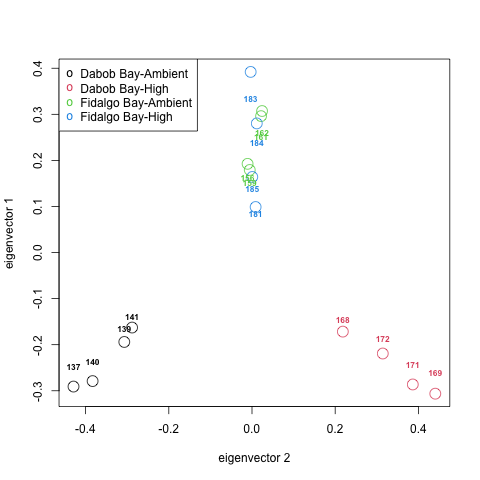

In [32]:
%%R
plot(tab$EV2, tab$EV1, xlab="eigenvector 2", ylab="eigenvector 1",
     col=as.integer(tab$pop_code), cex=2)
text(tab$EV2, tab$EV1*.85, labels=tab$sample.id, cex=0.7, font=2, col=as.integer(tab$pop_code))
legend("topleft", legend=paste(levels(tab$pop_code)), pch="o", col=1:nlevels(tab$pop_code))

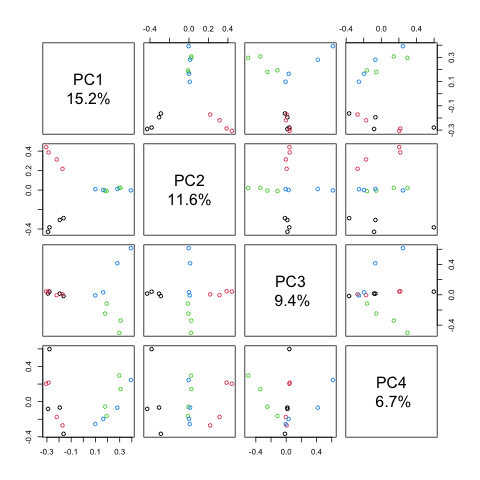

In [33]:
%%R
lbls <- paste("PC", 1:4, "\n", format(pc.percent[1:4], digits=2), "%", sep="")
pairs(pca$eigenvect[,1:4], col=tab$pop_code, labels=lbls)

### Fst Estimation

Compare all 4 groups

In [83]:
%%R

v <- snpgdsFst(genofile, sample.id=tab$sample.id, population=as.factor(tab$pop_code),
    method="W&C84", autosome.only=FALSE)

Fst estimation on genotypes:
Excluding 228 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 16
    # of SNPs: 26,984
Method: Weir & Cockerham, 1984
# of Populations: 4
    Dabob Bay-Ambient (4), Dabob Bay-High (4), Fidalgo Bay-Ambient (4), Fidalgo Bay-High (4)


In [84]:
%%R
paste("Weir and Cockerham weighted Fst estimate: ", round(v$Fst, 5))

[1] "Weir and Cockerham weighted Fst estimate:  0.17365"


In [85]:
%%R
paste("Weir and Cockerham mean Fst estimate: ", round(v$MeanFst, 5))

[1] "Weir and Cockerham mean Fst estimate:  0.17246"


In [86]:
%%R
summary(v$FstSNP)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
 -1.000   0.012   0.143   0.172   0.286   1.000    3609 


In [87]:
%%R
# between DB & FB (not considering parental pCO2)
v <- snpgdsFst(genofile, sample.id=tab$sample.id, population=as.factor(tab$population),
    method="W&C84", autosome.only=FALSE)
paste("Weir and Cockerham mean Fst estimate, DB vs. FB: ", round(v$MeanFst, 5))

Fst estimation on genotypes:
Excluding 228 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 16
    # of SNPs: 26,984
Method: Weir & Cockerham, 1984
# of Populations: 2
    Dabob Bay (8), Fidalgo Bay (8)
[1] "Weir and Cockerham mean Fst estimate, DB vs. FB:  0.11152"


In [88]:
%%R
# within DB (comparing parental pCO2): 
v <- snpgdsFst(genofile, sample.id=subset(tab, population=="Dabob Bay")$sample.id, population=as.factor(subset(tab, population=="Dabob Bay")$pCO2.parent),
    method="W&C84", autosome.only=FALSE)
paste("Weir and Cockerham mean Fst estimate, Dabob Bay Ambient vs. High: ", round(v$MeanFst, 5))

Fst estimation on genotypes:
Excluding 6,815 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 8
    # of SNPs: 20,397
Method: Weir & Cockerham, 1984
# of Populations: 2
    Ambient (4), High (4)
[1] "Weir and Cockerham mean Fst estimate, Dabob Bay Ambient vs. High:  0.13104"


In [89]:
%%R
# within FB (comparing parental pCO2): 
v <- snpgdsFst(genofile, sample.id=subset(tab, population=="Fidalgo Bay")$sample.id, population=as.factor(subset(tab, population=="Dabob Bay")$pCO2.parent),
    method="W&C84", autosome.only=FALSE)
paste("Weir and Cockerham mean Fst estimate, Fidalgo Bay Ambient vs. High: ", round(v$MeanFst, 5))

Fst estimation on genotypes:
Excluding 7,598 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 8
    # of SNPs: 19,614
Method: Weir & Cockerham, 1984
# of Populations: 2
    Ambient (4), High (4)
[1] "Weir and Cockerham mean Fst estimate, Fidalgo Bay Ambient vs. High:  0.06665"


### Identity-By-State Analysis 

In [90]:
%%R
ibs <- snpgdsIBS(genofile, num.thread=2, autosome.only=FALSE)

Identity-By-State (IBS) analysis on genotypes:
Excluding 228 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 16
    # of SNPs: 26,984
    using 2 threads
IBS:    the sum of all selected genotypes (0,1,2) = 492213
Mon Mar  1 21:38:28 2021    (internal increment: 65536)
[==================================================] 100%, completed, 0s  
Mon Mar  1 21:38:28 2021    Done.


In [91]:
%%R
ibs$ibs

           [,1]      [,2]      [,3]      [,4]      [,5]      [,6]      [,7]
 [1,] 1.0000000 0.8050570 0.8012705 0.8099026 0.7044391 0.7074382 0.6942068
 [2,] 0.8050570 1.0000000 0.8044399 0.8187104 0.7183822 0.7232250 0.7041671
 [3,] 0.8012705 0.8044399 1.0000000 0.7682328 0.7033178 0.7083099 0.6898490
 [4,] 0.8099026 0.8187104 0.7682328 1.0000000 0.7288445 0.7249369 0.7121869
 [5,] 0.7044391 0.7183822 0.7033178 0.7288445 1.0000000 0.7750944 0.7711346
 [6,] 0.7074382 0.7232250 0.7083099 0.7249369 0.7750944 1.0000000 0.7838988
 [7,] 0.6942068 0.7041671 0.6898490 0.7121869 0.7711346 0.7838988 1.0000000
 [8,] 0.6977436 0.7101680 0.6943895 0.7143680 0.7863176 0.7724700 0.8421080
 [9,] 0.7170516 0.7408482 0.7201702 0.7498043 0.7159229 0.7164280 0.7008699
[10,] 0.7206906 0.7235883 0.7263827 0.7167679 0.6995317 0.7028195 0.6904574
[11,] 0.7278557 0.7281631 0.7309930 0.7232740 0.7023796 0.7060205 0.6939135
[12,] 0.7290331 0.7344875 0.7261127 0.7370608 0.7105771 0.7102177 0.7052154
[13,] 0.7156

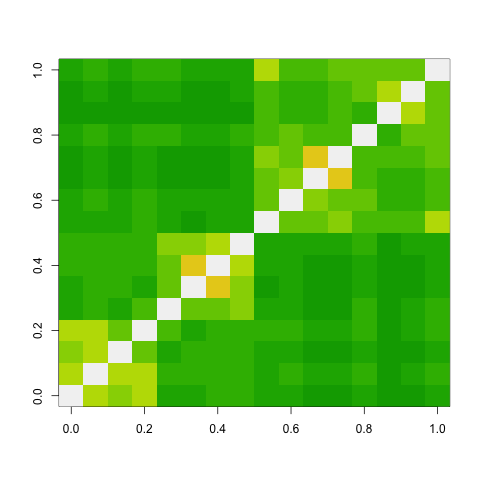

In [92]:
%%R
# heat map code from the SNPRelate tutorial - but don't know which samples are which! 
pop.idx <- order(tab$pop_code)
image(ibs$ibs[pop.idx, pop.idx], col=terrain.colors(16))

In [93]:
%%R
tab$pop_code

 [1] Dabob Bay-Ambient   Dabob Bay-Ambient   Dabob Bay-Ambient  
 [4] Dabob Bay-Ambient   Fidalgo Bay-Ambient Fidalgo Bay-Ambient
 [7] Fidalgo Bay-Ambient Fidalgo Bay-Ambient Dabob Bay-High     
[10] Dabob Bay-High      Dabob Bay-High      Dabob Bay-High     
[13] Fidalgo Bay-High    Fidalgo Bay-High    Fidalgo Bay-High   
[16] Fidalgo Bay-High   
4 Levels: Dabob Bay-Ambient Dabob Bay-High ... Fidalgo Bay-High


In [94]:
%%R
tab$pop_code

 [1] Dabob Bay-Ambient   Dabob Bay-Ambient   Dabob Bay-Ambient  
 [4] Dabob Bay-Ambient   Fidalgo Bay-Ambient Fidalgo Bay-Ambient
 [7] Fidalgo Bay-Ambient Fidalgo Bay-Ambient Dabob Bay-High     
[10] Dabob Bay-High      Dabob Bay-High      Dabob Bay-High     
[13] Fidalgo Bay-High    Fidalgo Bay-High    Fidalgo Bay-High   
[16] Fidalgo Bay-High   
4 Levels: Dabob Bay-Ambient Dabob Bay-High ... Fidalgo Bay-High


In [95]:
%%R
c("black","red","green","blue")[tab$pop_code]

 [1] "black" "black" "black" "black" "green" "green" "green" "green" "red"  
[10] "red"   "red"   "red"   "blue"  "blue"  "blue"  "blue" 


In [98]:
%%R
tab

   sample.id         EV1           EV2    stage  population pCO2.parent
1        137 -0.25432419 -0.4366131020 juvenile   Dabob Bay     Ambient
2        139 -0.17137942 -0.3029972603 juvenile   Dabob Bay     Ambient
3        140 -0.26820055 -0.4077501813 juvenile   Dabob Bay     Ambient
4        141 -0.14809825 -0.2991568561 juvenile   Dabob Bay     Ambient
5        156  0.20318568 -0.0006717042 juvenile Fidalgo Bay     Ambient
6        159  0.17486710 -0.0050939059 juvenile Fidalgo Bay     Ambient
7        161  0.28386664  0.0168100045 juvenile Fidalgo Bay     Ambient
8        162  0.30975252  0.0155466781 juvenile Fidalgo Bay     Ambient
9        168 -0.19501399  0.1892343622 juvenile   Dabob Bay        High
10       169 -0.32964589  0.4432094041 juvenile   Dabob Bay        High
11       171 -0.29651109  0.3714050372 juvenile   Dabob Bay        High
12       172 -0.24305247  0.2920009534 juvenile   Dabob Bay        High
13       181  0.09788011  0.0045197441 juvenile Fidalgo Bay     

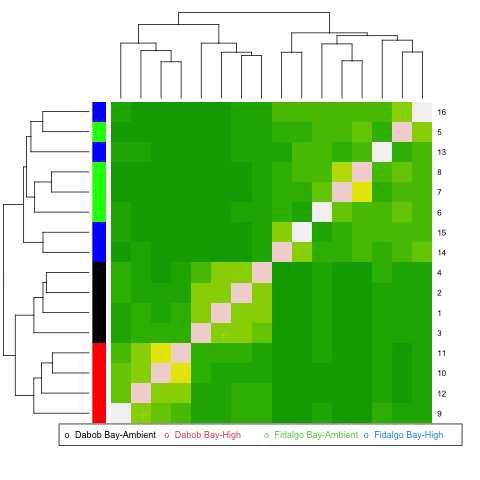

In [99]:
%%R
#so here is my own code showing sample 
par(xpd=TRUE)
heatmap(ibs$ibs, col=terrain.colors(16), labCol=TRUE, RowSideColors=c("black","red","green","blue")[tab$pop_code])
legend(0,-.05, legend=levels(tab$pop_code), pch="o", col=1:nlevels(tab$pop_code), text.col=1:nlevels(tab$pop_code), cex=.75, ncol=4)

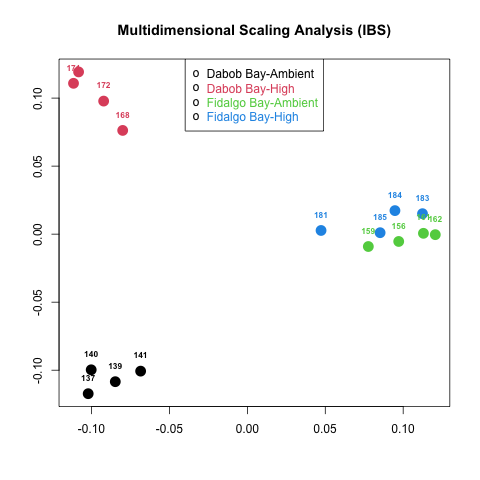

In [100]:
%%R
#To perform multidimensional scaling analysis on the matrix of genome-wide IBS pairwise distances:
loc <- cmdscale(1 - ibs$ibs, k = 2)
x <- loc[, 1]; y <- loc[, 2]
group <- as.factor(tab$pop_code)

plot(x, y, col=group, xlab = "", ylab = "",
    main = "Multidimensional Scaling Analysis (IBS)", cex=2, pch=16)
text(x, y+.012, labels=tab$sample.id, cex=0.7, font=2, col=as.integer(group))
legend("top", legend=levels(group), pch="o", text.col=1:nlevels(group))

Identity-By-State (IBS) analysis on genotypes:
Excluding 228 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 16
    # of SNPs: 26,984
    using 2 threads
IBS:    the sum of all selected genotypes (0,1,2) = 492213
Mon Mar  1 21:40:18 2021    (internal increment: 65536)
[==================================================] 100%, completed, 0s  
Mon Mar  1 21:40:18 2021    Done.
Determine groups by permutation (Z threshold: 15, outlier threshold: 5):
Create 1 groups.


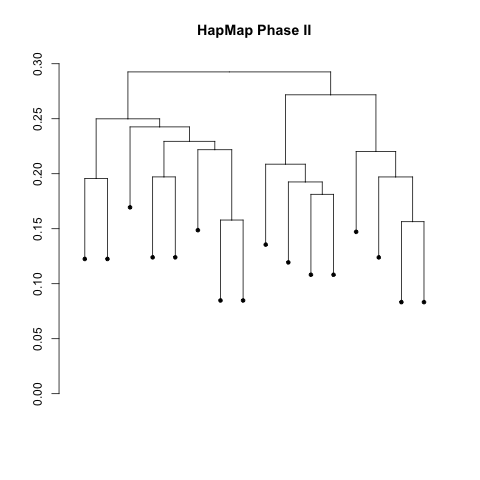

In [101]:
%%R
# To perform cluster analysis on the matrix of genome-wide IBS pairwise distances, 
# and determine the groups by a permutation score. 
# Result= only 1 group (?)
ibs.hc <- snpgdsHCluster(snpgdsIBS(genofile, num.thread=2, autosome.only=FALSE))
rv <- snpgdsCutTree(ibs.hc)
plot(rv$dendrogram, leaflab="none", main="HapMap Phase II")

In [102]:
%%R
# indicates only 1 group 
table(rv$samp.group)


G001 
  16 


Create 4 groups.


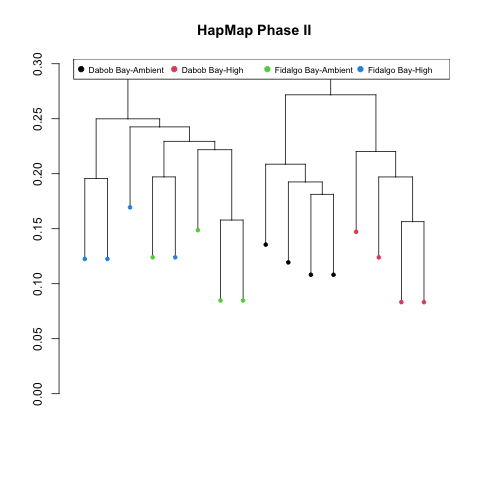

In [103]:
%%R
# Determine groups of individuals by population information
rv2 <- snpgdsCutTree(ibs.hc, samp.group=as.factor(tab$pop_code))
plot(rv2$dendrogram, leaflab="none", main="HapMap Phase II")
legend("topright", legend=levels(group), col=1:nlevels(group), pch=19, ncol=4, cex=0.7, pt.cex=1)

In [178]:
%%R
# this is how you close the GDS file! 
snpgdsClose(genofile)

## Re-try from the HaplotypeCaller step, NOT in GVCF mode! 

In [156]:
cd ../qc-processing/gatk/

/Volumes/Bumblebee/O.lurida_QuantSeq-2020/qc-processing/gatk


In [157]:
%%bash

for file in *dedup-split-RG.bam
do
sample="$(basename -a $file | cut -b 1,2,3)"

# add read group info to headers, specifying sample names 
/Applications/bioinformatics/gatk-4.1.9.0/gatk HaplotypeCaller \
-R ../../references/Olurida_v081.fa \
-I $sample.dedup-split-RG.bam \
-O $sample.variants.nogvcf.g.vcf
done >> "HaplotypeCaller_NOT-GVCF_stout.txt" 2>&1

### Merge .vcf files 

In [240]:
! {gatk} MergeVcfs \
I=../qc-processing/gatk/sample_map_vcfs.list \
O=../qc-processing/gatk/juvenile_genotypes_noGVCF.vcf.gz

Using GATK jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar MergeVcfs I=../qc-processing/gatk/sample_map_vcfs.list O=../qc-processing/gatk/juvenile_genotypes_noGVCF.vcf.gz
INFO	2021-02-26 16:48:18	MergeVcfs	

********** NOTE: Picard's command line syntax is changing.
**********
********** For more information, please see:
********** https://github.com/broadinstitute/picard/wiki/Command-Line-Syntax-Transition-For-Users-(Pre-Transition)
**********
********** The command line looks like this in the new syntax:
**********
**********    MergeVcfs -I ../qc-processing/gatk/sample_map_vcfs.list -O ../qc-processing/gatk/juvenile_genotypes_noGVCF.vcf.gz
**********


16:48:18.176 INFO  NativeLibraryLoader - Loading libgkl_

After some sleuthing, it's clear that gatk doesn't have any tools to merge VCF files from different samples (they merge GVCFs, or multiple .vcfs that contain the same samples). [This comment thread](https://gatk.broadinstitute.org/hc/en-us/community/posts/360071192131-Merge-different-individual-VCF) was very helpful for understanding my options, which are:

1. Use  CombineVariants, a tool in GATK3 which is no longer supported, or
2. bcftools merge, which is not in GATK.  

Since I am not working with GATK3, and sine the bcftools option seems straight-forward and fast, I will try that. 

In [19]:
! bcftools --version

bcftools 1.11
Using htslib 1.11
Copyright (C) 2020 Genome Research Ltd.
License Expat: The MIT/Expat license
This is free software: you are free to change and redistribute it.
There is NO WARRANTY, to the extent permitted by law.


In [31]:
%%bash 
# Compress files for bcftools 

for file in ../qc-processing/gatk/*.variants.nogvcf.g.vcf
do
bgzip --threads 6 $file
done 

In [39]:
%%bash 
# index files for bcftools 

for file in ../qc-processing/gatk/*.variants.nogvcf.g.vcf.gz
do
bcftools index $file
done

In [36]:
%%bash 
# Create file with sample list 

for file in ../qc-processing/gatk/*variants.nogvcf.g.vcf.gz
do
sample="$(basename -a $file | cut -b 1,2,3)"
file="$sample.variants.nogvcf.g.vcf.gz"
echo -e "../qc-processing/gatk/$file" >> ../qc-processing/gatk/sample_map_vcfs.list
done

In [37]:
! cat ../qc-processing/gatk/sample_map_vcfs.list

../qc-processing/gatk/137.variants.nogvcf.g.vcf.gz
../qc-processing/gatk/139.variants.nogvcf.g.vcf.gz
../qc-processing/gatk/140.variants.nogvcf.g.vcf.gz
../qc-processing/gatk/141.variants.nogvcf.g.vcf.gz
../qc-processing/gatk/156.variants.nogvcf.g.vcf.gz
../qc-processing/gatk/159.variants.nogvcf.g.vcf.gz
../qc-processing/gatk/161.variants.nogvcf.g.vcf.gz
../qc-processing/gatk/162.variants.nogvcf.g.vcf.gz
../qc-processing/gatk/168.variants.nogvcf.g.vcf.gz
../qc-processing/gatk/169.variants.nogvcf.g.vcf.gz
../qc-processing/gatk/171.variants.nogvcf.g.vcf.gz
../qc-processing/gatk/172.variants.nogvcf.g.vcf.gz
../qc-processing/gatk/181.variants.nogvcf.g.vcf.gz
../qc-processing/gatk/183.variants.nogvcf.g.vcf.gz
../qc-processing/gatk/184.variants.nogvcf.g.vcf.gz
../qc-processing/gatk/185.variants.nogvcf.g.vcf.gz


In [40]:
! bcftools merge \
--merge all \
--threads 6 \
--file-list ../qc-processing/gatk/sample_map_vcfs.list \
--output ../qc-processing/gatk/merged.variants.nogvcf.g.vcf

### Filter variants

In [147]:
# count number of total variants before filtering 
! grep "^Contig" ../qc-processing/gatk/merged.variants.nogvcf.g.vcf | wc -l 

  298294


In [148]:
! {gatk} VariantFiltration \
-R ../references/Olurida_v081.fa \
-V ../qc-processing/gatk/merged.variants.nogvcf.g.vcf \
-O ../qc-processing/gatk/merged.variants.nogvcf-filtered.g.vcf \
--filter-name "FS" \
--filter "FS > 60.0" \
--filter-name "QD" \
--filter "QD < 2.0" \
--filter-name "QUAL60" \
--filter "QUAL < 60.0" \
--filter-name "SOR3" \
--filter "SOR > 3.0" \
--filter-name "DP10" \
--filter "DP < 10" \
--filter-name "AF6.25" \
--filter "AF < 0.0625"

Using GATK jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar VariantFiltration -R ../references/Olurida_v081.fa -V ../qc-processing/gatk/merged.variants.nogvcf.g.vcf -O ../qc-processing/gatk/merged.variants.nogvcf-filtered.g.vcf --filter-name FS --filter FS > 60.0 --filter-name QD --filter QD < 2.0 --filter-name QUAL60 --filter QUAL < 60.0 --filter-name SOR3 --filter SOR > 3.0 --filter-name DP10 --filter DP < 10 --filter-name AF6.25 --filter AF < 0.0625
22:28:23.978 INFO  NativeLibraryLoader - Loading libgkl_compression.dylib from jar:file:/Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar!/com/intel/gkl/native/libgkl_compression.dylib
Mar 01, 2021 10:28:24 PM shaded.cloud_nio.com.google.aut

22:28:28.780 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([1, 1])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEX

22:28:28.836 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([1, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.J

22:28:28.885 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 1])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.J

22:28:28.938 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([1, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.J

22:28:28.996 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext

22:28:29.040 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext

22:28:29.103 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([1, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.J

	at htsjdk.variant.variantcontext.JEXLMap.evaluateExpression(JEXLMap.java:186) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:95) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:15) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.VariantContextUtils.match(VariantContextUtils.java:338) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.matchesFilter(VariantFiltration.java:453) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.filter(VariantFiltration.java:407) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.apply(VariantFiltration.java:354) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.engine.VariantWalker.lambda$traverse$0(Varia

22:28:29.200 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([1, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.J

22:28:29.258 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([1, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.J

	at java.base/java.util.stream.AbstractPipeline.evaluate(AbstractPipeline.java:234) [?:?]
	at java.base/java.util.stream.ReferencePipeline.forEach(ReferencePipeline.java:497) [?:?]
	at org.broadinstitute.hellbender.engine.VariantWalker.traverse(VariantWalker.java:102) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.engine.GATKTool.doWork(GATKTool.java:1049) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.runTool(CommandLineProgram.java:140) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.instanceMainPostParseArgs(CommandLineProgram.java:192) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.instanceMain(CommandLineProgram.java:211) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.Main.runCommandLineProgram(Main.java:160) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadin

22:28:29.358 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([1, 1])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEX

22:28:29.431 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 1])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.J

22:28:29.486 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext

22:28:29.538 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext

	at htsjdk.variant.variantcontext.JEXLMap.evaluateExpression(JEXLMap.java:186) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:95) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:15) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.VariantContextUtils.match(VariantContextUtils.java:338) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.matchesFilter(VariantFiltration.java:453) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.filter(VariantFiltration.java:407) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.apply(VariantFiltration.java:354) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.engine.VariantWalker.lambda$traverse$0(Varia

	at htsjdk.variant.variantcontext.JEXLMap.evaluateExpression(JEXLMap.java:186) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:95) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:15) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.VariantContextUtils.match(VariantContextUtils.java:338) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.matchesFilter(VariantFiltration.java:453) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.filter(VariantFiltration.java:407) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.apply(VariantFiltration.java:354) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.engine.VariantWalker.lambda$traverse$0(Varia

22:28:29.699 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([1, 1])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEX

22:28:29.750 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext

22:28:29.805 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([1, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.J

22:28:29.860 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([1, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.J

22:28:29.913 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext

	at htsjdk.variant.variantcontext.JEXLMap.evaluateExpression(JEXLMap.java:186) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:95) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:15) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.VariantContextUtils.match(VariantContextUtils.java:338) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.matchesFilter(VariantFiltration.java:453) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.filter(VariantFiltration.java:407) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.apply(VariantFiltration.java:354) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.engine.VariantWalker.lambda$traverse$0(Varia

22:28:30.030 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext

22:28:30.084 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([1, 1])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEX

22:28:30.132 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([1, 1])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEX

22:28:30.207 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext

22:28:30.256 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext

22:28:30.307 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 0.5, 0.5, 0.5, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant

22:28:30.362 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 1, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcont

	at htsjdk.variant.variantcontext.JEXLMap.evaluateExpression(JEXLMap.java:186) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:95) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:15) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.VariantContextUtils.match(VariantContextUtils.java:338) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.matchesFilter(VariantFiltration.java:453) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.filter(VariantFiltration.java:407) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.apply(VariantFiltration.java:354) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.engine.VariantWalker.lambda$traverse$0(Varia

22:28:30.473 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 0.5, 1])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcont

22:28:30.526 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext

22:28:30.574 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([1, 1])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEX

	at htsjdk.variant.variantcontext.JEXLMap.evaluateExpression(JEXLMap.java:186) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:95) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:15) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.VariantContextUtils.match(VariantContextUtils.java:338) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.matchesFilter(VariantFiltration.java:453) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.filter(VariantFiltration.java:407) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.apply(VariantFiltration.java:354) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.engine.VariantWalker.lambda$traverse$0(Varia

	at htsjdk.variant.variantcontext.JEXLMap.evaluateExpression(JEXLMap.java:186) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:95) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:15) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.VariantContextUtils.match(VariantContextUtils.java:338) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.matchesFilter(VariantFiltration.java:453) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.filter(VariantFiltration.java:407) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.apply(VariantFiltration.java:354) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.engine.VariantWalker.lambda$traverse$0(Varia

22:28:30.791 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([1, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.J

	at java.base/java.util.stream.ForEachOps$ForEachOp$OfRef.accept(ForEachOps.java:183) [?:?]
	at java.base/java.util.stream.ReferencePipeline$3$1.accept(ReferencePipeline.java:195) [?:?]
	at java.base/java.util.stream.ReferencePipeline$2$1.accept(ReferencePipeline.java:177) [?:?]
	at java.base/java.util.stream.ReferencePipeline$3$1.accept(ReferencePipeline.java:195) [?:?]
	at java.base/java.util.Iterator.forEachRemaining(Iterator.java:133) [?:?]
	at java.base/java.util.Spliterators$IteratorSpliterator.forEachRemaining(Spliterators.java:1801) [?:?]
	at java.base/java.util.stream.AbstractPipeline.copyInto(AbstractPipeline.java:484) [?:?]
	at java.base/java.util.stream.AbstractPipeline.wrapAndCopyInto(AbstractPipeline.java:474) [?:?]
	at java.base/java.util.stream.ForEachOps$ForEachOp.evaluateSequential(ForEachOps.java:150) [?:?]
	at java.base/java.util.stream.ForEachOps$ForEachOp$OfRef.evaluateSequential(ForEachOps.java:173) [?:?]
	at java.base/java.util.stream.AbstractPipeline.evaluate(A

22:28:30.906 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext

22:28:30.964 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 1])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.J

	at htsjdk.variant.variantcontext.JEXLMap.evaluateExpression(JEXLMap.java:186) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:95) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:15) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.VariantContextUtils.match(VariantContextUtils.java:338) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.matchesFilter(VariantFiltration.java:453) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.filter(VariantFiltration.java:407) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.apply(VariantFiltration.java:354) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.engine.VariantWalker.lambda$traverse$0(Varia

22:28:31.073 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([1, 1])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEX

	at java.base/java.util.stream.AbstractPipeline.evaluate(AbstractPipeline.java:234) [?:?]
	at java.base/java.util.stream.ReferencePipeline.forEach(ReferencePipeline.java:497) [?:?]
	at org.broadinstitute.hellbender.engine.VariantWalker.traverse(VariantWalker.java:102) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.engine.GATKTool.doWork(GATKTool.java:1049) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.runTool(CommandLineProgram.java:140) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.instanceMainPostParseArgs(CommandLineProgram.java:192) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.instanceMain(CommandLineProgram.java:211) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.Main.runCommandLineProgram(Main.java:160) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadin

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



22:28:32.556 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([1, 0.5, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcont

22:28:32.612 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 1])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.J

22:28:32.666 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([1, 0.5, 1])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontex

22:28:32.724 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext

22:28:32.776 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext

22:28:32.834 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([1, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.J

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



ava:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.evaluateExpression(JEXLMap.java:186) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:95) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:15) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.VariantContextUtils.match(VariantContextUtils.java:338) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.matchesFilter(VariantFiltration.java:453) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.filter(VariantFiltration.java:407) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.apply(VariantFiltration.java:354) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellb

22:28:33.478 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext

	at org.broadinstitute.hellbender.Main.mainEntry(Main.java:203) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.Main.main(Main.java:289) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
22:28:33.530 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([1, 1])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.jav

22:28:33.585 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 0.5, 1])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcont

22:28:33.651 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext

22:28:33.705 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([1, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.J

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



22:28:34.145 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([1, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.J

22:28:34.201 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext

	at java.base/java.util.stream.AbstractPipeline.evaluate(AbstractPipeline.java:234) [?:?]
	at java.base/java.util.stream.ReferencePipeline.forEach(ReferencePipeline.java:497) [?:?]
	at org.broadinstitute.hellbender.engine.VariantWalker.traverse(VariantWalker.java:102) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.engine.GATKTool.doWork(GATKTool.java:1049) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.runTool(CommandLineProgram.java:140) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.instanceMainPostParseArgs(CommandLineProgram.java:192) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.instanceMain(CommandLineProgram.java:211) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.Main.runCommandLineProgram(Main.java:160) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadin

	at htsjdk.variant.variantcontext.JEXLMap.evaluateExpression(JEXLMap.java:186) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:95) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:15) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.VariantContextUtils.match(VariantContextUtils.java:338) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.matchesFilter(VariantFiltration.java:453) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.filter(VariantFiltration.java:407) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.apply(VariantFiltration.java:354) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.engine.VariantWalker.lambda$traverse$0(Varia

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



ava.base/java.util.stream.ForEachOps$ForEachOp$OfRef.accept(ForEachOps.java:183) [?:?]
	at java.base/java.util.stream.ReferencePipeline$3$1.accept(ReferencePipeline.java:195) [?:?]
	at java.base/java.util.stream.ReferencePipeline$2$1.accept(ReferencePipeline.java:177) [?:?]
	at java.base/java.util.stream.ReferencePipeline$3$1.accept(ReferencePipeline.java:195) [?:?]
	at java.base/java.util.Iterator.forEachRemaining(Iterator.java:133) [?:?]
	at java.base/java.util.Spliterators$IteratorSpliterator.forEachRemaining(Spliterators.java:1801) [?:?]
	at java.base/java.util.stream.AbstractPipeline.copyInto(AbstractPipeline.java:484) [?:?]
	at java.base/java.util.stream.AbstractPipeline.wrapAndCopyInto(AbstractPipeline.java:474) [?:?]
	at java.base/java.util.stream.ForEachOps$ForEachOp.evaluateSequential(ForEachOps.java:150) [?:?]
	at java.base/java.util.stream.ForEachOps$ForEachOp$OfRef.evaluateSequential(ForEachOps.java:173) [?:?]
	at java.base/java.util.stream.AbstractPipeline.evaluate(Abstra

22:28:35.811 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 1])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.J

	at java.base/java.util.stream.AbstractPipeline.evaluate(AbstractPipeline.java:234) [?:?]
	at java.base/java.util.stream.ReferencePipeline.forEach(ReferencePipeline.java:497) [?:?]
	at org.broadinstitute.hellbender.engine.VariantWalker.traverse(VariantWalker.java:102) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.engine.GATKTool.doWork(GATKTool.java:1049) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.runTool(CommandLineProgram.java:140) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.instanceMainPostParseArgs(CommandLineProgram.java:192) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.instanceMain(CommandLineProgram.java:211) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.Main.runCommandLineProgram(Main.java:160) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadin

22:28:35.925 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext

22:28:35.982 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([1, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.J

22:28:36.038 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([1, 1])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEX

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



22:28:36.600 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 1])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.J

22:28:36.654 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([1, 1])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEX

22:28:36.710 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([1, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.J

22:28:36.766 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext

22:28:36.825 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext

22:28:36.879 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext

	at java.base/java.util.stream.ForEachOps$ForEachOp$OfRef.accept(ForEachOps.java:183) [?:?]
	at java.base/java.util.stream.ReferencePipeline$3$1.accept(ReferencePipeline.java:195) [?:?]
	at java.base/java.util.stream.ReferencePipeline$2$1.accept(ReferencePipeline.java:177) [?:?]
	at java.base/java.util.stream.ReferencePipeline$3$1.accept(ReferencePipeline.java:195) [?:?]
	at java.base/java.util.Iterator.forEachRemaining(Iterator.java:133) [?:?]
	at java.base/java.util.Spliterators$IteratorSpliterator.forEachRemaining(Spliterators.java:1801) [?:?]
	at java.base/java.util.stream.AbstractPipeline.copyInto(AbstractPipeline.java:484) [?:?]
	at java.base/java.util.stream.AbstractPipeline.wrapAndCopyInto(AbstractPipeline.java:474) [?:?]
	at java.base/java.util.stream.ForEachOps$ForEachOp.evaluateSequential(ForEachOps.java:150) [?:?]
	at java.base/java.util.stream.ForEachOps$ForEachOp$OfRef.evaluateSequential(ForEachOps.java:173) [?:?]
	at java.base/java.util.stream.AbstractPipeline.evaluate(A

22:28:36.990 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([1, 1])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEX

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



22:28:37.385 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.5, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext

22:28:37.441 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([1, 1])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEX

22:28:37.497 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([1, 0.5])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.J

	at java.base/java.util.stream.AbstractPipeline.evaluate(AbstractPipeline.java:234) [?:?]
	at java.base/java.util.stream.ReferencePipeline.forEach(ReferencePipeline.java:497) [?:?]
	at org.broadinstitute.hellbender.engine.VariantWalker.traverse(VariantWalker.java:102) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.engine.GATKTool.doWork(GATKTool.java:1049) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.runTool(CommandLineProgram.java:140) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.instanceMainPostParseArgs(CommandLineProgram.java:192) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.instanceMain(CommandLineProgram.java:211) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.Main.runCommandLineProgram(Main.java:160) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadin

22:28:37.609 WARN  JexlEngine - ![0,11]: 'AF < 0.0625;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([1, 1])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEX

	at java.base/java.util.stream.AbstractPipeline.evaluate(AbstractPipeline.java:234) [?:?]
	at java.base/java.util.stream.ReferencePipeline.forEach(ReferencePipeline.java:497) [?:?]
	at org.broadinstitute.hellbender.engine.VariantWalker.traverse(VariantWalker.java:102) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.engine.GATKTool.doWork(GATKTool.java:1049) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.runTool(CommandLineProgram.java:140) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.instanceMainPostParseArgs(CommandLineProgram.java:192) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.instanceMain(CommandLineProgram.java:211) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.Main.runCommandLineProgram(Main.java:160) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadin

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



22:28:38.979 INFO  VariantFiltration - Shutting down engine
[March 1, 2021 at 10:28:38 PM PST] org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration done. Elapsed time: 0.25 minutes.
Runtime.totalMemory()=1931476992


In [149]:
# Now create another filtered .vcf that excludes any variants not meeting the above hard-filter settings 
! {gatk} SelectVariants \
-R ../references/Olurida_v081.fa \
-V ../qc-processing/gatk/merged.variants.nogvcf-filtered.g.vcf \
--exclude-filtered TRUE \
-O ../qc-processing/gatk/merged.variants.nogvcf-filteredtrue.g.vcf

Using GATK jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar SelectVariants -R ../references/Olurida_v081.fa -V ../qc-processing/gatk/merged.variants.nogvcf-filtered.g.vcf --exclude-filtered TRUE -O ../qc-processing/gatk/merged.variants.nogvcf-filteredtrue.g.vcf
22:29:09.500 INFO  NativeLibraryLoader - Loading libgkl_compression.dylib from jar:file:/Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar!/com/intel/gkl/native/libgkl_compression.dylib
Mar 01, 2021 10:29:09 PM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running on Google Compute Engine.
22:29:09.725 INFO  SelectVariants - ------------------------------

In [150]:
# Total # SNPs that pass my filtering 
! grep "PASS" ../qc-processing/gatk/merged.variants.nogvcf-filteredtrue.g.vcf | wc -l 

   84834


In [151]:
# Check out resulting .vcf 
! zgrep "PASS" ../qc-processing/gatk/merged.variants.nogvcf-filteredtrue.g.vcf | \
awk 'BEGIN{OFS="\t"} {split($8, a, ";"); print $1,$2,$4,$5,$6,$7,$8,$9}' | head -n 10

##FILTER=<ID=PASS,Description="All	filters						
Contig0	635	G	A	250.05	PASS	AC=8;AF=1;AN=12;BaseQRankSum=0;DP=50;ExcessHet=3.0103;FS=0;MLEAC=1;MLEAF=0.5;MQ=33.58;MQRankSum=-1.907;QD=17.89;ReadPosRankSum=0.327;SOR=1.445	GT:AD:DP:GQ:PL
Contig0	104181	CTTG	C	977.03	PASS	AC=7;AF=0.5;AN=12;BaseQRankSum=-1.17;DP=158;ExcessHet=3.0103;FS=0;MLEAC=1;MLEAF=0.5;MQ=60;MQRankSum=0;QD=13.25;ReadPosRankSum=1.789;SOR=0.307	GT:AD:DP:GQ:PL
Contig3	16621	A	G	295.02	PASS	AC=8;AF=1;AN=8;DP=15;ExcessHet=3.0103;FS=0;MLEAC=2;MLEAF=1;MQ=50.47;QD=34.28;SOR=2.833	GT:AD:DP:GQ:PL
Contig3	16666	C	A	381.06	PASS	AC=19;AF=0.5;AN=20;BaseQRankSum=0;DP=44;ExcessHet=3.0103;FS=0;MLEAC=1;MLEAF=0.5;MQ=21;MQRankSum=0;QD=19.66;ReadPosRankSum=-0.967;SOR=2.303	GT:AD:DP:GQ:PL
Contig3	16730	G	A	403.06	PASS	AC=17;AF=0.5;AN=18;BaseQRankSum=0.792;DP=46;ExcessHet=3.0103;FS=0;MLEAC=1;MLEAF=0.5;MQ=21;MQRankSum=1.718;QD=19.66;ReadPosRankSum=0.652;SOR=2.303	GT:AD:DP:GQ:PL
Contig3	58593	G	C	236.97	PASS	AC=7;AF=1;AN=8;BaseQRankSum=0;DP=14;E

## Re-do PCA etc. with new .vcf file 

In [152]:
%%R
# 
vcf.fn <- "../qc-processing/gatk/merged.variants.nogvcf-filteredtrue.g.vcf"
vcf.fn

[1] "../qc-processing/gatk/merged.variants.nogvcf-filteredtrue.g.vcf"


In [153]:
%%R
# if you get an error with the next chunk, run this one 
snpgdsClose(genofile)

In [154]:
%%R
# Reformat - note, can't re-run this chucnk
snpgdsVCF2GDS(vcf.fn, "../qc-processing/gatk/juvenile.gds", method="biallelic.only")

# View summary 
snpgdsSummary("../qc-processing/gatk/juvenile.gds")

Start file conversion from VCF to SNP GDS ...
Method: exacting biallelic SNPs
Number of samples: 16
Parsing "../qc-processing/gatk/merged.variants.nogvcf-filteredtrue.g.vcf" ...
	import 67913 variants.
+ genotype   { Bit2 16x67913, 265.3K } *
Optimize the access efficiency ...
Clean up the fragments of GDS file:
    open the file '../qc-processing/gatk/juvenile.gds' (534.2K)
    # of fragments: 52
    save to '../qc-processing/gatk/juvenile.gds.tmp'
    rename '../qc-processing/gatk/juvenile.gds.tmp' (533.9K, reduced: 384B)
    # of fragments: 20
The file name: /Volumes/Bumblebee/O.lurida_QuantSeq-2020/qc-processing/gatk/juvenile.gds 
The total number of samples: 16 
The total number of SNPs: 67913 
SNP genotypes are stored in SNP-major mode (Sample X SNP).


In [155]:
%%R
#open gds and check out genofile contents 
(genofile <- snpgdsOpen("../qc-processing/gatk/juvenile.gds"))

File: /Volumes/Bumblebee/O.lurida_QuantSeq-2020/qc-processing/gatk/juvenile.gds (533.9K)
+    [  ] *
|--+ sample.id   { Str8 16 LZMA_ra(178.1%), 121B }
|--+ snp.id   { Int32 67913 LZMA_ra(6.86%), 18.2K }
|--+ snp.rs.id   { Str8 67913 LZMA_ra(0.23%), 165B }
|--+ snp.position   { Int32 67913 LZMA_ra(36.2%), 96.1K }
|--+ snp.chromosome   { Str8 67913 LZMA_ra(3.30%), 26.2K }
|--+ snp.allele   { Str8 67913 LZMA_ra(12.2%), 32.3K }
|--+ genotype   { Bit2 16x67913, 265.3K } *
\--+ snp.annot   [  ]
   |--+ qual   { Float32 67913 LZMA_ra(35.2%), 93.4K }
   \--+ filter   { Str8 67913 LZMA_ra(0.06%), 209B }


In [156]:
%%R
# Prune SNPs in linkage-disequilibrium 
snpset <- snpgdsLDpruning(genofile, ld.threshold=0.2, autosome.only=FALSE)

SNP pruning based on LD:
Excluding 9,621 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 16
    # of SNPs: 58,292
    using 1 thread
    sliding window: 500,000 basepairs, Inf SNPs
    |LD| threshold: 0.2
    method: composite
Chromosome Contig0: 100.00%, 1/1
Chromosome Contig3: 11.11%, 1/9
Chromosome Contig4: 10.00%, 1/10
Chromosome Contig5: 3.85%, 1/26
Chromosome Contig6: 14.29%, 1/7
Chromosome Contig7: 50.00%, 1/2
Chromosome Contig11: 12.50%, 1/8
Chromosome Contig12: 20.00%, 1/5
Chromosome Contig13: 14.29%, 1/7
Chromosome Contig14: 100.00%, 1/1
Chromosome Contig15: 16.67%, 1/6
Chromosome Contig16: 20.00%, 1/5
Chromosome Contig17: 100.00%, 1/1
Chromosome Contig19: 100.00%, 1/1
Chromosome Contig20: 8.33%, 1/12
Chromosome Contig22: 25.00%, 1/4
Chromosome Contig24: 50.00%, 1/2
Chromosome Contig27: 11.11%, 1/9
Chromosome Contig28: 7.14%, 1/14
Chromosome Contig29: 100.00%, 1/1
Chromosome Contig30: 100.00%, 1/1
Chromosome Contig36: 3.85%, 1/26
Chromosome Contig39: 2

Chromosome Contig490: 6.67%, 1/15
Chromosome Contig496: 6.25%, 1/16
Chromosome Contig498: 100.00%, 1/1
Chromosome Contig502: 50.00%, 1/2
Chromosome Contig505: 25.00%, 1/4
Chromosome Contig514: 16.67%, 1/6
Chromosome Contig515: 50.00%, 1/2
Chromosome Contig519: 16.67%, 1/6
Chromosome Contig522: 50.00%, 1/2
Chromosome Contig524: 100.00%, 1/1
Chromosome Contig528: 50.00%, 1/2
Chromosome Contig530: 20.00%, 1/5
Chromosome Contig534: 16.67%, 1/6
Chromosome Contig535: 50.00%, 1/2
Chromosome Contig538: 25.00%, 1/4
Chromosome Contig541: 10.00%, 1/10
Chromosome Contig544: 25.00%, 1/4
Chromosome Contig545: 5.56%, 1/18
Chromosome Contig546: 12.50%, 1/8
Chromosome Contig547: 33.33%, 1/3
Chromosome Contig549: 11.11%, 1/9
Chromosome Contig550: 14.29%, 1/7
Chromosome Contig555: 12.50%, 1/8
Chromosome Contig557: 50.00%, 1/2
Chromosome Contig560: 16.67%, 1/6
Chromosome Contig561: 25.00%, 1/4
Chromosome Contig563: 50.00%, 1/2
Chromosome Contig565: 100.00%, 1/1
Chromosome Contig567: 5.56%, 1/18
Chromosome

Chromosome Contig1320: 50.00%, 1/2
Chromosome Contig1322: 25.00%, 2/8
Chromosome Contig1327: 5.56%, 1/18
Chromosome Contig1332: 9.09%, 1/11
Chromosome Contig1339: 33.33%, 1/3
Chromosome Contig1346: 33.33%, 1/3
Chromosome Contig1347: 14.29%, 1/7
Chromosome Contig1349: 20.00%, 1/5
Chromosome Contig1351: 33.33%, 1/3
Chromosome Contig1357: 33.33%, 1/3
Chromosome Contig1361: 14.29%, 1/7
Chromosome Contig1367: 25.00%, 1/4
Chromosome Contig1371: 100.00%, 1/1
Chromosome Contig1373: 9.09%, 1/11
Chromosome Contig1378: 50.00%, 1/2
Chromosome Contig1382: 100.00%, 1/1
Chromosome Contig1384: 9.09%, 1/11
Chromosome Contig1385: 7.14%, 1/14
Chromosome Contig1387: 7.69%, 1/13
Chromosome Contig1388: 100.00%, 1/1
Chromosome Contig1391: 33.33%, 1/3
Chromosome Contig1392: 2.86%, 1/35
Chromosome Contig1393: 9.09%, 1/11
Chromosome Contig1394: 33.33%, 1/3
Chromosome Contig1400: 25.00%, 1/4
Chromosome Contig1402: 14.29%, 1/7
Chromosome Contig1404: 50.00%, 1/2
Chromosome Contig1407: 100.00%, 1/1
Chromosome Conti

Chromosome Contig2320: 33.33%, 1/3
Chromosome Contig2327: 100.00%, 1/1
Chromosome Contig2329: 100.00%, 1/1
Chromosome Contig2330: 20.00%, 1/5
Chromosome Contig2333: 11.11%, 1/9
Chromosome Contig2337: 25.00%, 1/4
Chromosome Contig2341: 11.11%, 1/9
Chromosome Contig2348: 20.00%, 1/5
Chromosome Contig2349: 12.50%, 1/8
Chromosome Contig2363: 1.41%, 1/71
Chromosome Contig2365: 5.00%, 1/20
Chromosome Contig2366: 16.67%, 1/6
Chromosome Contig2368: 33.33%, 1/3
Chromosome Contig2379: 50.00%, 1/2
Chromosome Contig2382: 100.00%, 1/1
Chromosome Contig2384: 20.00%, 1/5
Chromosome Contig2386: 50.00%, 1/2
Chromosome Contig2387: 11.11%, 1/9
Chromosome Contig2392: 33.33%, 1/3
Chromosome Contig2399: 25.00%, 1/4
Chromosome Contig2401: 10.00%, 1/10
Chromosome Contig2405: 25.00%, 1/4
Chromosome Contig2416: 7.14%, 1/14
Chromosome Contig2422: 20.00%, 1/5
Chromosome Contig2428: 11.11%, 1/9
Chromosome Contig2431: 100.00%, 1/1
Chromosome Contig2437: 50.00%, 1/2
Chromosome Contig2445: 25.00%, 1/4
Chromosome Cont

Chromosome Contig3747: 16.67%, 1/6
Chromosome Contig3755: 20.00%, 1/5
Chromosome Contig3757: 20.00%, 1/5
Chromosome Contig3768: 100.00%, 1/1
Chromosome Contig3773: 100.00%, 1/1
Chromosome Contig3791: 50.00%, 1/2
Chromosome Contig3800: 100.00%, 1/1
Chromosome Contig3803: 50.00%, 1/2
Chromosome Contig3809: 25.00%, 1/4
Chromosome Contig3814: 20.00%, 1/5
Chromosome Contig3819: 10.00%, 1/10
Chromosome Contig3825: 50.00%, 1/2
Chromosome Contig3831: 50.00%, 1/2
Chromosome Contig3835: 100.00%, 1/1
Chromosome Contig3840: 100.00%, 1/1
Chromosome Contig3841: 25.00%, 1/4
Chromosome Contig3856: 100.00%, 1/1
Chromosome Contig3857: 33.33%, 1/3
Chromosome Contig3858: 25.00%, 1/4
Chromosome Contig3861: 14.29%, 1/7
Chromosome Contig3883: 25.00%, 1/4
Chromosome Contig3885: 20.00%, 1/5
Chromosome Contig3907: 12.50%, 1/8
Chromosome Contig3912: 100.00%, 1/1
Chromosome Contig3913: 100.00%, 1/1
Chromosome Contig3923: 100.00%, 1/1
Chromosome Contig3929: 16.67%, 1/6
Chromosome Contig3946: 33.33%, 1/3
Chromosome

Chromosome Contig5801: 20.00%, 1/5
Chromosome Contig5809: 100.00%, 1/1
Chromosome Contig5828: 20.00%, 1/5
Chromosome Contig5833: 25.00%, 1/4
Chromosome Contig5839: 12.50%, 1/8
Chromosome Contig5845: 33.33%, 1/3
Chromosome Contig5854: 20.00%, 1/5
Chromosome Contig5864: 33.33%, 1/3
Chromosome Contig5874: 25.00%, 1/4
Chromosome Contig5883: 100.00%, 1/1
Chromosome Contig5906: 100.00%, 1/1
Chromosome Contig5916: 14.29%, 1/7
Chromosome Contig5927: 33.33%, 1/3
Chromosome Contig5929: 11.11%, 1/9
Chromosome Contig5935: 50.00%, 1/2
Chromosome Contig5946: 100.00%, 1/1
Chromosome Contig5948: 12.50%, 1/8
Chromosome Contig5955: 25.00%, 1/4
Chromosome Contig5989: 12.50%, 1/8
Chromosome Contig6011: 50.00%, 1/2
Chromosome Contig6017: 25.00%, 1/4
Chromosome Contig6019: 50.00%, 1/2
Chromosome Contig6031: 9.09%, 1/11
Chromosome Contig6048: 100.00%, 1/1
Chromosome Contig6057: 12.50%, 1/8
Chromosome Contig6064: 50.00%, 1/2
Chromosome Contig6067: 33.33%, 1/3
Chromosome Contig6071: 25.00%, 1/4
Chromosome Cont

Chromosome Contig10447: 100.00%, 1/1
Chromosome Contig10495: 20.00%, 1/5
Chromosome Contig10507: 25.00%, 1/4
Chromosome Contig10516: 33.33%, 1/3
Chromosome Contig10557: 25.00%, 1/4
Chromosome Contig10577: 9.09%, 1/11
Chromosome Contig10580: 20.00%, 1/5
Chromosome Contig10607: 100.00%, 1/1
Chromosome Contig10612: 100.00%, 1/1
Chromosome Contig10640: 100.00%, 1/1
Chromosome Contig10654: 100.00%, 1/1
Chromosome Contig10661: 100.00%, 1/1
Chromosome Contig10691: 33.33%, 1/3
Chromosome Contig10703: 50.00%, 1/2
Chromosome Contig10714: 7.14%, 1/14
Chromosome Contig10773: 16.67%, 1/6
Chromosome Contig10777: 16.67%, 1/6
Chromosome Contig10787: 16.67%, 1/6
Chromosome Contig10838: 100.00%, 1/1
Chromosome Contig10888: 12.50%, 1/8
Chromosome Contig10899: 14.29%, 1/7
Chromosome Contig10941: 100.00%, 1/1
Chromosome Contig10975: 100.00%, 1/1
Chromosome Contig10976: 33.33%, 1/3
Chromosome Contig11092: 6.67%, 1/15
Chromosome Contig11178: 25.00%, 1/4
Chromosome Contig11185: 25.00%, 1/4
Chromosome Contig11

Chromosome Contig16834: 9.09%, 1/11
Chromosome Contig16835: 9.09%, 1/11
Chromosome Contig16843: 100.00%, 1/1
Chromosome Contig16867: 50.00%, 1/2
Chromosome Contig16869: 100.00%, 1/1
Chromosome Contig16876: 50.00%, 1/2
Chromosome Contig16877: 2.94%, 1/34
Chromosome Contig16884: 14.29%, 1/7
Chromosome Contig16889: 14.29%, 1/7
Chromosome Contig16891: 5.00%, 1/20
Chromosome Contig16892: 33.33%, 1/3
Chromosome Contig16893: 33.33%, 1/3
Chromosome Contig16901: 5.88%, 1/17
Chromosome Contig16902: 33.33%, 1/3
Chromosome Contig16915: 11.11%, 1/9
Chromosome Contig16916: 9.09%, 1/11
Chromosome Contig16923: 25.00%, 1/4
Chromosome Contig16926: 16.67%, 1/6
Chromosome Contig16933: 100.00%, 1/1
Chromosome Contig16951: 25.00%, 1/4
Chromosome Contig16958: 100.00%, 1/1
Chromosome Contig16963: 16.67%, 1/6
Chromosome Contig16969: 16.67%, 1/6
Chromosome Contig16970: 100.00%, 1/1
Chromosome Contig16972: 12.50%, 1/8
Chromosome Contig16973: 16.67%, 1/6
Chromosome Contig17009: 20.00%, 1/5
Chromosome Contig17012:

Chromosome Contig18485: 50.00%, 1/2
Chromosome Contig18494: 5.88%, 1/17
Chromosome Contig18495: 20.00%, 1/5
Chromosome Contig18505: 16.67%, 1/6
Chromosome Contig18507: 33.33%, 1/3
Chromosome Contig18508: 12.50%, 1/8
Chromosome Contig18511: 50.00%, 1/2
Chromosome Contig18527: 100.00%, 1/1
Chromosome Contig18534: 100.00%, 1/1
Chromosome Contig18545: 4.00%, 1/25
Chromosome Contig18563: 50.00%, 1/2
Chromosome Contig18571: 50.00%, 1/2
Chromosome Contig18581: 16.67%, 1/6
Chromosome Contig18582: 9.09%, 1/11
Chromosome Contig18589: 100.00%, 1/1
Chromosome Contig18591: 6.67%, 1/15
Chromosome Contig18593: 33.33%, 1/3
Chromosome Contig18596: 100.00%, 1/1
Chromosome Contig18599: 20.00%, 1/5
Chromosome Contig18609: 100.00%, 1/1
Chromosome Contig18611: 50.00%, 1/2
Chromosome Contig18615: 10.00%, 1/10
Chromosome Contig18616: 9.09%, 1/11
Chromosome Contig18625: 3.45%, 1/29
Chromosome Contig18637: 16.67%, 1/6
Chromosome Contig18644: 100.00%, 1/1
Chromosome Contig18645: 100.00%, 1/1
Chromosome Contig186

Chromosome Contig20151: 12.50%, 1/8
Chromosome Contig20153: 33.33%, 1/3
Chromosome Contig20154: 16.67%, 2/12
Chromosome Contig20156: 12.50%, 1/8
Chromosome Contig20157: 11.11%, 1/9
Chromosome Contig20159: 100.00%, 1/1
Chromosome Contig20179: 33.33%, 1/3
Chromosome Contig20180: 50.00%, 1/2
Chromosome Contig20198: 8.33%, 1/12
Chromosome Contig20206: 33.33%, 1/3
Chromosome Contig20208: 16.67%, 1/6
Chromosome Contig20210: 7.69%, 1/13
Chromosome Contig20212: 6.67%, 1/15
Chromosome Contig20216: 7.14%, 1/14
Chromosome Contig20220: 50.00%, 1/2
Chromosome Contig20228: 50.00%, 1/2
Chromosome Contig20233: 25.00%, 1/4
Chromosome Contig20242: 20.00%, 1/5
Chromosome Contig20257: 33.33%, 1/3
Chromosome Contig20259: 25.00%, 1/4
Chromosome Contig20274: 10.00%, 1/10
Chromosome Contig20277: 33.33%, 1/3
Chromosome Contig20280: 9.09%, 1/11
Chromosome Contig20285: 33.33%, 1/3
Chromosome Contig20289: 100.00%, 1/1
Chromosome Contig20290: 33.33%, 1/3
Chromosome Contig20292: 25.00%, 1/4
Chromosome Contig20297: 

Chromosome Contig21658: 33.33%, 1/3
Chromosome Contig21664: 25.00%, 1/4
Chromosome Contig21668: 100.00%, 1/1
Chromosome Contig21669: 7.69%, 1/13
Chromosome Contig21678: 50.00%, 1/2
Chromosome Contig21689: 25.00%, 1/4
Chromosome Contig21697: 14.29%, 1/7
Chromosome Contig21703: 6.25%, 1/16
Chromosome Contig21708: 16.67%, 1/6
Chromosome Contig21714: 7.14%, 1/14
Chromosome Contig21718: 50.00%, 1/2
Chromosome Contig21724: 33.33%, 1/3
Chromosome Contig21732: 33.33%, 1/3
Chromosome Contig21733: 33.33%, 1/3
Chromosome Contig21739: 25.00%, 1/4
Chromosome Contig21741: 11.11%, 1/9
Chromosome Contig21743: 50.00%, 1/2
Chromosome Contig21745: 4.00%, 1/25
Chromosome Contig21747: 25.00%, 1/4
Chromosome Contig21762: 20.00%, 1/5
Chromosome Contig21773: 50.00%, 1/2
Chromosome Contig21789: 33.33%, 1/3
Chromosome Contig21790: 12.50%, 1/8
Chromosome Contig21801: 8.33%, 1/12
Chromosome Contig21813: 11.11%, 1/9
Chromosome Contig21816: 6.25%, 1/16
Chromosome Contig21821: 50.00%, 1/2
Chromosome Contig21823: 16.

Chromosome Contig23231: 25.00%, 1/4
Chromosome Contig23234: 25.00%, 1/4
Chromosome Contig23235: 33.33%, 1/3
Chromosome Contig23239: 25.00%, 1/4
Chromosome Contig23241: 8.33%, 1/12
Chromosome Contig23245: 50.00%, 1/2
Chromosome Contig23247: 16.67%, 1/6
Chromosome Contig23253: 50.00%, 1/2
Chromosome Contig23255: 11.11%, 1/9
Chromosome Contig23279: 100.00%, 1/1
Chromosome Contig23297: 33.33%, 1/3
Chromosome Contig23298: 40.00%, 2/5
Chromosome Contig23319: 50.00%, 1/2
Chromosome Contig23329: 50.00%, 1/2
Chromosome Contig23332: 9.09%, 1/11
Chromosome Contig23341: 33.33%, 1/3
Chromosome Contig23342: 14.29%, 2/14
Chromosome Contig23352: 20.00%, 1/5
Chromosome Contig23359: 33.33%, 1/3
Chromosome Contig23360: 20.00%, 1/5
Chromosome Contig23380: 33.33%, 1/3
Chromosome Contig23392: 50.00%, 1/2
Chromosome Contig23408: 100.00%, 1/1
Chromosome Contig23413: 8.33%, 1/12
Chromosome Contig23434: 50.00%, 1/2
Chromosome Contig23456: 20.00%, 1/5
Chromosome Contig23458: 100.00%, 1/1
Chromosome Contig23460: 

Chromosome Contig24962: 100.00%, 1/1
Chromosome Contig24967: 33.33%, 1/3
Chromosome Contig24984: 25.00%, 1/4
Chromosome Contig24995: 14.29%, 1/7
Chromosome Contig24996: 33.33%, 1/3
Chromosome Contig24997: 16.67%, 1/6
Chromosome Contig25001: 7.69%, 1/13
Chromosome Contig25008: 33.33%, 1/3
Chromosome Contig25015: 100.00%, 1/1
Chromosome Contig25021: 14.29%, 1/7
Chromosome Contig25029: 50.00%, 1/2
Chromosome Contig25041: 14.29%, 1/7
Chromosome Contig25049: 50.00%, 1/2
Chromosome Contig25063: 50.00%, 1/2
Chromosome Contig25078: 25.00%, 1/4
Chromosome Contig25079: 25.00%, 1/4
Chromosome Contig25080: 9.09%, 1/11
Chromosome Contig25083: 50.00%, 1/2
Chromosome Contig25088: 4.76%, 1/21
Chromosome Contig25094: 20.00%, 1/5
Chromosome Contig25104: 33.33%, 1/3
Chromosome Contig25108: 50.00%, 1/2
Chromosome Contig25123: 9.09%, 1/11
Chromosome Contig25135: 3.33%, 1/30
Chromosome Contig25137: 50.00%, 1/2
Chromosome Contig25138: 20.00%, 1/5
Chromosome Contig25141: 50.00%, 1/2
Chromosome Contig25142: 10

Chromosome Contig26647: 10.00%, 1/10
Chromosome Contig26653: 100.00%, 1/1
Chromosome Contig26655: 14.29%, 1/7
Chromosome Contig26656: 33.33%, 1/3
Chromosome Contig26661: 100.00%, 1/1
Chromosome Contig26688: 100.00%, 1/1
Chromosome Contig26690: 100.00%, 1/1
Chromosome Contig26692: 25.00%, 1/4
Chromosome Contig26702: 33.33%, 1/3
Chromosome Contig26705: 12.50%, 1/8
Chromosome Contig26718: 25.00%, 1/4
Chromosome Contig26721: 20.00%, 1/5
Chromosome Contig26736: 5.56%, 1/18
Chromosome Contig26737: 50.00%, 1/2
Chromosome Contig26755: 16.67%, 1/6
Chromosome Contig26760: 50.00%, 1/2
Chromosome Contig26762: 10.00%, 1/10
Chromosome Contig26765: 16.67%, 1/6
Chromosome Contig26766: 16.67%, 1/6
Chromosome Contig26767: 100.00%, 1/1
Chromosome Contig26768: 14.29%, 1/7
Chromosome Contig26776: 100.00%, 1/1
Chromosome Contig26787: 100.00%, 1/1
Chromosome Contig26801: 50.00%, 1/2
Chromosome Contig26802: 50.00%, 1/2
Chromosome Contig26804: 16.67%, 1/6
Chromosome Contig26821: 100.00%, 1/1
Chromosome Contig2

Chromosome Contig28158: 25.00%, 1/4
Chromosome Contig28164: 20.00%, 1/5
Chromosome Contig28168: 25.00%, 1/4
Chromosome Contig28185: 11.11%, 1/9
Chromosome Contig28214: 8.33%, 1/12
Chromosome Contig28218: 7.69%, 1/13
Chromosome Contig28227: 5.56%, 1/18
Chromosome Contig28232: 12.50%, 1/8
Chromosome Contig28233: 10.00%, 1/10
Chromosome Contig28241: 50.00%, 1/2
Chromosome Contig28248: 7.69%, 1/13
Chromosome Contig28260: 20.00%, 1/5
Chromosome Contig28265: 14.29%, 1/7
Chromosome Contig28266: 50.00%, 1/2
Chromosome Contig28270: 20.00%, 1/5
Chromosome Contig28288: 33.33%, 1/3
Chromosome Contig28290: 100.00%, 1/1
Chromosome Contig28291: 20.00%, 1/5
Chromosome Contig28294: 25.00%, 1/4
Chromosome Contig28295: 12.50%, 1/8
Chromosome Contig28296: 28.57%, 2/7
Chromosome Contig28297: 50.00%, 1/2
Chromosome Contig28310: 100.00%, 1/1
Chromosome Contig28318: 16.67%, 1/6
Chromosome Contig28319: 33.33%, 1/3
Chromosome Contig28333: 11.11%, 1/9
Chromosome Contig28337: 100.00%, 1/1
Chromosome Contig28355: 

Chromosome Contig29737: 50.00%, 1/2
Chromosome Contig29753: 100.00%, 1/1
Chromosome Contig29764: 50.00%, 2/4
Chromosome Contig29768: 50.00%, 1/2
Chromosome Contig29780: 16.67%, 1/6
Chromosome Contig29795: 6.67%, 1/15
Chromosome Contig29804: 50.00%, 1/2
Chromosome Contig29807: 33.33%, 1/3
Chromosome Contig29812: 50.00%, 1/2
Chromosome Contig29831: 50.00%, 1/2
Chromosome Contig29834: 100.00%, 1/1
Chromosome Contig29842: 20.00%, 1/5
Chromosome Contig29857: 12.50%, 1/8
Chromosome Contig29869: 4.35%, 1/23
Chromosome Contig29878: 13.33%, 2/15
Chromosome Contig29880: 16.67%, 1/6
Chromosome Contig29882: 5.88%, 1/17
Chromosome Contig29883: 12.50%, 1/8
Chromosome Contig29885: 33.33%, 1/3
Chromosome Contig29888: 20.00%, 1/5
Chromosome Contig29892: 100.00%, 1/1
Chromosome Contig29899: 100.00%, 1/1
Chromosome Contig29903: 16.67%, 1/6
Chromosome Contig29906: 20.00%, 1/5
Chromosome Contig29926: 9.09%, 1/11
Chromosome Contig29929: 50.00%, 1/2
Chromosome Contig29931: 9.09%, 1/11
Chromosome Contig29938:

Chromosome Contig31398: 100.00%, 1/1
Chromosome Contig31407: 20.00%, 1/5
Chromosome Contig31414: 100.00%, 1/1
Chromosome Contig31419: 100.00%, 1/1
Chromosome Contig31422: 50.00%, 1/2
Chromosome Contig31423: 5.88%, 1/17
Chromosome Contig31453: 100.00%, 1/1
Chromosome Contig31454: 10.00%, 1/10
Chromosome Contig31455: 50.00%, 1/2
Chromosome Contig31462: 16.67%, 1/6
Chromosome Contig31478: 20.00%, 1/5
Chromosome Contig31485: 20.00%, 1/5
Chromosome Contig31490: 25.00%, 1/4
Chromosome Contig31491: 100.00%, 1/1
Chromosome Contig31515: 16.67%, 1/6
Chromosome Contig31520: 16.67%, 1/6
Chromosome Contig31528: 100.00%, 1/1
Chromosome Contig31531: 33.33%, 1/3
Chromosome Contig31547: 14.29%, 1/7
Chromosome Contig31548: 3.85%, 1/26
Chromosome Contig31552: 50.00%, 1/2
Chromosome Contig31577: 100.00%, 1/1
Chromosome Contig31587: 100.00%, 1/1
Chromosome Contig31590: 50.00%, 1/2
Chromosome Contig31595: 14.29%, 1/7
Chromosome Contig31606: 50.00%, 1/2
Chromosome Contig31614: 100.00%, 1/1
Chromosome Contig3

Chromosome Contig33309: 12.50%, 1/8
Chromosome Contig33343: 100.00%, 1/1
Chromosome Contig33345: 33.33%, 1/3
Chromosome Contig33346: 20.00%, 1/5
Chromosome Contig33362: 16.67%, 1/6
Chromosome Contig33364: 50.00%, 1/2
Chromosome Contig33369: 16.67%, 1/6
Chromosome Contig33377: 50.00%, 1/2
Chromosome Contig33386: 50.00%, 1/2
Chromosome Contig33407: 14.29%, 1/7
Chromosome Contig33409: 33.33%, 1/3
Chromosome Contig33414: 20.00%, 1/5
Chromosome Contig33419: 33.33%, 1/3
Chromosome Contig33420: 100.00%, 1/1
Chromosome Contig33425: 20.00%, 1/5
Chromosome Contig33429: 20.00%, 1/5
Chromosome Contig33432: 50.00%, 1/2
Chromosome Contig33450: 33.33%, 1/3
Chromosome Contig33464: 100.00%, 1/1
Chromosome Contig33465: 14.29%, 1/7
Chromosome Contig33469: 100.00%, 1/1
Chromosome Contig33473: 50.00%, 1/2
Chromosome Contig33504: 20.00%, 1/5
Chromosome Contig33505: 50.00%, 1/2
Chromosome Contig33506: 33.33%, 1/3
Chromosome Contig33513: 100.00%, 1/1
Chromosome Contig33520: 11.11%, 1/9
Chromosome Contig33527:

Chromosome Contig34965: 25.00%, 1/4
Chromosome Contig34967: 25.00%, 1/4
Chromosome Contig34968: 16.67%, 1/6
Chromosome Contig34988: 16.67%, 1/6
Chromosome Contig34993: 50.00%, 1/2
Chromosome Contig35015: 8.33%, 1/12
Chromosome Contig35023: 100.00%, 1/1
Chromosome Contig35026: 11.11%, 1/9
Chromosome Contig35033: 50.00%, 1/2
Chromosome Contig35042: 4.55%, 1/22
Chromosome Contig35057: 14.29%, 1/7
Chromosome Contig35065: 50.00%, 1/2
Chromosome Contig35066: 25.00%, 1/4
Chromosome Contig35075: 40.00%, 2/5
Chromosome Contig35076: 14.29%, 1/7
Chromosome Contig35082: 100.00%, 1/1
Chromosome Contig35086: 100.00%, 1/1
Chromosome Contig35101: 33.33%, 1/3
Chromosome Contig35118: 50.00%, 1/2
Chromosome Contig35139: 16.67%, 1/6
Chromosome Contig35143: 16.67%, 1/6
Chromosome Contig35144: 14.29%, 1/7
Chromosome Contig35152: 25.00%, 1/4
Chromosome Contig35154: 50.00%, 1/2
Chromosome Contig35176: 50.00%, 1/2
Chromosome Contig35191: 33.33%, 1/3
Chromosome Contig35195: 50.00%, 1/2
Chromosome Contig35212: 3

Chromosome Contig36816: 50.00%, 1/2
Chromosome Contig36818: 33.33%, 1/3
Chromosome Contig36819: 25.00%, 1/4
Chromosome Contig36831: 20.00%, 1/5
Chromosome Contig36841: 33.33%, 1/3
Chromosome Contig36850: 14.29%, 1/7
Chromosome Contig36853: 100.00%, 1/1
Chromosome Contig36868: 50.00%, 1/2
Chromosome Contig36871: 100.00%, 1/1
Chromosome Contig36873: 20.00%, 2/10
Chromosome Contig36878: 11.11%, 1/9
Chromosome Contig36885: 11.11%, 1/9
Chromosome Contig36894: 100.00%, 1/1
Chromosome Contig36896: 50.00%, 1/2
Chromosome Contig36904: 5.00%, 1/20
Chromosome Contig36905: 33.33%, 1/3
Chromosome Contig36915: 50.00%, 1/2
Chromosome Contig36919: 14.29%, 1/7
Chromosome Contig36922: 16.67%, 1/6
Chromosome Contig36923: 5.88%, 1/17
Chromosome Contig36942: 3.45%, 1/29
Chromosome Contig36944: 50.00%, 1/2
Chromosome Contig36947: 12.50%, 1/8
Chromosome Contig36958: 12.50%, 1/8
Chromosome Contig36986: 10.00%, 1/10
Chromosome Contig37013: 12.50%, 1/8
Chromosome Contig37018: 33.33%, 1/3
Chromosome Contig37024:

Chromosome Contig38446: 100.00%, 1/1
Chromosome Contig38459: 7.14%, 1/14
Chromosome Contig38465: 25.00%, 1/4
Chromosome Contig38493: 100.00%, 1/1
Chromosome Contig38494: 50.00%, 1/2
Chromosome Contig38510: 12.50%, 1/8
Chromosome Contig38525: 25.00%, 1/4
Chromosome Contig38533: 50.00%, 1/2
Chromosome Contig38544: 33.33%, 1/3
Chromosome Contig38552: 50.00%, 1/2
Chromosome Contig38557: 4.76%, 1/21
Chromosome Contig38567: 100.00%, 1/1
Chromosome Contig38568: 50.00%, 1/2
Chromosome Contig38580: 14.29%, 1/7
Chromosome Contig38589: 16.67%, 1/6
Chromosome Contig38600: 16.67%, 1/6
Chromosome Contig38627: 100.00%, 1/1
Chromosome Contig38637: 25.00%, 1/4
Chromosome Contig38642: 9.09%, 1/11
Chromosome Contig38647: 33.33%, 1/3
Chromosome Contig38662: 100.00%, 1/1
Chromosome Contig38664: 10.00%, 1/10
Chromosome Contig38676: 20.00%, 1/5
Chromosome Contig38677: 50.00%, 1/2
Chromosome Contig38681: 25.00%, 1/4
Chromosome Contig38696: 7.14%, 1/14
Chromosome Contig38700: 50.00%, 1/2
Chromosome Contig38717

Chromosome Contig40448: 50.00%, 1/2
Chromosome Contig40458: 16.67%, 1/6
Chromosome Contig40460: 14.29%, 1/7
Chromosome Contig40463: 50.00%, 1/2
Chromosome Contig40478: 100.00%, 1/1
Chromosome Contig40487: 12.50%, 1/8
Chromosome Contig40488: 50.00%, 1/2
Chromosome Contig40490: 100.00%, 1/1
Chromosome Contig40492: 33.33%, 1/3
Chromosome Contig40503: 16.67%, 1/6
Chromosome Contig40511: 100.00%, 1/1
Chromosome Contig40515: 50.00%, 1/2
Chromosome Contig40516: 25.00%, 1/4
Chromosome Contig40522: 25.00%, 1/4
Chromosome Contig40530: 25.00%, 1/4
Chromosome Contig40543: 50.00%, 1/2
Chromosome Contig40553: 14.29%, 1/7
Chromosome Contig40554: 25.00%, 1/4
Chromosome Contig40556: 100.00%, 1/1
Chromosome Contig40564: 14.29%, 1/7
Chromosome Contig40582: 33.33%, 1/3
Chromosome Contig40587: 100.00%, 1/1
Chromosome Contig40592: 100.00%, 1/1
Chromosome Contig40596: 25.00%, 1/4
Chromosome Contig40605: 25.00%, 1/4
Chromosome Contig40618: 33.33%, 1/3
Chromosome Contig40619: 10.00%, 1/10
Chromosome Contig4062

Chromosome Contig42410: 100.00%, 1/1
Chromosome Contig42415: 50.00%, 1/2
Chromosome Contig42437: 33.33%, 1/3
Chromosome Contig42446: 11.11%, 1/9
Chromosome Contig42448: 33.33%, 1/3
Chromosome Contig42453: 11.11%, 1/9
Chromosome Contig42455: 16.67%, 1/6
Chromosome Contig42461: 25.00%, 1/4
Chromosome Contig42472: 100.00%, 1/1
Chromosome Contig42473: 16.67%, 1/6
Chromosome Contig42477: 33.33%, 1/3
Chromosome Contig42482: 25.00%, 1/4
Chromosome Contig42502: 100.00%, 1/1
Chromosome Contig42532: 50.00%, 1/2
Chromosome Contig42534: 11.11%, 1/9
Chromosome Contig42539: 50.00%, 1/2
Chromosome Contig42541: 25.00%, 1/4
Chromosome Contig42548: 33.33%, 1/3
Chromosome Contig42549: 50.00%, 1/2
Chromosome Contig42554: 33.33%, 1/3
Chromosome Contig42561: 25.00%, 1/4
Chromosome Contig42588: 100.00%, 1/1
Chromosome Contig42591: 20.00%, 1/5
Chromosome Contig42604: 25.00%, 1/4
Chromosome Contig42610: 20.00%, 1/5
Chromosome Contig42622: 12.50%, 1/8
Chromosome Contig42633: 12.50%, 1/8
Chromosome Contig42637: 

Chromosome Contig44285: 20.00%, 1/5
Chromosome Contig44299: 100.00%, 1/1
Chromosome Contig44300: 16.67%, 1/6
Chromosome Contig44301: 33.33%, 1/3
Chromosome Contig44312: 12.50%, 1/8
Chromosome Contig44324: 33.33%, 1/3
Chromosome Contig44326: 50.00%, 1/2
Chromosome Contig44336: 33.33%, 1/3
Chromosome Contig44350: 14.29%, 1/7
Chromosome Contig44355: 14.29%, 1/7
Chromosome Contig44363: 12.50%, 1/8
Chromosome Contig44369: 100.00%, 1/1
Chromosome Contig44388: 9.09%, 1/11
Chromosome Contig44389: 33.33%, 1/3
Chromosome Contig44390: 8.33%, 1/12
Chromosome Contig44400: 16.67%, 1/6
Chromosome Contig44406: 33.33%, 1/3
Chromosome Contig44420: 100.00%, 1/1
Chromosome Contig44422: 25.00%, 1/4
Chromosome Contig44425: 5.88%, 1/17
Chromosome Contig44433: 33.33%, 1/3
Chromosome Contig44434: 11.11%, 1/9
Chromosome Contig44454: 33.33%, 1/3
Chromosome Contig44456: 33.33%, 1/3
Chromosome Contig44457: 50.00%, 1/2
Chromosome Contig44463: 33.33%, 1/3
Chromosome Contig44465: 50.00%, 1/2
Chromosome Contig44495: 2

Chromosome Contig46365: 20.00%, 1/5
Chromosome Contig46368: 33.33%, 1/3
Chromosome Contig46374: 25.00%, 1/4
Chromosome Contig46409: 20.00%, 1/5
Chromosome Contig46423: 100.00%, 1/1
Chromosome Contig46424: 50.00%, 1/2
Chromosome Contig46433: 100.00%, 1/1
Chromosome Contig46438: 100.00%, 1/1
Chromosome Contig46441: 100.00%, 1/1
Chromosome Contig46442: 25.00%, 1/4
Chromosome Contig46449: 20.00%, 1/5
Chromosome Contig46469: 100.00%, 1/1
Chromosome Contig46473: 50.00%, 1/2
Chromosome Contig46483: 33.33%, 1/3
Chromosome Contig46487: 7.14%, 1/14
Chromosome Contig46488: 25.00%, 1/4
Chromosome Contig46491: 100.00%, 1/1
Chromosome Contig46493: 100.00%, 1/1
Chromosome Contig46503: 7.14%, 1/14
Chromosome Contig46506: 16.67%, 1/6
Chromosome Contig46508: 14.29%, 1/7
Chromosome Contig46510: 16.67%, 1/6
Chromosome Contig46519: 100.00%, 1/1
Chromosome Contig46522: 20.00%, 1/5
Chromosome Contig46542: 50.00%, 1/2
Chromosome Contig46546: 33.33%, 1/3
Chromosome Contig46564: 50.00%, 1/2
Chromosome Contig465

Chromosome Contig48423: 9.09%, 1/11
Chromosome Contig48441: 100.00%, 1/1
Chromosome Contig48448: 100.00%, 1/1
Chromosome Contig48456: 100.00%, 1/1
Chromosome Contig48463: 20.00%, 1/5
Chromosome Contig48466: 50.00%, 1/2
Chromosome Contig48489: 8.33%, 1/12
Chromosome Contig48498: 16.67%, 1/6
Chromosome Contig48531: 100.00%, 1/1
Chromosome Contig48539: 11.11%, 1/9
Chromosome Contig48540: 12.50%, 1/8
Chromosome Contig48546: 10.00%, 1/10
Chromosome Contig48560: 20.00%, 1/5
Chromosome Contig48570: 16.67%, 1/6
Chromosome Contig48572: 33.33%, 1/3
Chromosome Contig48578: 100.00%, 1/1
Chromosome Contig48579: 20.00%, 1/5
Chromosome Contig48580: 33.33%, 1/3
Chromosome Contig48594: 14.29%, 1/7
Chromosome Contig48613: 20.00%, 1/5
Chromosome Contig48615: 25.00%, 1/4
Chromosome Contig48630: 12.50%, 1/8
Chromosome Contig48668: 100.00%, 1/1
Chromosome Contig48674: 100.00%, 1/1
Chromosome Contig48683: 33.33%, 1/3
Chromosome Contig48699: 6.25%, 1/16
Chromosome Contig48706: 33.33%, 1/3
Chromosome Contig487

Chromosome Contig50746: 100.00%, 1/1
Chromosome Contig50769: 33.33%, 1/3
Chromosome Contig50783: 16.67%, 1/6
Chromosome Contig50794: 50.00%, 1/2
Chromosome Contig50805: 33.33%, 1/3
Chromosome Contig50807: 20.00%, 1/5
Chromosome Contig50814: 12.50%, 1/8
Chromosome Contig50838: 12.50%, 1/8
Chromosome Contig50856: 16.67%, 1/6
Chromosome Contig50876: 50.00%, 1/2
Chromosome Contig50882: 10.00%, 1/10
Chromosome Contig50883: 14.29%, 1/7
Chromosome Contig50887: 50.00%, 1/2
Chromosome Contig50908: 100.00%, 1/1
Chromosome Contig50931: 50.00%, 1/2
Chromosome Contig50936: 9.09%, 1/11
Chromosome Contig50949: 11.11%, 1/9
Chromosome Contig50962: 25.00%, 1/4
Chromosome Contig50965: 12.50%, 1/8
Chromosome Contig50972: 4.17%, 1/24
Chromosome Contig50977: 50.00%, 1/2
Chromosome Contig50996: 33.33%, 1/3
Chromosome Contig51000: 5.26%, 1/19
Chromosome Contig51001: 10.00%, 1/10
Chromosome Contig51018: 50.00%, 1/2
Chromosome Contig51046: 50.00%, 1/2
Chromosome Contig51059: 100.00%, 1/1
Chromosome Contig51079:

Chromosome Contig53191: 25.00%, 1/4
Chromosome Contig53198: 16.67%, 1/6
Chromosome Contig53217: 50.00%, 1/2
Chromosome Contig53225: 25.00%, 1/4
Chromosome Contig53248: 16.67%, 1/6
Chromosome Contig53249: 25.00%, 1/4
Chromosome Contig53252: 14.29%, 1/7
Chromosome Contig53261: 100.00%, 1/1
Chromosome Contig53266: 33.33%, 1/3
Chromosome Contig53268: 100.00%, 1/1
Chromosome Contig53269: 16.67%, 1/6
Chromosome Contig53270: 100.00%, 1/1
Chromosome Contig53281: 100.00%, 1/1
Chromosome Contig53288: 25.00%, 1/4
Chromosome Contig53290: 4.76%, 1/21
Chromosome Contig53305: 12.50%, 1/8
Chromosome Contig53311: 33.33%, 1/3
Chromosome Contig53320: 33.33%, 1/3
Chromosome Contig53324: 50.00%, 1/2
Chromosome Contig53334: 100.00%, 1/1
Chromosome Contig53355: 25.00%, 1/4
Chromosome Contig53358: 25.00%, 1/4
Chromosome Contig53374: 33.33%, 1/3
Chromosome Contig53386: 50.00%, 1/2
Chromosome Contig53393: 25.00%, 1/4
Chromosome Contig53401: 33.33%, 1/3
Chromosome Contig53409: 50.00%, 1/2
Chromosome Contig53419:

Chromosome Contig55608: 33.33%, 1/3
Chromosome Contig55634: 12.50%, 1/8
Chromosome Contig55660: 100.00%, 1/1
Chromosome Contig55670: 25.00%, 1/4
Chromosome Contig55680: 5.88%, 1/17
Chromosome Contig55685: 50.00%, 1/2
Chromosome Contig55726: 12.50%, 1/8
Chromosome Contig55732: 25.00%, 1/4
Chromosome Contig55754: 50.00%, 1/2
Chromosome Contig55771: 33.33%, 1/3
Chromosome Contig55796: 25.00%, 1/4
Chromosome Contig55801: 100.00%, 1/1
Chromosome Contig55807: 50.00%, 1/2
Chromosome Contig55809: 33.33%, 1/3
Chromosome Contig55820: 25.00%, 1/4
Chromosome Contig55822: 50.00%, 1/2
Chromosome Contig55831: 14.29%, 1/7
Chromosome Contig55845: 20.00%, 1/5
Chromosome Contig55850: 14.29%, 1/7
Chromosome Contig55864: 50.00%, 1/2
Chromosome Contig55869: 20.00%, 1/5
Chromosome Contig55884: 6.25%, 1/16
Chromosome Contig55887: 9.09%, 1/11
Chromosome Contig55928: 6.67%, 1/15
Chromosome Contig55935: 100.00%, 1/1
Chromosome Contig55936: 100.00%, 1/1
Chromosome Contig55946: 100.00%, 1/1
Chromosome Contig55952:

Chromosome Contig58513: 12.50%, 1/8
Chromosome Contig58535: 14.29%, 1/7
Chromosome Contig58551: 100.00%, 1/1
Chromosome Contig58564: 16.67%, 1/6
Chromosome Contig58577: 25.00%, 1/4
Chromosome Contig58580: 100.00%, 1/1
Chromosome Contig58583: 16.67%, 1/6
Chromosome Contig58590: 100.00%, 1/1
Chromosome Contig58605: 12.50%, 1/8
Chromosome Contig58610: 33.33%, 1/3
Chromosome Contig58628: 3.70%, 1/27
Chromosome Contig58637: 100.00%, 1/1
Chromosome Contig58656: 25.00%, 1/4
Chromosome Contig58683: 20.00%, 1/5
Chromosome Contig58685: 9.09%, 1/11
Chromosome Contig58690: 14.29%, 1/7
Chromosome Contig58697: 25.00%, 1/4
Chromosome Contig58730: 11.11%, 1/9
Chromosome Contig58734: 100.00%, 1/1
Chromosome Contig58774: 33.33%, 1/3
Chromosome Contig58789: 25.00%, 1/4
Chromosome Contig58818: 9.09%, 1/11
Chromosome Contig58847: 16.67%, 1/6
Chromosome Contig58868: 100.00%, 1/1
Chromosome Contig58872: 33.33%, 1/3
Chromosome Contig58879: 50.00%, 1/2
Chromosome Contig58891: 25.00%, 1/4
Chromosome Contig58894

Chromosome Contig61485: 33.33%, 1/3
Chromosome Contig61497: 50.00%, 1/2
Chromosome Contig61508: 25.00%, 1/4
Chromosome Contig61516: 25.00%, 1/4
Chromosome Contig61526: 100.00%, 1/1
Chromosome Contig61542: 14.29%, 1/7
Chromosome Contig61548: 8.33%, 1/12
Chromosome Contig61561: 20.00%, 1/5
Chromosome Contig61563: 100.00%, 1/1
Chromosome Contig61568: 100.00%, 1/1
Chromosome Contig61574: 50.00%, 1/2
Chromosome Contig61592: 14.29%, 1/7
Chromosome Contig61608: 12.50%, 1/8
Chromosome Contig61618: 33.33%, 1/3
Chromosome Contig61620: 16.67%, 1/6
Chromosome Contig61621: 11.11%, 1/9
Chromosome Contig61628: 100.00%, 1/1
Chromosome Contig61646: 50.00%, 1/2
Chromosome Contig61655: 100.00%, 1/1
Chromosome Contig61673: 25.00%, 1/4
Chromosome Contig61677: 33.33%, 1/3
Chromosome Contig61681: 14.29%, 1/7
Chromosome Contig61697: 16.67%, 1/6
Chromosome Contig61746: 50.00%, 1/2
Chromosome Contig61755: 100.00%, 1/1
Chromosome Contig61760: 50.00%, 1/2
Chromosome Contig61764: 14.29%, 1/7
Chromosome Contig61792

Chromosome Contig64279: 12.50%, 1/8
Chromosome Contig64301: 100.00%, 1/1
Chromosome Contig64314: 33.33%, 1/3
Chromosome Contig64315: 50.00%, 1/2
Chromosome Contig64327: 100.00%, 1/1
Chromosome Contig64352: 16.67%, 1/6
Chromosome Contig64356: 33.33%, 1/3
Chromosome Contig64375: 50.00%, 1/2
Chromosome Contig64381: 12.50%, 1/8
Chromosome Contig64396: 50.00%, 1/2
Chromosome Contig64397: 50.00%, 1/2
Chromosome Contig64400: 16.67%, 1/6
Chromosome Contig64415: 100.00%, 1/1
Chromosome Contig64427: 33.33%, 1/3
Chromosome Contig64431: 50.00%, 1/2
Chromosome Contig64433: 50.00%, 1/2
Chromosome Contig64437: 11.11%, 1/9
Chromosome Contig64453: 20.00%, 1/5
Chromosome Contig64471: 50.00%, 1/2
Chromosome Contig64477: 20.00%, 1/5
Chromosome Contig64495: 100.00%, 1/1
Chromosome Contig64496: 50.00%, 1/2
Chromosome Contig64516: 14.29%, 1/7
Chromosome Contig64587: 16.67%, 1/6
Chromosome Contig64598: 20.00%, 1/5
Chromosome Contig64602: 100.00%, 1/1
Chromosome Contig64626: 100.00%, 1/1
Chromosome Contig64633

Chromosome Contig68002: 9.09%, 1/11
Chromosome Contig68006: 50.00%, 1/2
Chromosome Contig68012: 50.00%, 1/2
Chromosome Contig68014: 100.00%, 1/1
Chromosome Contig68030: 11.11%, 1/9
Chromosome Contig68037: 100.00%, 1/1
Chromosome Contig68051: 100.00%, 1/1
Chromosome Contig68058: 33.33%, 1/3
Chromosome Contig68073: 33.33%, 1/3
Chromosome Contig68088: 25.00%, 1/4
Chromosome Contig68095: 6.25%, 1/16
Chromosome Contig68097: 25.00%, 1/4
Chromosome Contig68100: 100.00%, 1/1
Chromosome Contig68109: 11.11%, 1/9
Chromosome Contig68118: 33.33%, 1/3
Chromosome Contig68124: 33.33%, 1/3
Chromosome Contig68160: 50.00%, 1/2
Chromosome Contig68164: 100.00%, 1/1
Chromosome Contig68165: 50.00%, 1/2
Chromosome Contig68212: 100.00%, 1/1
Chromosome Contig68218: 25.00%, 1/4
Chromosome Contig68236: 10.00%, 1/10
Chromosome Contig68241: 100.00%, 1/1
Chromosome Contig68245: 50.00%, 1/2
Chromosome Contig68284: 14.29%, 1/7
Chromosome Contig68295: 33.33%, 1/3
Chromosome Contig68309: 100.00%, 1/1
Chromosome Contig68

Chromosome Contig71189: 50.00%, 1/2
Chromosome Contig71190: 16.67%, 1/6
Chromosome Contig71200: 25.00%, 1/4
Chromosome Contig71230: 100.00%, 1/1
Chromosome Contig71244: 33.33%, 1/3
Chromosome Contig71265: 33.33%, 1/3
Chromosome Contig71279: 100.00%, 1/1
Chromosome Contig71292: 50.00%, 1/2
Chromosome Contig71305: 16.67%, 1/6
Chromosome Contig71314: 9.09%, 1/11
Chromosome Contig71316: 25.00%, 1/4
Chromosome Contig71325: 40.00%, 2/5
Chromosome Contig71366: 7.14%, 1/14
Chromosome Contig71369: 9.09%, 1/11
Chromosome Contig71372: 33.33%, 1/3
Chromosome Contig71385: 9.09%, 1/11
Chromosome Contig71408: 20.00%, 1/5
Chromosome Contig71412: 10.00%, 1/10
Chromosome Contig71416: 100.00%, 1/1
Chromosome Contig71423: 50.00%, 1/2
Chromosome Contig71471: 100.00%, 1/1
Chromosome Contig71505: 33.33%, 1/3
Chromosome Contig71515: 50.00%, 1/2
Chromosome Contig71541: 100.00%, 1/1
Chromosome Contig71551: 9.09%, 1/11
Chromosome Contig71597: 100.00%, 1/1
Chromosome Contig71600: 8.33%, 1/12
Chromosome Contig7160

Chromosome Contig75753: 12.50%, 1/8
Chromosome Contig75758: 33.33%, 1/3
Chromosome Contig75783: 50.00%, 1/2
Chromosome Contig75786: 14.29%, 1/7
Chromosome Contig75813: 100.00%, 1/1
Chromosome Contig75816: 12.50%, 1/8
Chromosome Contig75831: 25.00%, 1/4
Chromosome Contig75836: 50.00%, 1/2
Chromosome Contig75842: 100.00%, 1/1
Chromosome Contig75852: 33.33%, 1/3
Chromosome Contig75897: 100.00%, 1/1
Chromosome Contig75902: 100.00%, 1/1
Chromosome Contig75929: 100.00%, 1/1
Chromosome Contig75941: 50.00%, 1/2
Chromosome Contig75963: 11.11%, 1/9
Chromosome Contig75974: 100.00%, 1/1
Chromosome Contig75979: 100.00%, 1/1
Chromosome Contig75998: 33.33%, 1/3
Chromosome Contig76024: 33.33%, 1/3
Chromosome Contig76034: 20.00%, 1/5
Chromosome Contig76038: 100.00%, 1/1
Chromosome Contig76058: 50.00%, 1/2
Chromosome Contig76096: 18.18%, 2/11
Chromosome Contig76144: 25.00%, 1/4
Chromosome Contig76190: 50.00%, 1/2
Chromosome Contig76216: 25.00%, 1/4
Chromosome Contig76228: 100.00%, 1/1
Chromosome Contig7

Chromosome Contig80080: 50.00%, 1/2
Chromosome Contig80083: 50.00%, 1/2
Chromosome Contig80102: 20.00%, 1/5
Chromosome Contig80146: 10.00%, 1/10
Chromosome Contig80157: 33.33%, 1/3
Chromosome Contig80171: 50.00%, 1/2
Chromosome Contig80194: 100.00%, 1/1
Chromosome Contig80197: 100.00%, 1/1
Chromosome Contig80204: 20.00%, 1/5
Chromosome Contig80224: 12.50%, 1/8
Chromosome Contig80227: 100.00%, 1/1
Chromosome Contig80252: 50.00%, 1/2
Chromosome Contig80301: 50.00%, 1/2
Chromosome Contig80313: 33.33%, 1/3
Chromosome Contig80332: 11.11%, 1/9
Chromosome Contig80336: 33.33%, 1/3
Chromosome Contig80340: 50.00%, 1/2
Chromosome Contig80374: 14.29%, 1/7
Chromosome Contig80381: 50.00%, 1/2
Chromosome Contig80384: 10.00%, 1/10
Chromosome Contig80402: 33.33%, 1/3
Chromosome Contig80403: 11.11%, 1/9
Chromosome Contig80408: 100.00%, 1/1
Chromosome Contig80422: 100.00%, 1/1
Chromosome Contig80429: 8.33%, 1/12
Chromosome Contig80432: 20.00%, 1/5
Chromosome Contig80437: 12.50%, 1/8
Chromosome Contig8045

Chromosome Contig84399: 33.33%, 1/3
Chromosome Contig84429: 20.00%, 1/5
Chromosome Contig84448: 50.00%, 1/2
Chromosome Contig84450: 50.00%, 1/2
Chromosome Contig84462: 100.00%, 1/1
Chromosome Contig84494: 5.88%, 1/17
Chromosome Contig84562: 20.00%, 1/5
Chromosome Contig84577: 100.00%, 1/1
Chromosome Contig84591: 100.00%, 1/1
Chromosome Contig84609: 33.33%, 1/3
Chromosome Contig84637: 7.69%, 1/13
Chromosome Contig84661: 9.09%, 1/11
Chromosome Contig84663: 50.00%, 1/2
Chromosome Contig84684: 3.85%, 1/26
Chromosome Contig84691: 3.12%, 1/32
Chromosome Contig84736: 5.26%, 1/19
Chromosome Contig84751: 33.33%, 1/3
Chromosome Contig84765: 11.11%, 1/9
Chromosome Contig84783: 25.00%, 1/4
Chromosome Contig84788: 100.00%, 1/1
Chromosome Contig84790: 50.00%, 1/2
Chromosome Contig84791: 25.00%, 1/4
Chromosome Contig84804: 100.00%, 1/1
Chromosome Contig84819: 100.00%, 1/1
Chromosome Contig84820: 20.00%, 1/5
Chromosome Contig84821: 100.00%, 1/1
Chromosome Contig84858: 9.09%, 1/11
Chromosome Contig8486

Chromosome Contig89802: 9.09%, 1/11
Chromosome Contig89813: 25.00%, 1/4
Chromosome Contig89845: 25.00%, 1/4
Chromosome Contig89862: 50.00%, 1/2
Chromosome Contig89895: 16.67%, 1/6
Chromosome Contig90085: 100.00%, 1/1
Chromosome Contig90121: 50.00%, 1/2
Chromosome Contig90188: 100.00%, 1/1
Chromosome Contig90225: 33.33%, 1/3
Chromosome Contig90232: 33.33%, 1/3
Chromosome Contig90265: 100.00%, 1/1
Chromosome Contig90291: 33.33%, 1/3
Chromosome Contig90312: 5.88%, 1/17
Chromosome Contig90315: 33.33%, 1/3
Chromosome Contig90327: 16.67%, 1/6
Chromosome Contig90329: 25.00%, 1/4
Chromosome Contig90340: 33.33%, 1/3
Chromosome Contig90357: 9.09%, 1/11
Chromosome Contig90368: 33.33%, 2/6
Chromosome Contig90390: 25.00%, 1/4
Chromosome Contig90393: 100.00%, 1/1
Chromosome Contig90427: 33.33%, 1/3
Chromosome Contig90450: 33.33%, 1/3
Chromosome Contig90464: 33.33%, 1/3
Chromosome Contig90483: 12.50%, 1/8
Chromosome Contig90497: 66.67%, 2/3
Chromosome Contig90568: 33.33%, 1/3
Chromosome Contig90635: 

Chromosome Contig96599: 100.00%, 1/1
Chromosome Contig96661: 25.00%, 1/4
Chromosome Contig96733: 100.00%, 1/1
Chromosome Contig96735: 12.50%, 1/8
Chromosome Contig96736: 33.33%, 1/3
Chromosome Contig96757: 14.29%, 1/7
Chromosome Contig96788: 9.09%, 1/11
Chromosome Contig96802: 14.29%, 1/7
Chromosome Contig96820: 100.00%, 1/1
Chromosome Contig96821: 33.33%, 1/3
Chromosome Contig96826: 16.67%, 1/6
Chromosome Contig96828: 16.67%, 1/6
Chromosome Contig96871: 50.00%, 1/2
Chromosome Contig96887: 25.00%, 1/4
Chromosome Contig96893: 100.00%, 1/1
Chromosome Contig96898: 33.33%, 1/3
Chromosome Contig96904: 14.29%, 1/7
Chromosome Contig96933: 100.00%, 1/1
Chromosome Contig97015: 100.00%, 1/1
Chromosome Contig97020: 16.67%, 1/6
Chromosome Contig97021: 50.00%, 1/2
Chromosome Contig97129: 20.00%, 1/5
Chromosome Contig97178: 9.09%, 1/11
Chromosome Contig97201: 33.33%, 1/3
Chromosome Contig97263: 6.67%, 1/15
Chromosome Contig97296: 25.00%, 1/4
Chromosome Contig97401: 25.00%, 1/4
Chromosome Contig97441

Chromosome Contig103088: 16.67%, 1/6
Chromosome Contig103092: 20.00%, 1/5
Chromosome Contig103117: 33.33%, 1/3
Chromosome Contig103134: 8.33%, 1/12
Chromosome Contig103136: 12.50%, 1/8
Chromosome Contig103154: 25.00%, 1/4
Chromosome Contig103176: 9.09%, 1/11
Chromosome Contig103186: 100.00%, 1/1
Chromosome Contig103259: 50.00%, 1/2
Chromosome Contig103338: 100.00%, 1/1
Chromosome Contig103352: 16.67%, 1/6
Chromosome Contig103364: 100.00%, 1/1
Chromosome Contig103455: 10.00%, 1/10
Chromosome Contig103464: 100.00%, 1/1
Chromosome Contig103503: 10.00%, 1/10
Chromosome Contig103504: 16.67%, 1/6
Chromosome Contig103511: 25.00%, 1/4
Chromosome Contig103524: 5.56%, 1/18
Chromosome Contig103565: 11.11%, 1/9
Chromosome Contig103601: 50.00%, 1/2
Chromosome Contig103641: 25.00%, 1/4
Chromosome Contig103690: 20.00%, 1/5
Chromosome Contig103750: 6.67%, 1/15
Chromosome Contig103794: 14.29%, 1/7
Chromosome Contig103834: 20.00%, 1/5
Chromosome Contig103845: 16.67%, 1/6
Chromosome Contig103849: 33.33%,

Chromosome Contig109397: 16.67%, 1/6
Chromosome Contig109414: 50.00%, 1/2
Chromosome Contig109421: 100.00%, 1/1
Chromosome Contig109444: 33.33%, 1/3
Chromosome Contig109446: 12.50%, 1/8
Chromosome Contig109498: 9.09%, 1/11
Chromosome Contig109515: 100.00%, 1/1
Chromosome Contig109589: 12.50%, 1/8
Chromosome Contig109592: 16.67%, 1/6
Chromosome Contig109659: 20.00%, 1/5
Chromosome Contig109775: 50.00%, 1/2
Chromosome Contig109812: 50.00%, 1/2
Chromosome Contig109858: 100.00%, 1/1
Chromosome Contig109914: 100.00%, 1/1
Chromosome Contig110010: 50.00%, 1/2
Chromosome Contig110029: 12.50%, 1/8
Chromosome Contig110043: 50.00%, 1/2
Chromosome Contig110077: 25.00%, 1/4
Chromosome Contig110098: 5.56%, 1/18
Chromosome Contig110100: 50.00%, 1/2
Chromosome Contig110104: 14.29%, 1/7
Chromosome Contig110170: 20.00%, 1/5
Chromosome Contig110178: 50.00%, 1/2
Chromosome Contig110224: 100.00%, 2/2
Chromosome Contig110236: 33.33%, 1/3
Chromosome Contig110242: 50.00%, 1/2
Chromosome Contig110284: 25.00%, 

Chromosome Contig119487: 100.00%, 1/1
Chromosome Contig119582: 100.00%, 1/1
Chromosome Contig119596: 100.00%, 1/1
Chromosome Contig119694: 20.00%, 1/5
Chromosome Contig119696: 100.00%, 1/1
Chromosome Contig119702: 33.33%, 1/3
Chromosome Contig119727: 9.09%, 1/11
Chromosome Contig119912: 100.00%, 1/1
Chromosome Contig119925: 16.67%, 1/6
Chromosome Contig119952: 25.00%, 1/4
Chromosome Contig119995: 33.33%, 1/3
Chromosome Contig120024: 50.00%, 1/2
Chromosome Contig120032: 50.00%, 1/2
Chromosome Contig120103: 20.00%, 1/5
Chromosome Contig120165: 25.00%, 1/4
Chromosome Contig120201: 7.69%, 1/13
Chromosome Contig120284: 11.11%, 1/9
Chromosome Contig120320: 100.00%, 1/1
Chromosome Contig120367: 9.09%, 1/11
Chromosome Contig120451: 20.00%, 1/5
Chromosome Contig120464: 7.14%, 1/14
Chromosome Contig120500: 100.00%, 1/1
Chromosome Contig120543: 100.00%, 1/1
Chromosome Contig120563: 16.67%, 1/6
Chromosome Contig120594: 50.00%, 1/2
Chromosome Contig120711: 100.00%, 1/1
Chromosome Contig120796: 50.0

Chromosome Contig131795: 16.67%, 1/6
Chromosome Contig131796: 12.50%, 1/8
Chromosome Contig131913: 33.33%, 1/3
Chromosome Contig131931: 100.00%, 1/1
Chromosome Contig132009: 16.67%, 1/6
Chromosome Contig132024: 100.00%, 1/1
Chromosome Contig132031: 20.00%, 1/5
Chromosome Contig132115: 5.88%, 1/17
Chromosome Contig132143: 16.67%, 1/6
Chromosome Contig132172: 50.00%, 1/2
Chromosome Contig132260: 50.00%, 1/2
Chromosome Contig132305: 20.00%, 1/5
Chromosome Contig132397: 25.00%, 1/4
Chromosome Contig132450: 20.00%, 1/5
Chromosome Contig132489: 33.33%, 1/3
Chromosome Contig132495: 33.33%, 1/3
Chromosome Contig132598: 9.09%, 1/11
Chromosome Contig132648: 100.00%, 1/1
Chromosome Contig132755: 25.00%, 1/4
Chromosome Contig132767: 50.00%, 1/2
Chromosome Contig132813: 50.00%, 1/2
Chromosome Contig132851: 33.33%, 1/3
Chromosome Contig132864: 50.00%, 1/2
Chromosome Contig132904: 33.33%, 1/3
Chromosome Contig132922: 20.00%, 2/10
Chromosome Contig132980: 100.00%, 1/1
Chromosome Contig133025: 50.00%, 

Chromosome Contig142277: 16.67%, 1/6
Chromosome Contig142302: 9.09%, 1/11
Chromosome Contig142374: 50.00%, 1/2
Chromosome Contig142419: 100.00%, 1/1
Chromosome Contig142426: 12.50%, 1/8
Chromosome Contig142477: 100.00%, 1/1
Chromosome Contig142499: 16.67%, 1/6
Chromosome Contig142502: 100.00%, 1/1
Chromosome Contig142644: 9.09%, 1/11
Chromosome Contig142692: 50.00%, 1/2
Chromosome Contig142702: 33.33%, 1/3
Chromosome Contig142741: 50.00%, 1/2
Chromosome Contig142794: 25.00%, 1/4
Chromosome Contig142807: 14.29%, 1/7
Chromosome Contig142877: 100.00%, 1/1
Chromosome Contig142883: 20.00%, 1/5
Chromosome Contig142931: 100.00%, 1/1
Chromosome Contig142932: 25.00%, 1/4
Chromosome Contig142986: 50.00%, 1/2
Chromosome Contig143069: 50.00%, 1/2
Chromosome Contig143087: 5.88%, 1/17
Chromosome Contig143183: 100.00%, 1/1
Chromosome Contig143209: 25.00%, 1/4
Chromosome Contig143240: 100.00%, 1/1
Chromosome Contig143280: 33.33%, 1/3
Chromosome Contig143302: 14.29%, 1/7
Chromosome Contig143310: 50.00%

Chromosome Contig158336: 100.00%, 1/1
Chromosome Contig158408: 33.33%, 1/3
Chromosome Contig158554: 25.00%, 1/4
Chromosome Contig158671: 33.33%, 1/3
Chromosome Contig158953: 50.00%, 1/2
Chromosome Contig158977: 25.00%, 1/4
Chromosome Contig159014: 25.00%, 1/4
Chromosome Contig159758: 25.00%, 1/4
Chromosome Contig159802: 14.29%, 1/7
Chromosome Contig159944: 25.00%, 1/4
Chromosome Contig159983: 33.33%, 1/3
Chromosome Contig160335: 100.00%, 1/1
Chromosome Contig160422: 50.00%, 1/2
Chromosome Contig160512: 100.00%, 1/1
Chromosome Contig160574: 33.33%, 1/3
Chromosome Contig160944: 20.00%, 1/5
Chromosome Contig161471: 7.14%, 1/14
Chromosome Contig161690: 16.67%, 1/6
Chromosome Contig161691: 12.50%, 1/8
Chromosome Contig161749: 25.00%, 1/4
Chromosome Contig161797: 25.00%, 1/4
Chromosome Contig161798: 33.33%, 1/3
Chromosome Contig161804: 14.29%, 1/7
Chromosome Contig161870: 12.50%, 1/8
Chromosome Contig161905: 100.00%, 1/1
Chromosome Contig161943: 33.33%, 1/3
Chromosome Contig161994: 100.00%, 

Chromosome Contig185222: 12.50%, 1/8
Chromosome Contig186059: 33.33%, 1/3
Chromosome Contig186386: 50.00%, 1/2
Chromosome Contig186601: 20.00%, 1/5
Chromosome Contig186652: 33.33%, 1/3
Chromosome Contig186918: 20.00%, 1/5
Chromosome Contig187067: 100.00%, 1/1
Chromosome Contig187093: 33.33%, 1/3
Chromosome Contig187118: 7.69%, 1/13
Chromosome Contig187279: 7.69%, 1/13
Chromosome Contig187411: 22.22%, 2/9
Chromosome Contig187524: 50.00%, 1/2
Chromosome Contig188124: 33.33%, 1/3
Chromosome Contig188196: 14.29%, 1/7
Chromosome Contig188220: 33.33%, 1/3
Chromosome Contig188364: 100.00%, 1/1
Chromosome Contig188455: 25.00%, 1/4
Chromosome Contig188737: 50.00%, 1/2
Chromosome Contig188998: 20.00%, 1/5
Chromosome Contig189032: 14.29%, 1/7
Chromosome Contig189041: 25.00%, 1/4
Chromosome Contig189171: 100.00%, 1/1
Chromosome Contig189339: 33.33%, 1/3
Chromosome Contig189595: 50.00%, 1/2
Chromosome Contig189691: 10.00%, 1/10
Chromosome Contig189765: 50.00%, 1/2
Chromosome Contig189814: 33.33%, 1

Chromosome Contig216820: 100.00%, 1/1
Chromosome Contig216977: 100.00%, 1/1
Chromosome Contig217114: 33.33%, 1/3
Chromosome Contig217141: 25.00%, 1/4
Chromosome Contig217419: 100.00%, 1/1
Chromosome Contig217421: 50.00%, 1/2
Chromosome Contig217806: 12.50%, 1/8
Chromosome Contig217877: 12.50%, 1/8
Chromosome Contig217941: 6.67%, 1/15
Chromosome Contig218472: 20.00%, 1/5
Chromosome Contig219073: 100.00%, 1/1
Chromosome Contig219100: 50.00%, 1/2
Chromosome Contig219304: 50.00%, 1/2
Chromosome Contig219323: 12.50%, 1/8
Chromosome Contig219542: 33.33%, 1/3
Chromosome Contig219579: 25.00%, 1/4
Chromosome Contig220161: 100.00%, 1/1
Chromosome Contig222098: 12.50%, 1/8
Chromosome Contig222387: 20.00%, 1/5
Chromosome Contig222621: 50.00%, 1/2
Chromosome Contig223599: 100.00%, 1/1
Chromosome Contig230962: 33.33%, 1/3
Chromosome Contig231768: 100.00%, 1/1
Chromosome Contig234357: 100.00%, 1/1
Chromosome Contig235132: 100.00%, 1/1
Chromosome Contig235296: 100.00%, 1/1
Chromosome Contig239034: 25.

Chromosome Contig151: 100.00%, 1/1
Chromosome Contig267: 33.33%, 1/3
Chromosome Contig375: 25.00%, 1/4
Chromosome Contig430: 50.00%, 1/2
Chromosome Contig516: 50.00%, 1/2
Chromosome Contig601: 100.00%, 1/1
Chromosome Contig602: 14.29%, 1/7
Chromosome Contig674: 25.00%, 1/4
Chromosome Contig736: 50.00%, 1/2
Chromosome Contig738: 8.33%, 1/12
Chromosome Contig743: 33.33%, 1/3
Chromosome Contig754: 20.00%, 1/5
Chromosome Contig826: 100.00%, 1/1
Chromosome Contig850: 50.00%, 1/2
Chromosome Contig901: 100.00%, 1/1
Chromosome Contig973: 100.00%, 1/1
Chromosome Contig980: 50.00%, 1/2
Chromosome Contig1046: 100.00%, 1/1
Chromosome Contig1093: 100.00%, 1/1
Chromosome Contig1136: 5.88%, 1/17
Chromosome Contig1151: 25.00%, 1/4
Chromosome Contig1215: 100.00%, 1/1
Chromosome Contig1227: 20.00%, 1/5
Chromosome Contig1245: 100.00%, 1/1
Chromosome Contig1252: 50.00%, 1/2
Chromosome Contig1260: 25.00%, 1/4
Chromosome Contig1624: 100.00%, 1/1
Chromosome Contig1631: 50.00%, 1/2
Chromosome Contig1711: 50.0

Chromosome Contig30723: 50.00%, 1/2
Chromosome Contig30916: 50.00%, 1/2
Chromosome Contig31020: 16.67%, 1/6
Chromosome Contig31326: 50.00%, 1/2
Chromosome Contig31506: 50.00%, 1/2
Chromosome Contig31588: 100.00%, 1/1
Chromosome Contig31837: 50.00%, 1/2
Chromosome Contig31987: 33.33%, 1/3
Chromosome Contig32006: 6.67%, 1/15
Chromosome Contig32225: 14.29%, 1/7
Chromosome Contig32386: 33.33%, 1/3
Chromosome Contig32426: 50.00%, 1/2
Chromosome Contig32435: 6.67%, 1/15
Chromosome Contig32520: 25.00%, 1/4
Chromosome Contig32606: 10.00%, 1/10
Chromosome Contig32622: 33.33%, 1/3
Chromosome Contig32824: 25.00%, 1/4
Chromosome Contig33126: 16.67%, 1/6
Chromosome Contig33318: 25.00%, 1/4
Chromosome Contig33413: 16.67%, 1/6
Chromosome Contig33815: 50.00%, 1/2
Chromosome Contig33901: 100.00%, 1/1
Chromosome Contig34003: 100.00%, 1/1
Chromosome Contig34218: 50.00%, 1/2
Chromosome Contig34324: 100.00%, 1/1
Chromosome Contig34510: 25.00%, 1/4
Chromosome Contig34514: 16.67%, 1/6
Chromosome Contig34659:

Chromosome Contig60892: 33.33%, 1/3
Chromosome Contig60895: 10.00%, 1/10
Chromosome Contig61418: 25.00%, 1/4
Chromosome Contig61630: 33.33%, 1/3
Chromosome Contig61783: 50.00%, 1/2
Chromosome Contig62008: 50.00%, 1/2
Chromosome Contig62192: 25.00%, 1/4
Chromosome Contig62431: 100.00%, 1/1
Chromosome Contig62587: 100.00%, 1/1
Chromosome Contig62780: 20.00%, 1/5
Chromosome Contig62844: 25.00%, 1/4
Chromosome Contig63040: 50.00%, 1/2
Chromosome Contig63240: 100.00%, 1/1
Chromosome Contig63328: 50.00%, 1/2
Chromosome Contig63592: 100.00%, 1/1
Chromosome Contig63830: 25.00%, 1/4
Chromosome Contig63857: 100.00%, 1/1
Chromosome Contig63942: 50.00%, 1/2
Chromosome Contig64112: 14.29%, 1/7
Chromosome Contig64157: 20.00%, 1/5
Chromosome Contig64196: 100.00%, 1/1
Chromosome Contig64250: 20.00%, 1/5
Chromosome Contig64573: 33.33%, 1/3
Chromosome Contig64718: 9.09%, 1/11
Chromosome Contig64764: 100.00%, 1/1
Chromosome Contig64929: 100.00%, 1/1
Chromosome Contig64947: 100.00%, 1/1
Chromosome Contig6

Chromosome Contig126861: 100.00%, 1/1
Chromosome Contig127187: 100.00%, 1/1
Chromosome Contig127867: 25.00%, 1/4
Chromosome Contig128768: 50.00%, 1/2
Chromosome Contig129823: 50.00%, 1/2
Chromosome Contig130572: 20.00%, 1/5
Chromosome Contig131095: 100.00%, 1/1
Chromosome Contig131246: 12.50%, 1/8
Chromosome Contig132316: 8.33%, 1/12
Chromosome Contig133326: 100.00%, 1/1
Chromosome Contig133343: 100.00%, 1/1
Chromosome Contig135435: 20.00%, 1/5
Chromosome Contig136018: 25.00%, 1/4
Chromosome Contig136051: 11.11%, 1/9
Chromosome Contig136409: 100.00%, 1/1
Chromosome Contig137019: 100.00%, 1/1
Chromosome Contig137083: 50.00%, 1/2
Chromosome Contig138481: 33.33%, 1/3
Chromosome Contig138631: 25.00%, 1/4
Chromosome Contig138734: 100.00%, 1/1
Chromosome Contig140440: 33.33%, 1/3
Chromosome Contig142025: 100.00%, 1/1
Chromosome Contig142221: 8.33%, 1/12
Chromosome Contig142424: 100.00%, 1/1
Chromosome Contig142603: 25.00%, 1/4
Chromosome Contig142748: 25.00%, 1/4
Chromosome Contig144012: 50.

Chromosome Contig8064: 100.00%, 1/1
Chromosome Contig8157: 25.00%, 1/4
Chromosome Contig8212: 100.00%, 1/1
Chromosome Contig8446: 100.00%, 1/1
Chromosome Contig8600: 50.00%, 1/2
Chromosome Contig8641: 100.00%, 1/1
Chromosome Contig8830: 50.00%, 1/2
Chromosome Contig9703: 100.00%, 1/1
Chromosome Contig9975: 100.00%, 1/1
Chromosome Contig10000: 100.00%, 1/1
Chromosome Contig10074: 25.00%, 1/4
Chromosome Contig10088: 50.00%, 1/2
Chromosome Contig10186: 33.33%, 1/3
Chromosome Contig10262: 25.00%, 1/4
Chromosome Contig10331: 100.00%, 1/1
Chromosome Contig10929: 33.33%, 1/3
Chromosome Contig10930: 50.00%, 1/2
Chromosome Contig11031: 100.00%, 1/1
Chromosome Contig11039: 100.00%, 1/1
Chromosome Contig11107: 100.00%, 1/1
Chromosome Contig13670: 33.33%, 1/3
Chromosome Contig13899: 100.00%, 1/1
Chromosome Contig14947: 33.33%, 1/3
Chromosome Contig15441: 50.00%, 1/2
Chromosome Contig15444: 100.00%, 1/1
Chromosome Contig15447: 50.00%, 1/2
Chromosome Contig15460: 100.00%, 1/1
Chromosome Contig15536:

Chromosome Contig33865: 50.00%, 1/2
Chromosome Contig34097: 50.00%, 1/2
Chromosome Contig34213: 50.00%, 1/2
Chromosome Contig34245: 100.00%, 1/1
Chromosome Contig34534: 100.00%, 1/1
Chromosome Contig34537: 50.00%, 1/2
Chromosome Contig34642: 33.33%, 1/3
Chromosome Contig34652: 20.00%, 1/5
Chromosome Contig34846: 50.00%, 1/2
Chromosome Contig34956: 50.00%, 1/2
Chromosome Contig34957: 50.00%, 1/2
Chromosome Contig34972: 100.00%, 1/1
Chromosome Contig34998: 20.00%, 1/5
Chromosome Contig35038: 25.00%, 1/4
Chromosome Contig35094: 100.00%, 1/1
Chromosome Contig35390: 100.00%, 1/1
Chromosome Contig35559: 100.00%, 1/1
Chromosome Contig35613: 100.00%, 1/1
Chromosome Contig35741: 50.00%, 1/2
Chromosome Contig35799: 100.00%, 1/1
Chromosome Contig35901: 14.29%, 1/7
Chromosome Contig36090: 33.33%, 1/3
Chromosome Contig36164: 25.00%, 1/4
Chromosome Contig36287: 25.00%, 1/4
Chromosome Contig36497: 20.00%, 1/5
Chromosome Contig36546: 33.33%, 1/3
Chromosome Contig36603: 25.00%, 1/4
Chromosome Contig369

Chromosome Contig55467: 100.00%, 1/1
Chromosome Contig55470: 50.00%, 1/2
Chromosome Contig55678: 100.00%, 1/1
Chromosome Contig56091: 25.00%, 1/4
Chromosome Contig56155: 7.14%, 1/14
Chromosome Contig56531: 25.00%, 1/4
Chromosome Contig56548: 50.00%, 1/2
Chromosome Contig56623: 100.00%, 1/1
Chromosome Contig56699: 100.00%, 1/1
Chromosome Contig56758: 50.00%, 1/2
Chromosome Contig56921: 100.00%, 1/1
Chromosome Contig57046: 100.00%, 1/1
Chromosome Contig57366: 20.00%, 1/5
Chromosome Contig57534: 33.33%, 1/3
Chromosome Contig57612: 50.00%, 1/2
Chromosome Contig57643: 100.00%, 1/1
Chromosome Contig57980: 100.00%, 1/1
Chromosome Contig58037: 100.00%, 1/1
Chromosome Contig58290: 100.00%, 1/1
Chromosome Contig58379: 100.00%, 1/1
Chromosome Contig58427: 33.33%, 1/3
Chromosome Contig58479: 100.00%, 1/1
Chromosome Contig58511: 16.67%, 1/6
Chromosome Contig58524: 33.33%, 1/3
Chromosome Contig58574: 50.00%, 1/2
Chromosome Contig58585: 100.00%, 1/1
Chromosome Contig58661: 100.00%, 1/1
Chromosome Con

Chromosome Contig92029: 100.00%, 1/1
Chromosome Contig92214: 25.00%, 1/4
Chromosome Contig92260: 11.11%, 1/9
Chromosome Contig92290: 100.00%, 1/1
Chromosome Contig92747: 100.00%, 1/1
Chromosome Contig92898: 25.00%, 1/4
Chromosome Contig93271: 20.00%, 1/5
Chromosome Contig93351: 25.00%, 1/4
Chromosome Contig93877: 100.00%, 1/1
Chromosome Contig94301: 50.00%, 1/2
Chromosome Contig94416: 33.33%, 1/3
Chromosome Contig94552: 33.33%, 1/3
Chromosome Contig94636: 25.00%, 1/4
Chromosome Contig94862: 100.00%, 1/1
Chromosome Contig94867: 50.00%, 1/2
Chromosome Contig95036: 100.00%, 1/1
Chromosome Contig95352: 100.00%, 1/1
Chromosome Contig95404: 16.67%, 1/6
Chromosome Contig95779: 100.00%, 1/1
Chromosome Contig95980: 100.00%, 1/1
Chromosome Contig96956: 100.00%, 1/1
Chromosome Contig97360: 100.00%, 1/1
Chromosome Contig97578: 33.33%, 1/3
Chromosome Contig97676: 25.00%, 1/4
Chromosome Contig97696: 100.00%, 1/1
Chromosome Contig98116: 100.00%, 1/1
Chromosome Contig100468: 33.33%, 1/3
Chromosome Con

Chromosome Contig218301: 25.00%, 1/4
Chromosome Contig218532: 50.00%, 1/2
Chromosome Contig226430: 100.00%, 1/1
Chromosome Contig250681: 12.50%, 1/8
Chromosome Contig284043: 100.00%, 1/1
Chromosome Contig284700: 33.33%, 1/3
Chromosome Contig360597: 25.00%, 1/4
Chromosome Contig365866: 100.00%, 1/1
Chromosome Contig394711: 100.00%, 1/1
Chromosome Contig403261: 50.00%, 1/2
Chromosome Contig434420: 100.00%, 1/1
Chromosome Contig439337: 100.00%, 1/1
Chromosome Contig446476: 33.33%, 1/3
Chromosome Contig453012: 33.33%, 1/3
Chromosome Contig457455: 100.00%, 1/1
Chromosome Contig459797: 50.00%, 1/2
Chromosome Contig476797: 16.67%, 1/6
Chromosome Contig495615: 50.00%, 1/2
Chromosome Contig505865: 100.00%, 1/1
Chromosome Contig506603: 50.00%, 1/2
Chromosome Contig530860: 50.00%, 1/2
Chromosome Contig538152: 50.00%, 1/2
Chromosome Contig538379: 25.00%, 1/4
Chromosome Contig547909: 11.11%, 1/9
Chromosome Contig587342: 20.00%, 1/5
Chromosome Contig589698: 100.00%, 1/1
Chromosome Contig655507: 100.

Chromosome Contig1815: 16.67%, 1/6
Chromosome Contig1904: 50.00%, 1/2
Chromosome Contig2061: 33.33%, 1/3
Chromosome Contig2227: 100.00%, 1/1
Chromosome Contig2370: 100.00%, 1/1
Chromosome Contig2372: 33.33%, 1/3
Chromosome Contig2385: 20.00%, 1/5
Chromosome Contig2470: 33.33%, 1/3
Chromosome Contig2495: 100.00%, 1/1
Chromosome Contig2576: 100.00%, 1/1
Chromosome Contig2664: 25.00%, 1/4
Chromosome Contig2776: 100.00%, 1/1
Chromosome Contig2820: 100.00%, 1/1
Chromosome Contig3036: 16.67%, 1/6
Chromosome Contig3064: 50.00%, 1/2
Chromosome Contig3115: 50.00%, 1/2
Chromosome Contig3416: 100.00%, 1/1
Chromosome Contig3440: 50.00%, 1/2
Chromosome Contig3571: 14.29%, 1/7
Chromosome Contig3765: 100.00%, 1/1
Chromosome Contig3893: 25.00%, 1/4
Chromosome Contig3931: 50.00%, 1/2
Chromosome Contig4266: 33.33%, 1/3
Chromosome Contig4293: 14.29%, 1/7
Chromosome Contig4311: 100.00%, 1/1
Chromosome Contig4724: 100.00%, 1/1
Chromosome Contig4963: 33.33%, 1/3
Chromosome Contig5176: 50.00%, 1/2
Chromosome

Chromosome Contig50337: 100.00%, 1/1
Chromosome Contig50696: 100.00%, 1/1
Chromosome Contig50847: 50.00%, 1/2
Chromosome Contig50917: 50.00%, 1/2
Chromosome Contig51069: 50.00%, 1/2
Chromosome Contig51229: 25.00%, 1/4
Chromosome Contig51516: 100.00%, 1/1
Chromosome Contig51931: 100.00%, 1/1
Chromosome Contig52090: 5.56%, 1/18
Chromosome Contig52368: 50.00%, 1/2
Chromosome Contig52514: 100.00%, 1/1
Chromosome Contig52547: 50.00%, 1/2
Chromosome Contig52681: 33.33%, 1/3
Chromosome Contig53715: 100.00%, 1/1
Chromosome Contig53951: 33.33%, 1/3
Chromosome Contig54201: 11.11%, 1/9
Chromosome Contig54420: 11.11%, 1/9
Chromosome Contig54798: 33.33%, 1/3
Chromosome Contig54859: 10.00%, 1/10
Chromosome Contig54971: 25.00%, 1/4
Chromosome Contig55100: 33.33%, 1/3
Chromosome Contig55650: 25.00%, 1/4
Chromosome Contig55856: 50.00%, 1/2
Chromosome Contig55886: 100.00%, 1/1
Chromosome Contig55922: 9.09%, 1/11
Chromosome Contig55941: 100.00%, 1/1
Chromosome Contig56645: 100.00%, 1/1
Chromosome Contig5

Chromosome Contig218306: 100.00%, 1/1
Chromosome Contig218779: 100.00%, 1/1
Chromosome Contig225143: 100.00%, 1/1
Chromosome Contig365534: 20.00%, 1/5
Chromosome Contig408374: 100.00%, 1/1
Chromosome Contig430841: 100.00%, 1/1
Chromosome Contig496520: 25.00%, 1/4
Chromosome Contig531191: 33.33%, 1/3
Chromosome Contig534387: 100.00%, 1/1
Chromosome Contig543623: 100.00%, 1/1
Chromosome Contig582190: 100.00%, 1/1
Chromosome Contig615083: 100.00%, 1/1
Chromosome Contig631864: 33.33%, 1/3
Chromosome Contig641921: 50.00%, 1/2
Chromosome Contig687067: 100.00%, 1/1
Chromosome Contig196: 100.00%, 1/1
Chromosome Contig353: 50.00%, 1/2
Chromosome Contig367: 12.50%, 1/8
Chromosome Contig438: 25.00%, 1/4
Chromosome Contig757: 50.00%, 1/2
Chromosome Contig1047: 50.00%, 1/2
Chromosome Contig1076: 100.00%, 1/1
Chromosome Contig1114: 100.00%, 1/1
Chromosome Contig1272: 100.00%, 1/1
Chromosome Contig1330: 33.33%, 1/3
Chromosome Contig1468: 20.00%, 1/5
Chromosome Contig1550: 100.00%, 1/1
Chromosome Cont

Chromosome Contig61885: 100.00%, 1/1
Chromosome Contig63705: 50.00%, 1/2
Chromosome Contig63872: 25.00%, 1/4
Chromosome Contig65406: 100.00%, 1/1
Chromosome Contig65482: 100.00%, 1/1
Chromosome Contig65578: 25.00%, 1/4
Chromosome Contig65814: 14.29%, 1/7
Chromosome Contig66433: 33.33%, 1/3
Chromosome Contig66587: 100.00%, 1/1
Chromosome Contig66591: 33.33%, 1/3
Chromosome Contig67389: 100.00%, 1/1
Chromosome Contig68315: 100.00%, 1/1
Chromosome Contig68590: 33.33%, 1/3
Chromosome Contig68673: 50.00%, 1/2
Chromosome Contig69032: 100.00%, 1/1
Chromosome Contig69082: 25.00%, 1/4
Chromosome Contig69491: 100.00%, 1/1
Chromosome Contig69598: 100.00%, 1/1
Chromosome Contig70238: 100.00%, 1/1
Chromosome Contig70507: 100.00%, 1/1
Chromosome Contig70606: 11.11%, 1/9
Chromosome Contig71030: 100.00%, 1/1
Chromosome Contig71236: 100.00%, 1/1
Chromosome Contig71706: 100.00%, 1/1
Chromosome Contig72300: 33.33%, 1/3
Chromosome Contig72583: 100.00%, 1/1
Chromosome Contig72676: 33.33%, 1/3
Chromosome Co

Chromosome Contig31657: 25.00%, 1/4
Chromosome Contig32401: 25.00%, 1/4
Chromosome Contig32806: 50.00%, 1/2
Chromosome Contig32898: 50.00%, 1/2
Chromosome Contig32958: 100.00%, 1/1
Chromosome Contig32961: 100.00%, 1/1
Chromosome Contig33256: 100.00%, 1/1
Chromosome Contig33411: 50.00%, 1/2
Chromosome Contig33502: 100.00%, 1/1
Chromosome Contig33541: 100.00%, 1/1
Chromosome Contig33622: 100.00%, 1/1
Chromosome Contig33668: 33.33%, 1/3
Chromosome Contig34169: 20.00%, 1/5
Chromosome Contig35325: 100.00%, 1/1
Chromosome Contig36485: 14.29%, 1/7
Chromosome Contig36611: 100.00%, 1/1
Chromosome Contig36769: 50.00%, 1/2
Chromosome Contig36970: 50.00%, 1/2
Chromosome Contig37187: 33.33%, 1/3
Chromosome Contig37413: 33.33%, 1/3
Chromosome Contig37440: 100.00%, 1/1
Chromosome Contig37591: 100.00%, 1/1
Chromosome Contig37651: 16.67%, 1/6
Chromosome Contig38870: 100.00%, 1/1
Chromosome Contig39614: 100.00%, 1/1
Chromosome Contig40007: 100.00%, 1/1
Chromosome Contig40234: 12.50%, 1/8
Chromosome Cont

Chromosome Contig134863: 100.00%, 1/1
Chromosome Contig134926: 100.00%, 1/1
Chromosome Contig135215: 100.00%, 1/1
Chromosome Contig135652: 100.00%, 1/1
Chromosome Contig140718: 16.67%, 1/6
Chromosome Contig142244: 100.00%, 1/1
Chromosome Contig143022: 25.00%, 1/4
Chromosome Contig143606: 33.33%, 1/3
Chromosome Contig143987: 100.00%, 1/1
Chromosome Contig144022: 100.00%, 1/1
Chromosome Contig144957: 100.00%, 1/1
Chromosome Contig146068: 100.00%, 1/1
Chromosome Contig146606: 100.00%, 1/1
Chromosome Contig147601: 100.00%, 1/1
Chromosome Contig149736: 100.00%, 1/1
Chromosome Contig153363: 50.00%, 1/2
Chromosome Contig154729: 50.00%, 1/2
Chromosome Contig159009: 33.33%, 1/3
Chromosome Contig164727: 100.00%, 1/1
Chromosome Contig165118: 50.00%, 1/2
Chromosome Contig174154: 100.00%, 1/1
Chromosome Contig176433: 100.00%, 1/1
Chromosome Contig177119: 100.00%, 1/1
Chromosome Contig179083: 33.33%, 1/3
Chromosome Contig179535: 100.00%, 1/1
Chromosome Contig185196: 50.00%, 1/2
Chromosome Contig1855

Chromosome Contig18830: 100.00%, 1/1
Chromosome Contig18863: 100.00%, 1/1
Chromosome Contig21281: 50.00%, 1/2
Chromosome Contig22016: 20.00%, 1/5
Chromosome Contig23797: 20.00%, 1/5
Chromosome Contig24406: 100.00%, 1/1
Chromosome Contig25412: 100.00%, 1/1
Chromosome Contig25845: 100.00%, 1/1
Chromosome Contig26630: 100.00%, 1/1
Chromosome Contig27256: 100.00%, 1/1
Chromosome Contig27753: 50.00%, 1/2
Chromosome Contig27807: 100.00%, 1/1
Chromosome Contig29939: 100.00%, 1/1
Chromosome Contig30516: 100.00%, 1/1
Chromosome Contig31452: 100.00%, 1/1
Chromosome Contig31559: 33.33%, 1/3
Chromosome Contig32007: 100.00%, 1/1
Chromosome Contig32302: 100.00%, 1/1
Chromosome Contig32415: 100.00%, 1/1
Chromosome Contig32565: 100.00%, 1/1
Chromosome Contig32837: 100.00%, 1/1
Chromosome Contig34714: 25.00%, 1/4
Chromosome Contig34852: 100.00%, 1/1
Chromosome Contig37568: 33.33%, 1/3
Chromosome Contig38274: 100.00%, 1/1
Chromosome Contig38579: 50.00%, 1/2
Chromosome Contig38869: 100.00%, 1/1
Chromosom

### 14,394 markers will be used for PCA since they are deemed to NOT be in linkage disequilibrium

In [170]:
%%R
snpset.id <- unlist(unname(snpset))
head(snpset.id)

[1]  1  4 12 45 53 55


In [171]:
%%R
# PCA
pca <- snpgdsPCA(genofile, snp.id=snpset.id, num.thread=2, autosome.only=FALSE)
pc.percent <- pca$varprop*100
head(round(pc.percent, 2))

Principal Component Analysis (PCA) on genotypes:
Excluding 0 SNP (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 16
    # of SNPs: 14,394
    using 2 threads
    # of principal components: 32
PCA:    the sum of all selected genotypes (0,1,2) = 40566
CPU capabilities: Double-Precision SSE2
Mon Mar  1 22:32:22 2021    (internal increment: 63232)
[==================================================] 100%, completed, 0s  
Mon Mar  1 22:32:22 2021    Begin (eigenvalues and eigenvectors)
Mon Mar  1 22:32:22 2021    Done.
[1] 12.08 11.11 10.17  8.65  7.49  7.19


In [172]:
%%R

# make a data.frame
tab <- data.frame(sample.id = pca$sample.id,
    EV1 = pca$eigenvect[,1],    # the first eigenvector
    EV2 = pca$eigenvect[,2],    # the second eigenvector
    EV3 = pca$eigenvect[,3],    # the second eigenvector
    stringsAsFactors = FALSE)

# add population + parental pCO2 treatment information to tab 
(sample.info <- read.csv("../raw-data/quantseq2020_key.csv", header=T, na.strings = NA) %>%
          select(sample, stage, population, pCO2.parent) %>% filter(stage=="juvenile") %>% 
 mutate(pop_code = as.factor(paste(population, pCO2.parent, sep="-"))) %>% droplevels()) 

(tab <- full_join(tab, sample.info, by=c("sample.id"="sample")))

   sample.id          EV1          EV2         EV3    stage  population
1        137  0.198738671  0.764067235  0.37619609 juvenile   Dabob Bay
2        139  0.032877524  0.057783815 -0.01041157 juvenile   Dabob Bay
3        140  0.107383984  0.187363554 -0.01970293 juvenile   Dabob Bay
4        141  0.024076217  0.053735176 -0.03359972 juvenile   Dabob Bay
5        156 -0.006603008 -0.003378346 -0.05150946 juvenile Fidalgo Bay
6        159  0.019414528  0.044088268 -0.08119264 juvenile Fidalgo Bay
7        161  0.079784482 -0.046420144 -0.62101451 juvenile Fidalgo Bay
8        162  0.035978477 -0.059359112 -0.34337969 juvenile Fidalgo Bay
9        168  0.025622286 -0.050345229 -0.01707100 juvenile   Dabob Bay
10       169  0.246398249 -0.532704441  0.52427705 juvenile   Dabob Bay
11       171  0.154206498 -0.261253652  0.17541944 juvenile   Dabob Bay
12       172  0.068945702 -0.108841870  0.02270068 juvenile   Dabob Bay
13       181 -0.003241374  0.003025566 -0.02834461 juvenile Fida

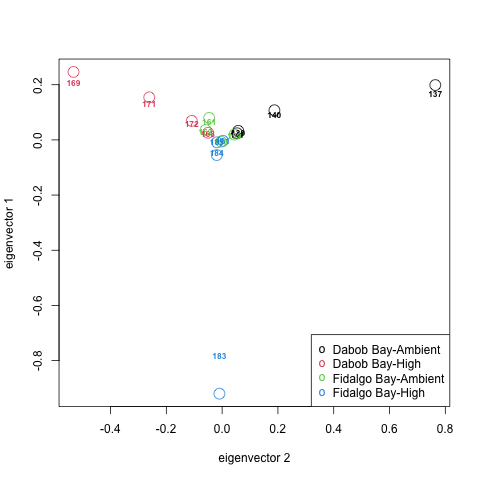

In [175]:
%%R
# Plot PC1 vs PC2 
plot(tab$EV2, tab$EV1, xlab="eigenvector 2", ylab="eigenvector 1",
     col=as.integer(tab$pop_code), cex=2)
text(tab$EV2, tab$EV1*.85, labels=tab$sample.id, cex=0.7, font=2, col=as.integer(tab$pop_code))
legend("bottomright", legend=paste(levels(tab$pop_code)), pch="o", col=1:nlevels(tab$pop_code))

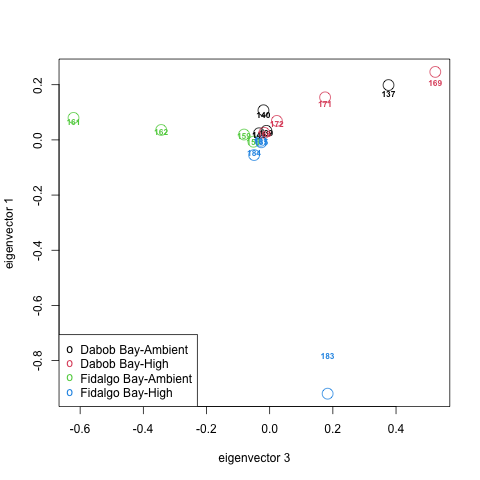

In [174]:
%%R
# Plot PC1 vs PC3 
plot(tab$EV3, tab$EV1, xlab="eigenvector 3", ylab="eigenvector 1",
     col=as.integer(tab$pop_code), cex=2)
text(tab$EV3, tab$EV1*.85, labels=tab$sample.id, cex=0.7, font=2, col=as.integer(tab$pop_code))
legend("bottomleft", legend=paste(levels(tab$pop_code)), pch="o", col=1:nlevels(tab$pop_code))

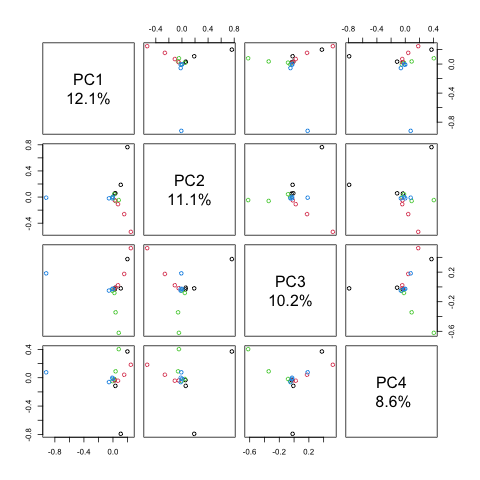

In [176]:
%%R
lbls <- paste("PC", 1:4, "\n", format(pc.percent[1:4], digits=2), "%", sep="")
pairs(pca$eigenvect[,1:4], col=tab$pop_code, labels=lbls)

In [177]:
%%R
### Fst Estimation
a <- snpgdsFst(genofile, sample.id=tab$sample.id, population=as.factor(tab$pop_code),
    method="W&C84", autosome.only=FALSE)
# between DB & FB (not considering parental pCO2)
b <- snpgdsFst(genofile, sample.id=tab$sample.id, population=as.factor(tab$population),
    method="W&C84", autosome.only=FALSE)
# within DB (comparing parental pCO2): 
c <- snpgdsFst(genofile, sample.id=subset(tab, population=="Dabob Bay")$sample.id, population=as.factor(subset(tab, population=="Dabob Bay")$pCO2.parent),
    method="W&C84", autosome.only=FALSE)
# within FB (comparing parental pCO2): 
d <- snpgdsFst(genofile, sample.id=subset(tab, population=="Fidalgo Bay")$sample.id, population=as.factor(subset(tab, population=="Dabob Bay")$pCO2.parent),
    method="W&C84", autosome.only=FALSE)

Fst estimation on genotypes:
Excluding 9,621 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 16
    # of SNPs: 58,292
Method: Weir & Cockerham, 1984
# of Populations: 4
    Dabob Bay-Ambient (4), Dabob Bay-High (4), Fidalgo Bay-Ambient (4), Fidalgo Bay-High (4)
Fst estimation on genotypes:
Excluding 9,621 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 16
    # of SNPs: 58,292
Method: Weir & Cockerham, 1984
# of Populations: 2
    Dabob Bay (8), Fidalgo Bay (8)
Fst estimation on genotypes:
Excluding 27,205 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 8
    # of SNPs: 40,708
Method: Weir & Cockerham, 1984
# of Populations: 2
    Ambient (4), High (4)
Fst estimation on genotypes:
Excluding 26,388 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 8
    # of SNPs: 41,525
Method: Weir & Cockerham, 1984
# of Populations: 2
    Ambient (4), High (4)


In [178]:
%%R
print(paste("Weir and Cockerham mean Fst estimate: ", round(a$MeanFst, 5)))
print(paste("Weir and Cockerham mean Fst estimate, DB vs. FB: ", round(b$MeanFst, 5)))
print(paste("Weir and Cockerham mean Fst estimate, Dabob Bay Ambient vs. High: ", round(c$MeanFst, 5)))
print(paste("Weir and Cockerham mean Fst estimate, Fidalgo Bay Ambient vs. High: ", round(d$MeanFst, 5)))

[1] "Weir and Cockerham mean Fst estimate:  -0.10107"
[1] "Weir and Cockerham mean Fst estimate, DB vs. FB:  -0.16286"
[1] "Weir and Cockerham mean Fst estimate, Dabob Bay Ambient vs. High:  -0.21449"
[1] "Weir and Cockerham mean Fst estimate, Fidalgo Bay Ambient vs. High:  -0.27895"


Identity-By-State (IBS) analysis on genotypes:
Excluding 9,621 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 16
    # of SNPs: 58,292
    using 2 threads
IBS:    the sum of all selected genotypes (0,1,2) = 179089
Mon Mar  1 22:32:46 2021    (internal increment: 65536)
[==================================================] 100%, completed, 0s  
Mon Mar  1 22:32:46 2021    Done.


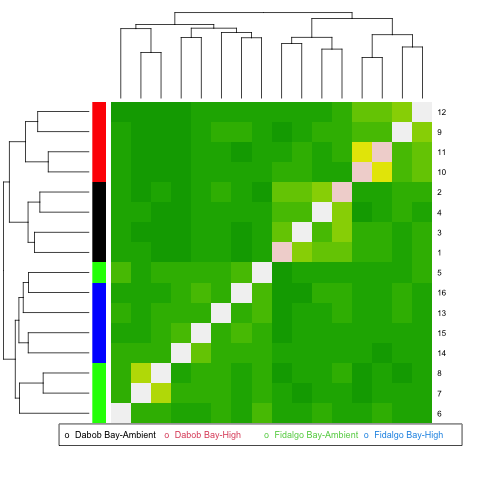

In [179]:
%%R
### Identity-By-State Analysis 

ibs <- snpgdsIBS(genofile, num.thread=2, autosome.only=FALSE)

par(xpd=TRUE)
heatmap(ibs$ibs, col=terrain.colors(16), labCol=TRUE, RowSideColors=c("black","red","green","blue")[tab$pop_code])
legend(0,-.05, legend=levels(tab$pop_code), pch="o", col=1:nlevels(tab$pop_code), text.col=1:nlevels(tab$pop_code), cex=.75, ncol=4)

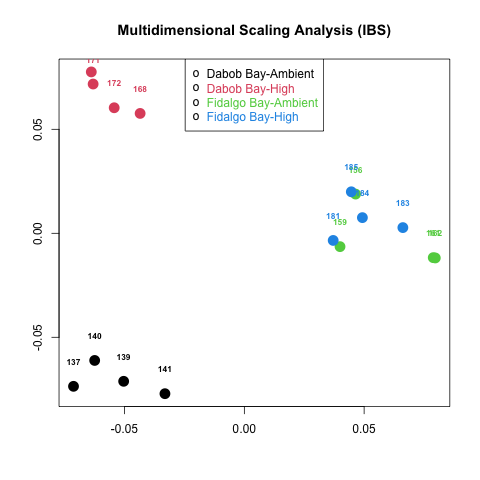

In [180]:
%%R
#To perform multidimensional scaling analysis on the matrix of genome-wide IBS pairwise distances:
loc <- cmdscale(1 - ibs$ibs, k = 2)
x <- loc[, 1]; y <- loc[, 2]
group <- as.factor(tab$pop_code)

plot(x, y, col=group, xlab = "", ylab = "",
    main = "Multidimensional Scaling Analysis (IBS)", cex=2, pch=16)
text(x, y+.012, labels=tab$sample.id, cex=0.7, font=2, col=as.integer(group))
legend("top", legend=levels(group), pch="o", text.col=1:nlevels(group))

Identity-By-State (IBS) analysis on genotypes:
Excluding 9,621 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 16
    # of SNPs: 58,292
    using 2 threads
IBS:    the sum of all selected genotypes (0,1,2) = 179089
Mon Mar  1 22:32:53 2021    (internal increment: 65536)
[==================================================] 100%, completed, 0s  
Mon Mar  1 22:32:53 2021    Done.
Determine groups by permutation (Z threshold: 15, outlier threshold: 5):
Create 1 groups.
Create 4 groups.


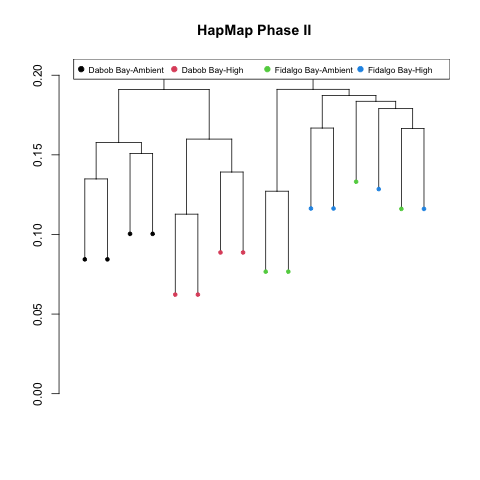

In [181]:
%%R
# To perform cluster analysis on the matrix of genome-wide IBS pairwise distances, 
# and determine the groups by a permutation score. 
# Result= only 1 group (?)
ibs.hc <- snpgdsHCluster(snpgdsIBS(genofile, num.thread=2, autosome.only=FALSE))
rv <- snpgdsCutTree(ibs.hc)

# Determine groups of individuals by population information
rv2 <- snpgdsCutTree(ibs.hc, samp.group=as.factor(tab$pop_code))
plot(rv2$dendrogram, leaflab="none", main="HapMap Phase II")
legend("topright", legend=levels(group), col=1:nlevels(group), pch=19, ncol=4, cex=0.7, pt.cex=1)

In [3]:
%%R
# close the GDS file! 
snpgdsClose(genofile)

'/Volumes/Bumblebee/O.lurida_QuantSeq-2020/notebooks'

### Estimate relatedness using vcftools


In [8]:
cd ..

/Volumes/Bumblebee/O.lurida_QuantSeq-2020/qc-processing/gatk


In [9]:
! multiqc .

[INFO   ]         multiqc : This is MultiQC v1.9.dev0
[INFO   ]         multiqc : Template    : default
[INFO   ]         multiqc : Searching   : /Volumes/Bumblebee/O.lurida_QuantSeq-2020/qc-processing/gatk
Searching 239 files..  [####################################]  100%          
[INFO   ]  feature_counts : Found 16 reports
[INFO   ]          picard : Found 16 MarkDuplicates reports
[INFO   ]         multiqc : Compressing plot data
[INFO   ]         multiqc : Report      : multiqc_report.html
[INFO   ]         multiqc : Data        : multiqc_data
[INFO   ]         multiqc : MultiQC complete


## Re-generate gene counts from deduplicated .bam files using `featureCounts` 

The below is a re-do of gene counts. This is to test whether deduplication has an effect on differential expression analysis. 

In [1]:
# create path variable for featureCounts program
featureCounts = "/Applications/bioinformatics/subread/bin/featureCounts"

In [2]:
# test path and path variable 
! {featureCounts} -v


featureCounts v2.0.0



In [5]:
# 1) gene GFF with 2kb 3' extention  
! {featureCounts} \
-T 5 \
-s 1 \
-t gene \
-g ID \
-a ../references/Olurida_v081-20190709.gene.2kbdown.gff \
-o ../qc-processing/gatk/featurecounts-gene2kbdown.txt \
../qc-processing/gatk/*.dedup.bam


        ==========     _____ _    _ ____  _____  ______          _____  
        =====         / ____| |  | |  _ \|  __ \|  ____|   /\   |  __ \ 
          =====      | (___ | |  | | |_) | |__) | |__     /  \  | |  | |
            ====      \___ \| |  | |  _ <|  _  /|  __|   / /\ \ | |  | |
              ====    ____) | |__| | |_) | | \ \| |____ / ____ \| |__| |
        ==========   |_____/ \____/|____/|_|  \_\______/_/    \_\_____/
	  v2.0.0

//========================== featureCounts setting ===========================\\
||                                                                            ||
||             Input files : 16 BAM files                                     ||
||                           o 137.dedup.bam                                  ||
||                           o 139.dedup.bam                                  ||
||                           o 140.dedup.bam                                  ||
||                           o 141.dedup.bam                     

||    Single-end reads are included.                                          ||
||    Total alignments : 5085856                                              ||
||    Successfully assigned alignments : 1409314 (27.7%)                      ||
||    Running time : 0.04 minutes                                             ||
||                                                                            ||
|| Process BAM file 162.dedup.bam...                                          ||
||    Strand specific : stranded                                              ||
||    Single-end reads are included.                                          ||
||    Total alignments : 4132151                                              ||
||    Successfully assigned alignments : 1157742 (28.0%)                      ||
||    Running time : 0.03 minutes                                             ||
||                                                                            ||
|| Process BAM file 168.dedu

In [6]:
ls ../qc-processing/gatk/featurecounts*

../qc-processing/gatk/featurecounts-gene2kbdown.txt*
../qc-processing/gatk/featurecounts-gene2kbdown.txt.summary*


In [7]:
! cat ../qc-processing/gatk/featurecounts-gene2kbdown.txt.summary

Status	../qc-processing/gatk/137.dedup.bam	../qc-processing/gatk/139.dedup.bam	../qc-processing/gatk/140.dedup.bam	../qc-processing/gatk/141.dedup.bam	../qc-processing/gatk/156.dedup.bam	../qc-processing/gatk/159.dedup.bam	../qc-processing/gatk/161.dedup.bam	../qc-processing/gatk/162.dedup.bam	../qc-processing/gatk/168.dedup.bam	../qc-processing/gatk/169.dedup.bam	../qc-processing/gatk/171.dedup.bam	../qc-processing/gatk/172.dedup.bam	../qc-processing/gatk/181.dedup.bam	../qc-processing/gatk/183.dedup.bam	../qc-processing/gatk/184.dedup.bam	../qc-processing/gatk/185.dedup.bam
Assigned	1474354	638045	1317988	566723	1031170	1641679	1409314	1157742	674811	2197047	1711459	1193532	537925	2064387	874831	500978
Unassigned_Unmapped	0	0	0	0	0	0	0	0	0	0	0	0	0	0	0	0
Unassigned_Read_Type	0	0	0	0	0	0	0	0	0	0	0	0	0	0	0	0
Unassigned_Singleton	0	0	0	0	0	0	0	0	0	0	0	0	0	0	0	0
Unassigned_MappingQuality	0	0	0	0	0	0	0	0	0	0	0	0	0	0	0	0
Unassigned_Chimera	0	0	0	0	0	0	0	0	0	0	0	0	0	0	0	0
Unassigned_Fragment

### Clean up the featureCounts matrix

There is information about the genomic coordinates and the length of the gene, we don’t need this for the next step, so we are going to extract the columns that we are interested in.

In [8]:
! head ../qc-processing/gatk/featurecounts-gene2kbdown.txt

# Program:featureCounts v2.0.0; Command:"/Applications/bioinformatics/subread/bin/featureCounts" "-T" "5" "-s" "1" "-t" "gene" "-g" "ID" "-a" "../references/Olurida_v081-20190709.gene.2kbdown.gff" "-o" "../qc-processing/gatk/featurecounts-gene2kbdown.txt" "../qc-processing/gatk/137.dedup.bam" "../qc-processing/gatk/139.dedup.bam" "../qc-processing/gatk/140.dedup.bam" "../qc-processing/gatk/141.dedup.bam" "../qc-processing/gatk/156.dedup.bam" "../qc-processing/gatk/159.dedup.bam" "../qc-processing/gatk/161.dedup.bam" "../qc-processing/gatk/162.dedup.bam" "../qc-processing/gatk/168.dedup.bam" "../qc-processing/gatk/169.dedup.bam" "../qc-processing/gatk/171.dedup.bam" "../qc-processing/gatk/172.dedup.bam" "../qc-processing/gatk/181.dedup.bam" "../qc-processing/gatk/183.dedup.bam" "../qc-processing/gatk/184.dedup.bam" "../qc-processing/gatk/185.dedup.bam" 
Geneid	Chr	Start	End	Strand	Length	../qc-processing/gatk/137.dedup.bam	../qc-processing/gatk/139.dedup.bam	../qc-processing/gatk/140.de

In [9]:
# remove columns 2-6, which contain merged contig info 
! cut -f-1,7- ../qc-processing/gatk/featurecounts-gene2kbdown.txt \
> ../qc-processing/gatk/featurecounts-gene2kbdown.Rmatrix.txt

In [10]:
! head ../qc-processing/gatk/featurecounts-gene2kbdown.Rmatrix.txt

# Program:featureCounts v2.0.0; Command:"/Applications/bioinformatics/subread/bin/featureCounts" "-T" "5" "-s" "1" "-t" "gene" "-g" "ID" "-a" "../references/Olurida_v081-20190709.gene.2kbdown.gff" "-o" "../qc-processing/gatk/featurecounts-gene2kbdown.txt" "../qc-processing/gatk/137.dedup.bam" "../qc-processing/gatk/139.dedup.bam" "../qc-processing/gatk/140.dedup.bam" "../qc-processing/gatk/141.dedup.bam" "../qc-processing/gatk/156.dedup.bam" "../qc-processing/gatk/159.dedup.bam" "../qc-processing/gatk/161.dedup.bam" "../qc-processing/gatk/162.dedup.bam" "../qc-processing/gatk/168.dedup.bam" "../qc-processing/gatk/169.dedup.bam" "../qc-processing/gatk/171.dedup.bam" "../qc-processing/gatk/172.dedup.bam" "../qc-processing/gatk/181.dedup.bam" "../qc-processing/gatk/183.dedup.bam" "../qc-processing/gatk/184.dedup.bam" "../qc-processing/gatk/185.dedup.bam" 
Geneid	../qc-processing/gatk/137.dedup.bam	../qc-processing/gatk/139.dedup.bam	../qc-processing/gatk/140.dedup.bam	../qc-processing/gat

### Create a .txt file that lists file names in order of run 

In [12]:
%%bash 

for file in ../qc-processing/gatk/*.dedup.bam
do
sample="$(basename -a $file | cut -d "." -f 1)"
echo $sample >> ../qc-processing/gatk/featureCounts-filenames.txt
done

In [13]:
! cat ../qc-processing/gatk/featureCounts-filenames.txt

137
139
140
141
156
159
161
162
168
169
171
172
181
183
184
185


In [14]:
# No. genes identified  
! wc -l ../qc-processing/gatk/featurecounts-gene2kbdown.Rmatrix.txt

   32212 ../qc-processing/gatk/featurecounts-gene2kbdown.Rmatrix.txt


# Run Colony 

I will use Colony to identify siblings in my samples. The Colony software is only available via the command line for Mac users (it's typically used via GUI on Windows). To get the most current version of the program I actually had to email the developer. He send me a link to download it. I'm running Colony Version 2.0.6.6 (June 30, 2020), which is saved on my computer and in this project's repo (references/colony2.mac.20200904). 


## Prepare files for Colony sibship analysis

Colony identifies siblings, which I would like to do with my juveniles. Here I prepare files for Colony.

Mac suggested that I only keep SNPs with very high minor allele frequencies (AF <30%). Here I create a new .vcf with that filter. 

In [188]:
! {gatk} VariantFiltration \
-R ../references/Olurida_v081.fa \
-V ../qc-processing/gatk/juvenile_genotypes-SNPs.vcf.gz \
-O ../qc-processing/gatk/juvenile_genotypes-SNPs4Colony.vcf.gz \
--filter-name "FS" \
--filter "FS > 60.0" \
--filter-name "QD" \
--filter "QD < 2.0" \
--filter-name "QUAL30" \
--filter "QUAL < 30.0" \
--filter-name "SOR3" \
--filter "SOR > 3.0" \
--filter-name "DP15" \
--filter "DP < 15" \
--filter-name "AF30" \
--filter "AF < 0.30"

Using GATK jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar VariantFiltration -R ../references/Olurida_v081.fa -V ../qc-processing/gatk/juvenile_genotypes-SNPs.vcf.gz -O ../qc-processing/gatk/juvenile_genotypes-SNPs4Colony.vcf.gz --filter-name FS --filter FS > 60.0 --filter-name QD --filter QD < 2.0 --filter-name QUAL30 --filter QUAL < 30.0 --filter-name SOR3 --filter SOR > 3.0 --filter-name DP15 --filter DP < 15 --filter-name AF30 --filter AF < 0.30
13:59:40.798 INFO  NativeLibraryLoader - Loading libgkl_compression.dylib from jar:file:/Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar!/com/intel/gkl/native/libgkl_compression.dylib
Mar 25, 2021 1:59:40 PM shaded.cloud_nio.com.google.auth.o

13:59:45.501 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.150, 0.250])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontex

13:59:45.607 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.313, 0.031])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontex

	at java.base/java.util.stream.AbstractPipeline.evaluate(AbstractPipeline.java:234) [?:?]
	at java.base/java.util.stream.ReferencePipeline.forEach(ReferencePipeline.java:497) [?:?]
	at org.broadinstitute.hellbender.engine.VariantWalker.traverse(VariantWalker.java:102) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.engine.GATKTool.doWork(GATKTool.java:1049) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.runTool(CommandLineProgram.java:140) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.instanceMainPostParseArgs(CommandLineProgram.java:192) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.instanceMain(CommandLineProgram.java:211) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.Main.runCommandLineProgram(Main.java:160) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadin

	at htsjdk.variant.variantcontext.JEXLMap.evaluateExpression(JEXLMap.java:186) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:95) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:15) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.VariantContextUtils.match(VariantContextUtils.java:338) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.matchesFilter(VariantFiltration.java:453) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.filter(VariantFiltration.java:407) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.apply(VariantFiltration.java:354) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.engine.VariantWalker.lambda$traverse$0(Varia

13:59:45.756 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.214, 0.143])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontex


	at org.broadinstitute.hellbender.Main.main(Main.java:289) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
13:59:45.810 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.344, 0.063])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evalua


	at org.broadinstitute.hellbender.Main.main(Main.java:289) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
13:59:45.863 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.031, 0.031])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evalua

	at java.base/java.util.stream.AbstractPipeline.evaluate(AbstractPipeline.java:234) [?:?]
	at java.base/java.util.stream.ReferencePipeline.forEach(ReferencePipeline.java:497) [?:?]
	at org.broadinstitute.hellbender.engine.VariantWalker.traverse(VariantWalker.java:102) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.engine.GATKTool.doWork(GATKTool.java:1049) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.runTool(CommandLineProgram.java:140) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.instanceMainPostParseArgs(CommandLineProgram.java:192) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.instanceMain(CommandLineProgram.java:211) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.Main.runCommandLineProgram(Main.java:160) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadin

13:59:45.969 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.281, 0.281])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontex

13:59:46.023 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.500, 0.250])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontex

13:59:46.073 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.077, 0.038])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontex

13:59:46.134 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.464, 0.214])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontex

	at htsjdk.variant.variantcontext.JEXLMap.evaluateExpression(JEXLMap.java:186) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:95) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:15) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.VariantContextUtils.match(VariantContextUtils.java:338) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.matchesFilter(VariantFiltration.java:453) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.filter(VariantFiltration.java:407) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.apply(VariantFiltration.java:354) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.engine.VariantWalker.lambda$traverse$0(Varia

13:59:46.235 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.400, 0.300])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontex


	at org.broadinstitute.hellbender.Main.main(Main.java:289) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
13:59:46.289 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.500, 0.500])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evalua

	at java.base/java.util.stream.ForEachOps$ForEachOp$OfRef.accept(ForEachOps.java:183) [?:?]
	at java.base/java.util.stream.ReferencePipeline$3$1.accept(ReferencePipeline.java:195) [?:?]
	at java.base/java.util.stream.ReferencePipeline$2$1.accept(ReferencePipeline.java:177) [?:?]
	at java.base/java.util.stream.ReferencePipeline$3$1.accept(ReferencePipeline.java:195) [?:?]
	at java.base/java.util.Iterator.forEachRemaining(Iterator.java:133) [?:?]
	at java.base/java.util.Spliterators$IteratorSpliterator.forEachRemaining(Spliterators.java:1801) [?:?]
	at java.base/java.util.stream.AbstractPipeline.copyInto(AbstractPipeline.java:484) [?:?]
	at java.base/java.util.stream.AbstractPipeline.wrapAndCopyInto(AbstractPipeline.java:474) [?:?]
	at java.base/java.util.stream.ForEachOps$ForEachOp.evaluateSequential(ForEachOps.java:150) [?:?]
	at java.base/java.util.stream.ForEachOps$ForEachOp$OfRef.evaluateSequential(ForEachOps.java:173) [?:?]
	at java.base/java.util.stream.AbstractPipeline.evaluate(A

13:59:46.404 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.250, 0.071])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontex

13:59:46.451 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.531, 0.125])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontex

13:59:46.504 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.111, 0.056])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontex

	at org.broadinstitute.hellbender.Main.mainEntry(Main.java:203) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.Main.main(Main.java:289) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
13:59:46.557 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.300, 0.300])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interprete

13:59:46.611 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.042, 0.417])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontex

13:59:46.660 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.063, 0.031])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontex

13:59:46.714 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.071, 0.036])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontex

	at htsjdk.variant.variantcontext.JEXLMap.evaluateExpression(JEXLMap.java:186) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:95) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:15) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.VariantContextUtils.match(VariantContextUtils.java:338) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.matchesFilter(VariantFiltration.java:453) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.filter(VariantFiltration.java:407) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.apply(VariantFiltration.java:354) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.engine.VariantWalker.lambda$traverse$0(Varia

13:59:46.819 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.250, 0.750])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontex

13:59:46.877 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.063, 0.156])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontex

13:59:46.927 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.033, 0.033])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontex

13:59:46.985 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.100, 0.050])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontex

	at java.base/java.util.stream.AbstractPipeline.evaluate(AbstractPipeline.java:234) [?:?]
	at java.base/java.util.stream.ReferencePipeline.forEach(ReferencePipeline.java:497) [?:?]
	at org.broadinstitute.hellbender.engine.VariantWalker.traverse(VariantWalker.java:102) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.engine.GATKTool.doWork(GATKTool.java:1049) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.runTool(CommandLineProgram.java:140) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.instanceMainPostParseArgs(CommandLineProgram.java:192) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.cmdline.CommandLineProgram.instanceMain(CommandLineProgram.java:211) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.Main.runCommandLineProgram(Main.java:160) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadin

13:59:47.103 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.077, 0.038])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontex

13:59:47.142 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.167, 0.167])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontex

13:59:47.194 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.063, 0.063])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontex

13:59:47.250 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.875, 0.125])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontex

	at java.base/java.util.stream.ForEachOps$ForEachOp$OfRef.accept(ForEachOps.java:183) [?:?]
	at java.base/java.util.stream.ReferencePipeline$3$1.accept(ReferencePipeline.java:195) [?:?]
	at java.base/java.util.stream.ReferencePipeline$2$1.accept(ReferencePipeline.java:177) [?:?]
	at java.base/java.util.stream.ReferencePipeline$3$1.accept(ReferencePipeline.java:195) [?:?]
	at java.base/java.util.Iterator.forEachRemaining(Iterator.java:133) [?:?]
	at java.base/java.util.Spliterators$IteratorSpliterator.forEachRemaining(Spliterators.java:1801) [?:?]
	at java.base/java.util.stream.AbstractPipeline.copyInto(AbstractPipeline.java:484) [?:?]
	at java.base/java.util.stream.AbstractPipeline.wrapAndCopyInto(AbstractPipeline.java:474) [?:?]
	at java.base/java.util.stream.ForEachOps$ForEachOp.evaluateSequential(ForEachOps.java:150) [?:?]
	at java.base/java.util.stream.ForEachOps$ForEachOp$OfRef.evaluateSequential(ForEachOps.java:173) [?:?]
	at java.base/java.util.stream.AbstractPipeline.evaluate(A


	at org.broadinstitute.hellbender.Main.main(Main.java:289) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
13:59:47.362 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.111, 0.056])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evalua

13:59:47.413 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.077, 0.038])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontex

	at htsjdk.variant.variantcontext.JEXLMap.evaluateExpression(JEXLMap.java:186) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:95) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.JEXLMap.get(JEXLMap.java:15) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontext.VariantContextUtils.match(VariantContextUtils.java:338) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.matchesFilter(VariantFiltration.java:453) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.filter(VariantFiltration.java:407) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.tools.walkers.filters.VariantFiltration.apply(VariantFiltration.java:354) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.broadinstitute.hellbender.engine.VariantWalker.lambda$traverse$0(Varia

13:59:47.520 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.344, 0.125])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontex


	at org.broadinstitute.hellbender.Main.main(Main.java:289) [gatk-package-4.1.9.0-local.jar:4.1.9.0]
13:59:47.573 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.250, 0.031])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evalua

13:59:47.627 WARN  JexlEngine - ![0,9]: 'AF < 0.30;' < error
java.lang.ArithmeticException: Double coercion: java.util.ArrayList:([0.094, 0.094])
	at org.apache.commons.jexl2.JexlArithmetic.toDouble(JexlArithmetic.java:1023) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.compare(JexlArithmetic.java:699) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.JexlArithmetic.lessThan(JexlArithmetic.java:774) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.visit(Interpreter.java:967) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.parser.ASTLTNode.jjtAccept(ASTLTNode.java:18) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.Interpreter.interpret(Interpreter.java:232) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at org.apache.commons.jexl2.ExpressionImpl.evaluate(ExpressionImpl.java:65) ~[gatk-package-4.1.9.0-local.jar:4.1.9.0]
	at htsjdk.variant.variantcontex

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [189]:
# Now create another filtered .vcf that excludes any variants not meeting the above hard-filter settings 
! {gatk} SelectVariants \
-R ../references/Olurida_v081.fa \
-V ../qc-processing/gatk/juvenile_genotypes-SNPs4Colony.vcf.gz \
--exclude-filtered TRUE \
--max-nocall-number 0 \
-O ../qc-processing/gatk/juvenile_genotypes-SNPs4Colony-filteredtrue.vcf.gz

Using GATK jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar SelectVariants -R ../references/Olurida_v081.fa -V ../qc-processing/gatk/juvenile_genotypes-SNPs4Colony.vcf.gz --exclude-filtered TRUE --max-nocall-number 0 -O ../qc-processing/gatk/juvenile_genotypes-SNPs4Colony-filteredtrue.vcf.gz
13:59:53.945 INFO  NativeLibraryLoader - Loading libgkl_compression.dylib from jar:file:/Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar!/com/intel/gkl/native/libgkl_compression.dylib
Mar 25, 2021 1:59:54 PM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running on Google Compute Engine.
13:59:54.289 INFO  SelectVariants - 

In [190]:
# Total # SNP variants before filtering for only SNPs
! zgrep "^Contig" ../qc-processing/gatk/juvenile_genotypes-SNPs4Colony.vcf.gz | wc -l 

# Confirm that I did indeed filter only SNPs
! zgrep "^Contig" ../qc-processing/gatk/juvenile_genotypes-SNPs4Colony-filteredtrue.vcf.gz | wc -l 
! zgrep "PASS" ../qc-processing/gatk/juvenile_genotypes-SNPs4Colony-filteredtrue.vcf.gz | wc -l 

   56497
    3458
    3459


In [191]:
! gzip -dkf ../qc-processing/gatk/juvenile_genotypes-SNPs4Colony-filteredtrue.vcf.gz

In [192]:
%%R
# 
vcf.fn.colony <- "../qc-processing/gatk/juvenile_genotypes-SNPs4Colony-filteredtrue.vcf"
vcf.fn.colony

[1] "../qc-processing/gatk/juvenile_genotypes-SNPs4Colony-filteredtrue.vcf"


In [193]:
%%R
# if you get an error with the next chunk, run this one 
snpgdsClose(genofile4Colony)

R[write to console]: Error in snpgdsClose(genofile4Colony) : 
  object 'genofile4Colony' not found




Error in snpgdsClose(genofile4Colony) : 
  object 'genofile4Colony' not found


In [194]:
%%R
# Reformat - note, can't re-run this chucnk
snpgdsVCF2GDS(vcf.fn.colony, "../qc-processing/gatk/juvenile4Colony.gds", method="biallelic.only")

Start file conversion from VCF to SNP GDS ...
Method: exacting biallelic SNPs
Number of samples: 16
Parsing "../qc-processing/gatk/juvenile_genotypes-SNPs4Colony-filteredtrue.vcf" ...
	import 3204 variants.
+ genotype   { Bit2 16x3204, 12.5K } *
Optimize the access efficiency ...
Clean up the fragments of GDS file:
    open the file '../qc-processing/gatk/juvenile4Colony.gds' (37.6K)
    # of fragments: 46
    save to '../qc-processing/gatk/juvenile4Colony.gds.tmp'
    rename '../qc-processing/gatk/juvenile4Colony.gds.tmp' (37.3K, reduced: 312B)
    # of fragments: 20


In [195]:
%%R
# View summary 
snpgdsSummary("../qc-processing/gatk/juvenile4Colony.gds")

The file name: /Volumes/Bumblebee/O.lurida_QuantSeq-2020/qc-processing/gatk/juvenile4Colony.gds 
The total number of samples: 16 
The total number of SNPs: 3204 
SNP genotypes are stored in SNP-major mode (Sample X SNP).


In [374]:
%%R
#open gds and check out genofile contents 
(genofile4Colony <- snpgdsOpen("../qc-processing/gatk/juvenile4Colony.gds"))

File: /Volumes/Bumblebee/O.lurida_QuantSeq-2020/qc-processing/gatk/juvenile4Colony.gds (37.3K)
+    [  ] *
|--+ sample.id   { Str8 16 LZMA_ra(178.1%), 121B }
|--+ snp.id   { Int32 3204 LZMA_ra(13.1%), 1.6K }
|--+ snp.rs.id   { Str8 3204 LZMA_ra(3.18%), 109B }
|--+ snp.position   { Int32 3204 LZMA_ra(42.2%), 5.3K }
|--+ snp.chromosome   { Str8 3204 LZMA_ra(9.55%), 3.6K }
|--+ snp.allele   { Str8 3204 LZMA_ra(15.2%), 1.9K }
|--+ genotype   { Bit2 16x3204, 12.5K } *
\--+ snp.annot   [  ]
   |--+ qual   { Float32 3204 LZMA_ra(79.9%), 10.0K }
   \--+ filter   { Str8 3204 LZMA_ra(0.86%), 145B }


In [375]:
%%R
# Prune SNPs in linkage-disequilibrium 
snpset4Colony <- snpgdsLDpruning(genofile4Colony, ld.threshold=0.2, autosome.only=FALSE)

SNP pruning based on LD:
Excluding 3 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 16
    # of SNPs: 3,201
    using 1 thread
    sliding window: 500,000 basepairs, Inf SNPs
    |LD| threshold: 0.2
    method: composite
Chromosome Contig100081: 50.00%, 1/2
Chromosome Contig100403: 100.00%, 1/1
Chromosome Contig100441: 16.67%, 1/6
Chromosome Contig100774: 33.33%, 1/3
Chromosome Contig10117: 50.00%, 1/2
Chromosome Contig101546: 66.67%, 2/3
Chromosome Contig101586: 25.00%, 1/4
Chromosome Contig1016: 100.00%, 1/1
Chromosome Contig101859: 33.33%, 1/3
Chromosome Contig101868: 50.00%, 1/2
Chromosome Contig10230: 100.00%, 1/1
Chromosome Contig102689: 100.00%, 1/1
Chromosome Contig102899: 100.00%, 1/1
Chromosome Contig102975: 100.00%, 1/1
Chromosome Contig103044: 25.00%, 1/4
Chromosome Contig103455: 50.00%, 1/2
Chromosome Contig103503: 33.33%, 1/3
Chromosome Contig103511: 100.00%, 1/1
Chromosome Contig103524: 50.00%, 1/2
Chromosome Contig103565: 100.00%, 1/1
Chromosome

Chromosome Contig16133: 100.00%, 1/1
Chromosome Contig1614: 33.33%, 1/3
Chromosome Contig16140: 50.00%, 1/2
Chromosome Contig16189: 50.00%, 1/2
Chromosome Contig161994: 50.00%, 1/2
Chromosome Contig162991: 100.00%, 1/1
Chromosome Contig16315: 50.00%, 1/2
Chromosome Contig16373: 50.00%, 1/2
Chromosome Contig16494: 50.00%, 1/2
Chromosome Contig1651: 100.00%, 1/1
Chromosome Contig165410: 100.00%, 1/1
Chromosome Contig16586: 50.00%, 1/2
Chromosome Contig16788: 66.67%, 2/3
Chromosome Contig16844: 100.00%, 1/1
Chromosome Contig168553: 100.00%, 1/1
Chromosome Contig168670: 50.00%, 1/2
Chromosome Contig16877: 50.00%, 1/2
Chromosome Contig168844: 100.00%, 2/2
Chromosome Contig16889: 100.00%, 1/1
Chromosome Contig168902: 50.00%, 1/2
Chromosome Contig16901: 16.67%, 1/6
Chromosome Contig169410: 100.00%, 1/1
Chromosome Contig169539: 16.67%, 1/6
Chromosome Contig169553: 100.00%, 1/1
Chromosome Contig16969: 100.00%, 1/1
Chromosome Contig170: 25.00%, 1/4
Chromosome Contig1701: 33.33%, 1/3
Chromosome C

Chromosome Contig22561: 100.00%, 1/1
Chromosome Contig22658: 50.00%, 1/2
Chromosome Contig22684: 33.33%, 1/3
Chromosome Contig22688: 50.00%, 1/2
Chromosome Contig22692: 50.00%, 1/2
Chromosome Contig22723: 50.00%, 1/2
Chromosome Contig22736: 100.00%, 1/1
Chromosome Contig2275: 14.29%, 1/7
Chromosome Contig22761: 50.00%, 1/2
Chromosome Contig22903: 50.00%, 1/2
Chromosome Contig22963: 100.00%, 1/1
Chromosome Contig23117: 100.00%, 1/1
Chromosome Contig23152: 100.00%, 1/1
Chromosome Contig23154: 50.00%, 1/2
Chromosome Contig23163: 100.00%, 1/1
Chromosome Contig23231: 100.00%, 1/1
Chromosome Contig23245: 100.00%, 1/1
Chromosome Contig23253: 33.33%, 1/3
Chromosome Contig23341: 50.00%, 1/2
Chromosome Contig23413: 33.33%, 1/3
Chromosome Contig23456: 100.00%, 1/1
Chromosome Contig23544: 100.00%, 1/1
Chromosome Contig235597: 33.33%, 1/3
Chromosome Contig23630: 100.00%, 1/1
Chromosome Contig23663: 100.00%, 1/1
Chromosome Contig23693: 50.00%, 1/2
Chromosome Contig23697: 50.00%, 1/2
Chromosome Conti

Chromosome Contig30991: 50.00%, 1/2
Chromosome Contig3102: 50.00%, 1/2
Chromosome Contig31099: 100.00%, 1/1
Chromosome Contig31118: 25.00%, 1/4
Chromosome Contig31156: 50.00%, 1/2
Chromosome Contig31196: 25.00%, 1/4
Chromosome Contig31302: 100.00%, 1/1
Chromosome Contig31350: 20.00%, 1/5
Chromosome Contig31380: 50.00%, 1/2
Chromosome Contig31392: 100.00%, 1/1
Chromosome Contig314: 50.00%, 1/2
Chromosome Contig31407: 33.33%, 1/3
Chromosome Contig31485: 100.00%, 1/1
Chromosome Contig31490: 33.33%, 1/3
Chromosome Contig31515: 100.00%, 1/1
Chromosome Contig31528: 100.00%, 1/1
Chromosome Contig31541: 100.00%, 1/1
Chromosome Contig31548: 100.00%, 2/2
Chromosome Contig31552: 100.00%, 1/1
Chromosome Contig316: 25.00%, 1/4
Chromosome Contig316866: 75.00%, 3/4
Chromosome Contig31688: 100.00%, 1/1
Chromosome Contig31702: 100.00%, 1/1
Chromosome Contig31717: 14.29%, 1/7
Chromosome Contig31718: 100.00%, 1/1
Chromosome Contig31800: 100.00%, 1/1
Chromosome Contig319: 100.00%, 1/1
Chromosome Contig319

Chromosome Contig40805: 33.33%, 1/3
Chromosome Contig40815: 50.00%, 1/2
Chromosome Contig40830: 50.00%, 1/2
Chromosome Contig40854: 100.00%, 1/1
Chromosome Contig40873: 100.00%, 1/1
Chromosome Contig40938: 50.00%, 1/2
Chromosome Contig41021: 100.00%, 1/1
Chromosome Contig4108: 50.00%, 1/2
Chromosome Contig41087: 33.33%, 1/3
Chromosome Contig4109: 100.00%, 1/1
Chromosome Contig41096: 20.00%, 1/5
Chromosome Contig41118: 14.29%, 1/7
Chromosome Contig41134: 33.33%, 1/3
Chromosome Contig41155: 50.00%, 1/2
Chromosome Contig41195: 50.00%, 1/2
Chromosome Contig41209: 100.00%, 1/1
Chromosome Contig41264: 50.00%, 1/2
Chromosome Contig41276: 33.33%, 1/3
Chromosome Contig41416: 100.00%, 1/1
Chromosome Contig41548: 33.33%, 1/3
Chromosome Contig41635: 50.00%, 1/2
Chromosome Contig41847: 100.00%, 1/1
Chromosome Contig41871: 100.00%, 1/1
Chromosome Contig4192: 100.00%, 1/1
Chromosome Contig41927: 100.00%, 1/1
Chromosome Contig41935: 50.00%, 1/2
Chromosome Contig420: 100.00%, 1/1
Chromosome Contig42083

Chromosome Contig53587: 100.00%, 1/1
Chromosome Contig53760: 50.00%, 1/2
Chromosome Contig53792: 50.00%, 1/2
Chromosome Contig53823: 100.00%, 1/1
Chromosome Contig5392: 100.00%, 1/1
Chromosome Contig54028: 100.00%, 1/1
Chromosome Contig54070: 100.00%, 1/1
Chromosome Contig541: 100.00%, 1/1
Chromosome Contig54149: 100.00%, 1/1
Chromosome Contig54155: 50.00%, 1/2
Chromosome Contig54227: 100.00%, 1/1
Chromosome Contig54286: 100.00%, 1/1
Chromosome Contig54363: 100.00%, 1/1
Chromosome Contig54737: 33.33%, 1/3
Chromosome Contig54853: 100.00%, 1/1
Chromosome Contig54868: 100.00%, 1/1
Chromosome Contig5506: 100.00%, 1/1
Chromosome Contig55110: 16.67%, 1/6
Chromosome Contig55149: 100.00%, 1/1
Chromosome Contig55181: 50.00%, 1/2
Chromosome Contig55224: 25.00%, 1/4
Chromosome Contig55268: 14.29%, 1/7
Chromosome Contig55368: 50.00%, 1/2
Chromosome Contig55625: 100.00%, 1/1
Chromosome Contig55732: 100.00%, 1/1
Chromosome Contig55845: 50.00%, 1/2
Chromosome Contig56: 100.00%, 1/1
Chromosome Contig5

Chromosome Contig73392: 33.33%, 1/3
Chromosome Contig7343: 100.00%, 1/1
Chromosome Contig73457: 9.09%, 1/11
Chromosome Contig73471: 100.00%, 1/1
Chromosome Contig735: 100.00%, 1/1
Chromosome Contig7353: 33.33%, 1/3
Chromosome Contig73562: 50.00%, 1/2
Chromosome Contig73582: 100.00%, 1/1
Chromosome Contig73930: 100.00%, 1/1
Chromosome Contig74051: 100.00%, 1/1
Chromosome Contig74326: 100.00%, 1/1
Chromosome Contig74456: 50.00%, 1/2
Chromosome Contig74811: 100.00%, 1/1
Chromosome Contig74988: 50.00%, 2/4
Chromosome Contig75: 50.00%, 1/2
Chromosome Contig75274: 50.00%, 1/2
Chromosome Contig75414: 33.33%, 1/3
Chromosome Contig75622: 100.00%, 1/1
Chromosome Contig75667: 50.00%, 1/2
Chromosome Contig75689: 50.00%, 1/2
Chromosome Contig75902: 100.00%, 1/1
Chromosome Contig76295: 50.00%, 1/2
Chromosome Contig763: 12.50%, 1/8
Chromosome Contig76378: 100.00%, 1/1
Chromosome Contig76487: 16.67%, 1/6
Chromosome Contig76633: 100.00%, 1/1
Chromosome Contig76965: 100.00%, 1/1
Chromosome Contig77: 33.

## ~1,570 markers in total

In [376]:
%%R
snpset4Colony.id <- unlist(unname(snpset4Colony))
head(snpset4Colony.id)

[1]  2  3  6 10 13 16


In [377]:
%%R
snpgdsGetGeno(genofile4Colony)[,1:13]

Genotype matrix: 16 samples X 3204 SNPs
      [,1] [,2] [,3] [,4] [,5] [,6] [,7] [,8] [,9] [,10] [,11] [,12] [,13]
 [1,]    1    1    2    2    0    2    2    2    2     1     2     1     2
 [2,]    1    1    2    1    1    1    2    2    1     1     2     1     2
 [3,]    1    1    2    1    1    1    2    2    1     1     1     1     2
 [4,]    2    2    2    1    2    0    1    2    0     1     2     1     2
 [5,]    2    1    2    1    1    1    1    1    1     0     2     0     0
 [6,]    1    1    0    2    0    2    2    2    2     0     1     0     0
 [7,]    1    1    0    1    1    1    2    2    1     1     2     1     1
 [8,]    1    1    0    0    2    0    0    0    0     0     1     0     0
 [9,]    1    1    2    1    1    1    1    1    1     1     1     1     1
[10,]    1    1    2    1    1    1    1    1    1     0     1     0     1
[11,]    1    1    2    1    1    1    2    2    1     0     1     0     1
[12,]    1    1    2    1    1    1    1    1    1     0    

In [378]:
%%R
# Extract genotypes for LD-pruned SNPs, then save to file 
snpgdsCreateGenoSet(src.fn="../qc-processing/gatk/juvenile4Colony.gds",
                    dest.fn="../qc-processing/gatk/juvenile4Colony-pruned.gds",
                    snp.id=snpset4Colony.id)

Create a GDS genotype file:
The new dataset consists of 16 samples and 1567 SNPs
    write sample.id
    write snp.id
    write snp.rs.id
    write snp.position
    write snp.chromosome
    write snp.allele
SNP genotypes are stored in SNP-major mode (Sample X SNP).


In [387]:
%%R
geno.matrix4Colony <- snpgdsGetGeno(gdsobj="../qc-processing/gatk/juvenile4Colony-pruned.gds", with.id=TRUE)

Genotype matrix: 16 samples X 1567 SNPs


In [380]:
%%R
str(geno.matrix4Colony)

List of 3
 $ genotype : int [1:16, 1:1567] 1 1 1 2 1 1 1 1 1 1 ...
 $ sample.id: chr [1:16] "137" "139" "140" "141" ...
 $ snp.id   : int [1:1567] 2 3 6 10 13 16 17 18 22 24 ...


In [381]:
%%R
geno.matrix4Colony$sample.id

 [1] "137" "139" "140" "141" "156" "159" "161" "162" "168" "169" "171" "172"
[13] "181" "183" "184" "185"


In [204]:
%%R
# Write genotypes to file. NOTE: these are dominant alleles, so only 1 column per marker 
write_delim(cbind(sampleID=paste("O", geno.matrix4Colony$sample.id, sep=""), 
                  as.data.frame(geno.matrix4Colony$genotype)), 
            file="../qc-processing/colony/geno.matrix.tab", delim="   ", col_names=FALSE)

In [205]:
%%R
# this is the genotype matrix that I just wrote to file 
cbind(sampleID=paste("O", geno.matrix4Colony$sample.id, sep=""), as.data.frame(geno.matrix4Colony$genotype))[1:16,1:10]

   sampleID V1 V2 V3 V4 V5 V6 V7 V8 V9
1      O137  1  2  2  1  2  2  0  1  1
2      O139  1  2  2  1  2  2  0  2  1
3      O140  1  2  2  1  2  1  0  1  1
4      O141  2  2  1  1  2  2  0  2  1
5      O156  1  2  1  0  0  0  0  1  1
6      O159  1  0  2  0  0  1  0  2  0
7      O161  1  0  2  1  1  1  1  1  1
8      O162  1  0  0  0  0  1  1  1  1
9      O168  1  2  1  1  1  1  0  1  2
10     O169  1  2  1  0  1  2  0  1  1
11     O171  1  2  2  0  1  2  0  2  1
12     O172  1  2  1  0  1  1  0  2  1
13     O181  1  1  1  1  0  2  1  1  2
14     O183  1  1  1  0  1  1  1  1  0
15     O184  1  1  1  1  1  1  1  1  0
16     O185  1  0  1  0  0  2  1  2  1


## Created the Colony input file by hand using the genotype file created above. 

I used the example colony input file that came with the program ("colony2.dat"), and the colony's user manual to construct my input file by hand. The file, "colony2_juveniles.dat", includes information about the species, samples, analysis, and also has the genotypes, which in my case are dominant (not co-dominant), so I only have one value (0, 1, or 2) per SNP. I copied all the genotype data from the file "../qc-processing/colony/geno.matrix.tab", and pasted it into my "colony2_juveniles.dat" file. 

In [207]:
# Here is the contents of the Colony input file: 
! cat ../qc-processing/colony/colony2_juveniles.dat

## Run Colony

To run, I saved my input data file to the colony folder, where I had saved the colony execution file (colony2s.out) there, navigate to that folder, and ran colony! 

In [211]:
cd ../qc-processing/colony/

/Volumes/Bumblebee/O.lurida_QuantSeq-2020/references/colony2.mac.20200904


In [391]:
! ./colony2s.out IFN:colony2_juveniles.dat


-----------------------------------------------------------------------------------------
COLONY, Version 2.0.6.6, Build 20200830, Expire Date 20300830
Copyright (C) 2005-2020 Jinliang Wang, Institute of Zoology, Zoological Society of London
Email: jinliang.wang@ioz.ac.uk
-----------------------------------------------------------------------------------------

Opening & reading data input file: colony2_juveniles.dat
Reading offspring genotype data...
                                         
Calculating full-sib dyad likelihood...
               
 
Calculating half-sib dyad likelihood...
               
 
Estimating sibship with pairwise approach...
                            
------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+
Run=1, Tmr=12, Itr=100000, NSucc=187, NSuccLmt=2063, NFail1=1558, NFail1Lmt=33000
NFail2=14759, NFail2Lmt=165000, SucRate%=12.0026, SucLmt%=9.0645, FailLmt%=4.7212, IterLmt%=0.3777

## View results of Colony 

First I moved results of Colony from the program folder to my colony directory. Here they are

In [217]:
! ls ../../qc-processing/colony/juvenile_colony*

../../qc-processing/colony/juvenile_colony.AlleleFreq
../../qc-processing/colony/juvenile_colony.BestCluster
../../qc-processing/colony/juvenile_colony.BestConfig
../../qc-processing/colony/juvenile_colony.BestConfig_Ordered
../../qc-processing/colony/juvenile_colony.BestFSFamily
../../qc-processing/colony/juvenile_colony.ConfigArchive
../../qc-processing/colony/juvenile_colony.DadGenotype
../../qc-processing/colony/juvenile_colony.Distribution
../../qc-processing/colony/juvenile_colony.ErrorRate
../../qc-processing/colony/juvenile_colony.FSDyadLogL
../../qc-processing/colony/juvenile_colony.FSDyadUF
../../qc-processing/colony/juvenile_colony.FullSibDyad
../../qc-processing/colony/juvenile_colony.GtypeData
../../qc-processing/colony/juvenile_colony.HSDyadLogL
../../qc-processing/colony/juvenile_colony.HSDyadUF
../../qc-processing/colony/juvenile_colony.HalfSibDyad
../../qc-processing/colony/juvenile_colony.MidResult
../../qc-processing/colony/juvenile_colony.MidResult2
../../qc-process

In [392]:
! cat ../../qc-processing/colony/juvenile_colony.BestConfig_Ordered

         OffspringID             FatherID             MotherID  ClusterIndex
                O140                   *3                   #1             1
                O139                   *2                   #1             1
                O137                   *1                   #1             1
                O141                   *4                   #1             1
                O156                   *5                   #2             2
                O159                   *6                   #3             3
                O161                   *7                   #4             4
                O162                   *7                   #4             4
                O168                   *8                   #5             5
                O172                   *9                   #5             5
                O169                   *9                   #6             5
                O171                   *9                   #6             5

In [219]:
! echo "Full Sibs"
! cat ../../qc-processing/colony/juvenile_colony.FullSibDyad
! echo ""
! echo "Half Sibs"
! cat ../../qc-processing/colony/juvenile_colony.HalfSibDyad

Full Sibs
OffspringID1,OffspringID2,Probability
O161,O162, 1.000
O169,O171, 1.000

Half Sibs
OffspringID1,OffspringID2,Probability
O137,O139, 0.995
O137,O140, 1.000
O137,O141, 1.000
O139,O140, 1.000
O139,O141, 1.000
O140,O141, 0.554
O156,O185, 0.004
O168,O172, 1.000
O169,O172, 1.000
O171,O172, 1.000
O183,O184, 1.000


## Re-run Colony with a couple different sets of SNPs 

Mac encountered some odd results with Oly data- when she ran Colony with different number of SNPs she saw different results. Here I will test out a few different sets of loci. 

In [ ]:
%%R
# Write genotypes to file. NOTE: these are dominant alleles, so only 1 column per marker 
write_delim(cbind(sampleID=paste("O", geno.matrix4Colony$sample.id, sep=""), 
                  as.data.frame(geno.matrix4Colony$genotype)), 
            file="../qc-processing/colony/geno.matrix.tab", delim="   ", col_names=FALSE)

In [386]:
%%R
write_delim(cbind(sampleID=paste("O", geno.matrix4Colony$sample.id, sep=""), 
                  as.data.frame(geno.matrix4Colony$genotype))[1:201], 
            file="../qc-processing/colony/geno.matrix200.tab", delim="   ", col_names=FALSE)

write_delim(cbind(sampleID=paste("O", geno.matrix4Colony$sample.id, sep=""), 
                  as.data.frame(geno.matrix4Colony$genotype))[1:501], 
            file="../qc-processing/colony/geno.matrix500.tab", delim="   ", col_names=FALSE)

write_delim(cbind(sampleID=paste("O", geno.matrix4Colony$sample.id, sep=""), 
                  as.data.frame(geno.matrix4Colony$genotype))[1:1001], 
            file="../qc-processing/colony/geno.matrix1000.tab", delim="   ", col_names=FALSE)

In [388]:
cd ../qc-processing/colony/

/Volumes/Bumblebee/O.lurida_QuantSeq-2020/qc-processing/colony


In [396]:
! ./colony2s.out IFN:colony2_juveniles200.dat


-----------------------------------------------------------------------------------------
COLONY, Version 2.0.6.6, Build 20200830, Expire Date 20300830
Copyright (C) 2005-2020 Jinliang Wang, Institute of Zoology, Zoological Society of London
Email: jinliang.wang@ioz.ac.uk
-----------------------------------------------------------------------------------------

Opening & reading data input file: colony2_juveniles200.dat
Reading offspring genotype data...
                                         
Calculating full-sib dyad likelihood...
               
 
Calculating half-sib dyad likelihood...
               
 
Estimating sibship with pairwise approach...
------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+
Run=1, Tmr=12, Itr=100000, NSucc=917, NSuccLmt=2063, NFail1=443, NFail1Lmt=33000
NFail2=443, NFail2Lmt=165000, SucRate%=14.3483, SucLmt%=44.4498, FailLmt%=1.3424, IterLmt%=1.5493
CrLogL=-1.28542E+03, #F1=12

In [397]:
! ./colony2s.out IFN:colony2_juveniles500.dat


-----------------------------------------------------------------------------------------
COLONY, Version 2.0.6.6, Build 20200830, Expire Date 20300830
Copyright (C) 2005-2020 Jinliang Wang, Institute of Zoology, Zoological Society of London
Email: jinliang.wang@ioz.ac.uk
-----------------------------------------------------------------------------------------

Opening & reading data input file: colony2_juveniles500.dat
Reading offspring genotype data...
                                         
Calculating full-sib dyad likelihood...
               
 
Calculating half-sib dyad likelihood...
               
 
Estimating sibship with pairwise approach...
------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+
Run=1, Tmr=12, Itr=100000, NSucc=200, NSuccLmt=2063, NFail1=1219, NFail1Lmt=33000
NFail2=21457, NFail2Lmt=165000, SucRate%=16.4069, SucLmt%=9.6946, FailLmt%=3.6939, IterLmt%=0.2955
CrLogL=-3.35453E+03, #F1=

In [398]:
! ./colony2s.out IFN:colony2_juveniles1000.dat


-----------------------------------------------------------------------------------------
COLONY, Version 2.0.6.6, Build 20200830, Expire Date 20300830
Copyright (C) 2005-2020 Jinliang Wang, Institute of Zoology, Zoological Society of London
Email: jinliang.wang@ioz.ac.uk
-----------------------------------------------------------------------------------------

Opening & reading data input file: colony2_juveniles1000.dat
Reading offspring genotype data...
                                         
Calculating full-sib dyad likelihood...
 
Calculating half-sib dyad likelihood...
 
------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+
Run=1, Tmr=12, Itr=100000, NSucc=690, NSuccLmt=2063, NFail1=4637, NFail1Lmt=33000
NFail2=14923, NFail2Lmt=165000, SucRate%=14.8803, SucLmt%=33.4464, FailLmt%=14.0515, IterLmt%=1.1241
CrLogL=-6.60396E+03, #F1=12, #F2=11, #F3=10, #FS=13, HSPair=5, FSPair=3, #AssgnC1=0, #AssgnC2=0, #A

In [401]:
! cat juvenile200_colony.BestConfig_Ordered

         OffspringID             FatherID             MotherID  ClusterIndex
                O137                   *1                   #1             1
                O140                   *1                   #2             1
                O141                   *2                   #1             1
                O139                   *2                   #2             1
                O156                   *3                   #3             2
                O159                   *4                   #4             3
                O185                  *10                   #5             4
                O161                   *5                   #5             4
                O162                   *5                   #5             4
                O183                   *9                   #5             4
                O184                   *9                   #9             4
                O172                   *7                   #6             5

In [402]:
! cat juvenile500_colony.BestConfig_Ordered

         OffspringID             FatherID             MotherID  ClusterIndex
                O141                   *2                   #2             1
                O137                   *1                   #1             1
                O140                   *3                   #1             1
                O139                   *2                   #1             1
                O156                   *4                   #3             2
                O183                  *10                   #4             3
                O184                  *10                   #9             3
                O159                   *5                   #4             3
                O161                   *6                   #5             4
                O162                   *6                   #5             4
                O168                   *7                   #6             5
                O172                   *7                   #7             5

In [403]:
! cat juvenile1000_colony.BestConfig_Ordered

         OffspringID             FatherID             MotherID  ClusterIndex
                O139                   *2                   #2             1
                O140                   *2                   #1             1
                O141                   *1                   #2             1
                O137                   *1                   #1             1
                O156                   *3                   #3             2
                O159                   *4                   #4             3
                O161                   *5                   #5             4
                O162                   *5                   #5             4
                O168                   *6                   #6             5
                O172                   *6                   #7             5
                O169                   *7                   #7             5
                O171                   *7                   #7             5

In [404]:
! cat juvenile_colony.BestConfig_Ordered

         OffspringID             FatherID             MotherID  ClusterIndex
                O140                   *3                   #1             1
                O139                   *2                   #1             1
                O137                   *1                   #1             1
                O141                   *4                   #1             1
                O156                   *5                   #2             2
                O159                   *6                   #3             3
                O161                   *7                   #4             4
                O162                   *7                   #4             4
                O168                   *8                   #5             5
                O172                   *9                   #5             5
                O169                   *9                   #6             5
                O171                   *9                   #6             5

## Result from Colony # SNP test:  cluster index didn't change much, but some parentage did. 

## Convert .vcf to .gen file for StAMMP sibling analysis

Mac sent me a script to generate a relatedness matrix, which helps identify siblings and cousins. To use, I need to generate a genepop file (.gen) from my VCF. The Matz lab has a [perl script](https://github.com/z0on/2bRAD_denovo/blob/master/vcf2genepop.pl) that does that - here I try to implement that script with my filtered .vcf file. 

The perl script requires that sample names contain population information (which they currently do not). So, first I will create a new .vcf file with new sample names containing pop info. To do that, I will use `bcftools reheader -s`, which requries a text file containing the new sample names. 

In [24]:
! grep "CHROM" ../qc-processing/gatk/juvenile_genotypes-SNPs-filteredtrue.vcf | \
awk '{print substr($0,index($0,$10))}' > \
../qc-processing/gatk/order4vcf.txt

In [52]:
# I hand-edited the order4vcf.txt file to include a 1-letter population code (D=Dabob, F=Fidalgo), 
#and one sample name per line. Check it out: 
! cat ../qc-processing/gatk/order4vcf.txt

D_137
D_139
D_140
D_141
F_156
F_159
F_161
F_162
D_168
D_169
D_171
D_172
F_181
F_183
F_184
F_185


In [53]:
# change sample names to include the population code
! bcftools reheader --samples ../qc-processing/gatk/order4vcf.txt \
../qc-processing/gatk/juvenile_genotypes-SNPs-filteredtrue.vcf \
 --output ../qc-processing/gatk/juvenile_genotypes-SNPs-filteredtrue-renamed.vcf

In [54]:
# Confirm sample names were altered 
! grep "CHROM" ../qc-processing/gatk/juvenile_genotypes-SNPs-filteredtrue-renamed.vcf

#CHROM	POS	ID	REF	ALT	QUAL	FILTER	INFO	FORMAT	D_137	D_139	D_140	D_141	F_156	F_159	F_161	F_162	D_168	D_169	D_171	D_172	F_181	F_183	F_184	F_185


In [3]:
! cat ../references/vcf2genepop.pl

#!/usr/bin/perl

$usage= "

vcf2genepop.pl :

Converts VCF to multiallelic GENEPOP, preserves chromosome and position info

Arguments: 
vcf=[filename] : vcf file to convert
   pops=[list] : comma-separated perl patterns to determine population 
                 affiliation of samples in the VCF file based on sample names

Output:
GENEPOP formatted genotypes, printed to STDOUT

Example:
vcf2genepop.pl vcf=filtered.vcf pops=O,K,M,S > filtered.gen

";

my $vcf="";
my @pops=();

if ("@ARGV"=~/vcf=(\S+)/) {$vcf=$1;}
if ("@ARGV"=~/pops=(\S+)/) { @pops=split(/\,/, $1);}

open VCF, $vcf or die "cannot open input $vcf\n\n$usage";

my @samples=();
my $header;
while (<VCF>) {
	chomp;
	if ($_=~/CHROM\tPOS\tID\tREF\tALT\tQUAL\tFILTER\tINFO\tFORMAT\t(.+)/) {
		@samples=split(/\s/,$1);
		last;
	}
}
my $nsam=$#samples+1;
my @loci=();
my %lgts={};
my @gts=();
while (<VCF>) {
	chomp;
	my $line=$_;
	if ($line=~/(\S+)\t(\S+)\t\S+\t\S+\t\S+\t\S+\t\S+\t\S+\t\S+\t(.+)/ ){
		my $locus=$1."_".$2;
		push @loci,

In [2]:
! ../references/vcf2genepop.pl \
vcf=../qc-processing/gatk/juvenile_genotypes-SNPs-filteredtrue-renamed.vcf \
pops=D,F > \
../qc-processing/gatk/juvenile_genepop.gen

In [39]:
! ls ../qc-processing/gatk/*gen

../qc-processing/gatk/juvenile_genepop.gen


## Assess relatedness via matrix using StAMMP 

In [1]:
%load_ext rpy2.ipython

In [3]:
%%R
library(adegenet)

R[write to console]: Loading required package: ade4

R[write to console]: Registered S3 method overwritten by 'spdep':
  method   from
  plot.mst ape 

R[write to console]: 
   /// adegenet 2.1.3 is loaded ////////////

   > overview: '?adegenet'
   > tutorials/doc/questions: 'adegenetWeb()' 
   > bug reports/feature requests: adegenetIssues()





In [4]:
%%R
GP <- read.genepop("../qc-processing/gatk/juvenile_genepop.gen")
head(GP)


 Converting data from a Genepop .gen file to a genind object... 


File description:  converted from ../qc-processing/gatk/juvenile_genotypes-SNPs-filteredtrue.vcf 


R[write to console]: Error in 1:(min(grep("POP", toupper(txt))) - 1) : 
  result would be too long a vector

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In min(grep("POP", toupper(txt))) :
R[write to console]: 
 
R[write to console]:  no non-missing arguments to min; returning Inf




Error in 1:(min(grep("POP", toupper(txt))) - 1) : 
  result would be too long a vector


## Well, that clearly didn't work since the GENIND object thinks it only has 1 sample

Mac sent me her code, which uses the package Radiator, to generate a genepop file:

```
#vcf to COLONY - this needs to be by plate/population -- do this after in text editor or something
library(radiator)
setwd("~/Documents/OlyRAD/write.single.snp/")
tidy.data <- radiator::tidy_vcf(
  data = "Oly_run7loci_parentage_wss_v2.recode.vcf",
  strata = "Oly_strata.tsv",
  verbose = TRUE)
head(tidy.data)
?write_colony
colony.file <- radiator::write_colony(tidy.data)

#vcf to genpop - to do relatedness matrix
genpop.file <- radiator::write_genepop(tidy.data)
```

Here I'll try to do the same. 

In [5]:
%%R
library(radiator)

In [ ]:
%%R
tidy.data <- radiator::tidy_vcf(
  data = "../qc-processing/gatk/juvenile_genotypes-SNPs-filteredtrue.vcf",
  verbose = FALSE)

R[write to console]: 
Reading VCF... 

R[write to console]: Warning in SeqArray::seqVCF_Header(vcf.fn = vcf) :
R[write to console]: 
 
R[write to console]:  There are too many lines in the header (>= 10000). In order not to slow down the conversion, please consider deleting unnecessary annotations (like contig).

R[write to console]: Warning in SeqArray::seqVCF_Header(vcf.fn = vcf) :
R[write to console]: 
 
R[write to console]:  There are too many lines in the header (>= 20000). In order not to slow down the conversion, please consider deleting unnecessary annotations (like contig).

From cffi callback <function _processevents at 0x7fa70e7e24d0>:
Traceback (most recent call last):
  File "/Users/laura/anaconda3/lib/python3.7/site-packages/rpy2/rinterface_lib/callbacks.py", line 274, in _processevents
    @ffi_proxy.callback(ffi_proxy._processevents_def,
KeyboardInterrupt
R[write to console]: Warning in SeqArray::seqVCF_Header(vcf.fn = vcf) :
R[write to console]: 
 
R[write to console]:

In [8]:
%%R
#vcf to genpop - to do relatedness matrix
genpop.file <- radiator::write_genepop(tidy.data)

R[write to console]: Error in radiator::detect_genomic_format(data) : 
  object 'tidy.data' not found




Error in radiator::detect_genomic_format(data) : 
  object 'tidy.data' not found


#### Couldn't get the StAMMP thing to work. Will maybe try again later. 

# Final variant calling pipeline on all data 

### Created a slurm script to run all my samples through the gatk pipeline. Input is 1) trimmed reads, and 2) draft _O. lurida_ genome. Steps includes: 

- Concatenate Oly genome into 30 super huge contigs  
- Simplify fasta header in concatenated genome (e.g. from "Contig1 Contig2 Contig3" to "Contig1_Contig2"  
- Index concatenated genome using samtools, and also build bowtie2 index  
- Align trimmed reads to concatenated genome using `Bowtie2`  
- Convert alignment files from sam to bam, then sort  
- Deduplicate bam alignment files using `Picard` (from within the `gatk` library)  
- Create a fasta sequence dictionary file, which is needed by subsequent `gatk` steps   
- Split reads spanning splicing events (probably none in my data, though)  
- Add read group ID to bams (needed by gatk) - I added the same RG to all samples  
- Index the final bam files (called "###.dedup-split-RG.bam" - they are now ready for variant calling  
- Call variants using `gatk's HaplotypeCaller` using `-ERC` mode (creates an intermediate GVCF file for each sample)   
- Create a sample map and list of intervals (all of the 30 super contigs) over which to aggregate the GVCFs  
- Aggregate single-sample GVCFs into a GenomeDB using `gatk's GenomicsDBImport`  
- Joint genotype using `gatk's GenotypeGVCFs` 
- Hard filter variants 
- Select only SNPs that pass the filtering 

To begin, I tansferred my trimmed .fastq files and the [slurm script, notebooks/20210310_genotype-RNASeq.sh](https://raw.githubusercontent.com/laurahspencer/O.lurida_QuantSeq-2020/master/notebooks/20210310_genotype-RNASeq.sh) to Mox from my external hard drive. Because this job has many files the storage needs are high, so I created a subdirectory in the "scrubbed" directory (/gscratch/scrubbed/lhs3/20210314_Olurida_Quantseq-Genotype-all/), then navigated to my jobs directory (where my slurm script was saved), and executed it via: `sbatch -p srlab -A srlab 20210310_genotype-RNASeq.sh`.

Here's the contents of the slurm script: 

```
#!/bin/bash
## Job Name
#SBATCH --job-name=QuantSeq-genotyping
## Allocation Definition 
#SBATCH --account=srlab
#SBATCH --partition=srlab
## Resources
## Nodes 
#SBATCH --nodes=1
## Walltime (days-hours:minutes:seconds format)
#SBATCH --time=7-00:00:00
## Memory per node
#SBATCH --mem=100G
##turn on e-mail notification
#SBATCH --mail-type=ALL
#SBATCH --mail-user=lhs3@uw.edu
## Specify the working directory for this job
#SBATCH --chdir=/gscratch/srlab/lhs3/jobs/20210314_Olurida_QuantSeq-Genotype-all/

# Set program paths 
bowtie2="/gscratch/srlab/programs/bowtie2-2.1.0/"
gatk="/gscratch/srlab/programs/gatk-4.1.9.0/gatk"
samtools="/gscratch/srlab/programs/samtools-1.10/samtools"

# Here are various important paths
# trimmed QuantSeq fastq files: /gscratch/srlab/lhs3/data/QuantSeq2020
# O.lurida genome: /gscratch/srlab/lhs3/data/Olurida_QuantSeq2020-trimmed/
# Aligned QuantSeq reads: /gscratch/scrubbed/lhs3/20210314_Olurida_QuantSeq-Genotype-all/mapped/
# gatk files:  /gscratch/scrubbed/lhs3/20210314_Olurida_QuantSeq-Genotype-all/gatk/

homedir="/gscratch/srlab/lhs3/"
jobdir="/gscratch/srlab/lhs3/jobs/20210314_Olurida_QuantSeq-Genotype-all/"
outputdir="/gscratch/scrubbed/lhs3/20210314_Olurida_QuantSeq-Genotype-all/"

# Make directories that don't yet exist
mkdir ${homedir}data/Olurida_v081_concat/
mkdir ${outputdir}mapped/
mkdir ${outputdir}gatk/

# Concatenate Oly genome contigs into ~30 super-contigs
echo "Starting genome concatenation"
awk -v i=5314 -f ${homedir}code/merge_contigs.awk.txt ${homedir}data/Olurida_v081.fa > ${homedir}data/Olurida_v081_concat/Olurida_v081_concat.fa

# Edit fasta headers in place from concatenated IDs to the range (e.g. "Contig0 Contig1 Contig2" to "Contig0:2")

# First remove all horizontal white spaces between contigIDs, save to new fasta file 
cat ${homedir}data/Olurida_v081_concat/Olurida_v081_concat.fa | tr -d "[:blank:]" > ${homedir}data/Olurida_v081_concat/Olurida_v081_concat_rehead.fa #remove all horizontal white spaces between contigIDs

n_contigs_old=$(grep ">" ${homedir}data/Olurida_v081.fa | wc -l) #number of contigs in original fasta 
d="${n_contigs_old//[^[:digit:]]/}" #Return ID of last/highest number contig
digits=$(echo ${#d}) #number of digits in the last contig
n_contigs_new=$(grep ">" ${homedir}data/Olurida_v081_concat/Olurida_v081_concat.fa | wc -l) #number of contigs in concatenated genome
n=$(seq 1 1 $n_contigs_new) #vector of 1:# of contigs in concat. genome

# loop over each new contig header, paste first and last ID # together and replace concat header with new ID 
for i in $n
do
old=$(grep ">" ${homedir}data/Olurida_v081_concat/Olurida_v081_concat_rehead.fa | sed "${i}q;d")
start=$(echo $old | grep -o -E '[0-9]{1,6}' | head -n 1) #If needed, change the 6 to match the value in $digits 
startID=$(echo ">Contig"$start)
end=$(echo $old | grep -o -E '[0-9]{1,6}' | tail -n 1) #If needed, change the 6 to match the value in $digits 
new=$(echo ">Contig"$start"_"$end)
sed -i.bak "s|$startID.*|$new|" ${homedir}data/Olurida_v081_concat/Olurida_v081_concat_rehead.fa # edit fasta in place. 
done

# Index concatenated genome 
echo "Indexing concatenated and re-headed fasta" 
${samtools} faidx ${homedir}data/Olurida_v081_concat/Olurida_v081_concat_rehead.fa

# Create bowtie2 index for concatenated Oly genome 
echo "Building bowtie2 genome index"
${bowtie2}bowtie2-build \
${homedir}data/Olurida_v081_concat/Olurida_v081_concat_rehead.fa \
${homedir}data/Olurida_v081_concat/Olurida_v081_concat_rehead.fa >> "${jobdir}01-bowtie2-build.txt" 2>&1

# Align trimmed reads to concatenated genome 
cd ${homedir}data/QuantSeq2020/
echo "Aligning reads" 

for file in *.trim.fastq
do
sample="$(basename -a $file | cut -d "." -f 1)"

# run Bowtie2 on each file
${bowtie2}bowtie2 \
--local \
-x ${homedir}data/Olurida_v081_concat/Olurida_v081_concat_rehead.fa \
--sensitive-local \
--threads 8 \
--no-unal \
-k 5 \
-U $file \
-S ${outputdir}mapped/$sample.bowtie.sam; \
done >> ${jobdir}02-bowtieout.txt 2>&1

cd ${outputdir}mapped/

# Convert sam to bam and sort  
echo "Convert aligned .sam to .bam" 

for file in *.bowtie.sam
do
sample="$(basename -a $file | cut -d "." -f 1)"
${samtools} view -b $file | ${samtools} sort -o $sample.sorted.bam
done >> "${jobdir}03-sam2sortedbam.txt" 2>&1

# Deduplicate using picard (within gatk), output will have duplicates removed 

echo "Deduplicating bams"
for file in *sorted.bam
do
sample="$(basename -a $file | cut -d "." -f 1)"

${gatk} MarkDuplicates \
I=$file \
O="${outputdir}gatk/$sample.dedup.bam" \
M="${outputdir}gatk/$sample.dup_metrics.txt" \
REMOVE_DUPLICATES=true
done >> "${jobdir}04-dedup_stout.txt" 2>&1

# Move to gatk directory and execute gatk tools 
cd ${outputdir}gatk/

# Create a FASTA sequence dictionary file for O.lurida genome (needed by gatk)
echo "Creating sequence dictionary (.dict)" 
${gatk} CreateSequenceDictionary \
-R ${homedir}data/Olurida_v081_concat/Olurida_v081_concat_rehead.fa \
-O ${homedir}data/Olurida_v081_concat/Olurida_v081_concat_rehead.dict \
 >> "${jobdir}05-CreateSequenceDictionary.txt" 2>&1

# Split reads spanning splicing events 
echo "Splitting reads spanning splice junctions (SplitNCigarReads)"
for file in *dedup.bam
do
sample="$(basename -a $file | cut -d "." -f 1)"

# split CigarN reads
${gatk} SplitNCigarReads \
-R ${homedir}data/Olurida_v081_concat/Olurida_v081_concat_rehead.fa \
-I $file \
-O $sample.dedup-split.bam
done >> "${jobdir}06-CigarNSplit_stout.txt" 2>&1

# Add read group ID to bams (needed by gatk)
echo "Adding read group to bams" 
for file in *dedup-split.bam
do
sample="$(basename -a $file | cut -d "." -f 1)"

# add read group info to headers, specifying sample names 
${gatk} AddOrReplaceReadGroups \
I=$sample.dedup-split.bam \
O=$sample.dedup-split-RG.bam \
RGID=1 \
RGLB=$sample \
RGPL=ILLUMINA \
RGPU=unit1 \
RGSM=$sample
done >> "${jobdir}07-AddReadGroup_stout.txt" 2>&1

# Index the final .bam files (that have been deduplicated, split, read-group added)
echo "Indexing variant-call ready .bam files"
for file in *dedup-split-RG.bam
do
${samtools} index $file 
done >> "${jobdir}08-index-bams.txt" 2>&1

# Call variants 
echo "Calling variants using HaplotypeCaller"
for file in *dedup-split-RG.bam
do
sample="$(basename -a $file | cut -d "." -f 1)"

${gatk} HaplotypeCaller \
-R ${homedir}data/Olurida_v081_concat/Olurida_v081_concat_rehead.fa \
-I $sample.dedup-split-RG.bam \
-O $sample.variants.g.vcf \
-ERC GVCF
done >> "${jobdir}09-HaplotypeCaller_stout.txt" 2>&1

# create sample map of all gvcfs
rm sample_map.txt  #remove if already exists 
echo "Creating sample map of all gvcfs"
for file in *variants.g.vcf
do
sample="$(basename -a $file | cut -d "." -f 1)"
echo -e "$sample\t$file" >> sample_map.txt
done

# create interval list (just a list of all contigs in genome)
echo "Creating intervals list"
awk 'BEGIN {FS="\t"}; {print $1 FS "0" FS $2}' ${homedir}data/Olurida_v081_concat/Olurida_v081_concat_rehead.fa.fai > intervals.bed 

# Aggregate single-sample GVCFs into GenomicsDB
# Note: the intervals file requires a specific name - e.g. for .bed format, it MUST be "intervals.bed"
echo "Aggregating single-sample GVCFs into GenomicsDB"
rm -r GenomicsDB/ #can't already have a GenomicsDB directory, else will fail 
${gatk} GenomicsDBImport \
--genomicsdb-workspace-path GenomicsDB/ \
-L intervals.bed \
--sample-name-map sample_map.txt \
--reader-threads 40 >> "${jobdir}10-GenomicsDBImport_stout.txt" 2>&1

# Joint genotype 
echo "Joint genotyping"
${gatk} GenotypeGVCFs \
-R ${homedir}data/Olurida_v081_concat/Olurida_v081_concat_rehead.fa \
-V gendb://GenomicsDB \
-O Olurida_QuantSeq2020_genotypes.vcf.gz \
>> "${jobdir}11-GenotypeGVCFs_stout.txt" 2>&1

# Hard filter variants 
echo "Hard filtering variants"
${gatk} VariantFiltration \
-R ${homedir}data/Olurida_v081_concat/Olurida_v081_concat_rehead.fa \
-V Olurida_QuantSeq2020_genotypes.vcf.gz \
-O Olurida_QuantSeq2020_genotypes-filtered.vcf.gz \
--filter-name "FS" \
--filter "FS > 60.0" \
--filter-name "QD" \
--filter "QD < 2.0" \
--filter-name "QUAL30" \
--filter "QUAL < 30.0" \
--filter-name "SOR3" \
--filter "SOR > 3.0" \
--filter-name "DP15" \
--filter "DP < 15" \
--filter-name "DP150" \
--filter "DP > 150" \
--filter-name "AF30" \
--filter "AF < 0.30" >> "${jobdir}12-GenotypeGVCFs_stout.txt" 2>&1

# Select only SNPs that pass filtering
echo "Selecting SNPs that pass fitering"
${gatk} SelectVariants \
-R ${homedir}data/Olurida_v081_concat/Olurida_v081_concat_rehead.fa \
-V Olurida_QuantSeq2020_genotypes-filtered.vcf.gz \
--exclude-filtered TRUE \
--select-type-to-include SNP \
-O Olurida_QuantSeq2020_genotypes-filtered-true.vcf.gz \
 >> "${jobdir}13-SelectVariants_stout.txt" 2>&1

echo "complete!"
```

## Once job was complete 

This pipeline results in a few .vcf files, which I transferred to my computer using `rsync --archive --progress --verbose lhs3@mox.hyak.uw.edu:/gscratch/scrubbed/lhs3/20210314_Olurida_QuantSeq-Genotype-all/gatk/*.vcf.gz /Volumes/Bumblebee/O.lurida_QuantSeq-2020/qc-processing/gatk` (executed from my computer). Also, these files each have a ".tbi" file which I think is some sort of index, which I also transferred: 
 - Olurida_QuantSeq2020_genotypes.vcf.gz  <-- Results of the joint genotyping step, not filtered 
 - Olurida_QuantSeq2020_genotypes-filtered.vcf.gz  <-- Results from the hard filtering (with "PASS" indicating which loci passed hard filtering)  
 - [Olurida_QuantSeq2020_genotypes-filtered-true.vcf.gz](https://github.com/laurahspencer/O.lurida_QuantSeq-2020/blob/master/qc-processing/gatk/Olurida_QuantSeq2020_genotypes-filtered-true.vcf.gz)  <-- Only loci that were deemed SNPs and that passed filtering. 
 
## Here I run all the samples through SNPRelate to assess relatedness via cluster analysis

In [25]:
# If running R for the first time since last opening up this notebook, execute this chunk
%load_ext rpy2.ipython

In [26]:
%%R
# load packages
require(tidyverse)
require(SNPRelate)
require(SeqArray)
require(plotly)
require(ggplot2)

R[write to console]: Loading required package: tidyverse

R[write to console]: ── Attaching packages ─────────────────────────────────────── tidyverse 1.3.0 ──

R[write to console]: ✔ ggplot2 3.3.3     ✔ purrr   0.3.4
✔ tibble  3.1.0     ✔ dplyr   1.0.5
✔ tidyr   1.1.3     ✔ stringr 1.4.0
✔ readr   1.4.0     ✔ forcats 0.5.1

R[write to console]: ── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()

R[write to console]: Loading required package: SNPRelate

R[write to console]: Loading required package: gdsfmt

R[write to console]: SNPRelate -- supported by Streaming SIMD Extensions 2 (SSE2)

R[write to console]: Loading required package: SeqArray

R[write to console]: 
Attaching package: ‘SeqArray’


R[write to console]: The following object is masked from ‘package:stringr’:

    fixed


R[write to console]: Loading required package: plotly

R[write to console]: 
Attaching package: ‘

In [28]:
cd /Volumes/Bumblebee/O.lurida_QuantSeq-2020/notebooks/

/Volumes/Bumblebee/O.lurida_QuantSeq-2020/notebooks


In [643]:
# only do this once
! gzip -dk ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-filtered-true.vcf.gz

In [29]:
! ls ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes*

../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-filtered-true.vcf
../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-filtered-true.vcf.gz
../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-filtered-true.vcf.gz.tbi
../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-filtered.vcf.gz
../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-filtered.vcf.gz.tbi
../qc-processing/gatk/Olurida_QuantSeq2020_genotypes.vcf.gz
../qc-processing/gatk/Olurida_QuantSeq2020_genotypes.vcf.gz.tbi


In [31]:
! head -n 15 ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-filtered-true.vcf

##fileformat=VCFv4.2
##ALT=<ID=NON_REF,Description="Represents any possible alternative allele not already represented at this location by REF and ALT">
##FILTER=<ID=AF30,Description="AF < 0.30">
##FILTER=<ID=DP15,Description="DP < 15">
##FILTER=<ID=DP150,Description="DP > 150">
##FILTER=<ID=FS,Description="FS > 60.0">
##FILTER=<ID=LowQual,Description="Low quality">
##FILTER=<ID=PASS,Description="All filters passed">
##FILTER=<ID=QD,Description="QD < 2.0">
##FILTER=<ID=QUAL30,Description="QUAL < 30.0">
##FILTER=<ID=SOR3,Description="SOR > 3.0">
##FORMAT=<ID=AD,Number=R,Type=Integer,Description="Allelic depths for the ref and alt alleles in the order listed">
##FORMAT=<ID=DP,Number=1,Type=Integer,Description="Approximate read depth (reads with MQ=255 or with bad mates are filtered)">
##FORMAT=<ID=GQ,Number=1,Type=Integer,Description="Genotype Quality">
##FORMAT=<ID=GT,Number=1,Type=String,Description="Genotype">


In [32]:
%%R
# 
vcf.fn <- "../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-filtered-true.vcf"
vcf.fn

[1] "../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-filtered-true.vcf"


In [33]:
%%R
# if you get an error with the next chunk, run this one 
snpgdsClose(genofile)

R[write to console]: Error in snpgdsClose(genofile) : object 'genofile' not found




Error in snpgdsClose(genofile) : object 'genofile' not found


In [34]:
%%R
# Reformat - note, can't re-run this chunk. 
snpgdsVCF2GDS(vcf.fn, "../qc-processing/gatk/genotypes.gds", method="biallelic.only")

Start file conversion from VCF to SNP GDS ...
Method: exacting biallelic SNPs
Number of samples: 146
Parsing "../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-filtered-true.vcf" ...
	import 24351 variants.
+ genotype   { Bit2 146x24351, 868.0K } *
Optimize the access efficiency ...
Clean up the fragments of GDS file:
    open the file '../qc-processing/gatk/genotypes.gds' (1002.2K)
    # of fragments: 48
    save to '../qc-processing/gatk/genotypes.gds.tmp'
    rename '../qc-processing/gatk/genotypes.gds.tmp' (1001.9K, reduced: 336B)
    # of fragments: 20


In [35]:
%%R
# View summary 
# Should have 146 samples total 
snpgdsSummary("../qc-processing/gatk/genotypes.gds")

The file name: /Volumes/Bumblebee/O.lurida_QuantSeq-2020/qc-processing/gatk/genotypes.gds 
The total number of samples: 146 
The total number of SNPs: 24351 
SNP genotypes are stored in SNP-major mode (Sample X SNP).


In [36]:
%%R
#open gds and check out genofile contents 
(genofile <- snpgdsOpen("../qc-processing/gatk/genotypes.gds"))

File: /Volumes/Bumblebee/O.lurida_QuantSeq-2020/qc-processing/gatk/genotypes.gds (1001.9K)
+    [  ] *
|--+ sample.id   { Str8 146 LZMA_ra(41.4%), 249B }
|--+ snp.id   { Int32 24351 LZMA_ra(8.01%), 7.6K }
|--+ snp.rs.id   { Str8 24351 LZMA_ra(0.58%), 149B }
|--+ snp.position   { Int32 24351 LZMA_ra(59.7%), 56.8K }
|--+ snp.chromosome   { Str8 24351 LZMA_ra(0.13%), 581B }
|--+ snp.allele   { Str8 24351 LZMA_ra(12.7%), 12.1K }
|--+ genotype   { Bit2 146x24351, 868.0K } *
\--+ snp.annot   [  ]
   |--+ qual   { Float32 24351 LZMA_ra(57.1%), 54.3K }
   \--+ filter   { Str8 24351 LZMA_ra(0.14%), 177B }


In [37]:
%%R
# here's how you check out the sample numbers
head(read.gdsn(index.gdsn(genofile, "sample.id")), -1)

  [1] "034" "035" "037" "039" "041" "043" "044" "045" "046" "047" "137" "139"
 [13] "140" "141" "156" "159" "161" "162" "168" "169" "171" "172" "181" "183"
 [25] "184" "185" "291" "292" "293" "294" "295" "296" "298" "299" "301" "302"
 [37] "303" "304" "305" "306" "307" "308" "309" "311" "312" "313" "314" "315"
 [49] "316" "317" "318" "319" "321" "322" "323" "324" "325" "326" "327" "328"
 [61] "329" "331" "332" "333" "334" "335" "336" "337" "338" "339" "341" "342"
 [73] "343" "344" "345" "346" "347" "348" "349" "401" "402" "403" "404" "411"
 [85] "412" "413" "414" "421" "431" "432" "434" "441" "442" "443" "444" "445"
 [97] "451" "452" "453" "461" "462" "471" "472" "473" "474" "475" "476" "477"
[109] "481" "482" "483" "484" "485" "487" "488" "489" "490" "491" "492" "506"
[121] "513" "521" "522" "523" "524" "525" "526" "527" "528" "529" "531" "532"
[133] "533" "541" "542" "543" "551" "552" "553" "554" "561" "562" "563" "564"
[145] "565"


In [39]:
%%R
# Prune SNPs in linkage-disequilibrium, remove negative control (sample #571)
snpset <- snpgdsLDpruning(genofile, ld.threshold=0.2, autosome.only=FALSE, sample.id=head(read.gdsn(index.gdsn(genofile, "sample.id")), -1))

SNP pruning based on LD:
Excluding 5,748 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 145
    # of SNPs: 18,603
    using 1 thread
    sliding window: 500,000 basepairs, Inf SNPs
    |LD| threshold: 0.2
    method: composite
Chromosome Contig0_5313: 8.04%, 215/2,675
Chromosome Contig104153_109739: 11.78%, 51/433
Chromosome Contig109741_116186: 12.21%, 42/344
Chromosome Contig11179_21262: 7.69%, 148/1,924
Chromosome Contig116188_123130: 12.46%, 39/313
Chromosome Contig123131_129982: 12.50%, 41/328
Chromosome Contig129983_136896: 12.62%, 40/317
Chromosome Contig136897_143777: 14.54%, 41/282
Chromosome Contig143780_150710: 12.37%, 35/283
Chromosome Contig150711_166372: 13.31%, 39/293
Chromosome Contig166374_181896: 12.42%, 38/306
Chromosome Contig181898_197428: 12.63%, 36/285
Chromosome Contig197431_213218: 13.31%, 37/278
Chromosome Contig21263_28135: 7.89%, 174/2,206
Chromosome Contig213221_398012: 13.33%, 38/285
Chromosome Contig28136_34745: 8.75%, 169/1,931
C

### ~2,342 markers will be used for PCA since they are deemed to NOT be in linkage disequilibrium (note, each time you run this it changes slightly)

In [40]:
%%R
str(snpset)[[1:5,]]

List of 30
 $ chrContig0_5313       : int [1:215] 7 26 30 37 45 55 61 74 97 114 ...
 $ chrContig104153_109739: int [1:51] 2677 2681 2697 2709 2714 2730 2731 2739 2746 2751 ...
 $ chrContig109741_116186: int [1:42] 3118 3123 3137 3143 3150 3159 3169 3175 3179 3192 ...
 $ chrContig11179_21262  : int [1:148] 3454 3461 3470 3479 3495 3502 3518 3536 3553 3572 ...
 $ chrContig116188_123130: int [1:39] 5398 5402 5408 5414 5422 5428 5434 5447 5450 5459 ...
 $ chrContig123131_129982: int [1:41] 5697 5704 5717 5720 5723 5736 5744 5748 5757 5759 ...
 $ chrContig129983_136896: int [1:40] 6024 6035 6040 6054 6058 6068 6079 6083 6092 6100 ...
 $ chrContig136897_143777: int [1:41] 6339 6350 6358 6365 6372 6385 6391 6399 6405 6411 ...
 $ chrContig143780_150710: int [1:35] 6620 6624 6631 6635 6639 6652 6674 6676 6680 6694 ...
 $ chrContig150711_166372: int [1:39] 6900 6904 6915 6916 6922 6931 6936 6943 6949 6956 ...
 $ chrContig166374_181896: int [1:38] 7193 7206 7211 7221 7239 7248 7254 7259 7270 7277

In [41]:
%%R
snpset.id <- unlist(unname(snpset))
head(snpset.id)

[1]  7 26 30 37 45 55


In [52]:
%%R
# Read in sample info 
(sample.info <- read.csv("../raw-data/quantseq2020_key.csv", header=T, na.strings = NA) %>%
 select(sample, stage, population, pCO2.parent) %>% 
 mutate(pop_code = as.factor(paste(population, pCO2.parent, sep="-"))) %>% 
 mutate(sample=str_pad(sample, width=3, side="left", pad="0")) %>%
 mutate(sample=as.character(gsub("b", "", sample))) %>%
 mutate_each_(funs(factor(.)),c("stage","population","pCO2.parent","pop_code")) %>%
 filter(sample!="571") %>% #remove negative control
 droplevels()) 

    sample    stage    population pCO2.parent              pop_code
1      291    adult     Dabob Bay        High        Dabob Bay-High
2      292    adult     Dabob Bay        High        Dabob Bay-High
3      293    adult     Dabob Bay        High        Dabob Bay-High
4      294    adult     Dabob Bay        High        Dabob Bay-High
5      295    adult     Dabob Bay        High        Dabob Bay-High
6      296    adult     Dabob Bay        High        Dabob Bay-High
7      298    adult     Dabob Bay        High        Dabob Bay-High
8      299    adult     Dabob Bay        High        Dabob Bay-High
9      301    adult     Dabob Bay     Ambient     Dabob Bay-Ambient
10     302    adult     Dabob Bay     Ambient     Dabob Bay-Ambient
11     303    adult     Dabob Bay     Ambient     Dabob Bay-Ambient
12     304    adult     Dabob Bay     Ambient     Dabob Bay-Ambient
13     305    adult     Dabob Bay     Ambient     Dabob Bay-Ambient
14     306    adult     Dabob Bay     Ambient   

In [42]:
%%R
# PCA - all populations together 
pca <- snpgdsPCA(genofile, snp.id=snpset.id, num.thread=2, autosome.only=FALSE, sample.id=head(read.gdsn(index.gdsn(genofile, "sample.id")), -1))

Principal Component Analysis (PCA) on genotypes:
Excluding 0 SNP (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 145
    # of SNPs: 2,342
    using 2 threads
    # of principal components: 32
PCA:    the sum of all selected genotypes (0,1,2) = 35763
CPU capabilities: Double-Precision SSE2
Thu Mar 25 11:24:47 2021    (internal increment: 6976)
[==================================================] 100%, completed, 0s  
Thu Mar 25 11:24:47 2021    Begin (eigenvalues and eigenvectors)
Thu Mar 25 11:24:47 2021    Done.


In [43]:
%%R
pc.percent <- pca$varprop*100
head(round(pc.percent, 2))

[1] 2.51 2.18 2.01 1.88 1.81 1.66


In [50]:
%%R
# make a data.frame from PCA results
tab <- data.frame(sample.id = pca$sample.id,
    EV1 = pca$eigenvect[,1],    # the first eigenvector
    EV2 = pca$eigenvect[,2],    # the second eigenvector
    stringsAsFactors = FALSE)
head(tab)

  sample.id          EV1           EV2
1       034 -0.020056701  0.0025427975
2       035 -0.010184125  0.0005237469
3       037  0.002633507 -0.0079477941
4       039 -0.030552704 -0.0094343454
5       041 -0.023653740 -0.0062355381
6       043 -0.036659542  0.0012714470


In [51]:
%%R
# check out sample order
tab

    sample.id           EV1           EV2
1         034 -2.005670e-02  0.0025427975
2         035 -1.018413e-02  0.0005237469
3         037  2.633507e-03 -0.0079477941
4         039 -3.055270e-02 -0.0094343454
5         041 -2.365374e-02 -0.0062355381
6         043 -3.665954e-02  0.0012714470
7         044 -2.971194e-04  0.0009428157
8         045 -5.975012e-03 -0.0077452343
9         046 -2.664727e-02 -0.0057150356
10        047 -3.697532e-02 -0.0091722785
11        137  7.296728e-02 -0.0348385878
12        139  1.148209e-02 -0.0007755109
13        140  3.987289e-02  0.0061357215
14        141  2.476509e-03 -0.0063025837
15        156 -1.976100e-02 -0.0032682572
16        159  3.787423e-06 -0.0138316123
17        161  4.815472e-02 -0.0239034625
18        162 -1.529947e-03  0.0112718152
19        168  4.550150e-04  0.0001269148
20        169  5.238255e-03  0.0057559791
21        171  1.997764e-02 -0.0007899717
22        172  1.577897e-02  0.0026371946
23        181 -6.236883e-03 -0.003

In [53]:
%%R
(tab.annot <- full_join(tab, sample.info, by=c("sample.id"="sample")))

    sample.id           EV1           EV2    stage    population pCO2.parent
1         034 -2.005670e-02  0.0025427975   larvae Oyster Bay C1     Ambient
2         035 -1.018413e-02  0.0005237469   larvae Oyster Bay C1     Ambient
3         037  2.633507e-03 -0.0079477941   larvae Oyster Bay C1     Ambient
4         039 -3.055270e-02 -0.0094343454   larvae Oyster Bay C1     Ambient
5         041 -2.365374e-02 -0.0062355381   larvae Oyster Bay C1        High
6         043 -3.665954e-02  0.0012714470   larvae Oyster Bay C1        High
7         044 -2.971194e-04  0.0009428157   larvae Oyster Bay C1        High
8         045 -5.975012e-03 -0.0077452343   larvae Oyster Bay C1        High
9         046 -2.664727e-02 -0.0057150356   larvae Oyster Bay C1        High
10        047 -3.697532e-02 -0.0091722785   larvae Oyster Bay C1        High
11        137  7.296728e-02 -0.0348385878 juvenile     Dabob Bay     Ambient
12        139  1.148209e-02 -0.0007755109 juvenile     Dabob Bay     Ambient

In [54]:
%%R
str(tab.annot$pop_code)

 Factor w/ 8 levels "Dabob Bay-Ambient",..: 5 5 5 5 6 6 6 6 6 6 ...


In [55]:
%%R
str(tab.annot$population)

 Factor w/ 4 levels "Dabob Bay","Fidalgo Bay",..: 3 3 3 3 3 3 3 3 3 3 ...


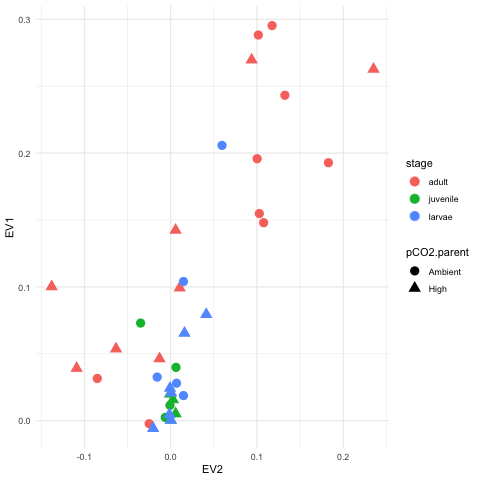

In [68]:
%%R
# uncomment out the ggplotly lines to interact
#ggplotly( 
    ggplot(subset(tab.annot, population=="Dabob Bay"), aes(x=EV2, y=EV1, col=stage, shape=pCO2.parent)) + 
         geom_point(size=4) + theme_minimal() + ggtitle("Dabob Bay")#)

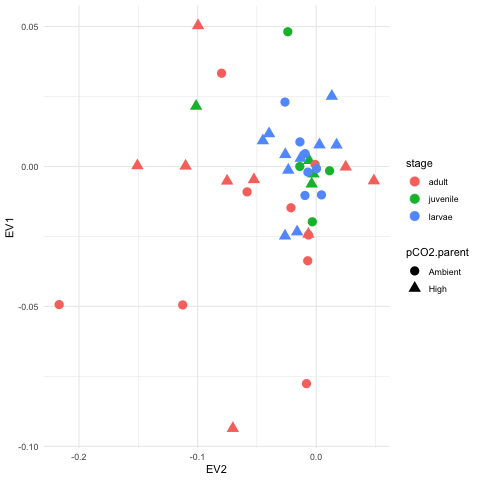

In [69]:
%%R
# uncomment out the ggplotly lines to interact
#ggplotly( 
    ggplot(subset(tab.annot, population=="Fidalgo Bay"), aes(x=EV2, y=EV1, col=stage, shape=pCO2.parent)) + 
         geom_point(size=4) + theme_minimal() + ggtitle("Fidalgo Bay")#)

In [73]:
%%R
# uncomment out the ggplotly lines to interact
#ggplotly( 
    ggplot(subset(tab.annot, population=="Oyster Bay C1"), aes(x=EV2, y=EV1, col=stage, shape=pCO2.parent)) + 
         geom_point(size=3) + theme_minimal() + ggtitle("Oyster Bay Cohort 1")#)

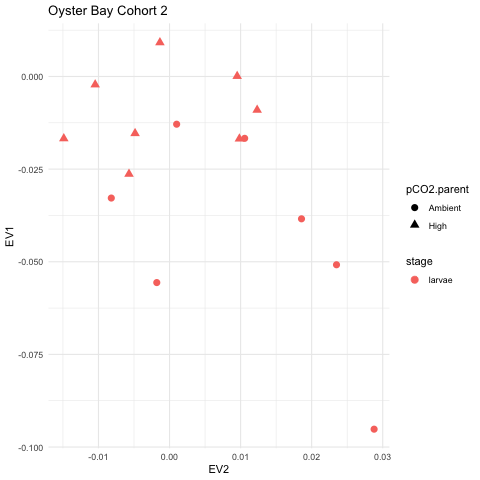

In [75]:
%%R
# uncomment out the ggplotly lines to interact
#ggplotly( 
    ggplot(subset(tab.annot, population=="Oyster Bay C2"), aes(x=EV2, y=EV1, col=stage, shape=pCO2.parent)) + 
         geom_point(size=3) + theme_minimal() + ggtitle("Oyster Bay Cohort 2")#)

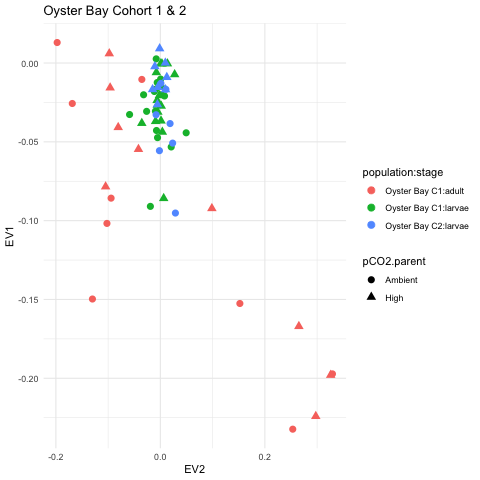

In [84]:
%%R
# uncomment out the ggplotly lines to interact
#ggplotly( 
    ggplot(subset(tab.annot, population=="Oyster Bay C1" | population=="Oyster Bay C2"), aes(x=EV2, y=EV1, col=population:stage, shape=pCO2.parent)) + 
         geom_point(size=3) + theme_minimal() + ggtitle("Oyster Bay Cohort 1 & 2")#)

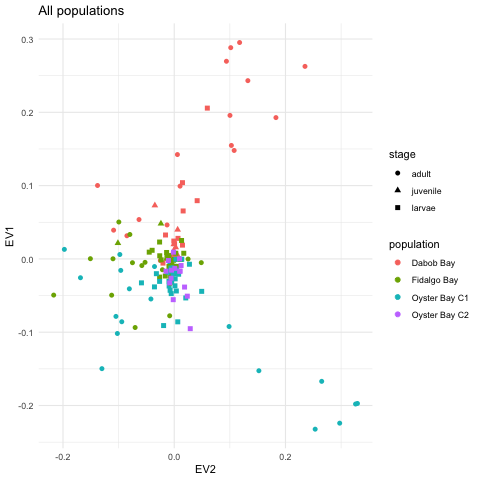

In [87]:
%%R
#ggplotly(
    ggplot(tab.annot, aes(x=EV2, y=EV1, col=population, shape=stage)) + 
         geom_point(size=2) + theme_minimal()+ ggtitle("All populations")#)

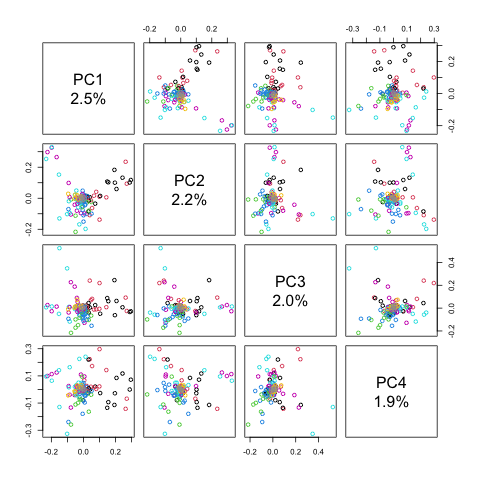

In [88]:
%%R
lbls <- paste("PC", 1:4, "\n", format(pc.percent[1:4], digits=2), "%", sep="")
pairs(pca$eigenvect[,1:4], col=tab.annot$pop_code, labels=lbls)

## Could re-do PCAs for each population. Try doing Fidalgo Bay here. 

In [90]:
%%R
subset(tab.annot, population=="Fidalgo Bay")$sample.id

 [1] "156" "159" "161" "162" "181" "183" "184" "185" "331" "332" "333" "334"
[13] "335" "336" "337" "338" "339" "341" "342" "343" "344" "345" "346" "347"
[25] "348" "349" "441" "442" "443" "444" "445" "451" "452" "453" "461" "462"
[37] "471" "472" "473" "474" "475" "476" "477"


In [93]:
%%R
# PCA - Fidalgo Bay Only
pca.FB <- snpgdsPCA(genofile, snp.id=snpset.id, num.thread=2, autosome.only=FALSE, sample.id=subset(tab.annot, population=="Fidalgo Bay")$sample.id)
pc.percent.FB <- pca.FB$varprop*100
head(round(pc.percent.FB, 2)) #pc axis % variation explained
# make a data.frame from PCA results
tab.FB <- data.frame(sample.id = pca.FB$sample.id,
    EV1 = pca.FB$eigenvect[,1],    # the first eigenvector
    EV2 = pca.FB$eigenvect[,2],    # the second eigenvector
    stringsAsFactors = FALSE)
(tab.annot.FB <- left_join(tab.FB, sample.info, by=c("sample.id"="sample")))
# uncomment out the ggplotly lines to interact
#ggplotly( 
    ggplot(tab.annot.FB, aes(x=EV2, y=EV1, col=stage, shape=pCO2.parent)) + 
    xlab(paste("PC2 ", head(round(pc.percent.FB, 2))[2], "%", sep="")) + 
    ylab(paste("PC1 ", head(round(pc.percent.FB, 2))[1], "%", sep="")) +
         geom_point(size=4) + theme_minimal() + ggtitle("Fidalgo Bay, PCA on that pop only")#)

Principal Component Analysis (PCA) on genotypes:
Excluding 953 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 43
    # of SNPs: 1,389
    using 2 threads
    # of principal components: 32
PCA:    the sum of all selected genotypes (0,1,2) = 9692
CPU capabilities: Double-Precision SSE2
Thu Mar 25 12:00:38 2021    (internal increment: 23528)
[==================================================] 100%, completed, 0s  
Thu Mar 25 12:00:38 2021    Begin (eigenvalues and eigenvectors)
Thu Mar 25 12:00:38 2021    Done.
[1] 5.37 5.13 4.47 4.41 4.04 3.80


Principal Component Analysis (PCA) on genotypes:
Excluding 992 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 37
    # of SNPs: 1,350
    using 2 threads
    # of principal components: 32
PCA:    the sum of all selected genotypes (0,1,2) = 8929
CPU capabilities: Double-Precision SSE2
Thu Mar 25 12:07:25 2021    (internal increment: 27340)
[==================================================] 100%, completed, 0s  
Thu Mar 25 12:07:25 2021    Begin (eigenvalues and eigenvectors)
Thu Mar 25 12:07:25 2021    Done.


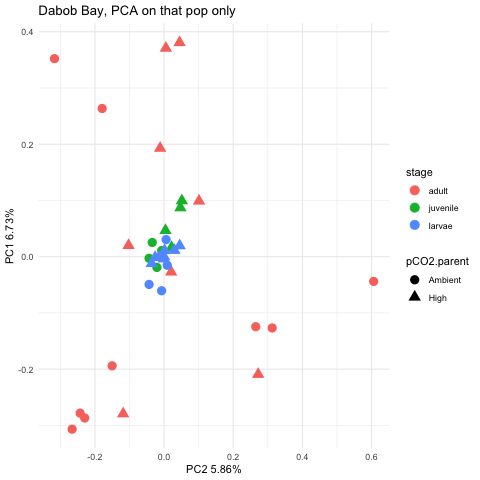

In [103]:
%%R
# PCA - Dabob Bay Only
pca.DB <- snpgdsPCA(genofile, snp.id=snpset.id, num.thread=2, autosome.only=FALSE, sample.id=subset(tab.annot, population=="Dabob Bay")$sample.id)
pc.percent.DB <- pca.DB$varprop*100
head(round(pc.percent.DB, 2)) #pc axis % variation explained
# make a data.frame from PCA results
tab.DB <- data.frame(sample.id = pca.DB$sample.id,
    EV1 = pca.DB$eigenvect[,1],    # the first eigenvector
    EV2 = pca.DB$eigenvect[,2],    # the second eigenvector
    stringsAsFactors = FALSE)
(tab.annot.DB <- left_join(tab.DB, sample.info, by=c("sample.id"="sample")))
# uncomment out the ggplotly lines to interact
#ggplotly( 
    ggplot(tab.annot.DB, aes(x=EV2, y=EV1, col=stage, shape=pCO2.parent)) + 
    xlab(paste("PC2 ", head(round(pc.percent.DB, 2))[2], "%", sep="")) + 
    ylab(paste("PC1 ", head(round(pc.percent.DB, 2))[1], "%", sep="")) +
         geom_point(size=4) + theme_minimal() + ggtitle("Dabob Bay, PCA on that pop only")#)

Principal Component Analysis (PCA) on genotypes:
Excluding 944 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 50
    # of SNPs: 1,398
    using 2 threads
    # of principal components: 32
PCA:    the sum of all selected genotypes (0,1,2) = 10772
CPU capabilities: Double-Precision SSE2
Thu Mar 25 12:07:07 2021    (internal increment: 20232)
[==================================================] 100%, completed, 0s  
Thu Mar 25 12:07:07 2021    Begin (eigenvalues and eigenvectors)
Thu Mar 25 12:07:07 2021    Done.


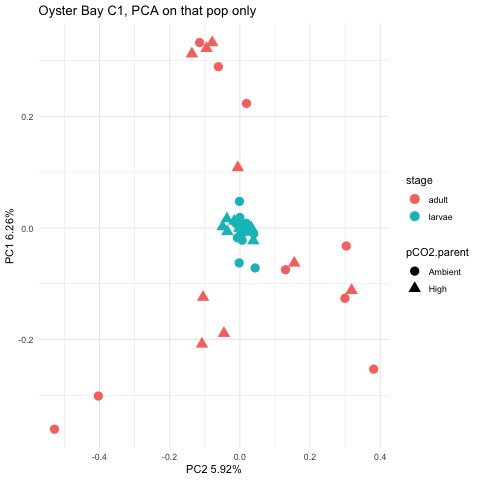

In [102]:
%%R
# PCA - Oyster Bay only 
pca.OB1 <- snpgdsPCA(genofile, snp.id=snpset.id, num.thread=2, autosome.only=FALSE, sample.id=subset(tab.annot, population=="Oyster Bay C1")$sample.id)
pc.percent.OB1 <- pca.OB1$varprop*100
head(round(pc.percent.OB1, 2)) #pc axis % variation explained
# make a data.frame from PCA results
tab.OB1 <- data.frame(sample.id = pca.OB1$sample.id,
    EV1 = pca.OB1$eigenvect[,1],    # the first eigenvector
    EV2 = pca.OB1$eigenvect[,2],    # the second eigenvector
    stringsAsFactors = FALSE)
(tab.annot.OB1 <- left_join(tab.OB1, sample.info, by=c("sample.id"="sample")))
# uncomment out the ggplotly lines to interact
#ggplotly( 
    ggplot(tab.annot.OB1, aes(x=EV2, y=EV1, col=stage, shape=pCO2.parent)) + 
    xlab(paste("PC2 ", head(round(pc.percent.OB1, 2))[2], "%", sep="")) + 
    ylab(paste("PC1 ", head(round(pc.percent.OB1, 2))[1], "%", sep="")) +
         geom_point(size=4) + theme_minimal() + ggtitle("Oyster Bay C1, PCA on that pop only")#)

### Fst Estimation

Compare all 4 groups

In [727]:
%%R
tab

    sample.id           EV1           EV2    stage    population pCO2.parent
1         034 -0.0180445733 -0.0106130473   larvae Oyster Bay C1     Ambient
2         035 -0.0121175965 -0.0033698707   larvae Oyster Bay C1     Ambient
3         037  0.0018245479  0.0074572828   larvae Oyster Bay C1     Ambient
4         039 -0.0322403836  0.0190363119   larvae Oyster Bay C1     Ambient
5         041 -0.0279336282 -0.0100824292   larvae Oyster Bay C1        High
6         043 -0.0203268009 -0.0220771263   larvae Oyster Bay C1        High
7         044  0.0002007830 -0.0012187436   larvae Oyster Bay C1        High
8         045  0.0003966516 -0.0009405959   larvae Oyster Bay C1        High
9         046 -0.0172741919  0.0010995055   larvae Oyster Bay C1        High
10        047 -0.0395449551 -0.0051236669   larvae Oyster Bay C1        High
11        137  0.0672559568  0.0217479386 juvenile     Dabob Bay     Ambient
12        139  0.0208885781 -0.0022685060 juvenile     Dabob Bay     Ambient

In [117]:
%%R

v <- snpgdsFst(genofile, sample.id=head(read.gdsn(index.gdsn(genofile, "sample.id")), -1), 
               population=tab.annot$pop_code,
    method="W&C84", autosome.only=FALSE)

Fst estimation on genotypes:
Excluding 5,748 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 145
    # of SNPs: 18,603
Method: Weir & Cockerham, 1984
# of Populations: 8
    Dabob Bay-Ambient (18), Dabob Bay-High (19), Fidalgo Bay-Ambient (20), Fidalgo Bay-High (23), Oyster Bay C1-Ambient (25), Oyster Bay C1-High (25), Oyster Bay C2-Ambient (7), Oyster Bay C2-High (8)


In [118]:
%%R
paste("Weir and Cockerham weighted Fst estimate: ", round(v$Fst, 5))

[1] "Weir and Cockerham weighted Fst estimate:  0.17517"


In [119]:
%%R
paste("Weir and Cockerham mean Fst estimate: ", round(v$MeanFst, 5))

[1] "Weir and Cockerham mean Fst estimate:  0.1822"


In [120]:
%%R
summary(v$FstSNP)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
 -0.280   0.064   0.152   0.182   0.277   0.945   16792 


In [131]:
%%R
# Fidalgo Bay Adults
v <- snpgdsFst(genofile, sample.id=subset(tab.annot, population=="Fidalgo Bay" & stage!="adult")$sample.id, 
               population=as.factor(subset(tab.annot, population=="Fidalgo Bay" & stage!="adult")$pCO2.parent),
    method="W&C84", autosome.only=FALSE)
paste("Weir and Cockerham mean Fst estimate, FB adults: ", round(v$MeanFst, 5))

Fst estimation on genotypes:
Excluding 19,391 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 25
    # of SNPs: 4,960
Method: Weir & Cockerham, 1984
# of Populations: 2
    Ambient (11), High (14)
[1] "Weir and Cockerham mean Fst estimate, FB adults:  0.16148"


In [132]:
%%R
# Fidalgo Bay Larvae
v <- snpgdsFst(genofile, sample.id=subset(tab.annot, population=="Fidalgo Bay" & stage!="larvae")$sample.id, 
               population=as.factor(subset(tab.annot, population=="Fidalgo Bay" & stage!="larvae")$pCO2.parent),
    method="W&C84", autosome.only=FALSE)
paste("Weir and Cockerham mean Fst estimate, FB larvae: ", round(v$MeanFst, 5))

Fst estimation on genotypes:
Excluding 16,490 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 26
    # of SNPs: 7,861
Method: Weir & Cockerham, 1984
# of Populations: 2
    Ambient (13), High (13)
[1] "Weir and Cockerham mean Fst estimate, FB larvae:  0.16563"


In [133]:
%%R
# Fidalgo Bay Juveniles
v <- snpgdsFst(genofile, sample.id=subset(tab.annot, population=="Fidalgo Bay" & stage!="juvenile")$sample.id, 
               population=as.factor(subset(tab.annot, population=="Fidalgo Bay" & stage!="juvenile")$pCO2.parent),
    method="W&C84", autosome.only=FALSE)
paste("Weir and Cockerham mean Fst estimate, FB juvenile: ", round(v$MeanFst, 5))

Fst estimation on genotypes:
Excluding 15,309 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 35
    # of SNPs: 9,042
Method: Weir & Cockerham, 1984
# of Populations: 2
    Ambient (16), High (19)
[1] "Weir and Cockerham mean Fst estimate, FB juvenile:  0.15197"


In [134]:
%%R
# Dabob Bay Adults
v <- snpgdsFst(genofile, sample.id=subset(tab.annot, population=="Dabob Bay" & stage!="adult")$sample.id, 
               population=as.factor(subset(tab.annot, population=="Dabob Bay" & stage!="adult")$pCO2.parent),
    method="W&C84", autosome.only=FALSE)
paste("Weir and Cockerham mean Fst estimate, DB adults: ", round(v$MeanFst, 5))

Fst estimation on genotypes:
Excluding 20,055 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 20
    # of SNPs: 4,296
Method: Weir & Cockerham, 1984
# of Populations: 2
    Ambient (9), High (11)
[1] "Weir and Cockerham mean Fst estimate, DB adults:  0.19621"


In [135]:
%%R
# Dabob Bay Larvae
v <- snpgdsFst(genofile, sample.id=subset(tab.annot, population=="Dabob Bay" & stage!="larvae")$sample.id, 
               population=as.factor(subset(tab.annot, population=="Dabob Bay" & stage!="larvae")$pCO2.parent),
    method="W&C84", autosome.only=FALSE)
paste("Weir and Cockerham mean Fst estimate, DB larvae: ", round(v$MeanFst, 5))

Fst estimation on genotypes:
Excluding 15,876 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 25
    # of SNPs: 8,475
Method: Weir & Cockerham, 1984
# of Populations: 2
    Ambient (13), High (12)
[1] "Weir and Cockerham mean Fst estimate, DB larvae:  0.14978"


In [136]:
%%R
# Dabob Bay Juveniles
v <- snpgdsFst(genofile, sample.id=subset(tab.annot, population=="Dabob Bay" & stage!="juvenile")$sample.id, 
               population=as.factor(subset(tab.annot, population=="Dabob Bay" & stage!="juvenile")$pCO2.parent),
    method="W&C84", autosome.only=FALSE)
paste("Weir and Cockerham mean Fst estimate, DB juvenile: ", round(v$MeanFst, 5))

Fst estimation on genotypes:
Excluding 15,467 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 29
    # of SNPs: 8,884
Method: Weir & Cockerham, 1984
# of Populations: 2
    Ambient (14), High (15)
[1] "Weir and Cockerham mean Fst estimate, DB juvenile:  0.14458"


In [137]:
%%R
# Oyster Bay C1 Adults
v <- snpgdsFst(genofile, sample.id=subset(tab.annot, population=="Oyster Bay C1" & stage!="adult")$sample.id, 
               population=as.factor(subset(tab.annot, population=="Oyster Bay C1" & stage!="adult")$pCO2.parent),
    method="W&C84", autosome.only=FALSE)
paste("Weir and Cockerham mean Fst estimate, OB1 adults: ", round(v$MeanFst, 5))

Fst estimation on genotypes:
Excluding 19,195 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 32
    # of SNPs: 5,156
Method: Weir & Cockerham, 1984
# of Populations: 2
    Ambient (16), High (16)
[1] "Weir and Cockerham mean Fst estimate, OB1 adults:  0.13941"


In [138]:
%%R
# Oyster Bay C1 Larvae
v <- snpgdsFst(genofile, sample.id=subset(tab.annot, population=="Oyster Bay C1" & stage!="larvae")$sample.id, 
               population=as.factor(subset(tab.annot, population=="Oyster Bay C1" & stage!="larvae")$pCO2.parent),
    method="W&C84", autosome.only=FALSE)
paste("Weir and Cockerham mean Fst estimate, OB1 larvae: ", round(v$MeanFst, 5))

Fst estimation on genotypes:
Excluding 17,456 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 18
    # of SNPs: 6,895
Method: Weir & Cockerham, 1984
# of Populations: 2
    Ambient (9), High (9)
[1] "Weir and Cockerham mean Fst estimate, OB1 larvae:  0.12589"


In [139]:
%%R
# Oyster Bay C1 Juveniles
v <- snpgdsFst(genofile, sample.id=subset(tab.annot, population=="Oyster Bay C1" & stage!="juvenile")$sample.id, 
               population=as.factor(subset(tab.annot, population=="Oyster Bay C1" & stage!="juvenile")$pCO2.parent),
    method="W&C84", autosome.only=FALSE)
paste("Weir and Cockerham mean Fst estimate, OB1 juvenile: ", round(v$MeanFst, 5))

Fst estimation on genotypes:
Excluding 13,857 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 50
    # of SNPs: 10,494
Method: Weir & Cockerham, 1984
# of Populations: 2
    Ambient (25), High (25)
[1] "Weir and Cockerham mean Fst estimate, OB1 juvenile:  0.12257"


### Identity-By-State Analysis 

In [151]:
%%R
ibs <- snpgdsIBS(genofile, num.thread=2, autosome.only=FALSE, remove.monosnp=TRUE,
                sample.id=head(read.gdsn(index.gdsn(genofile, "sample.id")), -1))

Identity-By-State (IBS) analysis on genotypes:
Excluding 5,748 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 145
    # of SNPs: 18,603
    using 2 threads
IBS:    the sum of all selected genotypes (0,1,2) = 244569
Thu Mar 25 13:14:34 2021    (internal increment: 65536)
[==================================================] 100%, completed, 0s  
Thu Mar 25 13:14:34 2021    Done.


In [141]:
%%R
ncol(ibs$ibs)

[1] 145


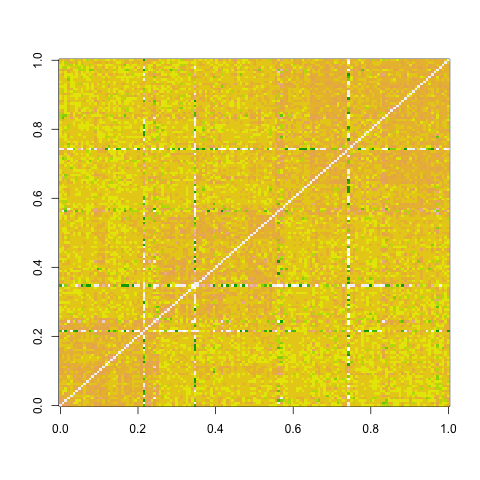

In [152]:
%%R
# heat map code from the SNPRelate tutorial - but don't know which samples are which! 
pop.idx <- order(tab.annot$pop_code)
image(ibs$ibs[pop.idx, pop.idx], col=terrain.colors(16))

In [153]:
%%R
levels(tab.annot$pop_code)

[1] "Dabob Bay-Ambient"     "Dabob Bay-High"        "Fidalgo Bay-Ambient"  
[4] "Fidalgo Bay-High"      "Oyster Bay C1-Ambient" "Oyster Bay C1-High"   
[7] "Oyster Bay C2-Ambient" "Oyster Bay C2-High"   


In [144]:
%%R
c("#a6cee3","#1f78b4","#b2df8a","#33a02c",
"#fb9a99","#e31a1c","#fdbf6f","#ff7f00")[tab.annot$pop_code]

  [1] "#fb9a99" "#fb9a99" "#fb9a99" "#fb9a99" "#e31a1c" "#e31a1c" "#e31a1c"
  [8] "#e31a1c" "#e31a1c" "#e31a1c" "#a6cee3" "#a6cee3" "#a6cee3" "#a6cee3"
 [15] "#b2df8a" "#b2df8a" "#b2df8a" "#b2df8a" "#1f78b4" "#1f78b4" "#1f78b4"
 [22] "#1f78b4" "#33a02c" "#33a02c" "#33a02c" "#33a02c" "#1f78b4" "#1f78b4"
 [29] "#1f78b4" "#1f78b4" "#1f78b4" "#1f78b4" "#1f78b4" "#1f78b4" "#a6cee3"
 [36] "#a6cee3" "#a6cee3" "#a6cee3" "#a6cee3" "#a6cee3" "#a6cee3" "#a6cee3"
 [43] "#a6cee3" "#e31a1c" "#e31a1c" "#e31a1c" "#e31a1c" "#e31a1c" "#e31a1c"
 [50] "#e31a1c" "#e31a1c" "#e31a1c" "#fb9a99" "#fb9a99" "#fb9a99" "#fb9a99"
 [57] "#fb9a99" "#fb9a99" "#fb9a99" "#fb9a99" "#fb9a99" "#33a02c" "#33a02c"
 [64] "#33a02c" "#33a02c" "#33a02c" "#33a02c" "#33a02c" "#33a02c" "#33a02c"
 [71] "#b2df8a" "#b2df8a" "#b2df8a" "#b2df8a" "#b2df8a" "#b2df8a" "#b2df8a"
 [78] "#b2df8a" "#b2df8a" "#a6cee3" "#a6cee3" "#a6cee3" "#a6cee3" "#1f78b4"
 [85] "#1f78b4" "#1f78b4" "#1f78b4" "#a6cee3" "#1f78b4" "#1f78b4" "#1f78b4"
 [92] "#b2df

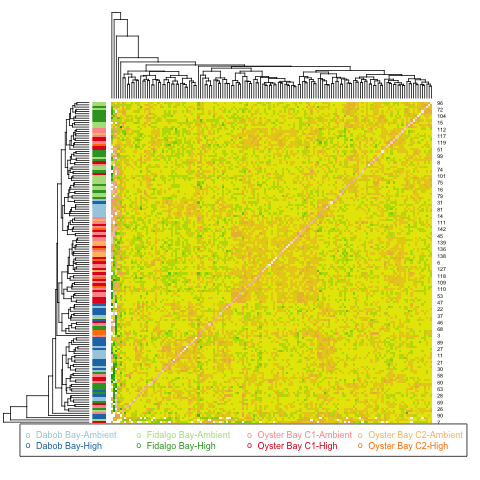

In [154]:
%%R
#so here is my own code showing sample 
par(xpd=TRUE)
heatmap(ibs$ibs, col=terrain.colors(16), labCol=TRUE, 
        RowSideColors=c("#a6cee3","#1f78b4","#b2df8a","#33a02c","#fb9a99","#e31a1c","#fdbf6f","#ff7f00")[tab.annot$pop_code])
legend(-.1,-.05, legend=levels(tab.annot$pop_code), 
       pch="o", col=c("#a6cee3","#1f78b4","#b2df8a","#33a02c","#fb9a99","#e31a1c","#fdbf6f","#ff7f00"), 
       text.col=c("#a6cee3","#1f78b4","#b2df8a","#33a02c","#fb9a99","#e31a1c","#fdbf6f","#ff7f00"), cex=.75, ncol=4)

# Colony analysis

## Prepare files for Colony sibship analysis

Colony identifies siblings, which I would like to do with my juveniles. Here I prepare files for Colony.

Mac suggested that I only keep SNPs with very high minor allele frequencies (AF <30%). Here I create a new .vcf with that filter. 

NOTE: need to have the concatenated and re-headed fasta, including the associated .dict file. 

In [223]:
cd /Volumes/Bumblebee/O.lurida_QuantSeq-2020/notebooks/

/Volumes/Bumblebee/O.lurida_QuantSeq-2020/notebooks


In [254]:
! {gatk} VariantFiltration \
-R ../references/Olurida_v081_concat_rehead.fa \
-V ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-filtered-true.vcf \
-O ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-4Colony.vcf.gz \
#--filter-name "DP15" \
#--filter "DP < 15" \
#--filter-name "DP150" \
#--filter "DP > 150" \
--filter-name "AF20" \
--filter "AF < 0.3"

Using GATK jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar VariantFiltration -R ../references/Olurida_v081_concat_rehead.fa -V ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-filtered-true.vcf -O ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-4Colony.vcf.gz
14:51:27.536 INFO  NativeLibraryLoader - Loading libgkl_compression.dylib from jar:file:/Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar!/com/intel/gkl/native/libgkl_compression.dylib
Mar 25, 2021 2:51:27 PM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running on Google Compute Engine.
14:51:27.910 INFO  VariantFiltration - --------------------

In [346]:
# Now create another filtered .vcf that selects adults only, max no-call is and excludes any variants not meeting the above hard-filter settings 
! {gatk} SelectVariants \
-R ../references/Olurida_v081_concat_rehead.fa \
-V ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-4Colony.vcf.gz \
--exclude-filtered TRUE \
--exclude-sample-name 571 \
--max-nocall-fraction 0.75 \
-O ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-4Colony-filteredtrue.vcf.gz

Using GATK jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar SelectVariants -R ../references/Olurida_v081_concat_rehead.fa -V ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-4Colony.vcf.gz --exclude-filtered TRUE --exclude-sample-name 571 --max-nocall-fraction 0.75 -O ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-4Colony-filteredtrue.vcf.gz
15:37:20.528 INFO  NativeLibraryLoader - Loading libgkl_compression.dylib from jar:file:/Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar!/com/intel/gkl/native/libgkl_compression.dylib
Mar 25, 2021 3:37:20 PM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we are running o

15:37:24.594 INFO  ProgressMeter - Contig92931_98526:30234527              0.1                 27523         460379.1
15:37:24.594 INFO  ProgressMeter - Traversal complete. Processed 27523 total variants in 0.1 minutes.
15:37:24.617 INFO  SelectVariants - Shutting down engine
[March 25, 2021 at 3:37:24 PM PDT] org.broadinstitute.hellbender.tools.walkers.variantutils.SelectVariants done. Elapsed time: 0.07 minutes.
Runtime.totalMemory()=465567744


In [347]:
! zgrep "^Contig" ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-4Colony.vcf.gz | wc -l 
! zgrep "PASS" ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-4Colony.vcf.gz | wc -l 
! zgrep "^Contig" ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-4Colony-filteredtrue.vcf.gz | wc -l 
! zgrep "PASS" ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-4Colony-filteredtrue.vcf.gz | wc -l 

   27523
   27524
    1713
    1714


In [348]:
! gzip -dkf ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-4Colony-filteredtrue.vcf.gz

In [349]:
%%R
# 
vcf.fn.colony <- "../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-4Colony-filteredtrue.vcf"
vcf.fn.colony

[1] "../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-4Colony-filteredtrue.vcf"


In [350]:
%%R
# if you get an error with the next chunk, run this one 
snpgdsClose(genofile4Colony)

In [351]:
%%R
# Reformat - note, can't re-run this chucnk
snpgdsVCF2GDS(vcf.fn.colony, "../qc-processing/colony/all4Colony.gds", method="biallelic.only")

Start file conversion from VCF to SNP GDS ...
Method: exacting biallelic SNPs
Number of samples: 145
Parsing "../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-4Colony-filteredtrue.vcf" ...
	import 818 variants.
+ genotype   { Bit2 145x818, 29.0K } *
Optimize the access efficiency ...
Clean up the fragments of GDS file:
    open the file '../qc-processing/colony/all4Colony.gds' (38.6K)
    # of fragments: 46
    save to '../qc-processing/colony/all4Colony.gds.tmp'
    rename '../qc-processing/colony/all4Colony.gds.tmp' (38.3K, reduced: 312B)
    # of fragments: 20


In [352]:
%%R
# View summary 
snpgdsSummary("../qc-processing/colony/all4Colony.gds")

The file name: /Volumes/Bumblebee/O.lurida_QuantSeq-2020/qc-processing/colony/all4Colony.gds 
The total number of samples: 145 
The total number of SNPs: 818 
SNP genotypes are stored in SNP-major mode (Sample X SNP).


In [353]:
%%R
#open gds and check out genofile contents 
(genofile4Colony <- snpgdsOpen("../qc-processing/colony/all4Colony.gds"))

File: /Volumes/Bumblebee/O.lurida_QuantSeq-2020/qc-processing/colony/all4Colony.gds (38.3K)
+    [  ] *
|--+ sample.id   { Str8 145 LZMA_ra(41.7%), 249B }
|--+ snp.id   { Int32 818 LZMA_ra(19.4%), 641B }
|--+ snp.rs.id   { Str8 818 LZMA_ra(11.0%), 97B }
|--+ snp.position   { Int32 818 LZMA_ra(80.0%), 2.6K }
|--+ snp.chromosome   { Str8 818 LZMA_ra(2.94%), 429B }
|--+ snp.allele   { Str8 818 LZMA_ra(20.7%), 685B }
|--+ genotype   { Bit2 145x818, 29.0K } *
\--+ snp.annot   [  ]
   |--+ qual   { Float32 818 LZMA_ra(83.9%), 2.7K }
   \--+ filter   { Str8 818 LZMA_ra(2.69%), 117B }


In [354]:
%%R
# Prune SNPs in linkage-disequilibrium 
snpset4Colony <- snpgdsLDpruning(genofile4Colony, ld.threshold=0.2, autosome.only=FALSE)

SNP pruning based on LD:
Excluding 1 SNP (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 145
    # of SNPs: 817
    using 1 thread
    sliding window: 500,000 basepairs, Inf SNPs
    |LD| threshold: 0.2
    method: composite
Chromosome Contig0_5313: 66.36%, 73/110
Chromosome Contig104153_109739: 75.00%, 9/12
Chromosome Contig109741_116186: 100.00%, 7/7
Chromosome Contig11179_21262: 71.25%, 57/80
Chromosome Contig116188_123130: 85.71%, 6/7
Chromosome Contig123131_129982: 60.00%, 3/5
Chromosome Contig129983_136896: 100.00%, 7/7
Chromosome Contig136897_143777: 100.00%, 4/4
Chromosome Contig143780_150710: 85.71%, 6/7
Chromosome Contig150711_166372: 77.78%, 7/9
Chromosome Contig166374_181896: 100.00%, 7/7
Chromosome Contig181898_197428: 100.00%, 7/7
Chromosome Contig197431_213218: 83.33%, 5/6
Chromosome Contig21263_28135: 75.82%, 69/91
Chromosome Contig213221_398012: 71.43%, 5/7
Chromosome Contig28136_34745: 62.07%, 54/87
Chromosome Contig34748_41067: 73.13%, 49/67
Chromo

## 602 markers in total

In [355]:
%%R
snpset4Colony.id <- unlist(unname(snpset4Colony))
head(snpset4Colony.id)

[1] 1 2 3 4 6 7


In [357]:
%%R
# Extract genotypes for LD-pruned SNPs, then save to file 
snpgdsCreateGenoSet(src.fn="../qc-processing/colony/all4Colony.gds",
                    dest.fn="../qc-processing/colony/all4Colony-pruned.gds",
                    snp.id=snpset4Colony.id)

Create a GDS genotype file:
The new dataset consists of 145 samples and 603 SNPs
    write sample.id
    write snp.id
    write snp.rs.id
    write snp.position
    write snp.chromosome
    write snp.allele
SNP genotypes are stored in SNP-major mode (Sample X SNP).


In [358]:
%%R
geno.matrix4Colony <- snpgdsGetGeno(gdsobj="../qc-processing/colony/all4Colony-pruned.gds", with.id=TRUE)

Genotype matrix: 145 samples X 603 SNPs


In [371]:
%%R
str(geno.matrix4Colony)

List of 3
 $ genotype : int [1:145, 1:603] NA NA NA 2 NA NA NA NA NA NA ...
 $ sample.id: chr [1:145] "034" "035" "037" "039" ...
 $ snp.id   : int [1:603] 1 2 3 4 6 7 9 13 14 15 ...
    V1 V2 V3 V4 V5 V6 V7 V8 V9 V10 V11 V12 V13 V14 V15 V16 V17 V18 V19 V20 V21
1   NA NA NA NA NA NA NA NA NA   2  NA  NA  NA  NA  NA  NA  NA  NA   2  NA  NA
2   NA NA NA NA NA NA NA NA NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA
3   NA NA NA NA NA NA NA NA NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA
4    2 NA  2 NA  1 NA NA NA NA   2   2  NA   2  NA  NA  NA  NA  NA  NA  NA  NA
5   NA NA NA  2 NA NA NA NA NA  NA  NA  NA  NA  NA   0  NA  NA  NA  NA  NA  NA
6   NA NA NA NA  0 NA NA NA  0   1  NA  NA  NA  NA  NA  NA   2  NA   0  NA   2
7   NA NA NA NA NA NA NA NA NA  NA  NA  NA  NA  NA  NA  NA  NA  NA   2  NA  NA
8   NA NA NA NA NA NA NA NA NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA
9   NA NA NA  2 NA NA NA NA NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA
10  NA NA  2 NA NA  0 NA  2

61    1   2   2  NA  NA   2   2   2  NA  NA  NA  NA   2   0   1  NA  NA   1   2
62    2  NA   0  NA   2   2  NA  NA  NA  NA   2   2  NA   0   2   2   2  NA   0
63    2   2  NA  NA  NA   2  NA  NA   2   1  NA  NA  NA  NA   0  NA   2  NA   0
64    1   2  NA  NA  NA  NA   2   2   2  NA   2  NA  NA   2   2  NA  NA  NA   2
65   NA  NA  NA  NA  NA   2   2  NA   0  NA   0  NA   2   0  NA  NA  NA  NA   0
66   NA   2  NA  NA  NA  NA  NA  NA  NA   2  NA  NA   0  NA   2  NA   2   2   2
67    0  NA   2  NA  NA   0  NA   2   1  NA   2   2   2  NA  NA  NA  NA   2   0
68   NA   2  NA   0  NA  NA   2   2   0   2  NA   0  NA   2  NA  NA   1   0  NA
69    2   2  NA  NA   2  NA   0  NA   0  NA   1   0   1   2   1   0   2   2  NA
70    2  NA  NA   2  NA   2  NA  NA  NA  NA   2   2  NA  NA  NA  NA  NA   0  NA
71   NA   0   2  NA   2  NA   2  NA  NA   0   2   2   0   0  NA   2   2   2  NA
72   NA   0  NA  NA   2   2  NA  NA   0  NA  NA   0  NA  NA  NA   2   1  NA  NA
73   NA  NA  NA   2   2   0  NA   2   0 

13   NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA   2   2   2  NA
14   NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA
15   NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA   0
16   NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA   2   2
17   NA  NA  NA  NA  NA   2  NA   2   0   2  NA   0   2   2  NA  NA   1   2   0
18   NA  NA  NA   2  NA  NA   0  NA   0  NA   2   2   2  NA  NA  NA   1   2   1
19   NA  NA  NA  NA  NA  NA  NA  NA  NA  NA   0  NA  NA  NA  NA  NA  NA  NA  NA
20   NA  NA   2  NA  NA  NA  NA   0  NA  NA   0   2   0  NA  NA   0  NA  NA  NA
21   NA  NA  NA  NA  NA  NA  NA  NA  NA  NA   1  NA   1  NA  NA  NA  NA  NA  NA
22   NA   2  NA  NA  NA  NA  NA   2  NA  NA  NA  NA  NA  NA   2  NA  NA  NA  NA
23   NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA   2  NA   2  NA   2
30    2  NA  NA  NA  NA  NA  NA  NA  NA  NA  NA   2  NA   0   2  NA  NA  NA  NA
31    1  NA  NA   2  NA   1  NA   2   1 

12   NA  NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
13    2  NA    2   NA   NA   NA    0    2   NA   NA    2   NA   NA    2   NA
14   NA  NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
15   NA  NA   NA    2   NA   NA   NA   NA   NA   NA   NA   NA    2   NA   NA
16   NA  NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA    2   NA
17   NA  NA   NA   NA   NA   NA    0   NA   NA   NA   NA    2   NA   NA   NA
18    2  NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA    2   NA
19   NA  NA   NA   NA    2   NA   NA   NA   NA   NA   NA   NA    2   NA   NA
20   NA  NA   NA   NA    2   NA   NA   NA   NA   NA   NA   NA    2    0    2
21   NA  NA   NA    0    0   NA   NA   NA    2   NA   NA   NA    0   NA   NA
22   NA  NA   NA    0    2   NA   NA    2   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA    0   NA    2   NA
28   NA  NA    0   NA   NA   NA   NA    2   NA   NA   NA    2   NA   NA   NA
29   NA  NA   NA   NA   NA   NA   NA    0

141   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA    0
142    0   NA   NA   NA   NA   NA    1   NA   NA   NA   NA   NA   NA   NA   NA
143   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA    0
144    0   NA   NA   NA   NA   NA    1    2   NA    2    2    1   NA   NA    1
145    1   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
    V128 V129 V130 V131 V132 V133 V134 V135 V136 V137 V138 V139 V140 V141 V142
1     NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
2     NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
3     NA   NA   NA   NA   NA   NA    0   NA   NA   NA   NA   NA   NA   NA   NA
4     NA   NA   NA   NA    2   NA    2   NA   NA   NA   NA   NA    2    0   NA
5     NA   NA   NA   NA   NA   NA    2   NA    0   NA   NA    2   NA   NA   NA
6     NA    2    2    0   NA   NA    2    2   NA    2    2    2    2    2   NA
7     NA   NA   NA   NA   NA   NA   NA   NA   NA   N

108   NA    2    0   NA    0   NA   NA    1   NA   NA    1   NA   NA    2    1
109   NA   NA   NA    0   NA   NA   NA   NA    0   NA    2   NA   NA   NA    0
110   NA   NA   NA   NA   NA   NA   NA   NA    0   NA   NA   NA   NA    2    2
115   NA   NA    2   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
116   NA    2   NA   NA   NA    2    1   NA   NA   NA    2   NA   NA    1   NA
117   NA   NA   NA   NA    1    0   NA    1   NA   NA   NA   NA   NA    1    1
118    0   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
119   NA    0   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
120   NA   NA   NA   NA   NA   NA   NA   NA    0   NA   NA   NA   NA   NA   NA
121   NA    2   NA    1   NA   NA    2   NA   NA    2   NA   NA   NA   NA   NA
122   NA    1   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA    0
123   NA    0   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
124   NA   NA   NA    0    2    2   NA    0    0   N

61    NA    0    2   NA   NA    0    2   NA    2    0    2   NA   NA    0   NA
62    NA   NA   NA   NA   NA   NA   NA    0   NA   NA    1   NA   NA   NA   NA
63    NA   NA   NA   NA   NA   NA   NA   NA    0   NA   NA    1   NA   NA   NA
64     2    2   NA   NA    2   NA    2   NA   NA   NA    2   NA    2   NA   NA
65    NA   NA    2    0   NA    0   NA   NA   NA    0    0    2   NA    0   NA
66    NA   NA   NA    2    0   NA   NA   NA    2   NA    0   NA   NA   NA    2
67    NA   NA   NA    0   NA    1   NA   NA   NA    2   NA   NA   NA    1    2
68    NA   NA    0   NA   NA   NA    0    2    1   NA   NA   NA    2   NA   NA
69    NA    2    2    0   NA    2    2   NA    2   NA   NA   NA   NA   NA   NA
70    NA   NA    2    2   NA   NA    2    2    0   NA   NA    0   NA   NA   NA
71    NA   NA   NA    0   NA   NA    2   NA    0   NA    0   NA   NA   NA   NA
72    NA   NA    2    1    2   NA   NA    2   NA    2   NA   NA   NA   NA   NA
73    NA    2    2   NA   NA   NA    0    2    2   N

143    2    2    1   NA    0   NA   NA   NA   NA    2   NA   NA   NA    1   NA
144   NA    2   NA   NA   NA    2    2   NA   NA   NA   NA   NA    0    1    0
145    0    1   NA   NA   NA   NA   NA   NA    1   NA   NA   NA   NA   NA   NA
    V203 V204 V205 V206 V207 V208 V209 V210 V211 V212 V213 V214 V215 V216 V217
1     NA   NA    2   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
2     NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA    2
3     NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
4     NA    2   NA   NA   NA    2    0   NA    2   NA    0   NA   NA   NA   NA
5     NA    2   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
6     NA   NA   NA    0   NA    2    1   NA    2    2    0   NA    0    2   NA
7     NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
8     NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA    1
9     NA    2   NA   NA   NA   NA   NA   NA   NA   N

105    2   NA    2   NA   NA    1   NA   NA   NA    1   NA   NA   NA   NA    1
106   NA   NA    1   NA   NA   NA   NA   NA    0    1    0   NA   NA   NA    2
107   NA   NA    0   NA   NA    2   NA   NA   NA    0   NA   NA   NA   NA   NA
108   NA    0    0   NA    2    2   NA   NA    1    0    2    2   NA    2    0
109   NA   NA   NA   NA   NA    2   NA   NA   NA    2    2   NA   NA   NA    1
110   NA   NA   NA   NA   NA   NA   NA   NA    0   NA   NA   NA   NA   NA   NA
111   NA   NA    2   NA    1    2   NA   NA   NA   NA   NA   NA    2   NA   NA
112   NA    0    2   NA    0   NA   NA    2   NA   NA   NA    0   NA    0   NA
113   NA   NA    1    0   NA    2   NA    0   NA    0   NA    2   NA   NA    2   NA
120   NA   NA    2   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
121    0   NA   NA   NA    1    0   NA    2   NA   NA    2   NA   NA    2   NA
122   NA   NA   NA   NA   NA    2   NA   NA    2   NA   NA   NA   NA   NA    0
123   NA   NA   NA   NA    2   NA   NA   NA   N

70    NA   NA    1   NA   NA   NA    2    0   NA   NA   NA    0    0   NA   NA
71    NA    0   NA    0   NA   NA   NA    2   NA   NA   NA   NA    2   NA   NA
72    NA    0    2    1    2   NA   NA   NA   NA   NA   NA    2   NA   NA    0
73    NA    0    0    2    2   NA    2   NA   NA   NA   NA   NA    0    2   NA
74    NA    0   NA    2    0   NA   NA   NA   NA    0   NA   NA   NA    2   NA
75    NA    0    2   NA    2   NA    2   NA   NA    2   NA    1   NA   NA   NA
76     0   NA    2   NA   NA   NA    0   NA   NA   NA   NA    0   NA    2    0
77    NA   NA    2    2    2    0    2   NA   NA    2    0    2   NA   NA   NA
78     2   NA    2    0   NA   NA   NA    0   NA    2    0   NA    2   NA    0
79    NA   NA   NA   NA    0   NA   NA   NA   NA    0   NA   NA   NA   NA   NA
80     2   NA   NA   NA   NA    1   NA   NA   NA   NA   NA   NA   NA   NA   NA
81    NA   NA    0    2   NA   NA   NA   NA    2   NA   NA    2   NA    1    2
82     2   NA    2   NA   NA   NA   NA    1    2    

50     2   NA   NA   NA   NA    2   NA   NA   NA    2    0   NA    0   NA    2
51    NA    2    0   NA   NA    0   NA   NA    2   NA    2   NA   NA   NA    2
52    NA    0   NA   NA    2   NA    0   NA   NA    0   NA   NA   NA   NA    2    2
83    NA   NA   NA   NA    2   NA    2    0    0   NA   NA   NA   NA   NA   NA
84     1   NA    1   NA    2   NA   NA   NA   NA   NA    2   NA   NA   NA   NA
85    NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
86    NA   NA    2   NA    2   NA   NA    2   NA   NA   NA   NA    0   NA   NA
87    NA   NA    2   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA    2
88     1    0    2    1    2   NA    1    2   NA    2   NA   NA    2   NA   NA
89    NA   NA   NA   NA   NA   NA   NA   NA   NA   NA    2   NA   NA   NA   NA
90    NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
91    NA    0   NA    1   NA   NA   NA    0   NA    2   NA   NA   NA   NA   NA
92    NA   NA   NA   NA   NA   NA   NA   NA   N

41     2   NA   NA    2    1   NA   NA   NA   NA    1   NA    2   NA   NA   NA
42     1   NA   NA    0    0    1    1    2    1   NA   NA   NA   NA    2   NA
43    NA   NA   NA   NA    2   NA   NA    2   NA   NA   NA   NA    2    2    2
44    NA   NA   NA    2    2   NA    0   NA   NA    2   NA    2   NA    0    0
45    NA   NA   NA   NA   NA    2   NA    2   NA   NA    1    2   NA    1   NA
46    NA   NA    2   NA    0   NA    2    2   NA    2    0   NA   NA    1    1
47    NA   NA    2   NA   NA    2   NA    2   NA   NA   NA    2   NA    0   NA
48    NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA    2   NA
49    NA   NA   NA   NA    0    2   NA    2    1   NA    1    2   NA    0    2
50     0   NA    2   NA   NA    2   NA   NA   NA    0    1   NA    0   NA   NA
51     0   NA   NA   NA    2   NA   NA   NA    0    0    0    2   NA    0   NA
52    NA   NA   NA   NA    0    0   NA    2   NA   NA   NA    2   NA    0   NA
53     0   NA   NA    2    0    2   NA    2    2   N

6     NA   NA   NA   NA   NA    0   NA   NA    2   NA   NA   NA   NA   NA   NA
7     NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
8     NA   NA   NA   NA   NA   NA   NA    0   NA   NA   NA   NA   NA   NA    0
9     NA   NA    1   NA   NA   NA   NA   NA    0    0   NA   NA   NA   NA   NA
10    NA   NA    1   NA    2   NA   NA    2    0   NA   NA   NA   NA    1    0
11    NA   NA    0   NA    0   NA   NA   NA   NA    0    2    2   NA    1   NA
12     2   NA   NA   NA   NA   NA   NA   NA   NA   NA    0   NA   NA   NA   NA
13     2    2   NA   NA    0   NA    2   NA   NA   NA   NA    1   NA    2   NA
14     2    2   NA   NA   NA   NA    2   NA   NA   NA    2    0   NA   NA   NA
15    NA    2   NA   NA    2   NA   NA   NA    2   NA   NA    1   NA    2   NA
16    NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA    2   NA   NA    2
17     0   NA   NA   NA   NA   NA    2    2    2    2    2    2   NA    0    2
18     0    1   NA   NA    1   NA   NA   NA   NA   N

106    1   NA    1   NA   NA    1   NA    0   NA   NA   NA   NA   NA   NA    0
107   NA   NA   NA   NA   NA    1   NA    2   NA   NA   NA   NA   NA   NA    0
108   NA    1   NA    0    1   NA   NA   NA    2    2   NA   NA   NA    2   NA
109   NA   NA   NA    0    2   NA   NA   NA    2   NA   NA   NA   NA   NA   NA
110   NA   NA   NA   NA   NA    0   NA   NA   NA   NA   NA   NA   NA   NA   NA
111   NA   NA   NA   NA   NA    2   NA   NA   NA    2   NA   NA    2    1   NA
112   NA   NA   NA    1   NA   NA   NA   NA    0    0   NA    0    0   NA    0
113    2    0   NA   NA   NA    0    2   NA   NA    2   NA    0    1    1   NA
114   NA   NA    2    2   NA   NA   NA   NA    2   NA   NA    1   NA    2    1
115   NA   NA    1   NA    2   NA   NA    2   NA   NA   NA   NA   NA   NA    1
116   NA    2   NA    1   NA    2   NA    2    1   NA    2   NA   NA    0    2
117   NA    1   NA   NA   NA   NA    2    0    0    0   NA   NA   NA    2   NA
118   NA   NA   NA   NA   NA    1   NA   NA   NA   N

40     2   NA   NA   NA   NA   NA    0   NA   NA   NA   NA   NA    2    2   NA
41    NA   NA   NA   NA   NA    0    0   NA    0   NA    2    1    1    0    0
42    NA   NA   NA   NA   NA   NA   NA    0    2    2    2   NA    1   NA   NA
43    NA   NA   NA   NA   NA   NA   NA    2    2    0   NA    0   NA    0   NA
44    NA   NA   NA   NA    0   NA   NA   NA    2    2   NA   NA    1    2    2
45    NA   NA   NA   NA   NA   NA    2   NA   NA   NA   NA   NA    2    0    1
46    NA   NA   NA   NA   NA   NA   NA   NA    2    0   NA   NA    1    2    0
47    NA   NA   NA   NA    1   NA   NA   NA   NA   NA   NA   NA   NA   NA    0
48    NA   NA   NA   NA   NA   NA    2   NA    2   NA   NA   NA   NA    0   NA
49    NA   NA   NA   NA   NA   NA   NA   NA    1    2   NA   NA    2   NA   NA
50    NA   NA   NA   NA    1   NA   NA   NA    0   NA   NA   NA   NA   NA   NA
51    NA   NA   NA   NA   NA    2    2   NA    0    2    0   NA   NA   NA   NA
52    NA   NA   NA   NA   NA    2   NA   NA   NA   N

3     NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
4      2   NA    2   NA   NA   NA
19    NA   NA   NA   NA   NA   NA   NA   NA   NA   NA    2    0    2   NA    2
20     2    2   NA   NA    2   NA    0   NA   NA   NA   NA    0   NA   NA    2
21    NA    2   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA    2   NA   NA
22    NA   NA   NA   NA    2   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
23    NA    0   NA   NA   NA   NA   NA   NA   NA   NA   NA    2    0   NA   NA
24    NA   NA    2   NA    0   NA    2   NA    0   NA   NA    2   NA   NA    2
25    NA   NA   NA   NA    0   NA   NA   NA   NA   NA   NA    2    1   NA    2
26    NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA    0   NA   NA
27    NA   NA   NA    2   NA   NA   NA   NA   NA   NA    0   NA   NA   NA    0
28    NA   NA    2    0   NA   NA   NA   NA   NA   NA   NA   NA   NA    2   NA
29    NA   NA   NA    0   NA    0   NA   NA   NA    0   NA   NA   NA    2   NA
30    NA    0   NA

118   NA   NA   NA   NA   NA   NA    1   NA   NA   NA   NA   NA   NA   NA   NA
119   NA    2   NA    1   NA   NA    0   NA   NA   NA   NA   NA   NA    0    2
120   NA   NA   NA   NA   NA   NA    1   NA   NA   NA   NA   NA   NA   NA   NA
121   NA   NA   NA   NA    2   NA   NA    0   NA   NA   NA   NA   NA    0   NA
122   NA   NA   NA   NA   NA   NA    2   NA   NA   NA   NA   NA   NA    2   NA
123   NA   NA   NA   NA   NA   NA    0   NA   NA   NA   NA   NA   NA   NA   NA
124   NA   NA   NA    2   NA   NA   NA    2   NA   NA    2   NA   NA   NA    2
125   NA   NA   NA   NA   NA   NA    1   NA    2   NA    2   NA   NA   NA    2
126   NA    0   NA    2   NA   NA    0   NA    2   NA    2   NA   NA    1   NA
127   NA   NA    1    1    0   NA   NA    0    1   NA   NA   NA    2    1   NA
128   NA   NA   NA    2   NA   NA   NA   NA   NA    2   NA   NA    1    0   NA
129   NA   NA    2    1   NA   NA    1    2   NA    2   NA   NA   NA   NA    2
130   NA   NA    2   NA   NA   NA    1   NA   NA   N

54    NA   NA   NA    1    0    0   NA    0    2   NA   NA    2   NA   NA    2
55    NA    1   NA    0   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
56    NA    0   NA   NA   NA    0   NA    2   NA   NA    2   NA   NA   NA    0
57     1   NA   NA    2    0    0   NA   NA    1   NA    0   NA    2   NA    2
58    NA    2   NA   NA   NA    1   NA   NA    1   NA    2   NA   NA   NA   NA
59    NA   NA   NA    2   NA    2   NA   NA    2    2   NA    0   NA   NA   NA
60     2    0   NA    1   NA    1    0   NA   NA   NA   NA   NA   NA   NA    2
61    NA    2   NA    1   NA    2   NA   NA   NA   NA    0    1    0   NA    1
62    NA   NA   NA   NA    0    2   NA   NA   NA   NA   NA    1   NA   NA    2
63     1   NA   NA   NA   NA   NA   NA    2   NA    2   NA    0    0   NA    0
64    NA    0   NA    2   NA   NA    2    0   NA   NA    2   NA   NA   NA    2
65    NA   NA   NA    2   NA   NA   NA   NA   NA   NA    2    2   NA   NA    0
66    NA    0   NA   NA   NA   NA   NA   NA    0    

5      2   NA   NA   NA   NA   NA   NA    2   NA   NA   NA   NA   NA   NA   NA
6     NA   NA    2   NA   NA    1    1   NA   NA    0   NA   NA    2   NA   NA
7     NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
8     NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
9     NA   NA   NA   NA    2   NA   NA    2   NA   NA   NA    2   NA    2   NA
10    NA   NA   NA    2   NA   NA    2    2    0   NA   NA   NA   NA   NA   NA
11     1   NA   NA    0   NA   NA    2    0   NA   NA    1   NA   NA   NA   NA   NA   NA   NA    2   NA   NA    1   NA    0
61    NA    2    0   NA    0   NA   NA    2   NA   NA    2    1    0   NA   NA
62    NA   NA    2   NA    2    0    2    2   NA    2   NA    2   NA    2    2
63    NA    0   NA   NA    0   NA    2   NA   NA    1   NA    2    2    2   NA
64    NA   NA   NA   NA    0   NA   NA   NA   NA   NA    2   NA   NA    2   NA
65    NA   NA   NA   NA    2   NA    2    2   NA    0    2    2   NA    2    2
66    N

1     NA   NA   NA   NA   NA   NA    2   NA   NA    2   NA   NA   NA   NA   NA
2     NA   NA   NA   NA   NA   NA   NA   NA   NA    2   NA   NA   NA   NA   NA
3     NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
4      1    0    1    0   NA   NA   NA   NA   NA   NA   NA   NA    1   NA   NA
5     NA   NA   NA    2   NA   NA   NA   NA    0   NA   NA    2   NA    2   NA
6      2    0    0   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
7     NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
8     NA   NA   NA   NA   NA   NA   NA   NA   NA    0   NA   NA    2   NA   NA
9     NA   NA   NA   NA   NA   NA   NA   NA   NA    2   NA   NA   NA   NA   NA
10    NA   NA    0   NA   NA   NA   NA    2   NA    2   NA    2    0   NA   NA
11    NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA    2   NA   NA
12    NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA    2   NA   NA   NA
13     2   NA   NA    2   NA   NA   NA   NA    2   N

118   NA   NA    2   NA   NA   NA   NA   NA   NA   NA   NA    2   NA   NA   NA
119   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
120   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA    2   NA   NA   NA
121   NA   NA   NA    2   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
122   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
123   NA   NA   NA   NA   NA    2   NA   NA   NA   NA    1   NA   NA   NA   NA
124   NA   NA   NA   NA    1    2   NA   NA   NA   NA    2   NA    0   NA   NA
125   NA   NA    1   NA   NA   NA   NA   NA   NA   NA    0    2    0   NA   NA
126   NA   NA   NA    2    0   NA    0    1   NA   NA    0    2   NA    2   NA
127   NA   NA   NA   NA    2   NA   NA   NA   NA    0    2   NA    0    2   NA
128   NA   NA    2    2   NA    2   NA   NA   NA   NA   NA   NA   NA   NA   NA
129    2   NA    2   NA   NA   NA   NA   NA   NA   NA   NA    2    2    2   NA
130   NA   NA   NA   NA   NA   NA   NA   NA   NA   N

89     2   NA    0   NA   NA   NA   NA   NA   NA   NA    1   NA   NA   NA   NA
90    NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
91    NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
92    NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
93    NA   NA   NA   NA   NA   NA   NA   NA   NA   NA    2   NA    0   NA   NA
94     2   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
95    NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA   NA
96    NA    1    2   NA   NA    0   NA   NA    2    2    0    1   NA   NA    2
97    NA   NA   NA   NA    2    0    2   NA   NA   NA    1   NA    2   NA   NA
98    NA   NA    0   NA   NA    1   NA   NA   NA   NA    2    2    2   NA   NA
99    NA   NA   NA   NA   NA    2    2   NA   NA    2   NA   NA   NA   NA    2
100   NA   NA   NA   NA   NA    2   NA   NA    2   NA    2   NA   NA   NA   NA
101   NA   NA    2   NA   NA   NA    2   NA   NA   N

In [360]:
%%R
geno.matrix4Colony$sample.id

  [1] "034" "035" "037" "039" "041" "043" "044" "045" "046" "047" "137" "139"
 [13] "140" "141" "156" "159" "161" "162" "168" "169" "171" "172" "181" "183"
 [25] "184" "185" "291" "292" "293" "294" "295" "296" "298" "299" "301" "302"
 [37] "303" "304" "305" "306" "307" "308" "309" "311" "312" "313" "314" "315"
 [49] "316" "317" "318" "319" "321" "322" "323" "324" "325" "326" "327" "328"
 [61] "329" "331" "332" "333" "334" "335" "336" "337" "338" "339" "341" "342"
 [73] "343" "344" "345" "346" "347" "348" "349" "401" "402" "403" "404" "411"
 [85] "412" "413" "414" "421" "431" "432" "434" "441" "442" "443" "444" "445"
 [97] "451" "452" "453" "461" "462" "471" "472" "473" "474" "475" "476" "477"
[109] "481" "482" "483" "484" "485" "487" "488" "489" "490" "491" "492" "506"
[121] "513" "521" "522" "523" "524" "525" "526" "527" "528" "529" "531" "532"
[133] "533" "541" "542" "543" "551" "552" "553" "554" "561" "562" "563" "564"
[145] "565"


In [361]:
%%R
# Write genotypes to file. NOTE: these are dominant alleles, so only 1 column per marker 
write_delim(cbind(sampleID=paste("O", geno.matrix4Colony$sample.id, sep=""), 
                  as.data.frame(geno.matrix4Colony$genotype)), 
            file="../qc-processing/colony/all-geno.matrix.tab", delim="   ", col_names=FALSE)

In [362]:
%%R
cbind(sampleID=paste("O", geno.matrix4Colony$sample.id, sep=""), as.data.frame(geno.matrix4Colony$genotype))[1:16,1:10]

   sampleID V1 V2 V3 V4 V5 V6 V7 V8 V9
1      O034 NA NA NA NA NA NA NA NA NA
2      O035 NA NA NA NA NA NA NA NA NA
3      O037 NA NA NA NA NA NA NA NA NA
4      O039  2 NA  2 NA  1 NA NA NA NA
5      O041 NA NA NA  2 NA NA NA NA NA
6      O043 NA NA NA NA  0 NA NA NA  0
7      O044 NA NA NA NA NA NA NA NA NA
8      O045 NA NA NA NA NA NA NA NA NA
9      O046 NA NA NA  2 NA NA NA NA NA
10     O047 NA NA  2 NA NA  0 NA  2  0
11     O137 NA NA NA NA NA  1  0  1 NA
12     O139 NA NA NA NA NA NA NA NA  2
13     O140 NA NA  2 NA NA NA NA NA  2
14     O141 NA NA NA NA NA NA NA NA NA
15     O156 NA NA NA NA NA NA NA NA NA
16     O159 NA NA NA NA NA NA NA NA NA


In [363]:
cd ../references/colony2.mac.20200904/

/Volumes/Bumblebee/O.lurida_QuantSeq-2020/references/colony2.mac.20200904


In [364]:
! ./colony2s.out IFN:colony2_all-stages.dat


-----------------------------------------------------------------------------------------
COLONY, Version 2.0.6.6, Build 20200830, Expire Date 20300830
Copyright (C) 2005-2020 Jinliang Wang, Institute of Zoology, Zoological Society of London
Email: jinliang.wang@ioz.ac.uk
-----------------------------------------------------------------------------------------

Opening & reading data input file: colony2_all-stages.dat
Reading offspring genotype data...
 Offspring:1
Offspring O034 has incorrect allele at locus 1: NA

Errors in DATA. Insufficient data or incorrect format.
Please check DATA and format and then re-run the program
Program stopped in subroutine StopOnDataError, dataset = juvenile_colony.


# Issue = too many samples not called for many loci. Cannot use Colony on this .vcf generated from all samples. 
# Potential solution: joint genotype each tissue type (adults, larvae, juveniles) separately. 

I will now re-run the pipeline starting from the GenomicsDBImport step. First, I need to create separate sample maps for each type of sample. 

In [419]:
%%R
# adult sample map
write_delim(sample.info %>% filter(stage=="adult") %>% 
            mutate(file=paste(sample, ".variants.g.vcf", sep="")) %>%
select(sample, file) %>% arrange(sample),
            file="../qc-processing/gatk/sample_map-adult.txt", col_names=FALSE, delim="\t")

# larvae sample map
write_delim(sample.info %>% filter(stage=="larvae") %>% 
            mutate(file=paste(sample, ".variants.g.vcf", sep="")) %>%
select(sample, file) %>% arrange(sample),
            file="../qc-processing/gatk/sample_map-larvae.txt", col_names=FALSE, delim="\t")

# juvenile sample map
write_delim(sample.info %>% filter(stage=="juvenile") %>% 
            mutate(file=paste(sample, ".variants.g.vcf", sep="")) %>%
select(sample, file) %>% arrange(sample),
            file="../qc-processing/gatk/sample_map-juv.txt", col_names=FALSE, delim="\t")

## Created a new slurm script to joint-genotype each type of sample separately. 

In [420]:
! cat 20210328_jointgenotype-tissues-separately.sh

#!/bin/bash
## Job Name
#SBATCH --job-name=QuantSeq-genotyping
## Allocation Definition 
#SBATCH --account=srlab
#SBATCH --partition=srlab
## Resources
## Nodes 
#SBATCH --nodes=1
## Walltime (days-hours:minutes:seconds format)
#SBATCH --time=7-00:00:00
## Memory per node
#SBATCH --mem=100G
##turn on e-mail notification
#SBATCH --mail-type=ALL
#SBATCH --mail-user=lhs3@uw.edu
## Specify the working directory for this job
#SBATCH --chdir=/gscratch/srlab/lhs3/jobs/20210328_Olurida_QuantSeq/

# Set program paths 
gatk="/gscratch/srlab/programs/gatk-4.1.9.0/gatk"
samtools="/gscratch/srlab/programs/samtools-1.10/samtools"

# Here are various important paths
# trimmed QuantSeq fastq files: /gscratch/srlab/lhs3/data/QuantSeq2020
# O.lurida genome: /gscratch/srlab/lhs3/data/Olurida_QuantSeq2020-trimmed/
# Aligned QuantSeq reads: /gscratch/scrubbed/lhs3/20210314_Olurida_QuantSeq-Genotype-all/mapped/
# gatk files:  /gscratch/scrubbed/lhs3/20210314_Olurida_QuantSeq-Genotype-all/gatk/

homedir="/gs

## Transferred the sample map files, and the new slurm script to Mox and executed. 

`rsync --archive --progress --verbose [file locations] lhs3@mox.hyak.uw.edu:/gscratch/srlab/lhs3/jobs/20210328_Olurida_QuantSeq/`

# Adult relatedness analysis

In [422]:
! gzip -dk ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-adult-filtered-true.vcf.gz

In [4]:
%%R
#snpgdsClose(genofile.adult)
vcf.fn.adult <- "../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-adult-filtered-true.vcf.gz"
snpgdsVCF2GDS(vcf.fn.adult, "../qc-processing/gatk/genotypes-adult.gds", method="biallelic.only")
snpgdsSummary("../qc-processing/gatk/genotypes-adult.gds")

R[write to console]: Error in snpgdsVCF2GDS(vcf.fn.adult, "../qc-processing/gatk/genotypes-adult.gds",  : 
  could not find function "snpgdsVCF2GDS"




Error in snpgdsVCF2GDS(vcf.fn.adult, "../qc-processing/gatk/genotypes-adult.gds",  : 
  could not find function "snpgdsVCF2GDS"


In [444]:
%%R
#open gds and check out genofile contents 
(genofile.adult <- snpgdsOpen("../qc-processing/gatk/genotypes-adult.gds"))

# Prune SNPs in linkage-disequilibrium, remove negative control (sample #571)
snpset.adult <- snpgdsLDpruning(genofile.adult, ld.threshold=0.2, autosome.only=FALSE)
snpset.adult.id <- unlist(unname(snpset.adult))
### ~2,839 markers will be used for PCA since they are deemed to NOT be in linkage disequilibrium (note, each time you run this it changes slightly)

SNP pruning based on LD:
Excluding 2,917 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 53
    # of SNPs: 18,469
    using 1 thread
    sliding window: 500,000 basepairs, Inf SNPs
    |LD| threshold: 0.2
    method: composite
Chromosome Contig0_5313: 11.05%, 271/2,452
Chromosome Contig104153_109739: 15.88%, 57/359
Chromosome Contig109741_116186: 18.15%, 53/292
Chromosome Contig11179_21262: 11.45%, 195/1,703
Chromosome Contig116188_123130: 16.73%, 42/251
Chromosome Contig123131_129982: 17.94%, 47/262
Chromosome Contig129983_136896: 15.75%, 43/273
Chromosome Contig136897_143777: 17.51%, 45/257
Chromosome Contig143780_150710: 15.77%, 38/241
Chromosome Contig150711_166372: 15.47%, 41/265
Chromosome Contig166374_181896: 17.00%, 42/247
Chromosome Contig181898_197428: 14.06%, 35/249
Chromosome Contig197431_213218: 18.10%, 42/232
Chromosome Contig21263_28135: 11.26%, 228/2,024
Chromosome Contig213221_398012: 16.73%, 41/245
Chromosome Contig28136_34745: 11.76%, 203/1,72

In [461]:
%%R

# PCA 
pca.adult <- snpgdsPCA(genofile.adult, snp.id=snpset.adult.id, num.thread=2, autosome.only=FALSE)
pc.percent.adult <- pca.adult$varprop*100
head(round(pc.percent.adult, 2))
tab.adult <- data.frame(sample.id = pca.adult$sample.id,
    EV1 = pca.adult$eigenvect[,1],    # the first eigenvector
    EV2 = pca.adult$eigenvect[,2],    # the second eigenvector
    stringsAsFactors = FALSE)
(tab.adult.annot <- left_join(tab.adult, sample.info, by=c("sample.id"="sample")) %>% droplevels())

Principal Component Analysis (PCA) on genotypes:
Excluding 0 SNP (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 53
    # of SNPs: 2,833
    using 2 threads
    # of principal components: 32
PCA:    the sum of all selected genotypes (0,1,2) = 54149
CPU capabilities: Double-Precision SSE2
Sun Mar 28 21:31:55 2021    (internal increment: 19088)
[==================================================] 100%, completed, 0s  
Sun Mar 28 21:31:55 2021    Begin (eigenvalues and eigenvectors)
Sun Mar 28 21:31:55 2021    Done.
   sample.id           EV1          EV2 stage    population pCO2.parent
1        291  0.2583219884  0.140928173 adult     Dabob Bay        High
2        292 -0.0001871719 -0.069458818 adult     Dabob Bay        High
3        293  0.1146881610  0.037723488 adult     Dabob Bay        High
4        294  0.1312634688  0.039328641 adult     Dabob Bay        High
5        295  0.2884920968  0.056268152 adult     Dabob Bay        High
6        296  0.0391091604 -0.

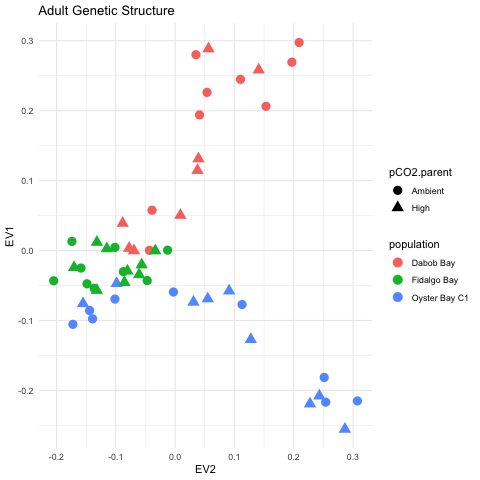

In [621]:
%%R
# uncomment out the ggplotly lines to interact
#ggplotly( 
    ggplot(tab.adult.annot, aes(x=EV2, y=EV1, col=population, shape=pCO2.parent)) + 
         geom_point(size=4) + theme_minimal() + ggtitle("Adult Genetic Structure")#)

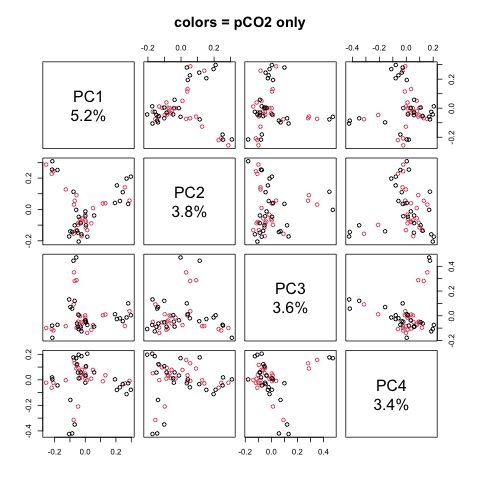

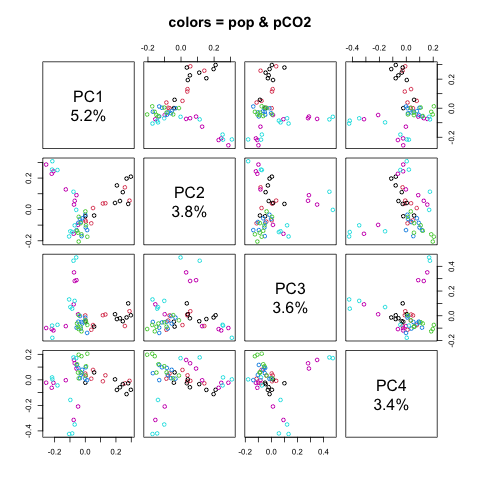

In [463]:
%%R
lbls <- paste("PC", 1:4, "\n", format(pc.percent.adult[1:4], digits=2), "%", sep="")
pairs(pca.adult$eigenvect[,1:4], col=tab.adult.annot$pCO2.parent, labels=lbls, main="colors = pCO2 only")
pairs(pca.adult$eigenvect[,1:4], col=tab.adult.annot$pop_code, labels=lbls, main="colors = pop & pCO2")

Identity-By-State (IBS) analysis on genotypes:
Excluding 2,917 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 53
    # of SNPs: 18,469
    using 2 threads
IBS:    the sum of all selected genotypes (0,1,2) = 279469
Sun Mar 28 21:32:10 2021    (internal increment: 65536)
[==================================================] 100%, completed, 0s  
Sun Mar 28 21:32:10 2021    Done.


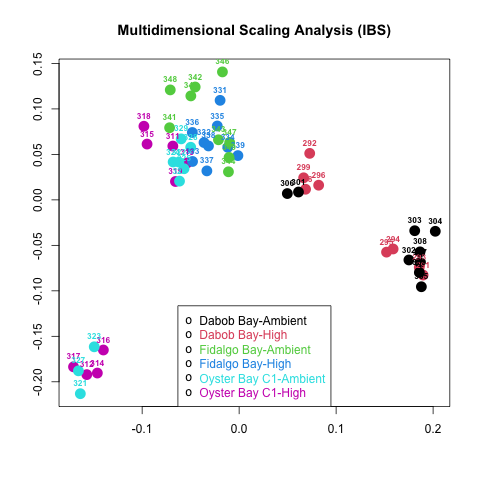

In [465]:
%%R
ibs.adult <- snpgdsIBS(genofile.adult, num.thread=2, autosome.only=FALSE)
pop.idx.adult <- order(tab.adult.annot$pop_code)

#par(xpd=TRUE)
#heatmap(ibs.adult$ibs, col=terrain.colors(16), labCol=TRUE, 
#        RowSideColors=c("black","red","green","blue")[tab.adult.annot$pop_code])
#legend(0,-.05, legend=levels(tab.adult.annot$pop_code), pch="o", col=1:nlevels(tab.adult.annot$pop_code), 
#       text.col=1:nlevels(tab.adult.annot$pop_code), cex=.75, ncol=4)

#erform multidimensional scaling analysis on the matrix of genome-wide IBS pairwise distances:
loc.adult <- cmdscale(1 - ibs.adult$ibs, k = 2)
x.adult <- loc.adult[, 1]; y.adult <- loc.adult[, 2]
group.adult <- as.factor(tab.adult.annot$pop_code)

plot(x.adult, y.adult, col=group.adult, xlab = "", ylab = "",
    main = "Multidimensional Scaling Analysis (IBS)", cex=2, pch=16)
text(x.adult, y.adult+.012, labels=tab.adult.annot$sample.id, cex=0.7, font=2, col=as.integer(group.adult))
legend("bottom", legend=levels(group.adult), pch="o", text.col=1:nlevels(group.adult))

Identity-By-State (IBS) analysis on genotypes:
Excluding 2,917 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 53
    # of SNPs: 18,469
    using 2 threads
IBS:    the sum of all selected genotypes (0,1,2) = 279469
Sun Mar 28 21:34:51 2021    (internal increment: 65536)
[==================================================] 100%, completed, 0s  
Sun Mar 28 21:34:51 2021    Done.
Determine groups by permutation (Z threshold: 15, outlier threshold: 5):
Create 2 groups.

G001 G002 
  17   36 


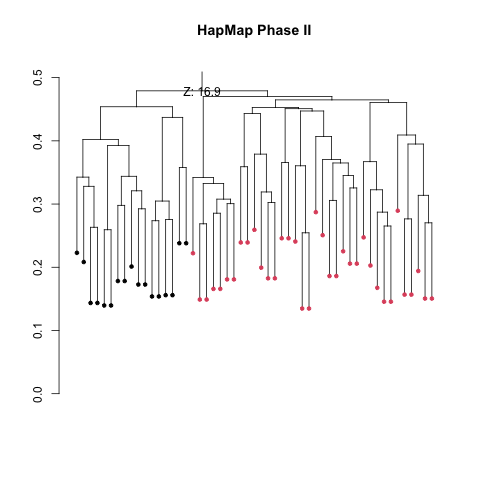

In [467]:
%%R
# To perform cluster analysis on the matrix of genome-wide IBS pairwise distances, 
# and determine the groups by a permutation score. 
# Result= only 1 group (?)
ibs.hc.adult <- snpgdsHCluster(snpgdsIBS(genofile.adult, num.thread=2, autosome.only=FALSE))
rv.adult <- snpgdsCutTree(ibs.hc.adult)
plot(rv.adult$dendrogram, leaflab="none", main="HapMap Phase II")

Create 6 groups.


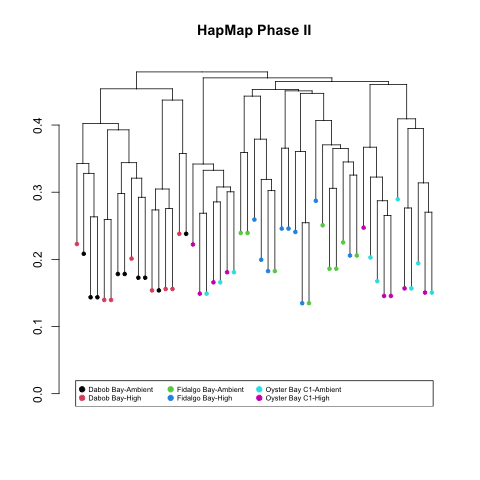

In [479]:
%%R
ibs.hc.adult <- snpgdsHCluster(snpgdsIBS(genofile.adult, num.thread=2, autosome.only=FALSE))
rv.adult <- snpgdsCutTree(ibs.hc.adult)

# Determine groups of individuals by population information
rv2.adult <- snpgdsCutTree(ibs.hc.adult, samp.group=as.factor(tab.adult.annot$pop_code))
plot(rv2.adult$dendrogram, leaflab="none", main="HapMap Phase II")
legend("bottom", legend=levels(group.adult), col=1:nlevels(group.adult), pch=19, ncol=4, cex=0.6, pt.cex=1)

## ADULT Fst calculations

In [634]:
%%R
v.adult <- snpgdsFst(genofile.adult, sample.id=tab.adult.annot$sample.id, 
                     population=as.factor(tab.adult.annot$population),
    method="W&C84", autosome.only=FALSE)
paste("Weir and Cockerham weighted Fst estimate, between adult populations: ", round(v.adult$Fst, 5))

Fst estimation on genotypes:
Excluding 2,917 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 53
    # of SNPs: 18,469
Method: Weir & Cockerham, 1984
# of Populations: 3
    Dabob Bay (17), Fidalgo Bay (18), Oyster Bay C1 (18)
[1] "Weir and Cockerham weighted Fst estimate, between adult populations:  0.16505"


In [635]:
%%R
# within FB (comparing pCO2 exposure): 
v.adult.FB <- snpgdsFst(genofile.adult, sample.id=subset(tab.adult.annot, population=="Fidalgo Bay")$sample.id, 
               population=as.factor(subset(tab.adult.annot, population=="Fidalgo Bay")$pCO2.parent),
    method="W&C84", autosome.only=FALSE)
paste("Weir and Cockerham mean Fst estimate, Fidalgo Bay Ambient vs. High: ", round(v.adult.FB$MeanFst, 5))

Fst estimation on genotypes:
Excluding 9,201 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 18
    # of SNPs: 12,185
Method: Weir & Cockerham, 1984
# of Populations: 2
    Ambient (9), High (9)
[1] "Weir and Cockerham mean Fst estimate, Fidalgo Bay Ambient vs. High:  0.11508"


In [633]:
%%R
# within DB (comparing pCO2 exposure): 
v.adult.DB <- snpgdsFst(genofile.adult, sample.id=subset(tab.adult.annot, population=="Dabob Bay")$sample.id, 
               population=as.factor(subset(tab.adult.annot, population=="Dabob Bay")$pCO2.parent),
    method="W&C84", autosome.only=FALSE)
paste("Weir and Cockerham mean Fst estimate, Dabob Bay Ambient vs. High: ", round(v.adult.DB$MeanFst, 5))

Fst estimation on genotypes:
Excluding 8,503 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 17
    # of SNPs: 12,883
Method: Weir & Cockerham, 1984
# of Populations: 2
    Ambient (9), High (8)
[1] "Weir and Cockerham mean Fst estimate, Dabob Bay Ambient vs. High:  0.09496"


In [636]:
%%R
# within OB1 (comparing pCO2 exposure): 
v.adult.OB1 <- snpgdsFst(genofile.adult, sample.id=subset(tab.adult.annot, population=="Oyster Bay C1")$sample.id, 
               population=as.factor(subset(tab.adult.annot, population=="Oyster Bay C1")$pCO2.parent),
    method="W&C84", autosome.only=FALSE)
paste("Weir and Cockerham mean Fst estimate, Oyster Bay C1 Ambient vs. High: ", round(v.adult.OB1$MeanFst, 5))

Fst estimation on genotypes:
Excluding 8,879 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 18
    # of SNPs: 12,507
Method: Weir & Cockerham, 1984
# of Populations: 2
    Ambient (9), High (9)
[1] "Weir and Cockerham mean Fst estimate, Oyster Bay C1 Ambient vs. High:  0.08471"


## Adult sibship via Colony

In [523]:
! gzip -dkf ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-adult-filtered-true.vcf.gz

In [527]:
%%R
snpgdsClose(genofile4Colony.adult)
snpgdsVCF2GDS("../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-adult-filtered-true.vcf", 
              "../qc-processing/colony/4Colony.adult.gds", method="biallelic.only")
snpgdsSummary("../qc-processing/colony/4Colony.adult.gds")
genofile4Colony.adult <- snpgdsOpen("../qc-processing/colony/4Colony.adult.gds")
snpset4Colony.adult <- snpgdsLDpruning(genofile4Colony.adult, ld.threshold=0.2, autosome.only=FALSE, 
                                       missing.rate=0.3, maf=.3)
snpset4Colony.adult.id <- unlist(unname(snpset4Colony.adult))
snpgdsCreateGenoSet(src.fn="../qc-processing/colony/4Colony.adult.gds",
                    dest.fn="../qc-processing/colony/4Colony.adult-pruned.gds",
                    snp.id=snpset4Colony.adult.id)
geno.matrix4Colony.adult <- snpgdsGetGeno(gdsobj="../qc-processing/colony/4Colony.adult-pruned.gds", with.id=TRUE)
write_delim(cbind(sampleID=paste("O", geno.matrix4Colony.adult$sample.id, sep=""), 
                  as.data.frame(geno.matrix4Colony.adult$genotype)), 
            file="../qc-processing/colony/geno.matrix.adult.tab", delim="   ", col_names=FALSE)

Start file conversion from VCF to SNP GDS ...
Method: exacting biallelic SNPs
Number of samples: 53
Parsing "../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-adult-filtered-true.vcf" ...
	import 21386 variants.
+ genotype   { Bit2 53x21386, 276.7K } *
Optimize the access efficiency ...
Clean up the fragments of GDS file:
    open the file '../qc-processing/colony/4Colony.adult.gds' (400.6K)
    # of fragments: 47
    save to '../qc-processing/colony/4Colony.adult.gds.tmp'
    rename '../qc-processing/colony/4Colony.adult.gds.tmp' (400.3K, reduced: 324B)
    # of fragments: 20
The file name: /Volumes/Bumblebee/O.lurida_QuantSeq-2020/qc-processing/colony/4Colony.adult.gds 
The total number of samples: 53 
The total number of SNPs: 21386 
SNP genotypes are stored in SNP-major mode (Sample X SNP).
SNP pruning based on LD:
Excluding 21,093 SNPs (monomorphic: TRUE, MAF: 0.3, missing rate: 0.3)
    # of samples: 53
    # of SNPs: 293
    using 1 thread
    sliding window: 500,000 basepair

## ISSUE THAT NEEDS TO BE SOLVED: 

- **SNPRelate codes alleles this way:** "There are four possible values stored in the variable genotype: 0, 1, 2 and 3. For bi-allelic SNP sites, “0” indicates two B alleles, “1” indicates one A allele and one B allele, “2” indicates two A alleles, and “3” is a missing genotype. (When you) take out genotype data with sample and SNP IDs, and four possible values are returned 0, 1, 2 and NA (3 is replaced by NA).  

- **Colony codes alleles this way:** "The first column gives the individual ID (a string containing a maximum of 20 letters and/or numbers, no other characters are allowed), the 2nd and 3rd columns give the alleles observed for the individual at the first locus, the 4th and 5th give the alleles observed for the individual at the 2nd locus ... An allele is identified by an integer, in the range of 1~999999999. If the locus is a dominant marker, then only one (instead of 2) column is required for the marker, and the value for the genotype should be either 1 (dominant phenotype, presence of a band) or 2 (recessive phenotype, absence of a band). Missing genotypes are indicated by 0 0 for a codominant marker and 0 for a dominant marker."  Also, there cannot be any NA values in the Colony genotype data. 

I need to figure out how to convert the SNPRelate format/coding to the Colony format/coding. 

In [ ]:
#! ./colony2s.out IFN:(file)

## LARVAE relatedness analysis 

In [528]:
! gzip -dk ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-larvae-filtered-true.vcf.gz

In [560]:
%%R
snpgdsClose(genofile.larvae)
#Creat .gds object for SNPRelate
vcf.fn.larvae <- "../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-larvae-filtered-true.vcf.gz"
snpgdsVCF2GDS(vcf.fn.larvae, "../qc-processing/gatk/genotypes-larvae.gds", method="biallelic.only")
snpgdsSummary("../qc-processing/gatk/genotypes-larvae.gds")
genofile.larvae <- snpgdsOpen("../qc-processing/gatk/genotypes-larvae.gds")
# Prune SNPs in linkage-disequilibrium
snpset.larvae <- snpgdsLDpruning(genofile.larvae, ld.threshold=0.2, autosome.only=FALSE)
snpset.larvae.id <- unlist(unname(snpset.larvae))
# PCA 
pca.larvae <- snpgdsPCA(genofile.larvae, snp.id=snpset.larvae.id, num.thread=2, autosome.only=FALSE)
pc.percent.larvae <- pca.larvae$varprop*100
head(round(pc.percent.larvae, 2))
tab.larvae <- data.frame(sample.id = pca.larvae$sample.id,
    EV1 = pca.larvae$eigenvect[,1],    # the first eigenvector
    EV2 = pca.larvae$eigenvect[,2],    # the second eigenvector
    EV3 = pca.larvae$eigenvect[,3],    # the third eigenvector
    EV4 = pca.larvae$eigenvect[,4],    # the fourth eigenvector
    stringsAsFactors = FALSE)
tab.larvae.annot <- left_join(tab.larvae, sample.info, by=c("sample.id"="sample")) %>% droplevels()

Start file conversion from VCF to SNP GDS ...
Method: exacting biallelic SNPs
Number of samples: 76
Parsing "../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-larvae-filtered-true.vcf.gz" ...
	import 18367 variants.
+ genotype   { Bit2 76x18367, 340.8K } *
Optimize the access efficiency ...
Clean up the fragments of GDS file:
    open the file '../qc-processing/gatk/genotypes-larvae.gds' (448.3K)
    # of fragments: 48
    save to '../qc-processing/gatk/genotypes-larvae.gds.tmp'
    rename '../qc-processing/gatk/genotypes-larvae.gds.tmp' (448.0K, reduced: 336B)
    # of fragments: 20
The file name: /Volumes/Bumblebee/O.lurida_QuantSeq-2020/qc-processing/gatk/genotypes-larvae.gds 
The total number of samples: 76 
The total number of SNPs: 18367 
SNP genotypes are stored in SNP-major mode (Sample X SNP).
SNP pruning based on LD:
Excluding 2,768 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 76
    # of SNPs: 15,599
    using 1 thread
    sliding window: 500,00

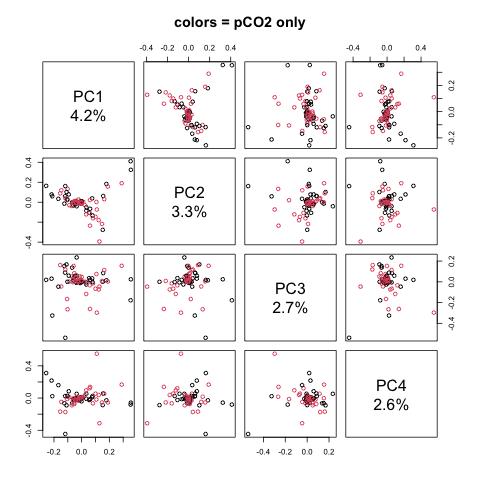

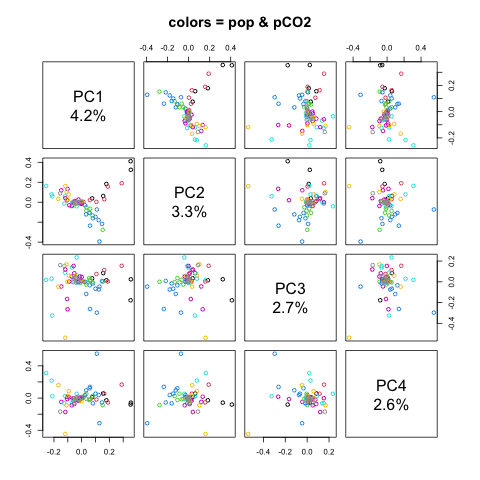

In [538]:
%%R
lbls <- paste("PC", 1:4, "\n", format(pc.percent.larvae[1:4], digits=2), "%", sep="")
pairs(pca.larvae$eigenvect[,1:4], col=tab.larvae.annot$pCO2.parent, labels=lbls, main="colors = pCO2 only")
pairs(pca.larvae$eigenvect[,1:4], col=tab.larvae.annot$pop_code, labels=lbls, main="colors = pop & pCO2")

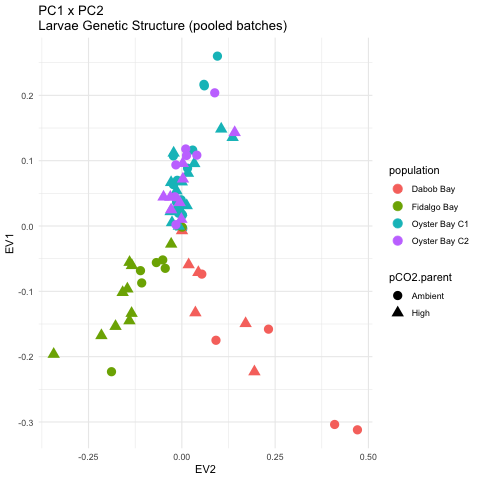

In [622]:
%%R
# PC1 x PC2
# uncomment out the ggplotly lines to interact
#ggplotly( 
    ggplot(tab.larvae.annot, aes(x=EV2, y=EV1, col=population, shape=pCO2.parent)) + 
         geom_point(size=4) + theme_minimal() + ggtitle("PC1 x PC2\nLarvae Genetic Structure (pooled batches)")#)

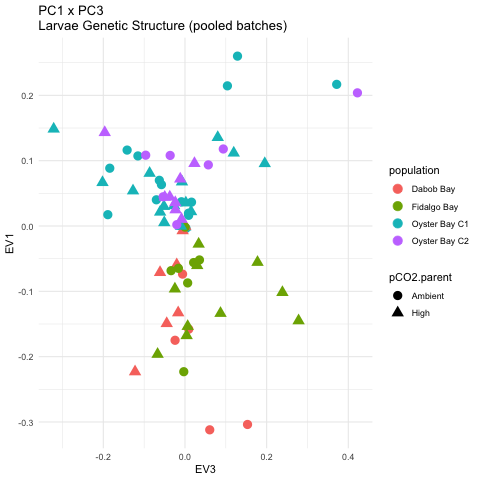

In [623]:
%%R
#PC1 x PC3
# uncomment out the ggplotly lines to interact
#ggplotly( 
    ggplot(tab.larvae.annot, aes(x=EV3, y=EV1, col=population, shape=pCO2.parent)) + 
         geom_point(size=4) + theme_minimal() + ggtitle("PC1 x PC3\nLarvae Genetic Structure (pooled batches)")#)

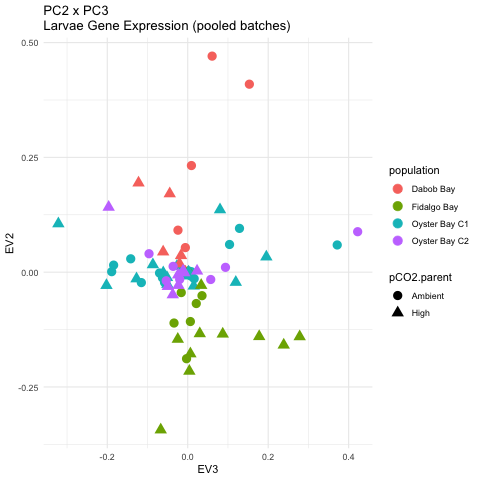

In [567]:
%%R
# PC2 x PC3
#ggplotly( 
    ggplot(tab.larvae.annot, aes(x=EV3, y=EV2, col=population, shape=pCO2.parent)) + 
         geom_point(size=4) + theme_minimal() + ggtitle("PC2 x PC3\nLarvae Gene Expression (pooled batches)")#)

In [598]:
%%R
ibs.larvae <- snpgdsIBS(genofile.larvae, num.thread=2, autosome.only=FALSE, sample.id=setdiff(tab.larvae.annot$sample.id, "044"))
pop.idx.larvae <- order(tab.larvae.annot$pop_code)

Identity-By-State (IBS) analysis on genotypes:
Excluding 2,768 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 75
    # of SNPs: 15,599
    using 2 threads
IBS:    the sum of all selected genotypes (0,1,2) = 254596
Mon Mar 29 15:27:52 2021    (internal increment: 65536)
[==================================================] 100%, completed, 0s  
Mon Mar 29 15:27:52 2021    Done.


In [613]:
%%R
tab.larvae.annot

   sample.id           EV1           EV2           EV3           EV4  stage
1        034  0.0163542844  0.0010159516  0.0089508774 -0.0004989746 larvae
2        035 -0.0036639894  0.0025076245  0.0024895473 -0.0092109827 larvae
3        037  0.0010210729 -0.0059690338 -0.0162991878 -0.0136898547 larvae
4        039  0.0173548454  0.0011227607 -0.1890014185 -0.0903140586 larvae
5        041  0.0312403411  0.0130953414 -0.0267007901  0.0369661030 larvae
6        043  0.1356557173  0.1360767864  0.0802421234  0.0970785587 larvae
7        044 -0.0014130648 -0.0021290038  0.0003858794  0.0017073378 larvae
8        045  0.0052536788 -0.0263199496 -0.0507526814 -0.0146114357 larvae
9        046  0.0220893731 -0.0300526890  0.0148781839  0.0085145386 larvae
10       047  0.0676190239 -0.0001898280 -0.0073434395  0.0412435491 larvae
11       401 -0.0736322154  0.0535555396 -0.0059086395 -0.0359618040 larvae
12       402 -0.1579119823  0.2322123519  0.0091910921 -0.0590626179 larvae
13       403

In [619]:
%%R
as.numeric(as.factor(subset(tab.larvae.annot, sample.id!="044")$pCO2.parent))

 [1] 1 1 1 1 2 2 2 2 2 1 1 1 1 2 2 2 2 1 2 2 2 1 1 1 1 1 2 2 2 1 1 2 2 2 2 2 2 2
[39] 1 1 1 1 1 1 1 1 1 1 1 2 1 2 2 2 2 2 2 2 2 2 1 1 1 2 2 2 1 1 1 1 2 2 2 2 2


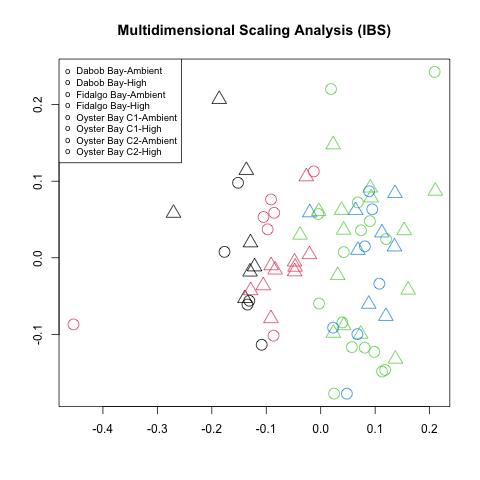

In [620]:
%%R
#erform multidimensional scaling analysis on the matrix of genome-wide IBS pairwise distances:
loc.larvae <- cmdscale(1 - ibs.larvae$ibs, k = 2)
x.larvae <- loc.larvae[, 1]; y.larvae <- loc.larvae[, 2]
group.larvae <- as.factor(tab.larvae.annot$pop_code)
a <- as.factor(subset(tab.larvae.annot, sample.id!="044")$population)
b <- as.numeric(as.factor(subset(tab.larvae.annot, sample.id!="044")$pCO2.parent))

plot(x.larvae, y.larvae, col=a, pch=b, xlab = "", ylab = "",
    main = "Multidimensional Scaling Analysis (IBS)", cex=2)
#text(x.larvae, y.larvae+.012, labels=tab.larvae.annot$sample.id, cex=0.7, font=2, col=as.integer(group.larvae))
legend("topleft", legend=levels(group.larvae), pch="o", cex=0.8) #text.col=1:nlevels(group.larvae), 

Identity-By-State (IBS) analysis on genotypes:
Excluding 2,768 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 75
    # of SNPs: 15,599
    using 2 threads
IBS:    the sum of all selected genotypes (0,1,2) = 254596
Mon Mar 29 15:30:29 2021    (internal increment: 65536)
[==================================================] 100%, completed, 0s  
Mon Mar 29 15:30:29 2021    Done.
Determine groups by permutation (Z threshold: 15, outlier threshold: 5):
Create 2 groups.


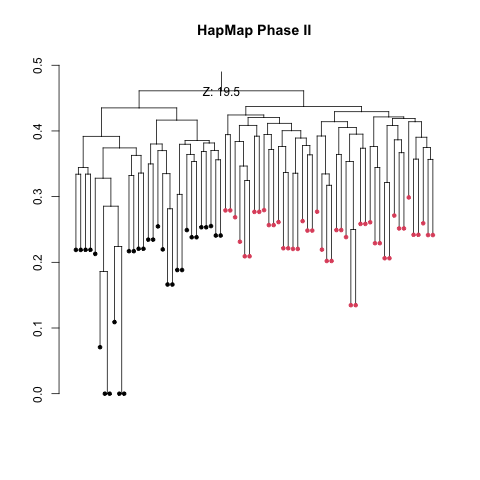

In [605]:
%%R
# To perform cluster analysis on the matrix of genome-wide IBS pairwise distances, 
# and determine the groups by a permutation score. 
ibs.hc.larvae <- snpgdsHCluster(snpgdsIBS(genofile.larvae, num.thread=2, autosome.only=FALSE, 
                                         sample.id=setdiff(tab.larvae.annot$sample.id, "044")))
rv.larvae <- snpgdsCutTree(ibs.hc.larvae)
plot(rv.larvae$dendrogram, leaflab="none", main="HapMap Phase II")

Identity-By-State (IBS) analysis on genotypes:
Excluding 2,768 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 75
    # of SNPs: 15,599
    using 2 threads
IBS:    the sum of all selected genotypes (0,1,2) = 254596
Mon Mar 29 18:03:36 2021    (internal increment: 65536)
[==================================================] 100%, completed, 0s  
Mon Mar 29 18:03:36 2021    Done.
Determine groups by permutation (Z threshold: 15, outlier threshold: 5):
Create 2 groups.
Create 8 groups.


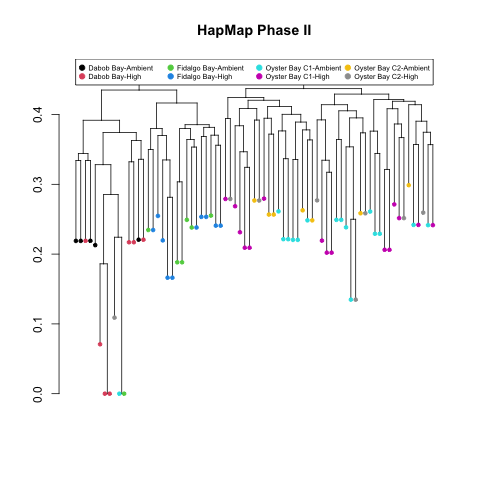

In [611]:
%%R
ibs.hc.larvae <- snpgdsHCluster(snpgdsIBS(genofile.larvae, num.thread=2, autosome.only=FALSE,
                                        sample.id=setdiff(tab.larvae.annot$sample.id, "044")))
rv.larvae <- snpgdsCutTree(ibs.hc.larvae)

# Determine groups of individuals by population information
rv2.larvae <- snpgdsCutTree(ibs.hc.larvae, samp.group=as.factor(subset(tab.larvae.annot, sample.id!="044")$pop_code))
plot(rv2.larvae$dendrogram, leaflab="none", main="HapMap Phase II")
legend("top", legend=levels(group.larvae), col=1:nlevels(group.larvae), pch=19, ncol=4, cex=0.6, pt.cex=1)

In [637]:
%%R
v.larvae <- snpgdsFst(genofile.larvae, sample.id=tab.larvae.annot$sample.id, 
                     population=as.factor(tab.larvae.annot$population),
    method="W&C84", autosome.only=FALSE)
paste("Weir and Cockerham weighted Fst estimate, between larval populations: ", round(v.larvae$Fst, 5))

Fst estimation on genotypes:
Excluding 2,768 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 76
    # of SNPs: 15,599
Method: Weir & Cockerham, 1984
# of Populations: 4
    Dabob Bay (12), Fidalgo Bay (17), Oyster Bay C1 (32), Oyster Bay C2 (15)
[1] "Weir and Cockerham weighted Fst estimate, between larval populations:  0.13744"


In [638]:
%%R
# within FB (comparing pCO2 exposure): 
v.larvae.FB <- snpgdsFst(genofile.larvae, sample.id=subset(tab.larvae.annot, population=="Fidalgo Bay")$sample.id, 
               population=as.factor(subset(tab.larvae.annot, population=="Fidalgo Bay")$pCO2.parent),
    method="W&C84", autosome.only=FALSE)
paste("Weir and Cockerham mean Fst estimate, Fidalgo Bay Ambient vs. High: ", round(v.larvae.FB$MeanFst, 5))

Fst estimation on genotypes:
Excluding 8,967 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 17
    # of SNPs: 9,400
Method: Weir & Cockerham, 1984
# of Populations: 2
    Ambient (7), High (10)
[1] "Weir and Cockerham mean Fst estimate, Fidalgo Bay Ambient vs. High:  0.07884"


In [639]:
%%R
# within DB (comparing pCO2 exposure): 
v.larvae.DB <- snpgdsFst(genofile.larvae, sample.id=subset(tab.larvae.annot, population=="Dabob Bay")$sample.id, 
               population=as.factor(subset(tab.larvae.annot, population=="Dabob Bay")$pCO2.parent),
    method="W&C84", autosome.only=FALSE)
paste("Weir and Cockerham mean Fst estimate, Dabob Bay Ambient vs. High: ", round(v.larvae.DB$MeanFst, 5))

Fst estimation on genotypes:
Excluding 10,605 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 12
    # of SNPs: 7,762
Method: Weir & Cockerham, 1984
# of Populations: 2
    Ambient (5), High (7)
[1] "Weir and Cockerham mean Fst estimate, Dabob Bay Ambient vs. High:  0.09892"


In [640]:
%%R
# within OB1 (comparing pCO2 exposure): 
v.larvae.OB1 <- snpgdsFst(genofile.larvae, sample.id=subset(tab.larvae.annot, population=="Oyster Bay C1")$sample.id, 
               population=as.factor(subset(tab.larvae.annot, population=="Oyster Bay C1")$pCO2.parent),
    method="W&C84", autosome.only=FALSE)
paste("Weir and Cockerham mean Fst estimate, Oyster Bay C1 Ambient vs. High: ", round(v.larvae.OB1$MeanFst, 5))

Fst estimation on genotypes:
Excluding 6,389 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 32
    # of SNPs: 11,978
Method: Weir & Cockerham, 1984
# of Populations: 2
    Ambient (16), High (16)
[1] "Weir and Cockerham mean Fst estimate, Oyster Bay C1 Ambient vs. High:  0.09144"


In [641]:
%%R
# within OB2 (comparing pCO2 exposure): 
v.larvae.OB2 <- snpgdsFst(genofile.larvae, sample.id=subset(tab.larvae.annot, population=="Oyster Bay C2")$sample.id, 
               population=as.factor(subset(tab.larvae.annot, population=="Oyster Bay C2")$pCO2.parent),
    method="W&C84", autosome.only=FALSE)
paste("Weir and Cockerham mean Fst estimate, Oyster Bay C2 Ambient vs. High: ", round(v.larvae.OB2$MeanFst, 5))

Fst estimation on genotypes:
Excluding 9,512 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 15
    # of SNPs: 8,855
Method: Weir & Cockerham, 1984
# of Populations: 2
    Ambient (7), High (8)
[1] "Weir and Cockerham mean Fst estimate, Oyster Bay C2 Ambient vs. High:  0.093"


## JUVENILE relatedness analysis 

In [568]:
! gzip -dk ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-juvenile-filtered-true.vcf.gz

In [570]:
%%R
#snpgdsClose(genofile.juvenile)
#Creat .gds object for SNPRelate
vcf.fn.juvenile <- "../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-juvenile-filtered-true.vcf.gz"
snpgdsVCF2GDS(vcf.fn.juvenile, "../qc-processing/gatk/genotypes-juvenile.gds", method="biallelic.only")
snpgdsSummary("../qc-processing/gatk/genotypes-juvenile.gds")
genofile.juvenile <- snpgdsOpen("../qc-processing/gatk/genotypes-juvenile.gds")
# Prune SNPs in linkage-disequilibrium
snpset.juvenile <- snpgdsLDpruning(genofile.juvenile, ld.threshold=0.2, autosome.only=FALSE)
snpset.juvenile.id <- unlist(unname(snpset.juvenile))
# PCA 
pca.juvenile <- snpgdsPCA(genofile.juvenile, snp.id=snpset.juvenile.id, num.thread=2, autosome.only=FALSE)
pc.percent.juvenile <- pca.juvenile$varprop*100
head(round(pc.percent.juvenile, 2))
tab.juvenile <- data.frame(sample.id = pca.juvenile$sample.id,
    EV1 = pca.juvenile$eigenvect[,1],    # the first eigenvector
    EV2 = pca.juvenile$eigenvect[,2],    # the second eigenvector
    EV3 = pca.juvenile$eigenvect[,3],    # the third eigenvector
    EV4 = pca.juvenile$eigenvect[,4],    # the fourth eigenvector
    stringsAsFactors = FALSE)
tab.juvenile.annot <- left_join(tab.juvenile, sample.info, by=c("sample.id"="sample")) %>% droplevels()

Start file conversion from VCF to SNP GDS ...
Method: exacting biallelic SNPs
Number of samples: 16
Parsing "../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-juvenile-filtered-true.vcf.gz" ...
	import 15429 variants.
+ genotype   { Bit2 16x15429, 60.3K } *
Optimize the access efficiency ...
Clean up the fragments of GDS file:
    open the file '../qc-processing/gatk/genotypes-juvenile.gds' (152.4K)
    # of fragments: 46
    save to '../qc-processing/gatk/genotypes-juvenile.gds.tmp'
    rename '../qc-processing/gatk/genotypes-juvenile.gds.tmp' (152.1K, reduced: 312B)
    # of fragments: 20
The file name: /Volumes/Bumblebee/O.lurida_QuantSeq-2020/qc-processing/gatk/genotypes-juvenile.gds 
The total number of samples: 16 
The total number of SNPs: 15429 
SNP genotypes are stored in SNP-major mode (Sample X SNP).
SNP pruning based on LD:
Excluding 392 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 16
    # of SNPs: 15,037
    using 1 thread
    sliding window:

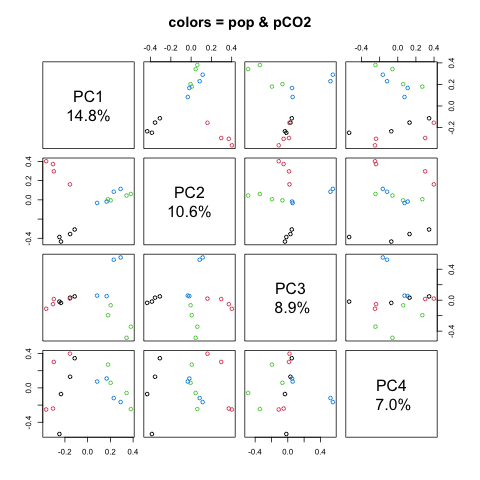

In [577]:
%%R
lbls <- paste("PC", 1:4, "\n", format(pc.percent.juvenile[1:4], digits=2), "%", sep="")
pairs(pca.juvenile$eigenvect[,1:4], col=tab.juvenile.annot$pop_code, labels=lbls, main="colors = pop & pCO2")

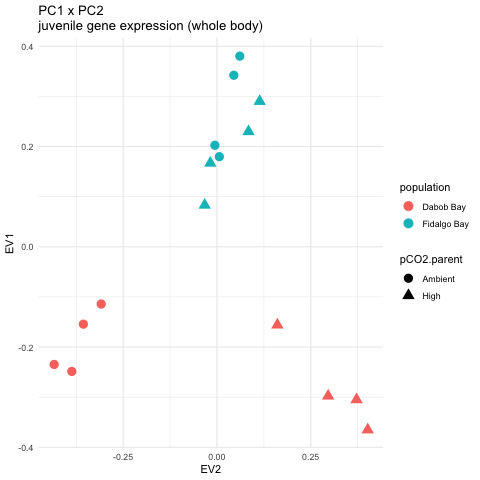

In [578]:
%%R
# PC1 x PC2
# uncomment out the ggplotly lines to interact
#ggplotly( 
    ggplot(tab.juvenile.annot, aes(x=EV2, y=EV1, col=population, shape=pCO2.parent)) + 
         geom_point(size=4) + theme_minimal() + ggtitle("PC1 x PC2\njuvenile gene expression (whole body)")#)

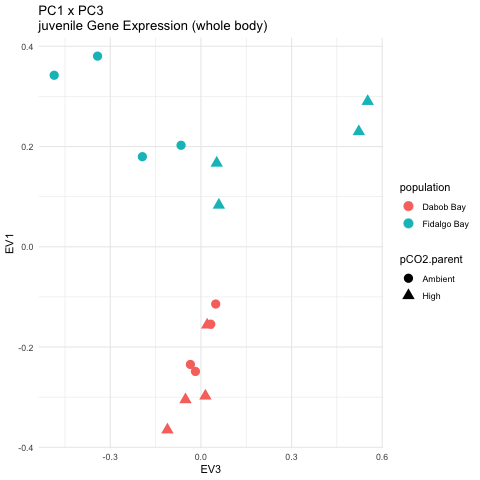

In [579]:
%%R
#PC1 x PC3
# uncomment out the ggplotly lines to interact
#ggplotly( 
    ggplot(tab.juvenile.annot, aes(x=EV3, y=EV1, col=population, shape=pCO2.parent)) + 
         geom_point(size=4) + theme_minimal() + ggtitle("PC1 x PC3\njuvenile Gene Expression (whole body)")#)

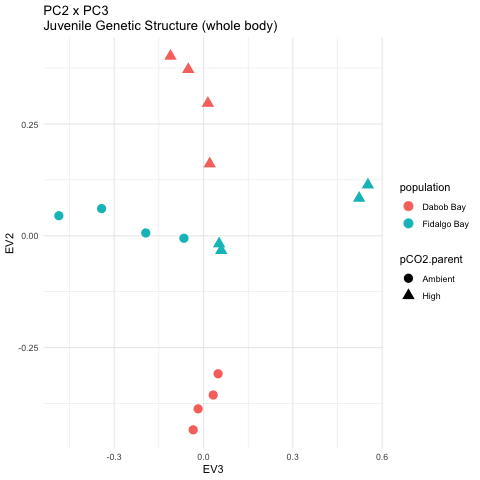

In [624]:
%%R
# PC2 x PC3
#ggplotly( 
    ggplot(tab.juvenile.annot, aes(x=EV3, y=EV2, col=population, shape=pCO2.parent)) + 
         geom_point(size=4) + theme_minimal() + ggtitle("PC2 x PC3\nJuvenile Genetic Structure (whole body)")#)

In [647]:
%%R
v.juvenile <- snpgdsFst(genofile.juvenile, sample.id=tab.juvenile.annot$sample.id, 
                     population=as.factor(tab.juvenile.annot$population),
    method="W&C84", autosome.only=FALSE)
paste("Weir and Cockerham weighted Fst estimate, between juvenile populations: ", round(v.juvenile$Fst, 5))

Fst estimation on genotypes:
Excluding 392 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 16
    # of SNPs: 15,037
Method: Weir & Cockerham, 1984
# of Populations: 2
    Dabob Bay (8), Fidalgo Bay (8)
[1] "Weir and Cockerham weighted Fst estimate, between juvenile populations:  0.18418"


In [643]:
%%R
# within FB (comparing pCO2 exposure): 
v.juvenile.FB <- snpgdsFst(genofile.juvenile, 
                           sample.id=subset(tab.juvenile.annot, population=="Fidalgo Bay")$sample.id, 
               population=as.factor(subset(tab.juvenile.annot, population=="Fidalgo Bay")$pCO2.parent),
    method="W&C84", autosome.only=FALSE)
paste("Weir and Cockerham mean Fst estimate, Fidalgo Bay juveniles Ambient vs. High: ", round(v.juvenile.FB$MeanFst, 5))

Fst estimation on genotypes:
Excluding 2,652 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 8
    # of SNPs: 12,777
Method: Weir & Cockerham, 1984
# of Populations: 2
    Ambient (4), High (4)
[1] "Weir and Cockerham mean Fst estimate, Fidalgo Bay juveniles Ambient vs. High:  0.06953"


In [645]:
%%R
# within DB (comparing pCO2 exposure): 
v.juvenile.DB <- snpgdsFst(genofile.juvenile, sample.id=subset(tab.juvenile.annot, population=="Dabob Bay")$sample.id, 
               population=as.factor(subset(tab.juvenile.annot, population=="Dabob Bay")$pCO2.parent),
    method="W&C84", autosome.only=FALSE)
paste("Weir and Cockerham mean Fst estimate, Dabob Bay juveniles Ambient vs. High: ", round(v.juvenile.DB$MeanFst, 5))

Fst estimation on genotypes:
Excluding 2,747 SNPs (monomorphic: TRUE, MAF: NaN, missing rate: NaN)
    # of samples: 8
    # of SNPs: 12,682
Method: Weir & Cockerham, 1984
# of Populations: 2
    Ambient (4), High (4)
[1] "Weir and Cockerham mean Fst estimate, Dabob Bay juveniles Ambient vs. High:  0.15839"


### Test out various genetic diversity indices 

In [2]:
%%R
require(PopGenome)

R[write to console]: Loading required package: PopGenome

R[write to console]: Loading required package: ff

R[write to console]: Loading required package: bit

R[write to console]: 
Attaching package: ‘bit’


R[write to console]: The following object is masked from ‘package:base’:

    xor


R[write to console]: Attaching package ff

R[write to console]: - getOption("fftempdir")=="/var/folders/kn/b_4h8b912q3cg5w8v5zg8wfc0000gn/T//RtmpqpR3G3/ff"


R[write to console]: - getOption("ffextension")=="ff"


R[write to console]: - getOption("ffdrop")==TRUE


R[write to console]: - getOption("fffinonexit")==TRUE


R[write to console]: - getOption("ffpagesize")==65536


R[write to console]: - getOption("ffcaching")=="mmnoflush"  -- consider "ffeachflush" if your system stalls on large writes


R[write to console]: - getOption("ffbatchbytes")==16777216 -- consider a different value for tuning your system


R[write to console]: - getOption("ffmaxbytes")==536870912 -- consider a different value f

In [ ]:
%%R
# Load the data
snp <- readData("../qc-processing/gatk/PopGenome", format="VCF")

|            :            |            :            | 100 %
|

R[write to console]: 
 *** caught segfault ***

R[write to console]: address 0x7fb7addeb000, cause 'memory not mapped'

R[write to console]: 
Traceback:

R[write to console]:  1: 
R[write to console]: myReadVCF(filepath)
R[write to console]: 

R[write to console]:  2: 
R[write to console]: PopGenread(liste[xx], format)
R[write to console]: 

R[write to console]:  3: 
R[write to console]: doTryCatch(return(expr), name, parentenv, handler)
R[write to console]: 

R[write to console]:  4: 
R[write to console]: tryCatchOne(expr, names, parentenv, handlers[[1L]])
R[write to console]: 

R[write to console]:  5: 
R[write to console]: tryCatchList(expr, classes, parentenv, handlers)
R[write to console]: 

R[write to console]:  6: 
R[write to console]: tryCatch(expr, error = function(e) {
R[write to console]:     call <- conditionCall(e)
R[write to console]:     if (!is.null(call)) {
R[write to console]:         if (identical(call[[1L]], quote(doTryCatch))) 
R[write to console]:             call

In [ ]:


# This is complex object, with several slots
get.sum.data(snp)
show.slots(snp)

# You can access the different "slots" by using the "@" sign:
snp@n.sites

# Set populations
pops <- get.individuals(snp)[[1]]
pop1 <- pops[grep("B\\.bam",pops)]
pop2 <- pops[grep("b\\.bam",pops)]

snp  <- set.populations(snp, list(pop1,pop2))

snp@populations # check if it worked

# Boneyard and reserved code 

In [ ]:
#! {gatk} VariantsToTable \
#     -V ../qc-processing/gatk/juvenile_genotypes-SNPs.vcf.gz \
#     -F CHROM -F POS -F QUAL -GF AC -GF AF -GF InbreedingCoeff \
#     -O ../qc-processing/gatk/output.table

In [282]:
%%R
# If I want to create .vcf files for tissue type, use below code
write_delim(tab.annot %>% filter(stage=="larvae") %>% select("sample.id"),
            file="../qc-processing/colony/larvae.args", col_names=FALSE, delim="\t")
write_delim(tab.annot %>% filter(stage=="adult") %>% select("sample.id"),
            file="../qc-processing/colony/adult.args", col_names=FALSE, delim="\t")
write_delim(tab.annot %>% filter(stage=="juvenile") %>% select("sample.id"),
            file="../qc-processing/colony/juvenile.args", col_names=FALSE, delim="\t")

In [286]:
# Now create another filtered .vcf that selects adults only, max no-call is and excludes any variants not meeting the above hard-filter settings 
! {gatk} SelectVariants \
-R ../references/Olurida_v081_concat_rehead.fa \
-V ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-4Colony.vcf.gz \
--exclude-filtered TRUE \
--sample-name ../qc-processing/colony/adult.args \
--max-nocall-number 5 \
-O ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-4Colony-adult.vcf.gz

Using GATK jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar SelectVariants -R ../references/Olurida_v081_concat_rehead.fa -V ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-4Colony.vcf.gz --exclude-filtered TRUE --sample-name ../qc-processing/colony/adult.args --max-nocall-number 5 -O ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-4Colony-adult.vcf.gz
15:18:27.332 INFO  NativeLibraryLoader - Loading libgkl_compression.dylib from jar:file:/Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar!/com/intel/gkl/native/libgkl_compression.dylib
Mar 25, 2021 3:18:27 PM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we ar

In [288]:
# Now create another filtered .vcf that selects adults only, max no-call is and excludes any variants not meeting the above hard-filter settings 
! {gatk} SelectVariants \
-R ../references/Olurida_v081_concat_rehead.fa \
-V ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-4Colony.vcf.gz \
--exclude-filtered TRUE \
--sample-name ../qc-processing/colony/larvae.args \
--max-nocall-number 7 \
-O ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-4Colony-larvae.vcf.gz

Using GATK jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar SelectVariants -R ../references/Olurida_v081_concat_rehead.fa -V ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-4Colony.vcf.gz --exclude-filtered TRUE --sample-name ../qc-processing/colony/larvae.args --max-nocall-number 7 -O ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-4Colony-larvae.vcf.gz
15:20:01.791 INFO  NativeLibraryLoader - Loading libgkl_compression.dylib from jar:file:/Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar!/com/intel/gkl/native/libgkl_compression.dylib
Mar 25, 2021 3:20:02 PM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether we 

In [289]:
# Now create another filtered .vcf that selects adults only, max no-call is and excludes any variants not meeting the above hard-filter settings 
! {gatk} SelectVariants \
-R ../references/Olurida_v081_concat_rehead.fa \
-V ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-4Colony.vcf.gz \
--exclude-filtered TRUE \
--sample-name ../qc-processing/colony/juvenile.args \
--max-nocall-number 0 \
-O ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-4Colony-juvenile.vcf.gz

Using GATK jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar SelectVariants -R ../references/Olurida_v081_concat_rehead.fa -V ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-4Colony.vcf.gz --exclude-filtered TRUE --sample-name ../qc-processing/colony/juvenile.args --max-nocall-number 0 -O ../qc-processing/gatk/Olurida_QuantSeq2020_genotypes-4Colony-juvenile.vcf.gz
15:20:29.235 INFO  NativeLibraryLoader - Loading libgkl_compression.dylib from jar:file:/Applications/bioinformatics/gatk-4.1.9.0/gatk-package-4.1.9.0-local.jar!/com/intel/gkl/native/libgkl_compression.dylib
Mar 25, 2021 3:20:29 PM shaded.cloud_nio.com.google.auth.oauth2.ComputeEngineCredentials runningOnComputeEngine
INFO: Failed to detect whether